In [1]:
import os
import librosa
# import pydub
from pydub import AudioSegment
import numpy as np
import copy
import random
from scipy import signal as scipy_signal
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import datetime

from torch.utils.tensorboard import SummaryWriter

import threading
import time

from tqdm.notebook import tqdm

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay

In [2]:
dataset_dir = '/home/torooc/dataHDD2/speech_commands_v0.01/'

run_name = 'runs/hey_liku_4_layer_rnn_hidden_fc_uni_dir_512' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# run_name = 'runs/debug_' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(device)


In [3]:
# testing_list_path = dataset_dir + 'testing_list.txt'
# validation_list_path = dataset_dir + 'validation_list.txt'

testing_list_path = dataset_dir + 'testing_list_liku.txt'
validation_list_path = dataset_dir + 'validation_list_liku.txt'


In [4]:
with open(testing_list_path) as f:
    testing_list = f.readlines()
    testing_list = [file.strip() for file in testing_list]
    
with open(validation_list_path) as f:
    validation_list = f.readlines()
    validation_list = [file.strip() for file in validation_list]

In [5]:
command_dirs = os.listdir(dataset_dir)

command_dirs = [direc for direc in command_dirs if os.path.isdir(os.path.join(dataset_dir, direc))]

command_dirs.sort()

command_dirs.remove('_background_noise_')

In [6]:
print(command_dirs)

['_hey_liku', 'bed', 'bird', 'cat', 'dog', 'down', 'eight', 'five', 'four', 'go', 'happy', 'house', 'left', 'marvin', 'nine', 'no', 'off', 'on', 'one', 'right', 'seven', 'sheila', 'six', 'stop', 'three', 'tree', 'two', 'up', 'wow', 'yes', 'zero']


In [7]:
key2label_dict = dict()
label2key_list = list()

key2label_dict[' '] = 0
label2key_list.append(' ')

for i, command in enumerate(command_dirs):
    key2label_dict[command] = i + 1
    label2key_list.append(command)

In [8]:
key2label_dict

{' ': 0,
 '_hey_liku': 1,
 'bed': 2,
 'bird': 3,
 'cat': 4,
 'dog': 5,
 'down': 6,
 'eight': 7,
 'five': 8,
 'four': 9,
 'go': 10,
 'happy': 11,
 'house': 12,
 'left': 13,
 'marvin': 14,
 'nine': 15,
 'no': 16,
 'off': 17,
 'on': 18,
 'one': 19,
 'right': 20,
 'seven': 21,
 'sheila': 22,
 'six': 23,
 'stop': 24,
 'three': 25,
 'tree': 26,
 'two': 27,
 'up': 28,
 'wow': 29,
 'yes': 30,
 'zero': 31}

In [9]:
total_wav_file_list = list()

for command_dir in command_dirs:
    wav_list = os.listdir(os.path.join(dataset_dir, command_dir))
    
    wav_list_with_prefix = [os.path.join(command_dir, file_name) for file_name in wav_list]
    
    total_wav_file_list += wav_list_with_prefix

In [10]:
training_list = list(set(total_wav_file_list) - set(testing_list) - set(validation_list))
training_list.sort()


In [11]:
'''
validation_list
testing_list
training_list
'''

'\nvalidation_list\ntesting_list\ntraining_list\n'

In [12]:
audio_metadata = list()

for wav_file_name in tqdm(total_wav_file_list):
    audio = AudioSegment.from_wav(dataset_dir + wav_file_name)
    fs = audio.frame_rate
    length_in_samples = audio.frame_count()
    
#   normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15
    
#   print("Max: {}, Min: {}".format(max(normalized_audio_array), min(normalized_audio_array)))
    
    audio_metadata.append([fs, length_in_samples])

In [13]:
SR = 16000

class DatasetLoader():
    
    def __init__(self, batch_size, dataset_dir, wav_file_name_list, key2label, label2key, is_train):
        self.batch_size = batch_size
        self.dataset_dir = dataset_dir
        self.wav_file_name_list = copy.deepcopy(wav_file_name_list)
        self.sr = SR
        self.nsc_in_ms = 40
#         self.nov_in_ms = self.nsc_in_ms / 2
        self.nov_in_ms = 0
        self.nsc_in_sample = int(self.nsc_in_ms / 1000 * self.sr)
        self.nov_in_sample = int(self.nov_in_ms / 1000 * self.sr)
        
        self.key2label = key2label
        self.label2key = label2key
        
        self.spectrogram_list = list()
        self.label_list = list()
        
        self.lock = threading.RLock()
        
        self.num_thread = 4
        
        self.loading_counter = 0
        
        self.dataset_number = len(self.wav_file_name_list)
        
        self.is_train = is_train
        
    def shuffle_dataset_order(self):
        random.shuffle(self.wav_file_name_list)
        
    def load_dataset(self):
        
        self.shuffle_dataset_order()
        self.spectrogram_list = list()
        self.label_list = list()
        self.loading_counter = 0
        
        step = int(np.floor(self.dataset_number / self.num_thread))
        
        for i in range(self.num_thread):
            
            wav_file_name_list_thread = self.wav_file_name_list[i*step:(i+1)*step]
            
            if i + 1 == self.num_thread:
                wav_file_name_list_thread = self.wav_file_name_list[i*step:]
            
            thread = threading.Thread(target=self.load_spectrogram, args=(wav_file_name_list_thread,))
            thread.start()
        
    def batch_generator(self):
        
        self.load_dataset()
        x = 0
        
        while self.loading_counter < self.dataset_number or len(self.spectrogram_list) > self.batch_size:
            
            if len(self.spectrogram_list) >= self.batch_size:

                spectrogram_list = self.spectrogram_list[:self.batch_size]
                label_list = self.label_list[:self.batch_size]

                with self.lock:
                    self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                    self.label_list = self.label_list[self.batch_size:]
#                     print('[GPU Count: {}]'.format(x))
#                     x += 1

                spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
                max_time_step = max(spectrogram_time_step_list)
                freq_size = spectrogram_list[0].shape[0]
                batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

                for j, specgram in enumerate(spectrogram_list):
                    batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

                batch_label = np.asarray(label_list)

                yield batch, batch_label
            
            else:
                time.sleep(0.05)
        
        
        if len(self.spectrogram_list) > 0:

            spectrogram_list = self.spectrogram_list
            label_list = self.label_list

            with self.lock:
                self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                self.label_list = self.label_list[self.batch_size:]
#                 print('[GPU Count: {}]'.format(x))
#                 x += 1

            spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
            max_time_step = max(spectrogram_time_step_list)
            freq_size = spectrogram_list[0].shape[0]
            batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

            for j, specgram in enumerate(spectrogram_list):
                batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

            batch_label = np.asarray(label_list)

            yield batch, batch_label
        
        return 0
    

    def load_spectrogram(self, wav_file_name_list_part):

        for i, wav_file_name in enumerate(wav_file_name_list_part):

            audio = AudioSegment.from_wav(self.dataset_dir + wav_file_name)

            normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15

            f, t, Zxx = scipy_signal.stft(normalized_audio_array, fs=self.sr, 
                                          nperseg=self.nsc_in_sample,
                                          noverlap=self.nov_in_sample)

            Sxx = np.abs(Zxx)

            normalized_spectrogram = (20 * np.log10(np.maximum(Sxx, 1e-8)) + 160) / 160
            
            ###
            if self.is_train:
                normalized_spectrogram += (np.random.random(normalized_spectrogram.shape) - 0.5)/10
                normalized_spectrogram = np.clip(normalized_spectrogram, 0, None)

            ###
            
            keyword = wav_file_name.split('/')[0]
            label = self.key2label[keyword]
            
            with self.lock:
                self.spectrogram_list.append(normalized_spectrogram)
                self.label_list.append(label)
                self.loading_counter += 1
#                 print('[Dataset Count: {}] [Specgram Length: {}]'.format(self.loading_counter, len(self.spectrogram_list)))
            

In [14]:
len(training_list)

52067

In [15]:
dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

# dataset_loader_testing = DatasetLoader(64, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(64, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(512, dataset_dir, training_list, key2label_dict, label2key_list)
# dataset_loader_testing = DatasetLoader(512, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(512, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
# dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
# dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

In [16]:
# batch_generator = dataset_loader_training.batch_generator()

In [17]:
# class basic_model(nn.Module):
#     def __init__(self, D_in, H, num_layers, num_labels):
#         super(basic_model, self).__init__()
#         self.fc = torch.nn.Linear(D_in, H)
#         self.relu = torch.nn.ReLU()
#         self.dropout = nn.Dropout(p=0.2)

#         self.gru_layers = nn.ModuleList([nn.GRU(H, int(H / 2), bidirectional=True, batch_first=True) for i in range(num_layers)])

#         self.fc_pred = nn.Linear(H, num_labels)
#         self.log_softmax = nn.LogSoftmax(dim=2)
        
#     def forward(self, input_tensor):
#         # (B, T, F)
#         output_tensor = self.fc(input_tensor)
#         output_tensor = self.relu(output_tensor)
#         output_tensor = self.dropout(output_tensor)
#         # (B, T, H)
#         for layer in self.gru_layers:
#             output_tensor, _ = layer(output_tensor)
            
#         output_tensor = self.fc_pred(output_tensor)

#         output_tensor = self.log_softmax(output_tensor)
        
#         return output_tensor

class basic_conv_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_conv_model, self).__init__()
        self.conv2d_1 = nn.Conv2d(1, 16, (13, 2))
        self.conv2d_2 = nn.Conv2d(16, 32, (13, 2))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(4800, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)
        tensor = self.conv2d_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor = self.conv2d_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_crnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_crnn_model, self).__init__()
#         self.conv2d = nn.Conv2d(1, 128, (13, 2))
        self.conv2d_1 = nn.Conv2d(1, 64, (7, 2))
        self.conv2d_2 = nn.Conv2d(64, 64, (7, 2))
#         self.gru_1 = nn.GRU(16 * 103, 256, 1)
#         self.gru_1 = nn.GRU(128 * 103, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 33, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 99, 256, 1, bidirectional=True)
        self.gru_1 = nn.GRU(19776, 256, 1, bidirectional=True)
        self.gru_2 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_3 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_4 = nn.GRU(512, 256, 1, bidirectional=True)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 2 * 12, 31)
#         self.fc = nn.Linear(256 * 10, 31) # 5632
        self.fc = nn.Linear(256 * 48, 31) # 12288
#         self.fc = nn.Linear(256 * 22, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)  # (B, 1, F, T)
        tensor = self.conv2d_1(input_tensor) # (B, 16, F, T)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))

        tensor = self.conv2d_2(tensor) # (B, 16, F, T)
# #         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
        
        tensor = tensor.view(tensor.shape[0], -1, tensor.shape[3])
        # (B, 16 * F, T)
        
#         print('[After Reshape]: {}'.format(tensor.shape))
        
        tensor.transpose_(0, 2) # (T, F, B)
        tensor.transpose_(1, 2) # (T, B, F)

        tensor, _ = self.gru_1(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))

        tensor, _ = self.gru_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_4(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)

        tensor.transpose_(0, 1) # (B, T, F)
    
#         print('[After Reshape]: {}'.format(tensor.shape))
    
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_rnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_rnn_model, self).__init__()
#         self.gru_1 = nn.GRU(321, 128, 1, bidirectional=True)
#         self.gru_2 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_3 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_4 = nn.GRU(256, 128, 1, bidirectional=True)

#         self.gru_1 = nn.GRU(321, 256, 1, bidirectional=False)
#         self.gru_2 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_3 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_4 = nn.GRU(256, 256, 1, bidirectional=False)

        self.gru_1 = nn.GRU(321, 512, 1, bidirectional=False)
        self.gru_2 = nn.GRU(512, 512, 1, bidirectional=False)
        self.gru_3 = nn.GRU(512, 512, 1, bidirectional=False)
        self.gru_4 = nn.GRU(512, 512, 1, bidirectional=False)

#         self.gru_5 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_6 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_7 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_8 = nn.GRU(256, 256, 1, bidirectional=False)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 26, 31)
#         self.fc = nn.Linear(256, 31)
#         self.fc = nn.Linear(256, 32)
        self.fc = nn.Linear(512, 32)
        
    def forward(self, input_tensor):
#       input_tensor.unsqueeze_(1)
        # (B, F, T)
        input_tensor.transpose_(0, 2) # (T, F, B)
        input_tensor.transpose_(1, 2) # (T, B, F)
        tensor, _ = self.gru_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_2(tensor)

#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, hidden = self.gru_4(tensor) # Hidden (2[Direction], B, H)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        '''
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True)
        
#         tensor = F.relu(hidden)
#         tensor = F.dropout(tensor, 0.1, training=True)
        
#         print(hidden.shape)
        
        tensor, _ = self.gru_5(tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_6(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_7(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, hidden = self.gru_8(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        '''

        tensor = F.relu(hidden)
        tensor = F.dropout(tensor, 0.1, training=True)
        
        tensor.transpose_(0, 1) # (B, T, F)
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor

    
# model = basic_model(321, 512, 3, 31).float().to(device)
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
# dictation_loss = nn.CTCLoss().to(device)

# model = basic_crnn_model().float().to(device)  
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
        

In [18]:
class hello_edge_fc_model(nn.Module):
    def __init__(self):
        super(hello_edge_fc_model, self).__init__()
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(8346, 31)
        
    def forward(self, input_tensor):
        tensor = self.flatten(input_tensor)
        tensor = self.fc(tensor)
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
# model = basic_crnn_model().float().to(device)  
model = basic_rnn_model().float().to(device)  
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [19]:
# batch_generator = dataset_loader_training.batch_generator()
# next(batch_generator)[0].shape

23:15:42.786204
#000 [Train: 3.437] [Test: 3.407] [Valid: 3.397]
#000 [Train: 0.038] [Test: 0.057] [Valid: 0.068]


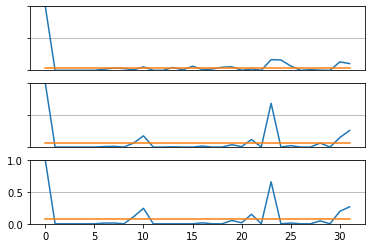

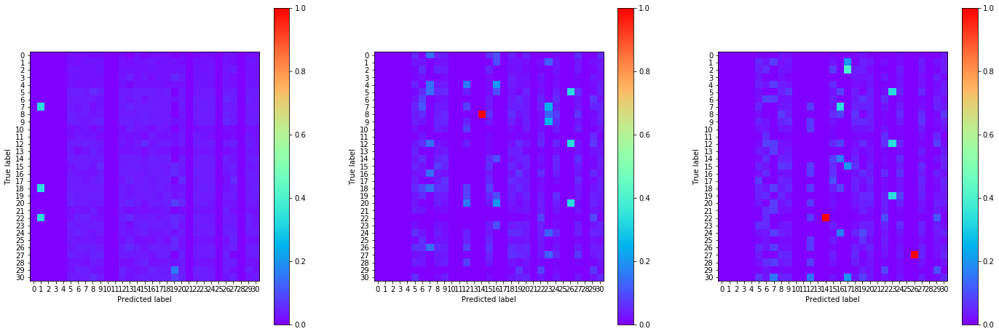

23:16:21.580175
#001 [Train: 3.263] [Test: 3.129] [Valid: 3.083]
#001 [Train: 0.080] [Test: 0.104] [Valid: 0.108]


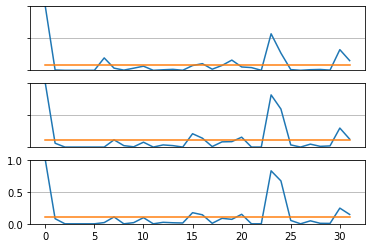

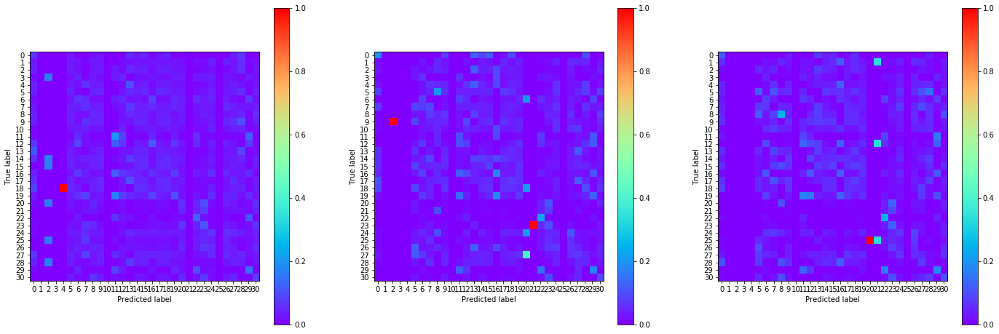

23:16:58.920224
#002 [Train: 3.002] [Test: 2.892] [Valid: 2.856]
#002 [Train: 0.120] [Test: 0.138] [Valid: 0.142]


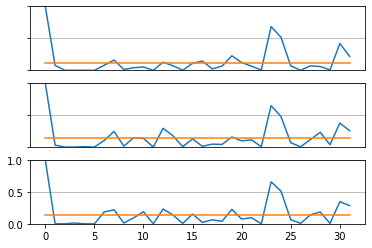

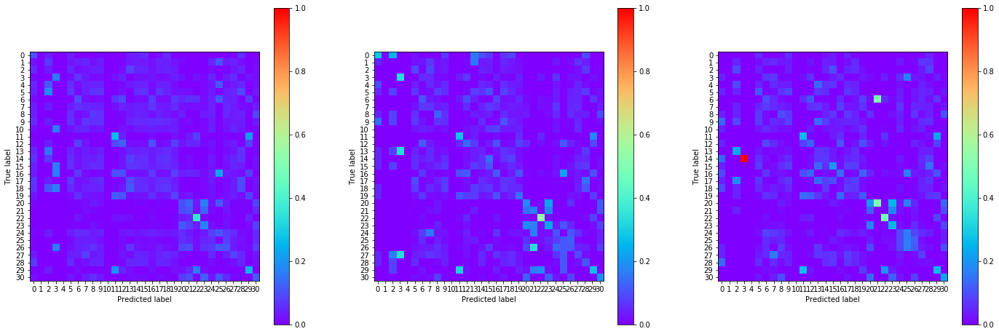

23:17:39.315460
#003 [Train: 2.806] [Test: 2.746] [Valid: 2.725]
#003 [Train: 0.156] [Test: 0.170] [Valid: 0.171]


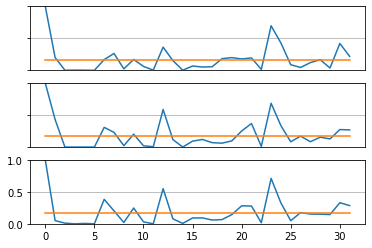

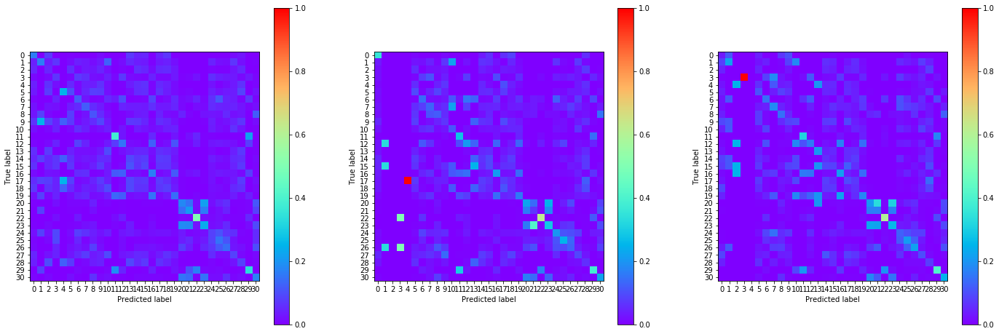

23:18:20.488081
#004 [Train: 2.648] [Test: 2.562] [Valid: 2.562]
#004 [Train: 0.200] [Test: 0.223] [Valid: 0.217]


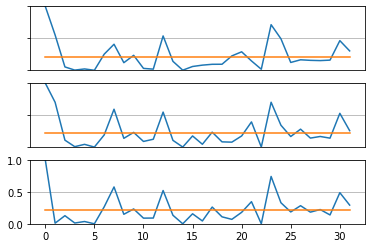

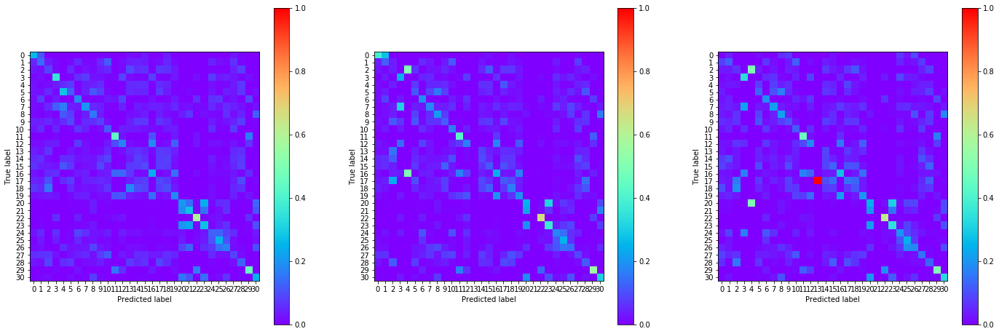

23:19:01.572127
#005 [Train: 2.459] [Test: 2.388] [Valid: 2.387]
#005 [Train: 0.249] [Test: 0.280] [Valid: 0.263]


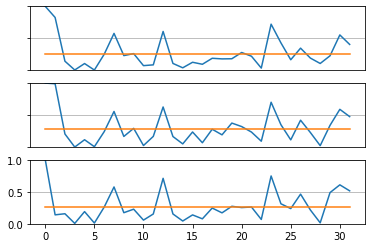

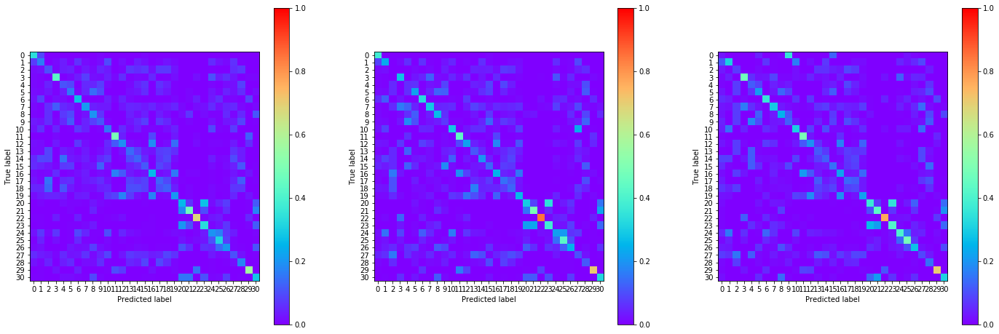

23:19:42.781999
#006 [Train: 2.283] [Test: 2.167] [Valid: 2.194]
#006 [Train: 0.301] [Test: 0.335] [Valid: 0.326]


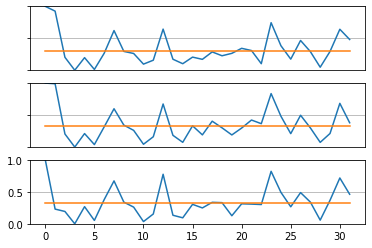

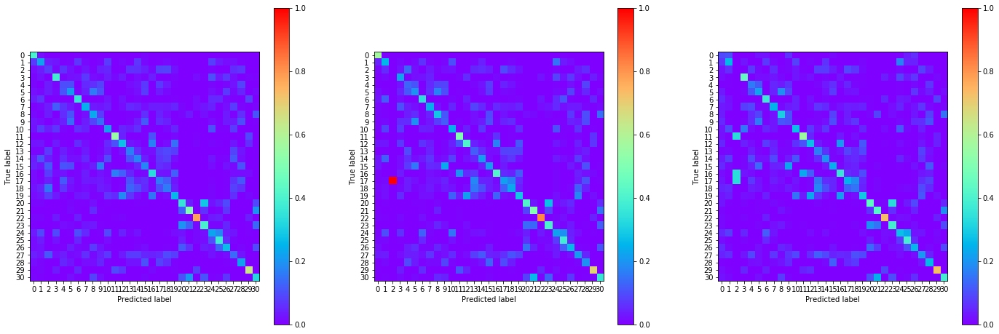

23:20:23.964078
#007 [Train: 2.084] [Test: 1.975] [Valid: 1.986]
#007 [Train: 0.363] [Test: 0.402] [Valid: 0.407]


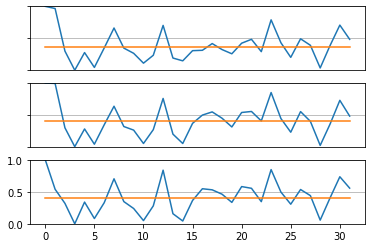

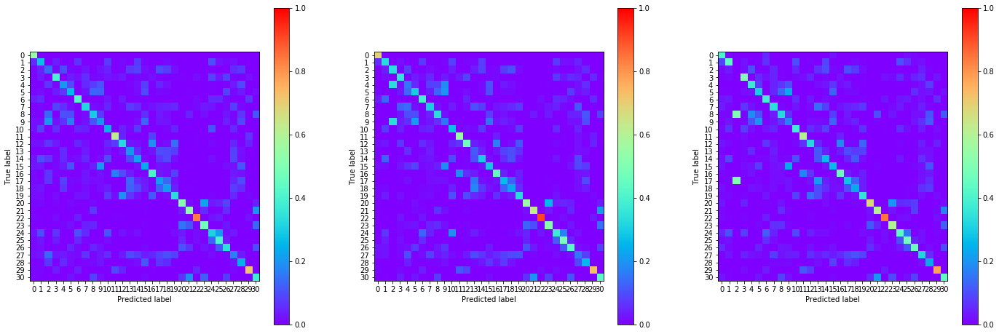

23:21:05.809150
#008 [Train: 1.900] [Test: 1.795] [Valid: 1.827]
#008 [Train: 0.423] [Test: 0.465] [Valid: 0.458]


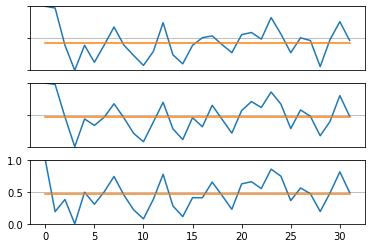

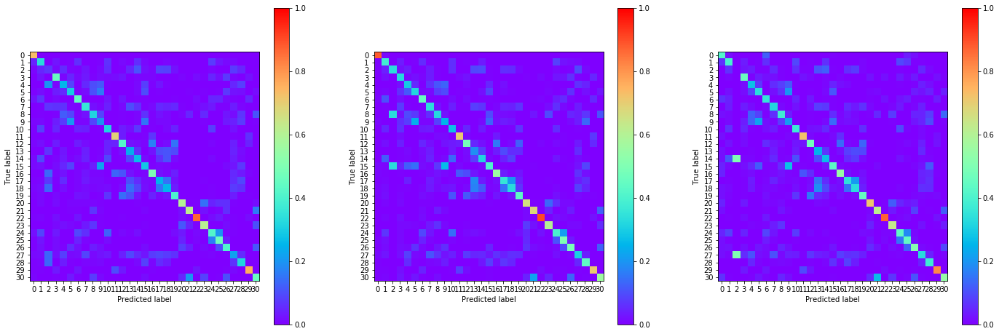

23:21:47.298553
#009 [Train: 1.707] [Test: 1.661] [Valid: 1.693]
#009 [Train: 0.487] [Test: 0.509] [Valid: 0.491]


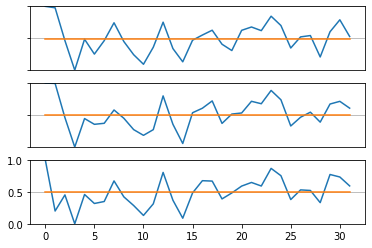

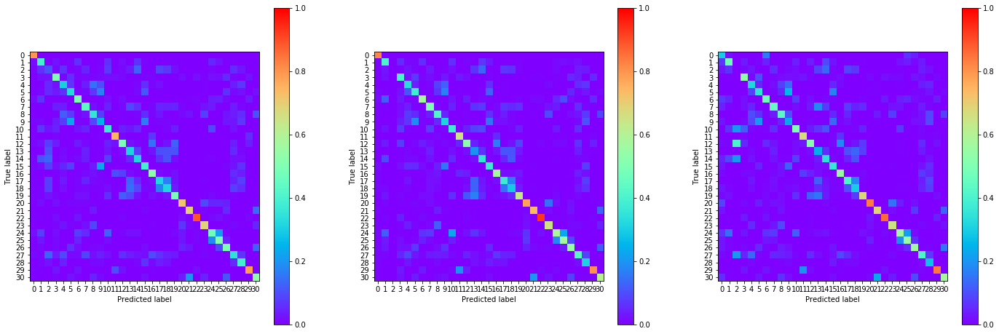

23:22:29.440605
#010 [Train: 1.553] [Test: 1.510] [Valid: 1.515]
#010 [Train: 0.533] [Test: 0.557] [Valid: 0.551]


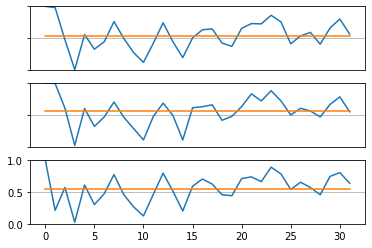

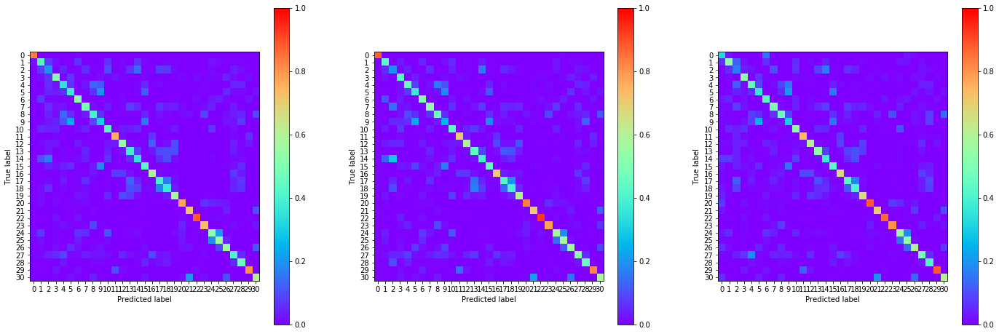

23:23:11.073566
#011 [Train: 1.423] [Test: 1.381] [Valid: 1.405]
#011 [Train: 0.571] [Test: 0.581] [Valid: 0.577]


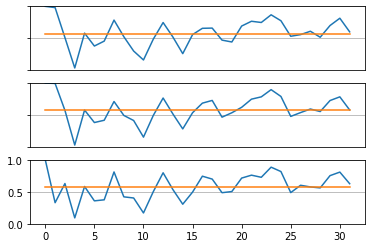

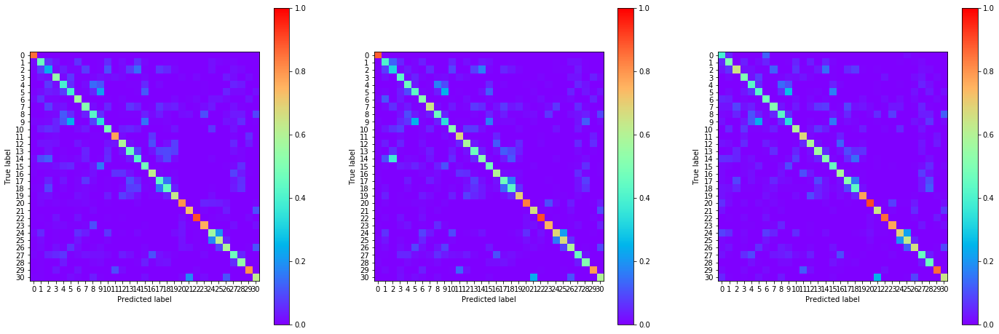

23:23:52.920951
#012 [Train: 1.301] [Test: 1.317] [Valid: 1.323]
#012 [Train: 0.610] [Test: 0.607] [Valid: 0.600]


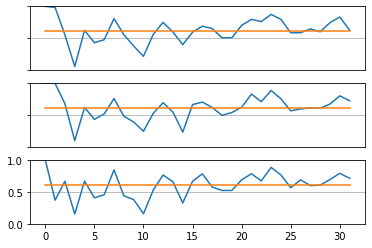

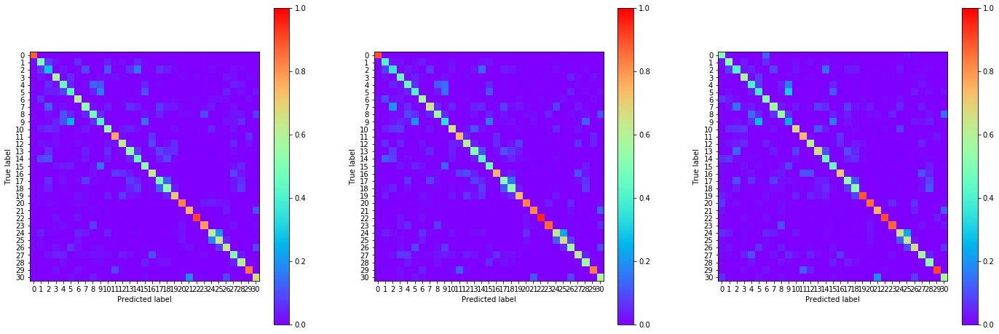

23:24:34.393592
#013 [Train: 1.223] [Test: 1.196] [Valid: 1.209]
#013 [Train: 0.634] [Test: 0.646] [Valid: 0.638]


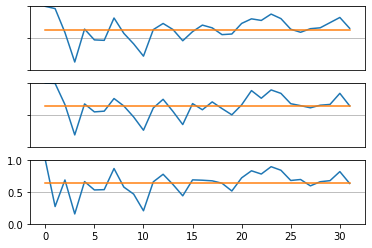

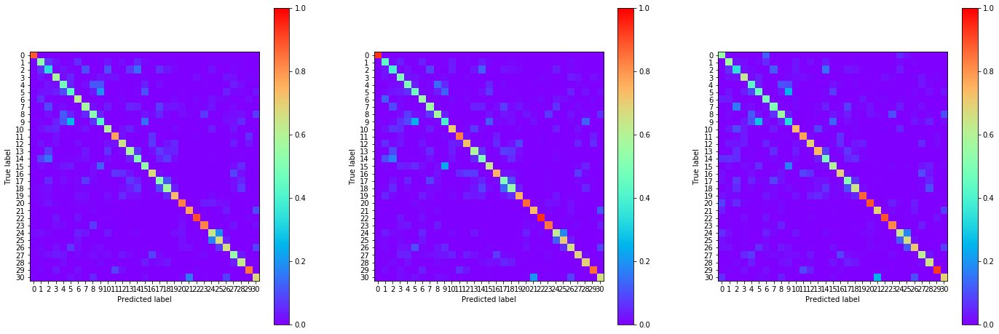

23:25:15.962226
#014 [Train: 1.126] [Test: 1.131] [Valid: 1.159]
#014 [Train: 0.663] [Test: 0.666] [Valid: 0.658]


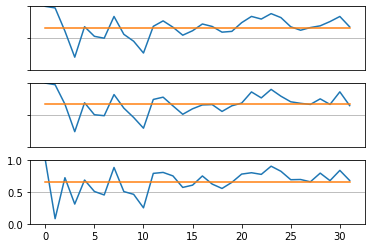

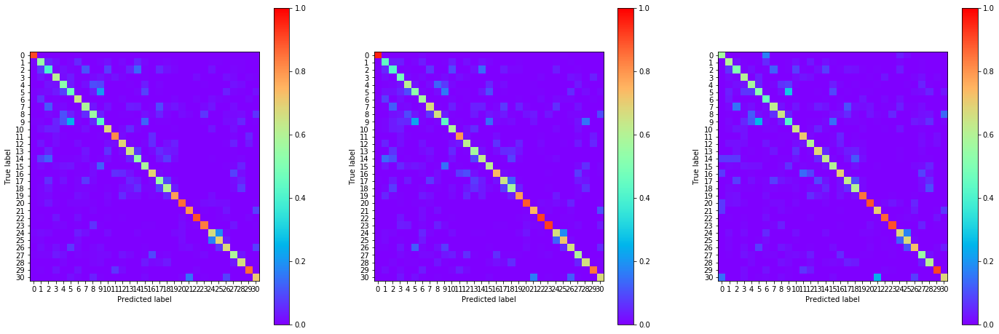

23:25:58.555121
#015 [Train: 1.046] [Test: 1.047] [Valid: 1.100]
#015 [Train: 0.688] [Test: 0.686] [Valid: 0.673]


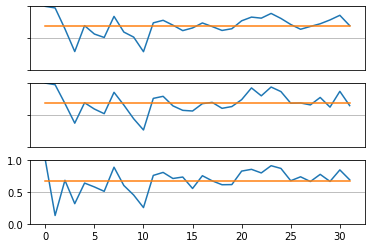

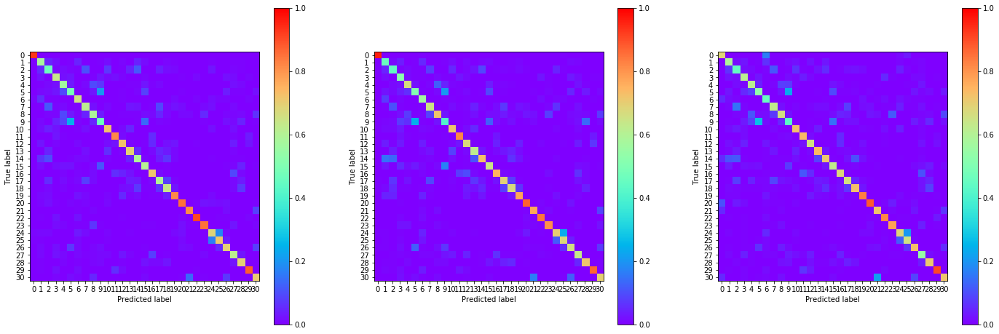

23:26:40.112568
#016 [Train: 0.983] [Test: 1.029] [Valid: 1.045]
#016 [Train: 0.706] [Test: 0.695] [Valid: 0.687]


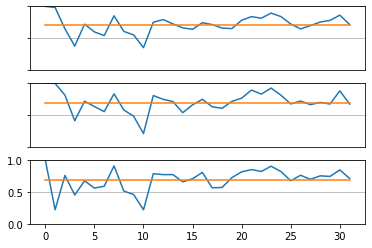

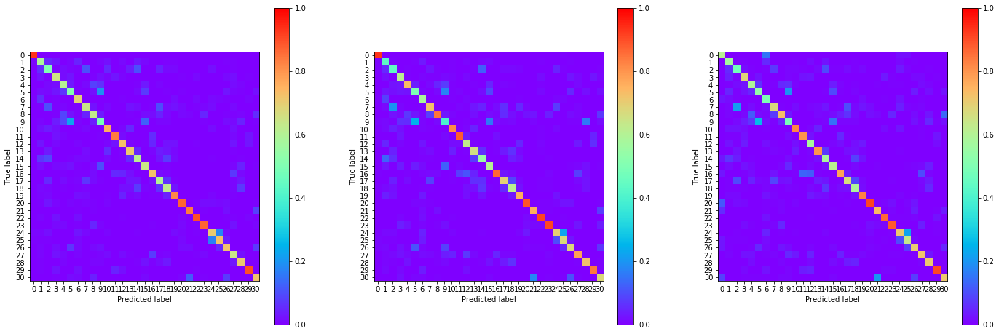

23:27:22.205959
#017 [Train: 0.922] [Test: 0.963] [Valid: 0.983]
#017 [Train: 0.724] [Test: 0.716] [Valid: 0.704]


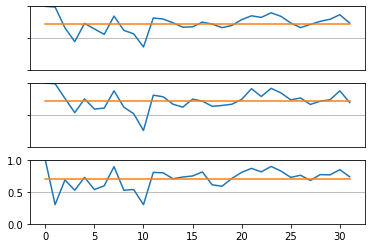

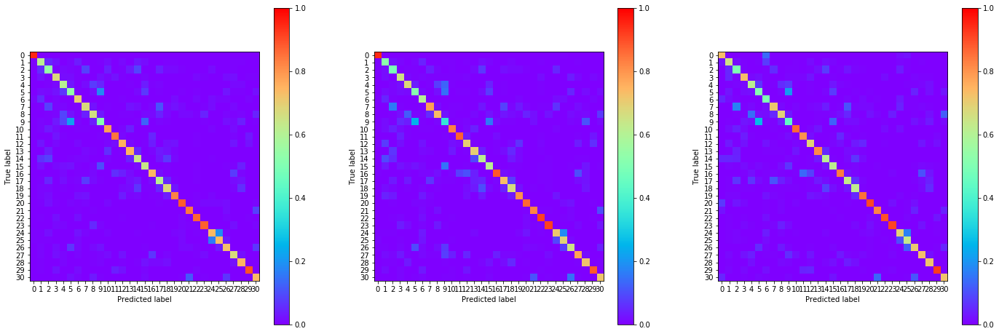

23:28:04.666837
#018 [Train: 0.869] [Test: 0.933] [Valid: 0.936]
#018 [Train: 0.740] [Test: 0.731] [Valid: 0.722]


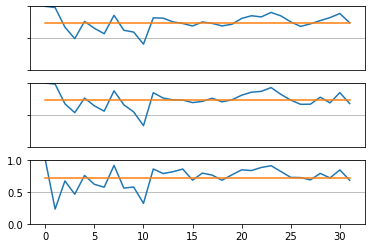

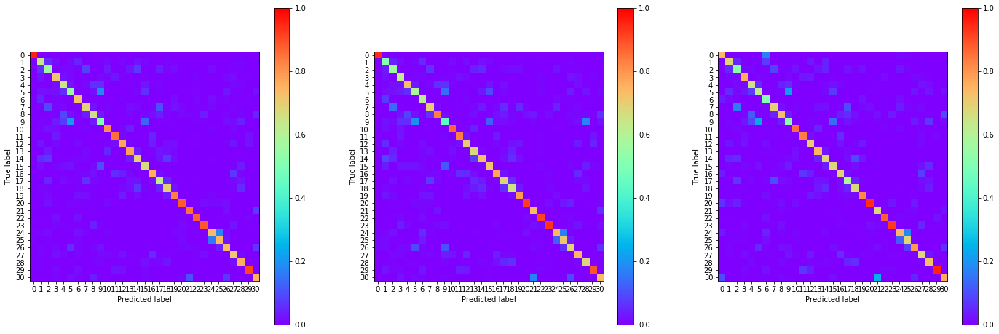

23:28:47.198459
#019 [Train: 0.821] [Test: 0.859] [Valid: 0.875]
#019 [Train: 0.754] [Test: 0.744] [Valid: 0.740]


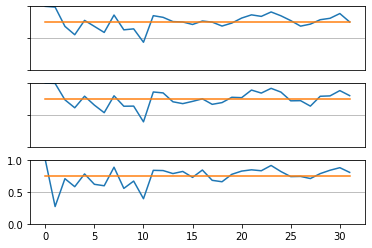

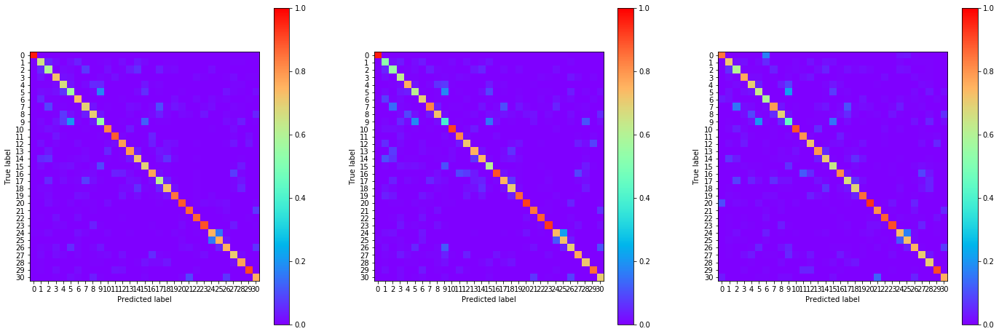

23:29:29.508256
#020 [Train: 0.778] [Test: 0.820] [Valid: 0.843]
#020 [Train: 0.768] [Test: 0.758] [Valid: 0.752]


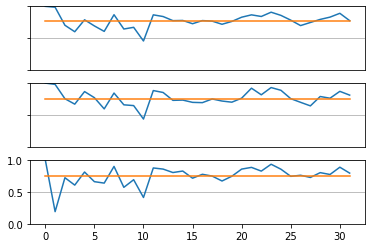

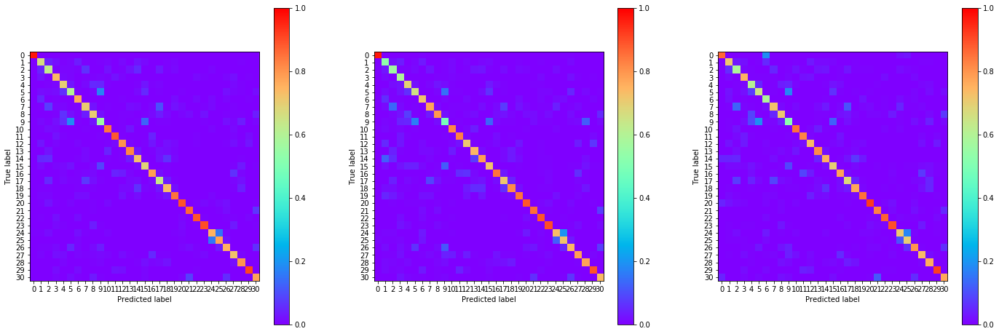

23:30:11.994904
#021 [Train: 0.746] [Test: 0.782] [Valid: 0.823]
#021 [Train: 0.779] [Test: 0.761] [Valid: 0.752]


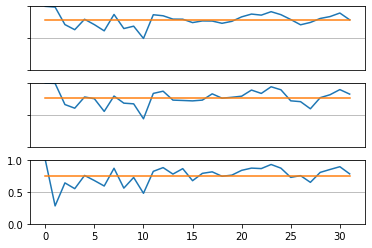

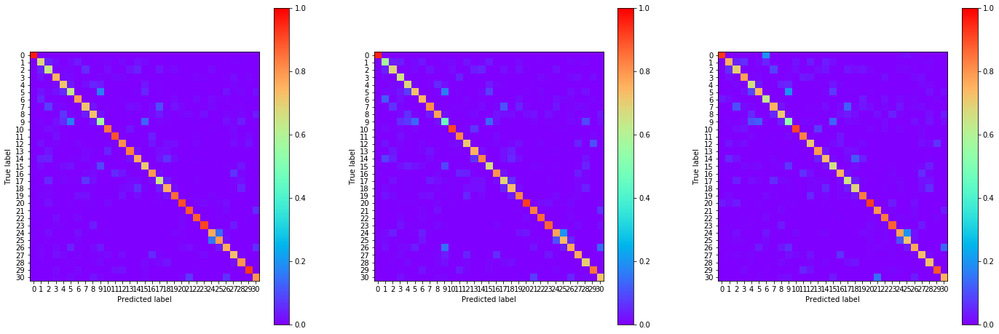

23:30:54.609124
#022 [Train: 0.716] [Test: 0.773] [Valid: 0.800]
#022 [Train: 0.787] [Test: 0.773] [Valid: 0.762]


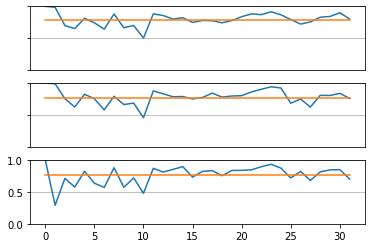

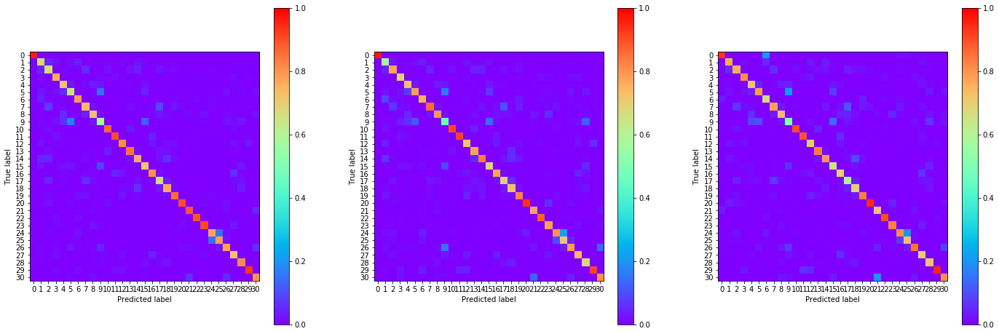

23:31:36.935615
#023 [Train: 0.685] [Test: 0.721] [Valid: 0.740]
#023 [Train: 0.797] [Test: 0.784] [Valid: 0.784]


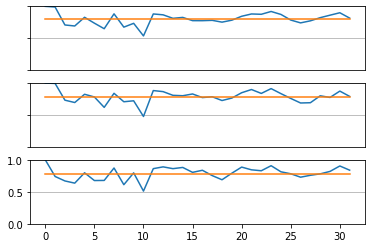

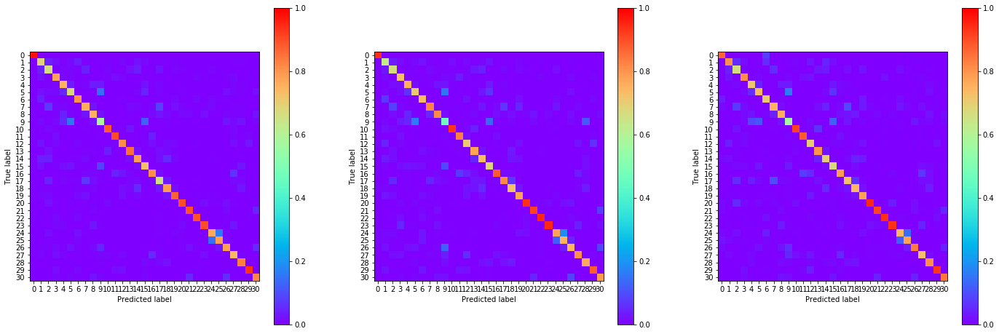

23:32:19.485213
#024 [Train: 0.642] [Test: 0.702] [Valid: 0.739]
#024 [Train: 0.810] [Test: 0.788] [Valid: 0.780]


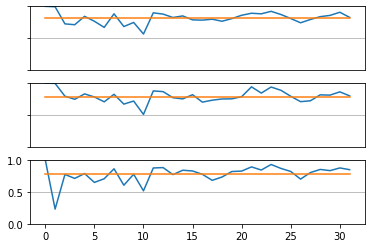

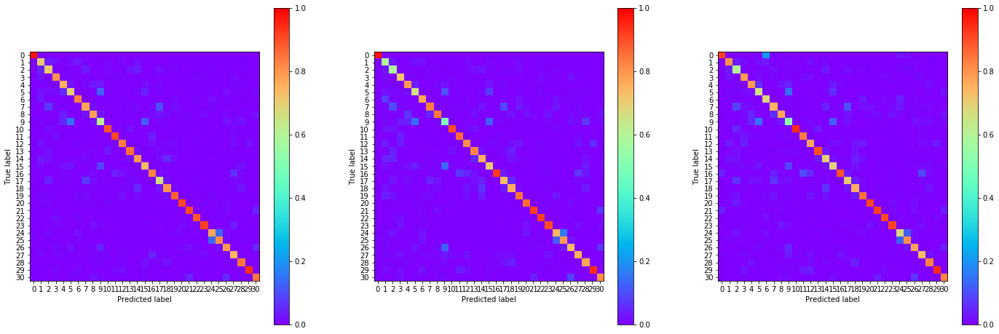

23:33:02.264388
#025 [Train: 0.628] [Test: 0.676] [Valid: 0.683]
#025 [Train: 0.814] [Test: 0.799] [Valid: 0.798]


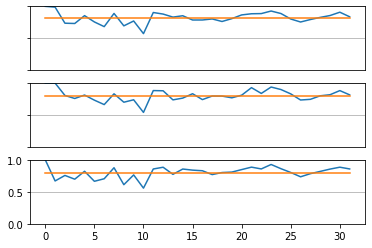

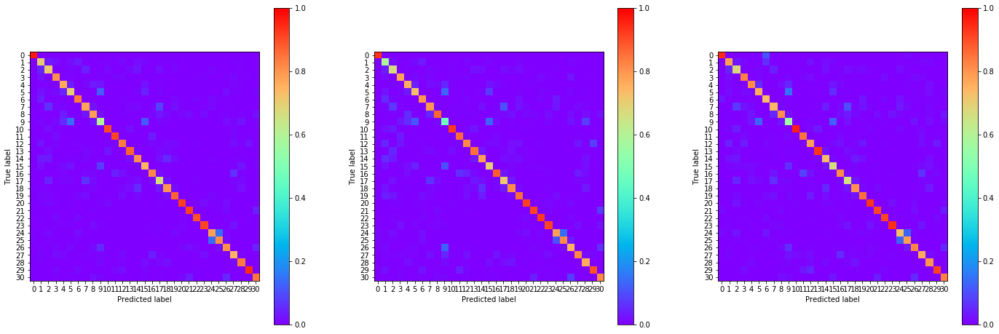

23:33:44.930922
#026 [Train: 0.602] [Test: 0.684] [Valid: 0.686]
#026 [Train: 0.822] [Test: 0.797] [Valid: 0.802]


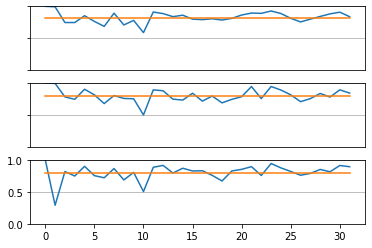

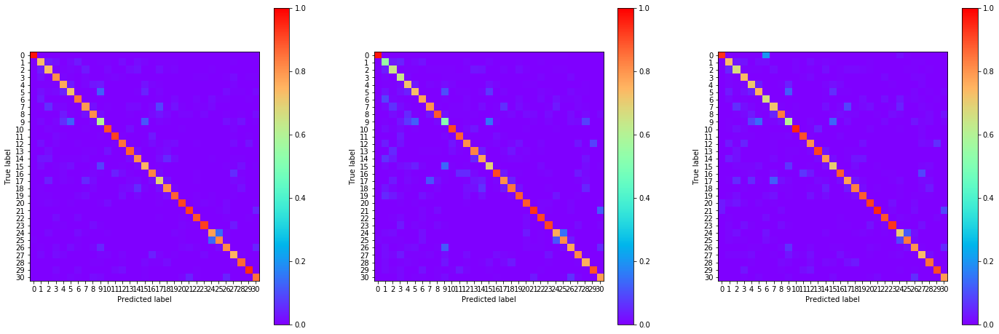

23:34:27.701125
#027 [Train: 0.579] [Test: 0.660] [Valid: 0.669]
#027 [Train: 0.827] [Test: 0.808] [Valid: 0.801]


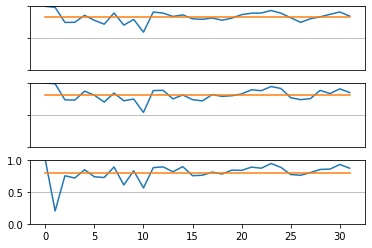

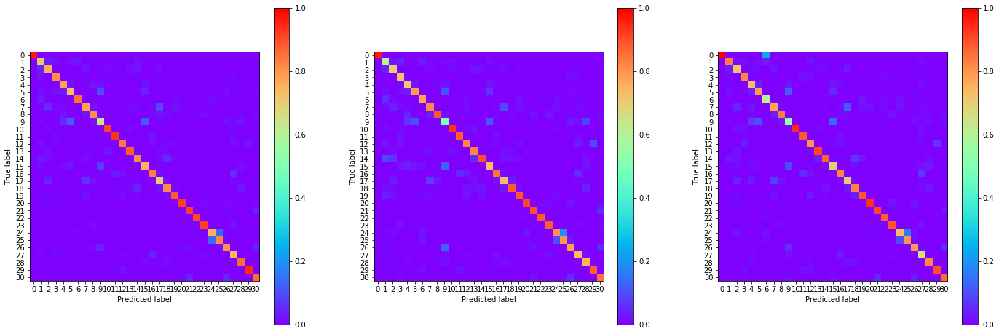

23:35:10.076978
#028 [Train: 0.558] [Test: 0.661] [Valid: 0.671]
#028 [Train: 0.834] [Test: 0.808] [Valid: 0.799]


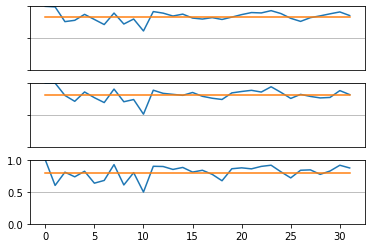

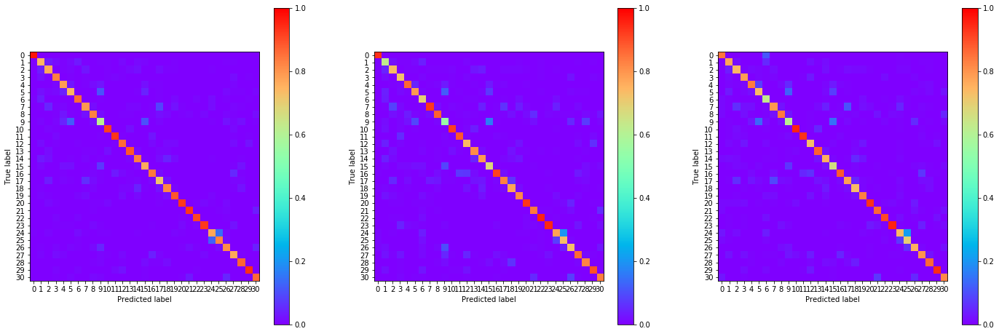

23:35:52.729557
#029 [Train: 0.528] [Test: 0.573] [Valid: 0.611]
#029 [Train: 0.842] [Test: 0.821] [Valid: 0.815]


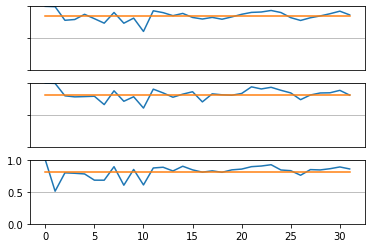

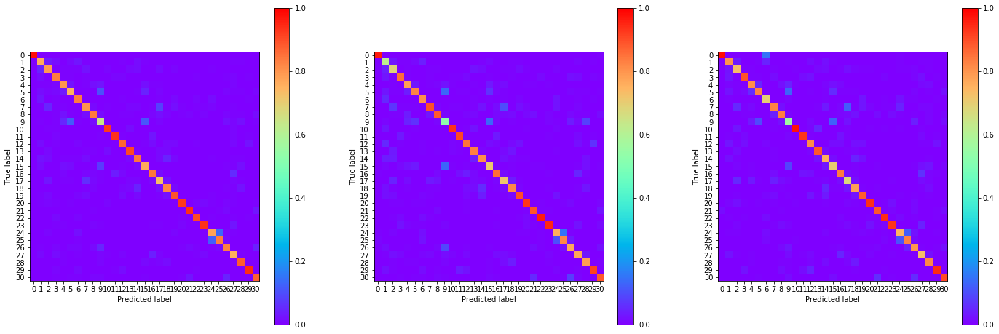

23:36:35.349934
#030 [Train: 0.511] [Test: 0.589] [Valid: 0.598]
#030 [Train: 0.847] [Test: 0.828] [Valid: 0.819]


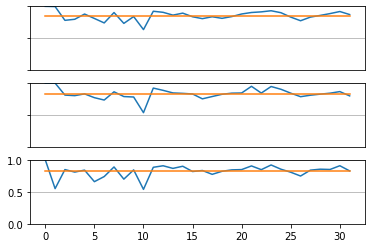

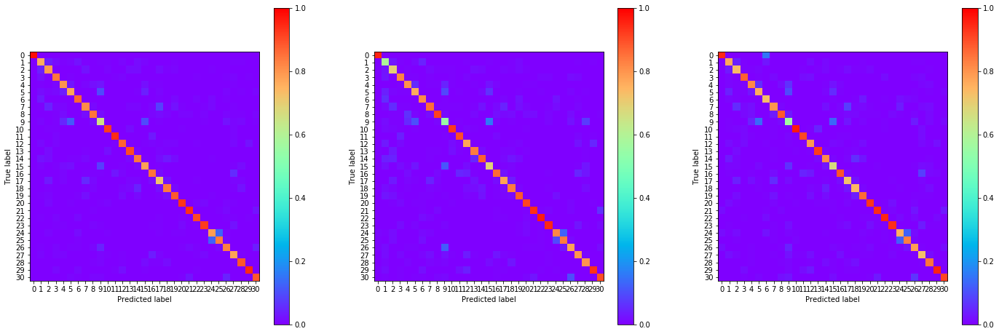

23:37:18.061771
#031 [Train: 0.501] [Test: 0.559] [Valid: 0.581]
#031 [Train: 0.850] [Test: 0.827] [Valid: 0.827]


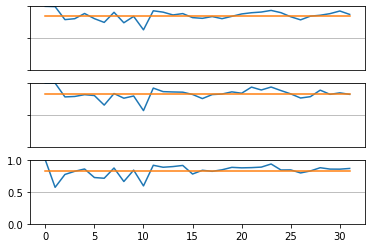

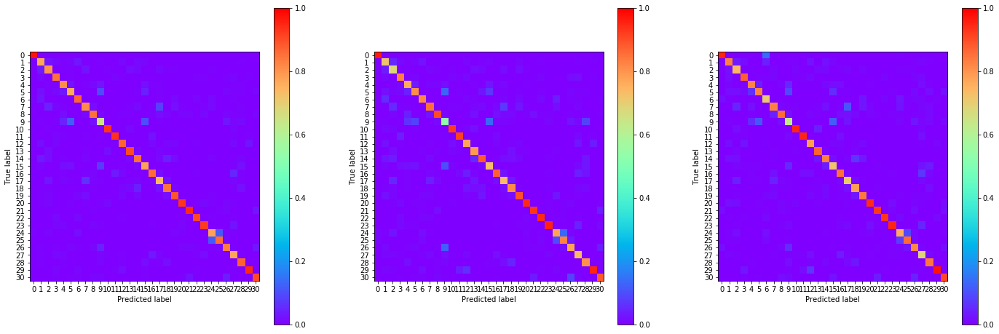

23:38:00.673716
#032 [Train: 0.481] [Test: 0.549] [Valid: 0.569]
#032 [Train: 0.855] [Test: 0.837] [Valid: 0.829]


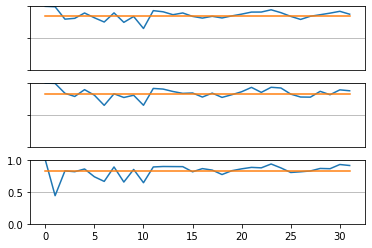

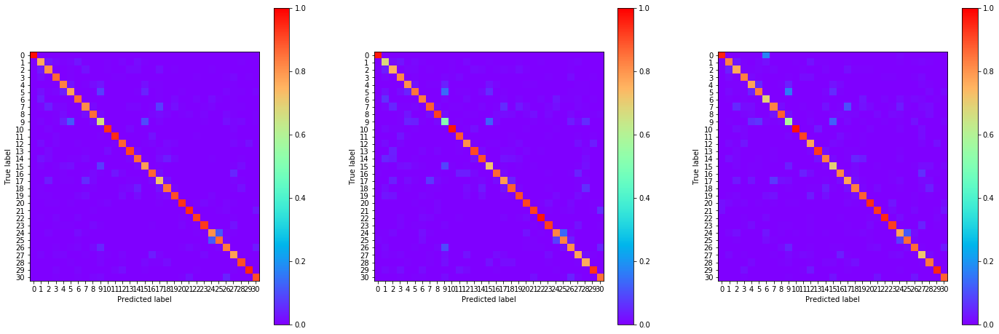

23:38:43.658866
#033 [Train: 0.468] [Test: 0.509] [Valid: 0.559]
#033 [Train: 0.861] [Test: 0.845] [Valid: 0.836]


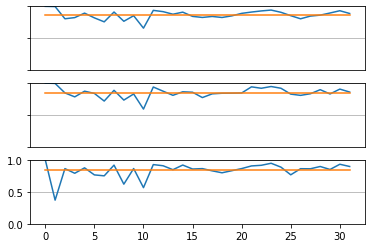

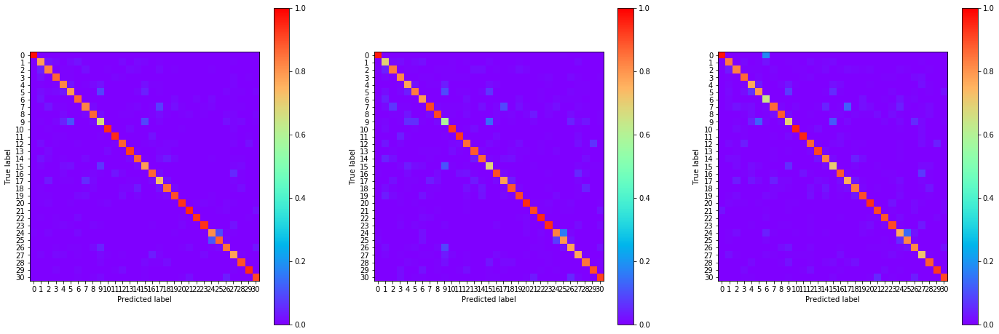

23:39:26.502593
#034 [Train: 0.449] [Test: 0.512] [Valid: 0.566]
#034 [Train: 0.865] [Test: 0.843] [Valid: 0.833]


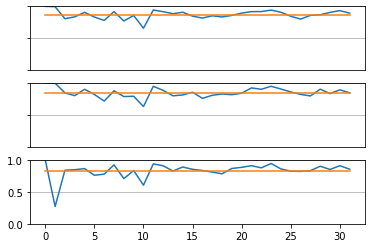

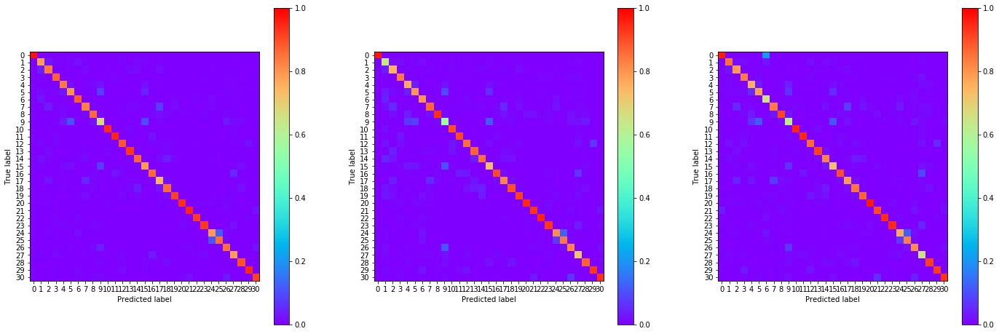

23:40:09.504867
#035 [Train: 0.436] [Test: 0.529] [Valid: 0.562]
#035 [Train: 0.870] [Test: 0.843] [Valid: 0.832]


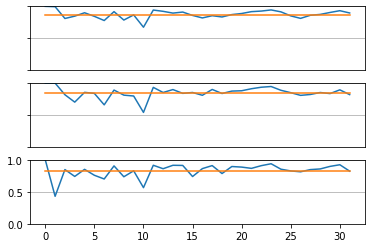

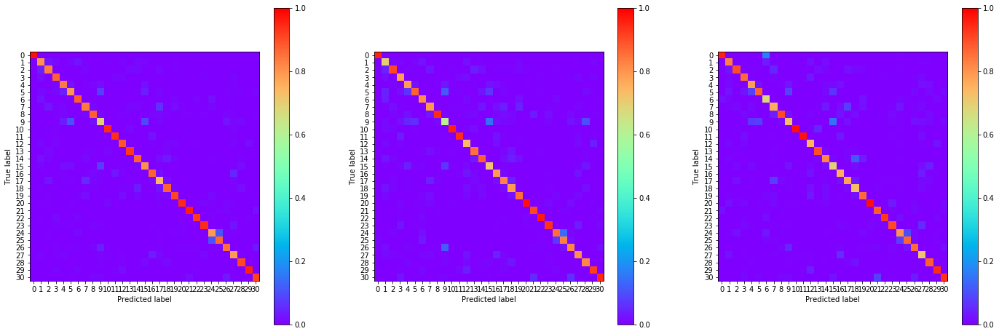

23:40:52.247928
#036 [Train: 0.437] [Test: 0.527] [Valid: 0.527]
#036 [Train: 0.869] [Test: 0.844] [Valid: 0.846]


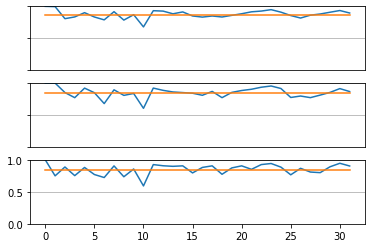

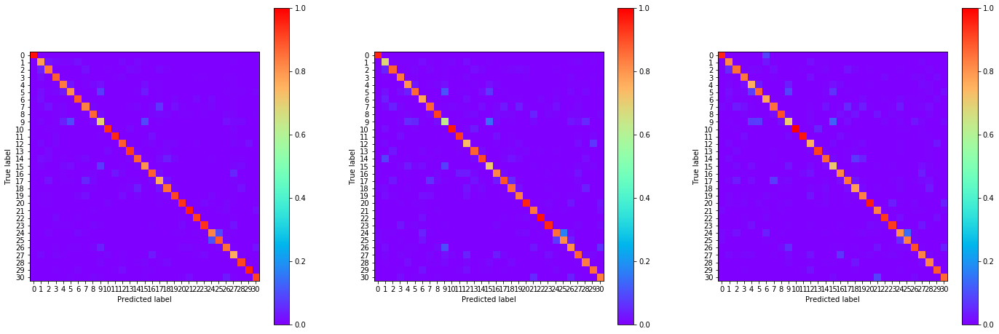

23:41:34.837517
#037 [Train: 0.414] [Test: 0.480] [Valid: 0.525]
#037 [Train: 0.876] [Test: 0.853] [Valid: 0.848]


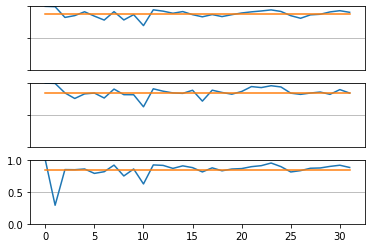

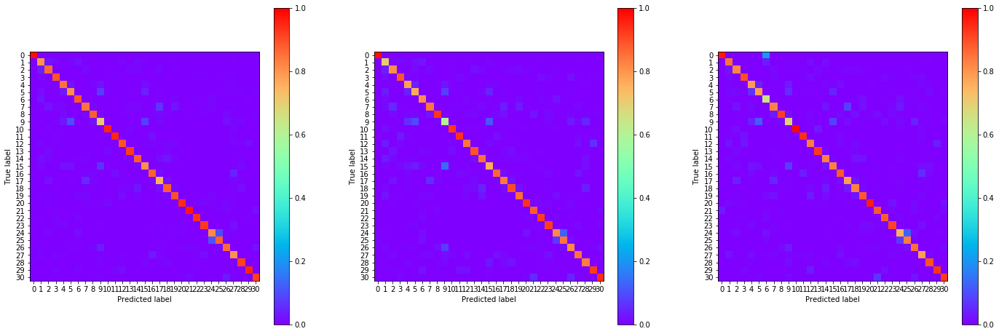

23:42:17.319195
#038 [Train: 0.407] [Test: 0.476] [Valid: 0.541]
#038 [Train: 0.878] [Test: 0.857] [Valid: 0.846]


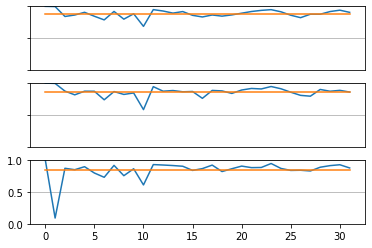

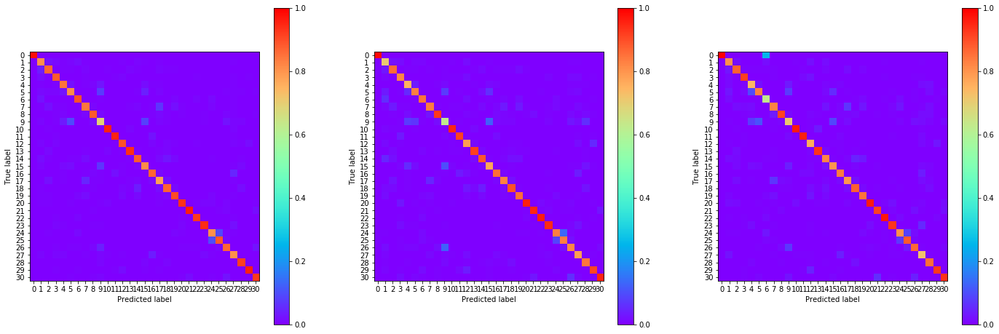

23:42:59.771565
#039 [Train: 0.391] [Test: 0.485] [Valid: 0.506]
#039 [Train: 0.883] [Test: 0.856] [Valid: 0.851]


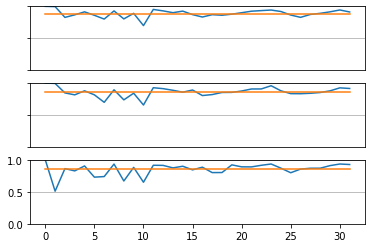

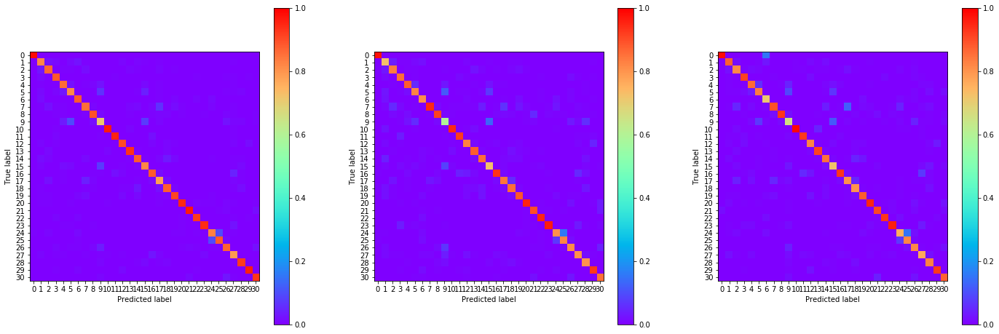

23:43:42.418796
#040 [Train: 0.383] [Test: 0.461] [Valid: 0.490]
#040 [Train: 0.886] [Test: 0.862] [Valid: 0.854]


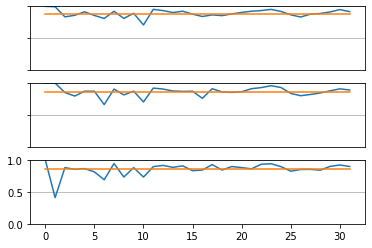

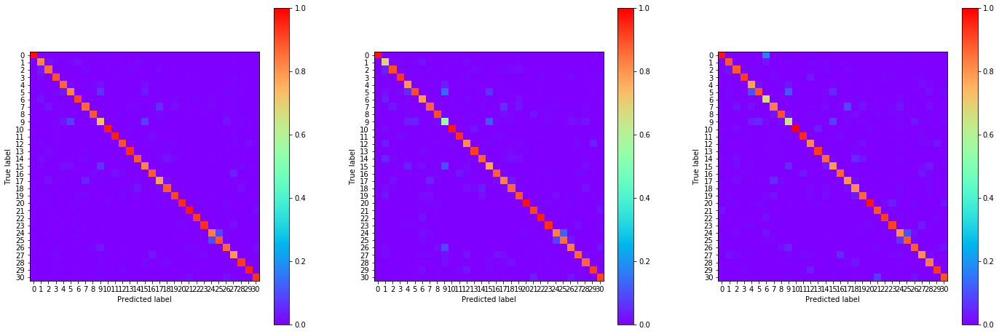

23:44:24.851011
#041 [Train: 0.377] [Test: 0.478] [Valid: 0.499]
#041 [Train: 0.886] [Test: 0.864] [Valid: 0.858]


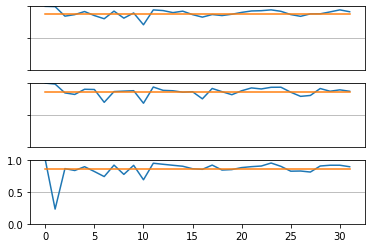

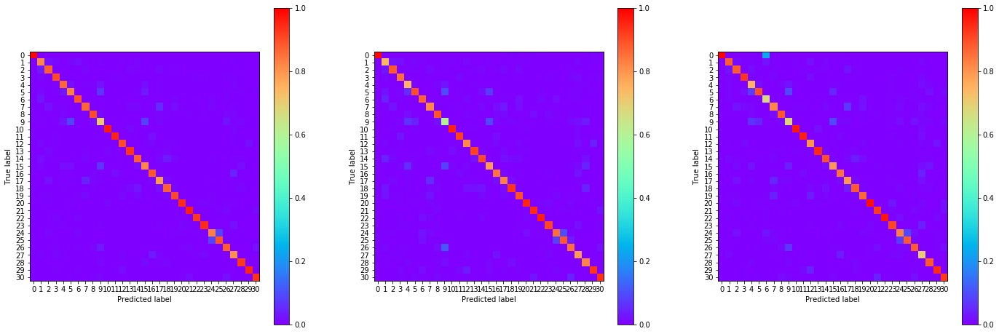

23:45:07.167171
#042 [Train: 0.364] [Test: 0.448] [Valid: 0.471]
#042 [Train: 0.892] [Test: 0.866] [Valid: 0.859]


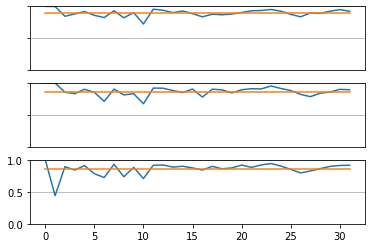

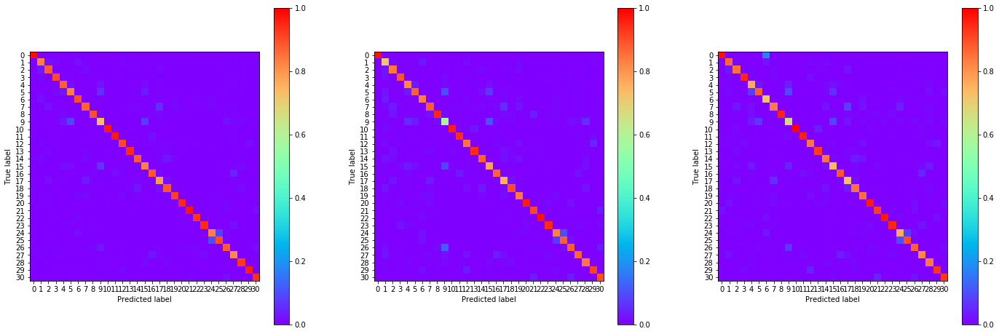

23:45:49.835799
#043 [Train: 0.355] [Test: 0.429] [Valid: 0.441]
#043 [Train: 0.894] [Test: 0.870] [Valid: 0.872]


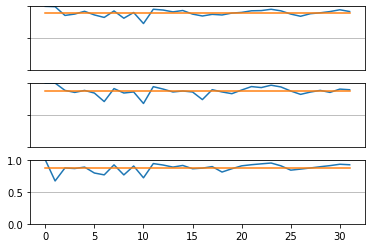

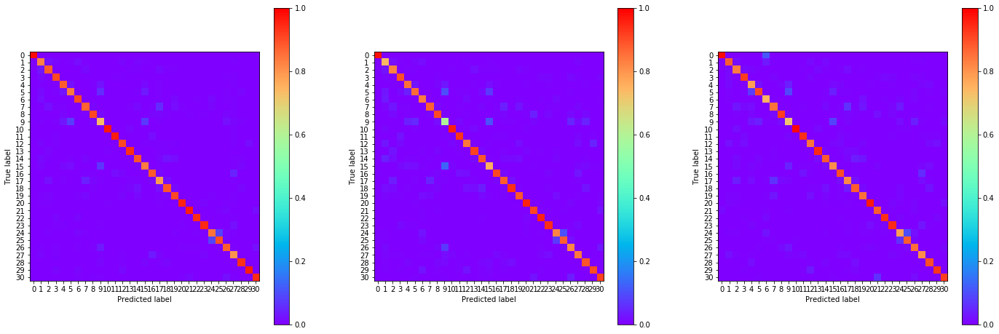

23:46:32.413782
#044 [Train: 0.346] [Test: 0.443] [Valid: 0.446]
#044 [Train: 0.896] [Test: 0.868] [Valid: 0.869]


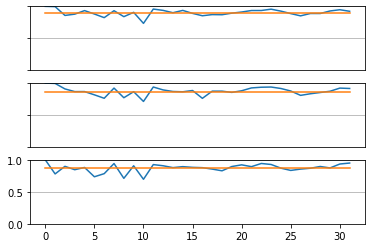

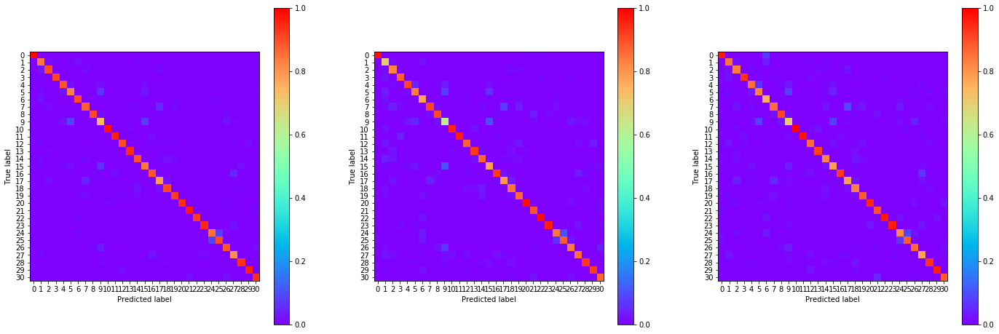

23:47:15.142927
#045 [Train: 0.333] [Test: 0.444] [Valid: 0.457]
#045 [Train: 0.901] [Test: 0.866] [Valid: 0.868]


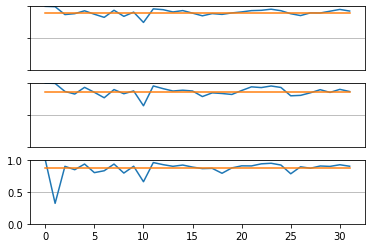

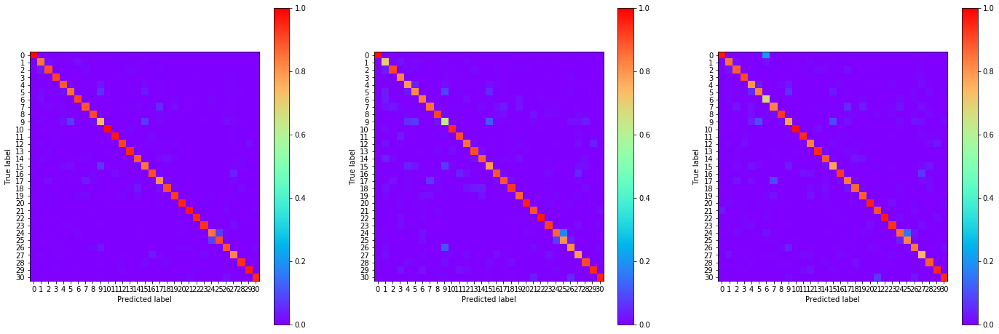

23:47:57.875494
#046 [Train: 0.334] [Test: 0.436] [Valid: 0.464]
#046 [Train: 0.901] [Test: 0.875] [Valid: 0.863]


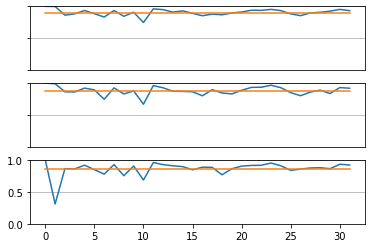

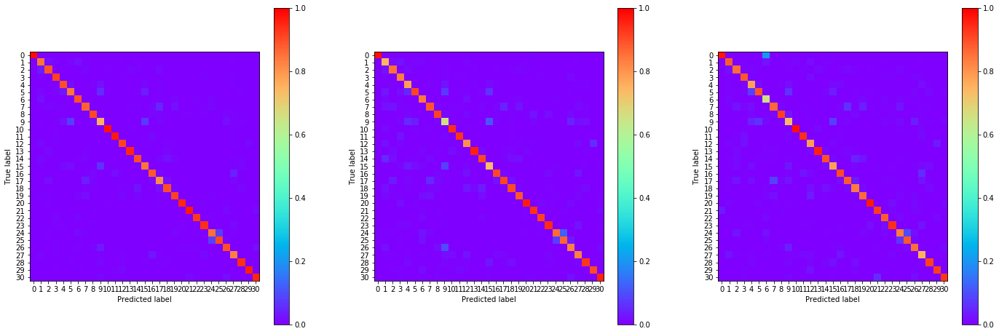

23:48:40.911163
#047 [Train: 0.326] [Test: 0.429] [Valid: 0.441]
#047 [Train: 0.903] [Test: 0.872] [Valid: 0.868]


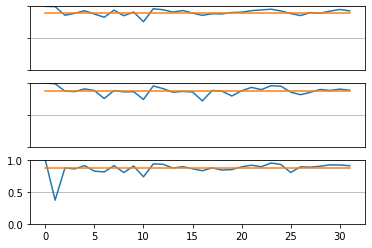

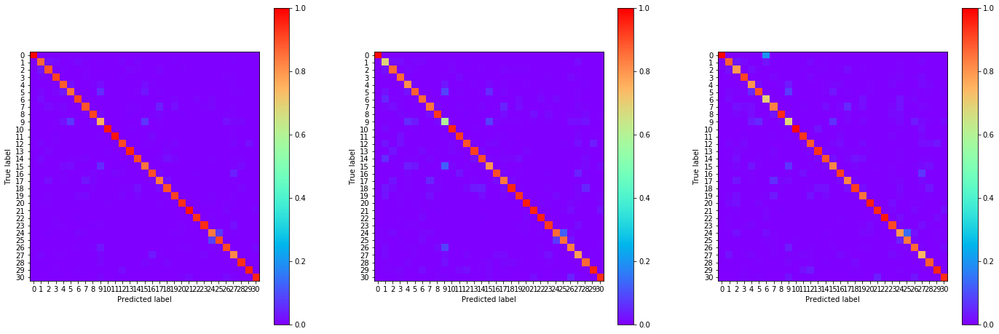

23:49:23.550137
#048 [Train: 0.316] [Test: 0.408] [Valid: 0.424]
#048 [Train: 0.906] [Test: 0.883] [Valid: 0.875]


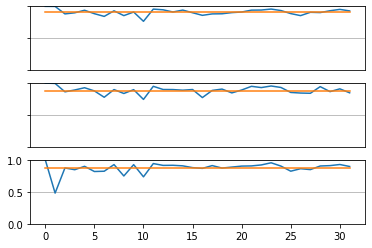

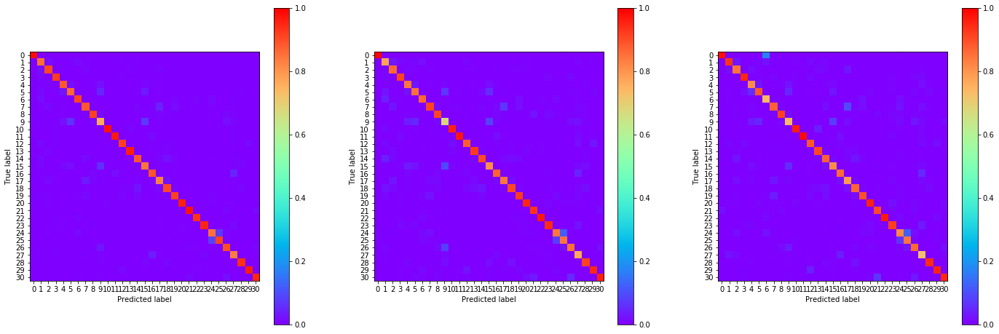

23:50:05.914464
#049 [Train: 0.308] [Test: 0.407] [Valid: 0.487]
#049 [Train: 0.908] [Test: 0.875] [Valid: 0.869]


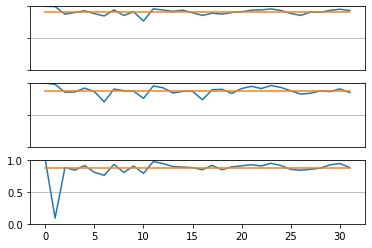

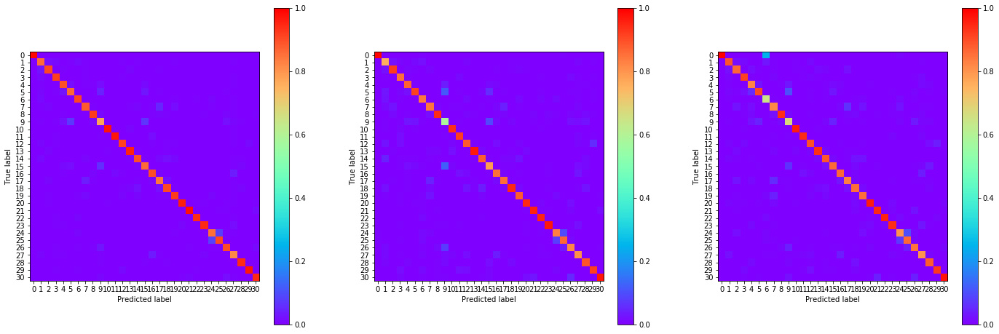

23:50:48.866136
#050 [Train: 0.302] [Test: 0.401] [Valid: 0.420]
#050 [Train: 0.910] [Test: 0.878] [Valid: 0.881]


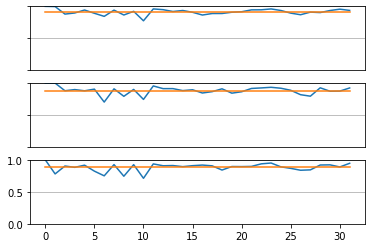

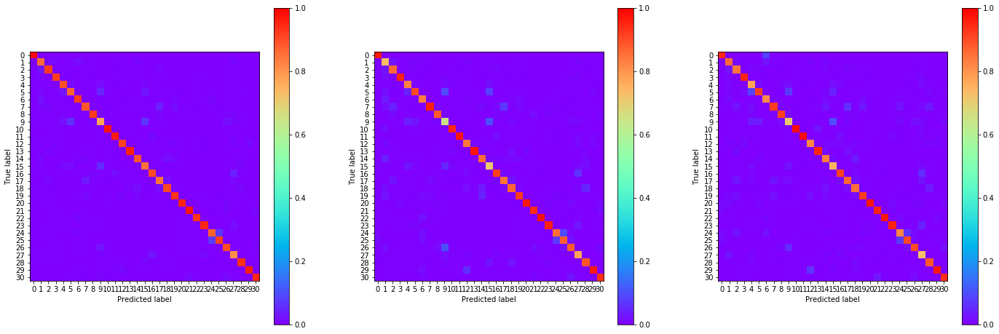

23:51:31.369259
#051 [Train: 0.302] [Test: 0.395] [Valid: 0.420]
#051 [Train: 0.910] [Test: 0.883] [Valid: 0.879]


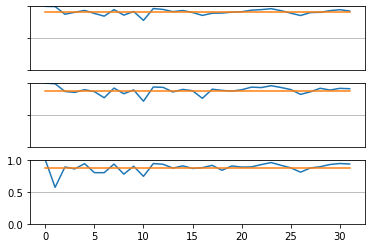

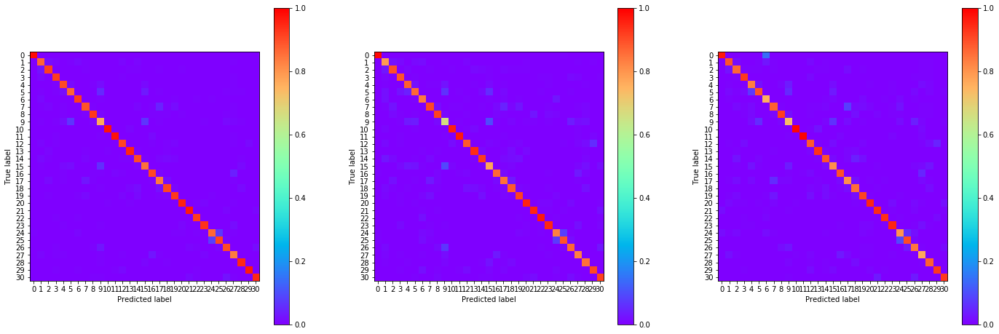

23:52:14.204247
#052 [Train: 0.294] [Test: 0.402] [Valid: 0.417]
#052 [Train: 0.911] [Test: 0.878] [Valid: 0.880]


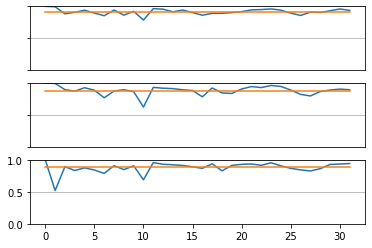

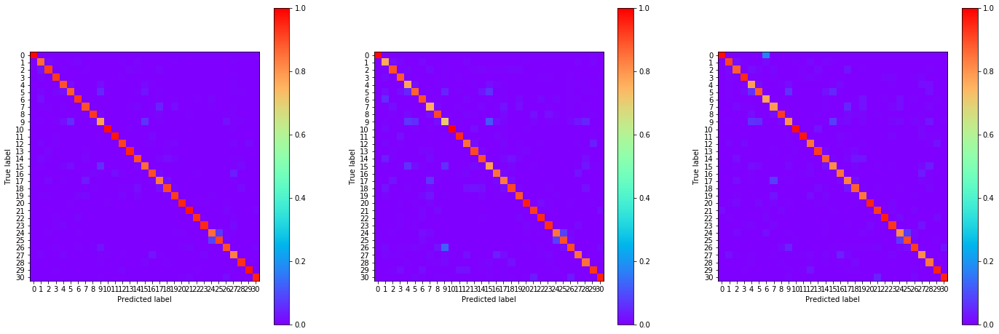

23:52:56.640153
#053 [Train: 0.282] [Test: 0.391] [Valid: 0.402]
#053 [Train: 0.916] [Test: 0.885] [Valid: 0.882]


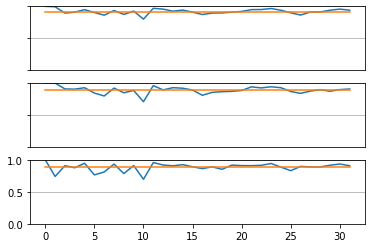

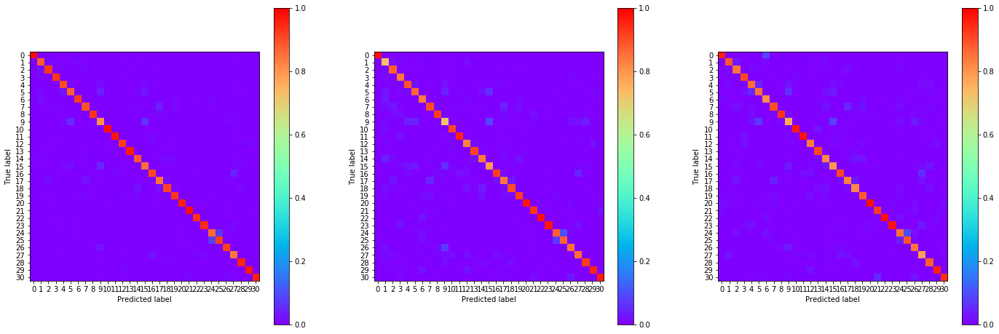

23:53:39.489384
#054 [Train: 0.278] [Test: 0.401] [Valid: 0.395]
#054 [Train: 0.917] [Test: 0.882] [Valid: 0.882]


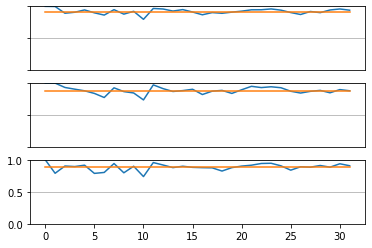

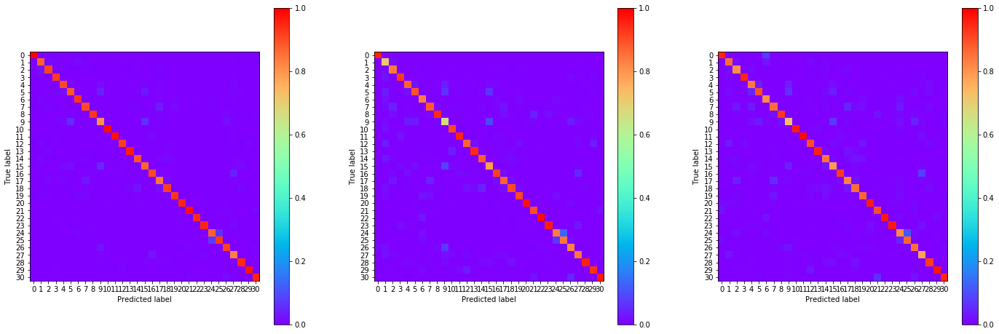

23:54:22.096602
#055 [Train: 0.267] [Test: 0.397] [Valid: 0.407]
#055 [Train: 0.919] [Test: 0.879] [Valid: 0.880]


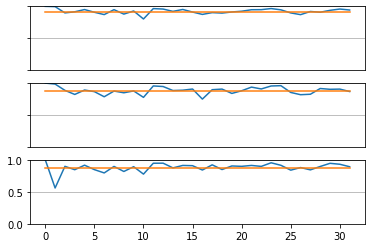

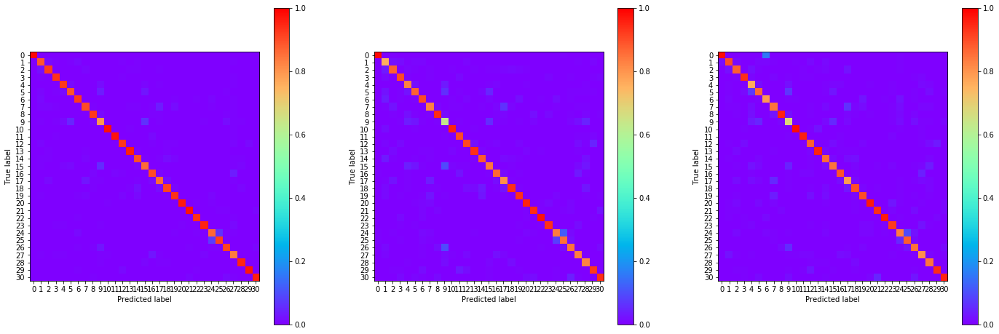

23:55:04.746814
#056 [Train: 0.268] [Test: 0.378] [Valid: 0.423]
#056 [Train: 0.919] [Test: 0.892] [Valid: 0.879]


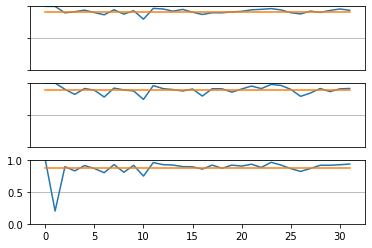

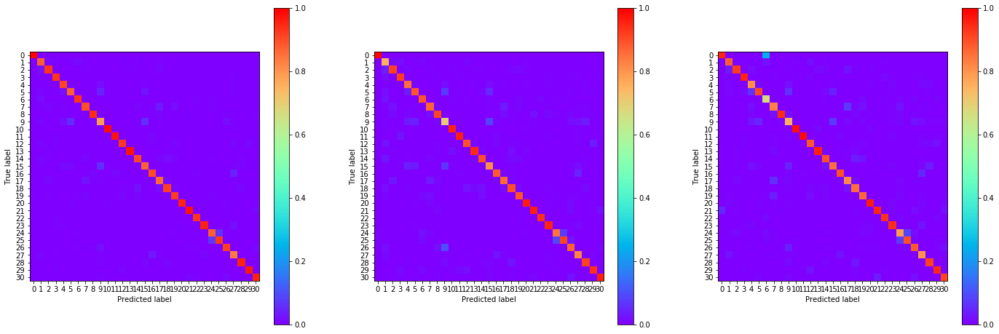

23:55:47.560714
#057 [Train: 0.265] [Test: 0.387] [Valid: 0.415]
#057 [Train: 0.921] [Test: 0.884] [Valid: 0.883]


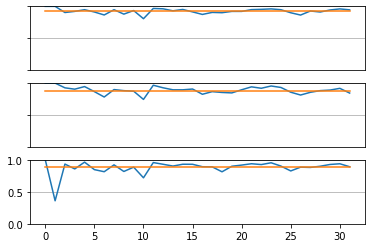

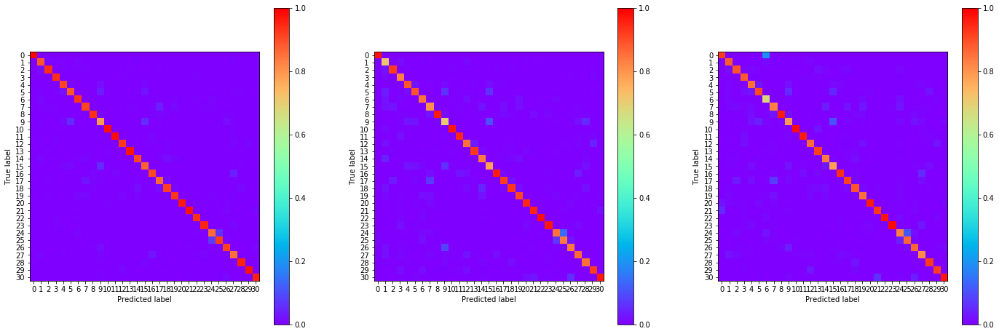

23:56:30.281013
#058 [Train: 0.260] [Test: 0.382] [Valid: 0.408]
#058 [Train: 0.921] [Test: 0.885] [Valid: 0.880]


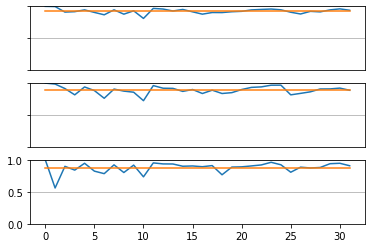

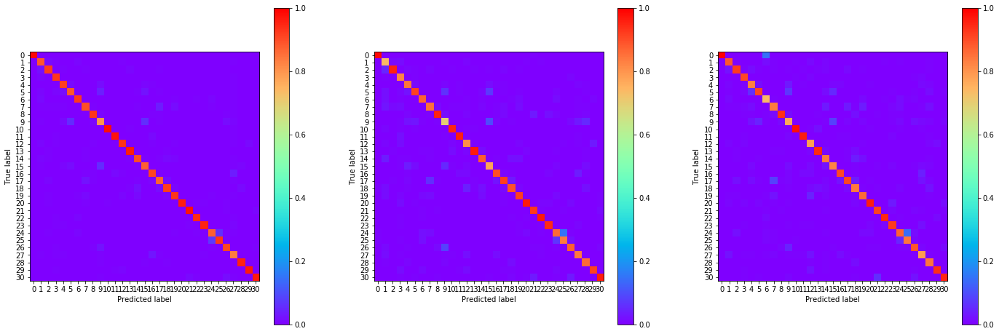

23:57:12.924207
#059 [Train: 0.255] [Test: 0.370] [Valid: 0.378]
#059 [Train: 0.923] [Test: 0.889] [Valid: 0.890]


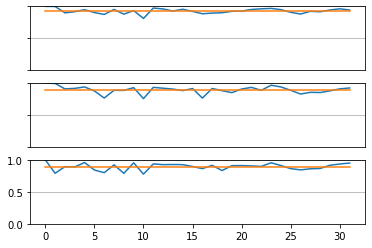

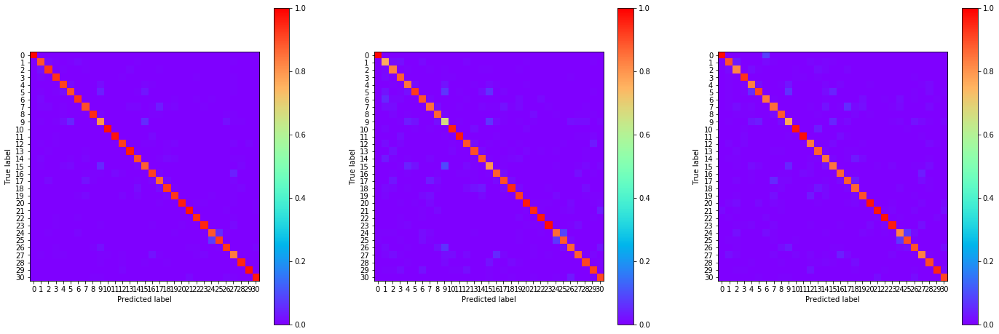

23:57:55.615846
#060 [Train: 0.248] [Test: 0.388] [Valid: 0.428]
#060 [Train: 0.925] [Test: 0.882] [Valid: 0.879]


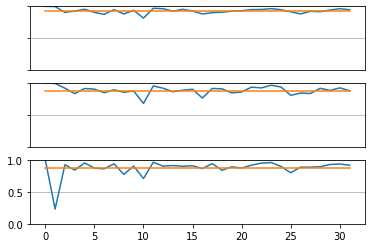

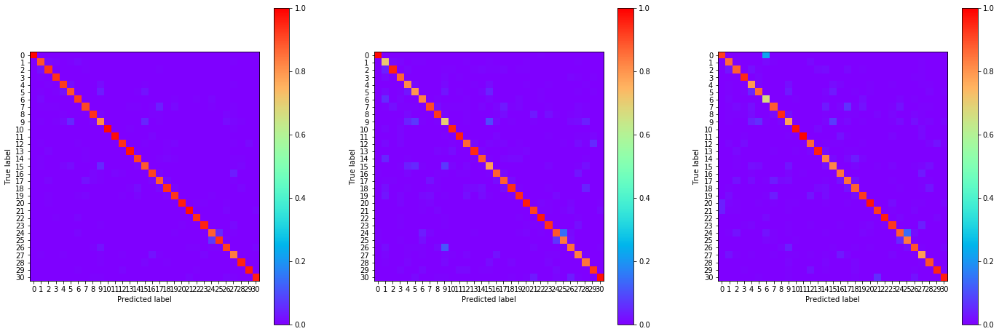

23:58:38.231813
#061 [Train: 0.243] [Test: 0.381] [Valid: 0.394]
#061 [Train: 0.926] [Test: 0.889] [Valid: 0.885]


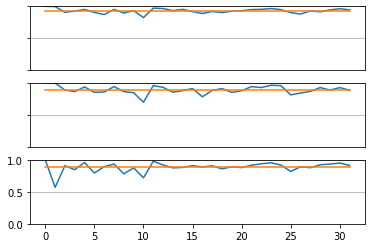

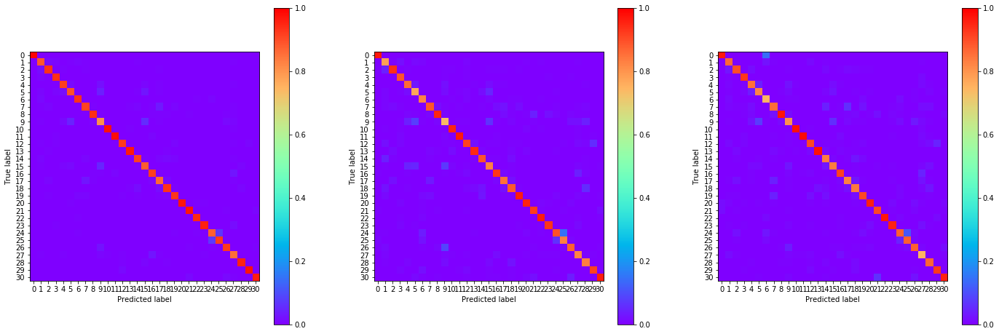

23:59:20.706133
#062 [Train: 0.240] [Test: 0.379] [Valid: 0.396]
#062 [Train: 0.928] [Test: 0.892] [Valid: 0.886]


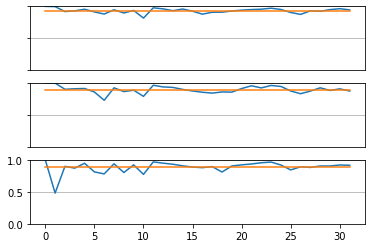

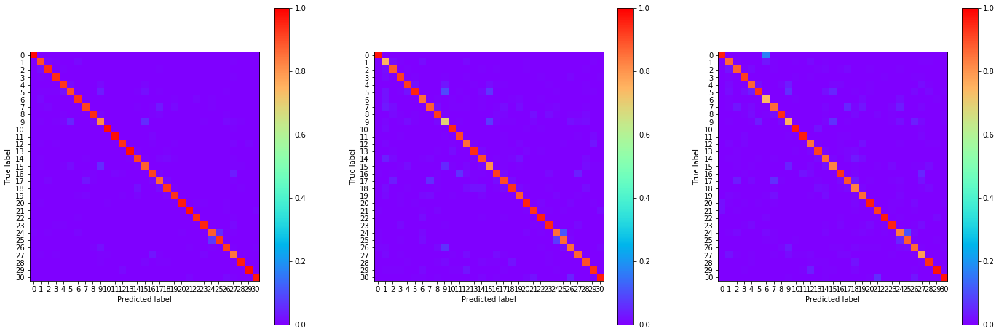

00:00:03.029276
#063 [Train: 0.234] [Test: 0.392] [Valid: 0.385]
#063 [Train: 0.930] [Test: 0.890] [Valid: 0.888]


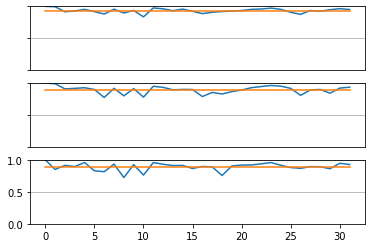

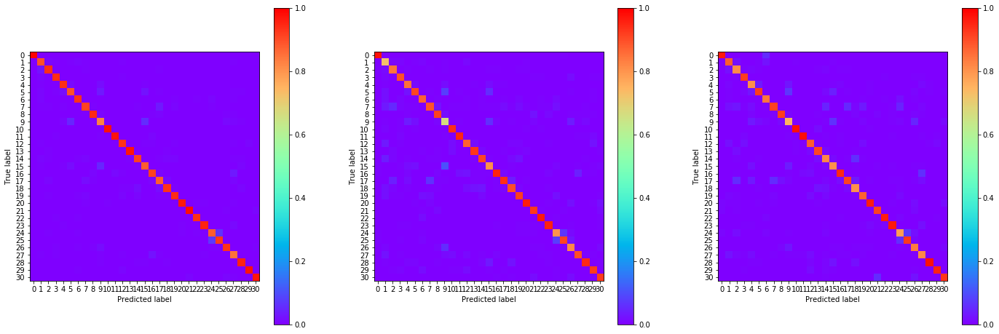

00:00:44.934708
#064 [Train: 0.230] [Test: 0.386] [Valid: 0.368]
#064 [Train: 0.931] [Test: 0.893] [Valid: 0.893]


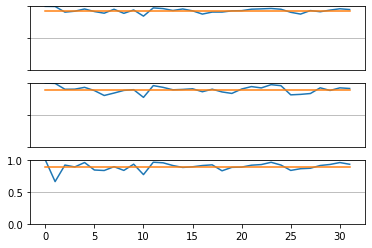

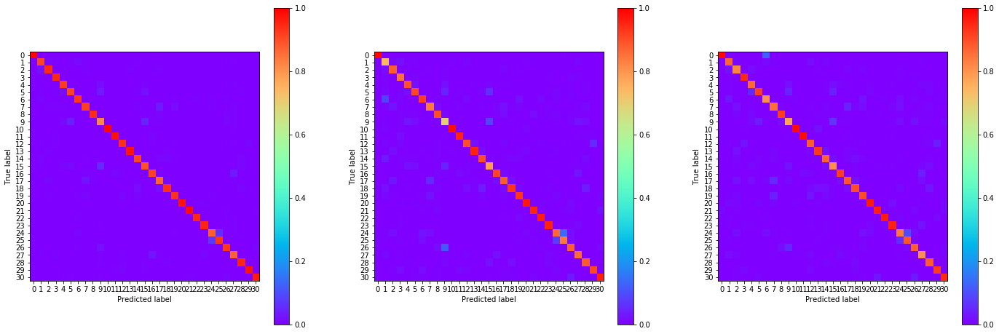

00:01:26.718974
#065 [Train: 0.225] [Test: 0.377] [Valid: 0.376]
#065 [Train: 0.932] [Test: 0.894] [Valid: 0.887]


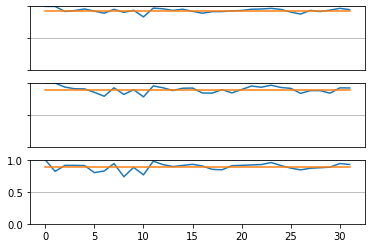

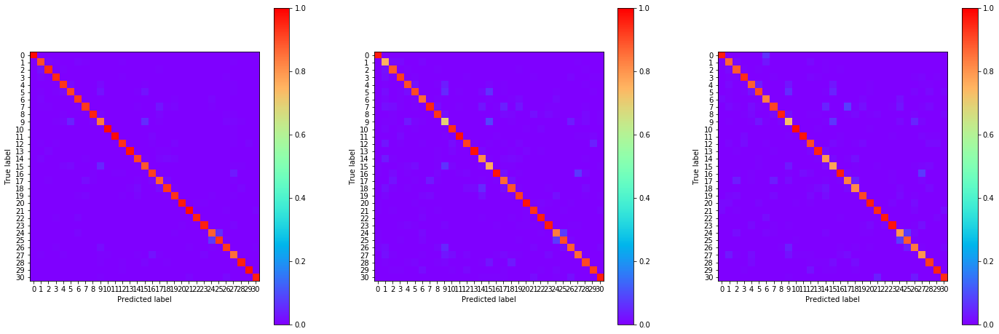

00:02:09.180540
#066 [Train: 0.228] [Test: 0.360] [Valid: 0.361]
#066 [Train: 0.932] [Test: 0.894] [Valid: 0.895]


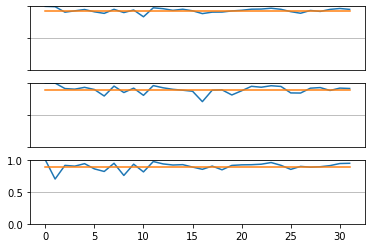

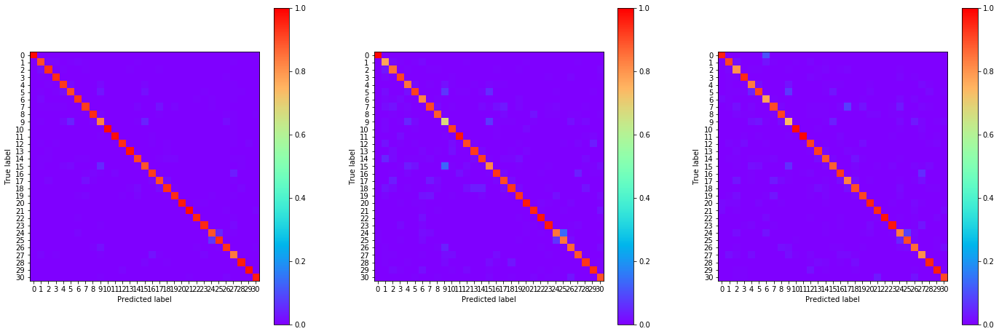

00:02:50.882879
#067 [Train: 0.218] [Test: 0.351] [Valid: 0.350]
#067 [Train: 0.934] [Test: 0.896] [Valid: 0.898]


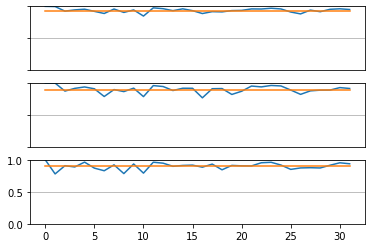

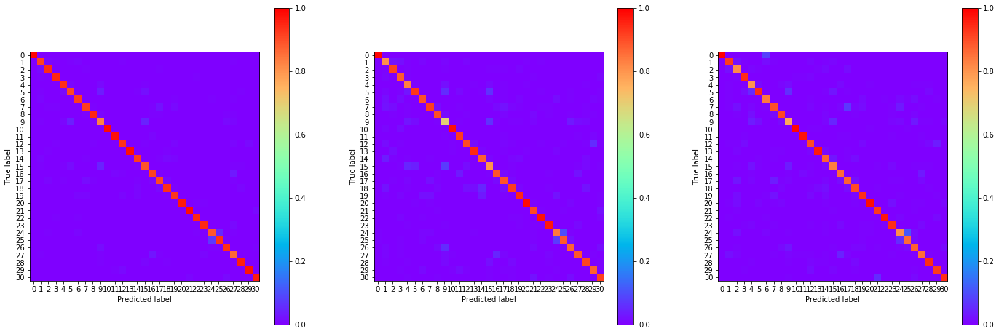

00:03:32.335282
#068 [Train: 0.218] [Test: 0.362] [Valid: 0.388]
#068 [Train: 0.934] [Test: 0.894] [Valid: 0.890]


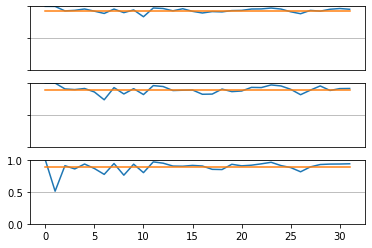

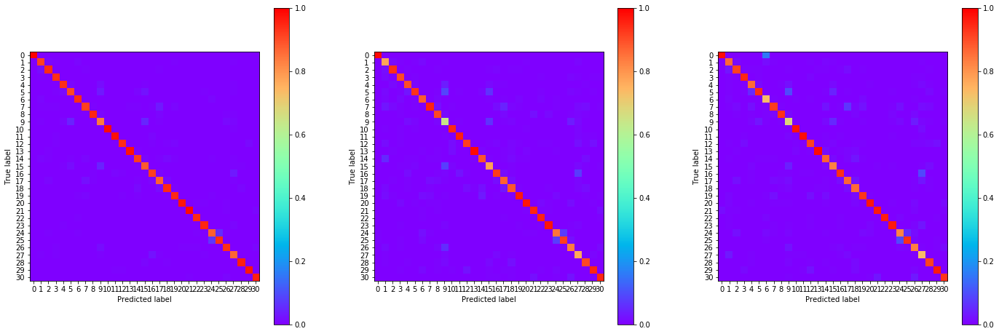

00:04:13.895752
#069 [Train: 0.211] [Test: 0.348] [Valid: 0.357]
#069 [Train: 0.937] [Test: 0.902] [Valid: 0.897]


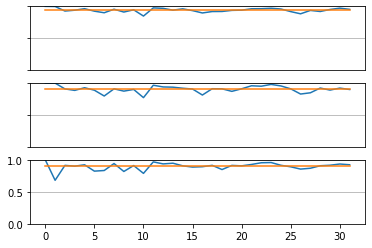

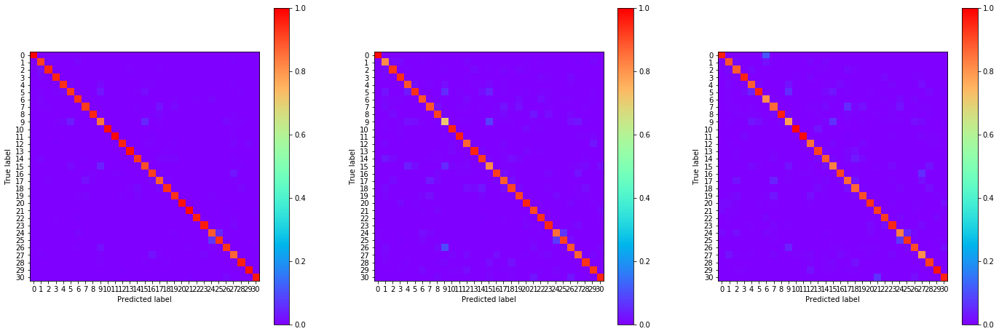

00:04:55.703948
#070 [Train: 0.207] [Test: 0.344] [Valid: 0.352]
#070 [Train: 0.938] [Test: 0.898] [Valid: 0.897]


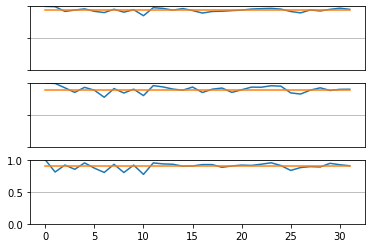

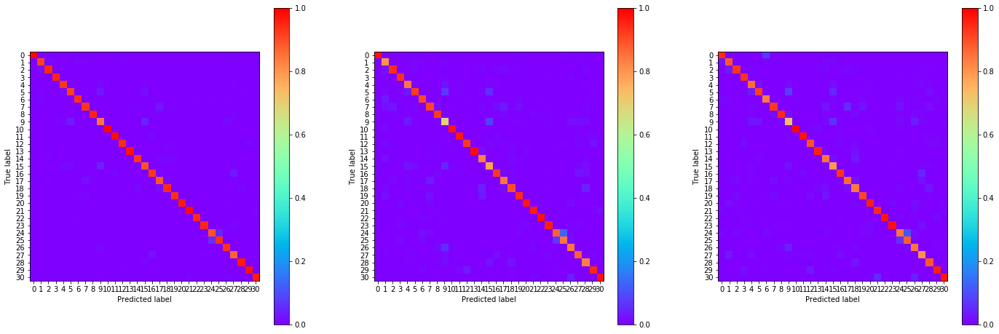

00:05:37.328079
#071 [Train: 0.207] [Test: 0.355] [Valid: 0.368]
#071 [Train: 0.938] [Test: 0.900] [Valid: 0.896]


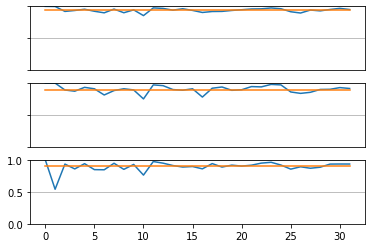

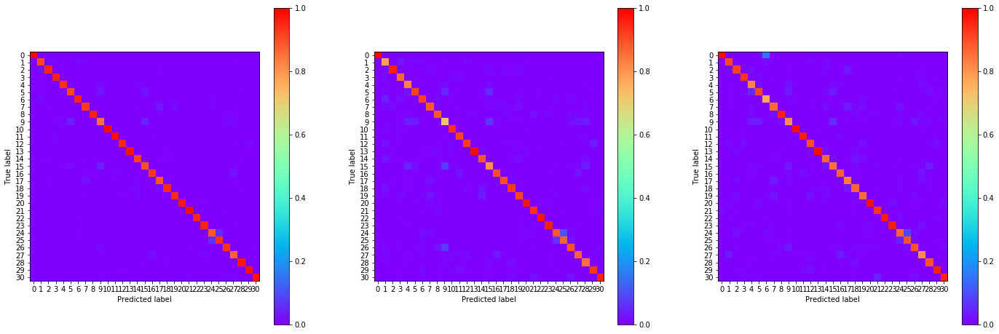

00:06:18.784104
#072 [Train: 0.200] [Test: 0.339] [Valid: 0.348]
#072 [Train: 0.940] [Test: 0.900] [Valid: 0.896]


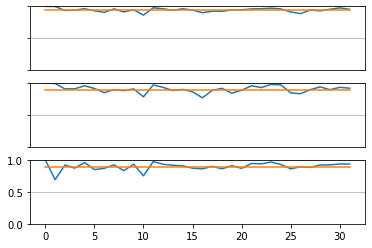

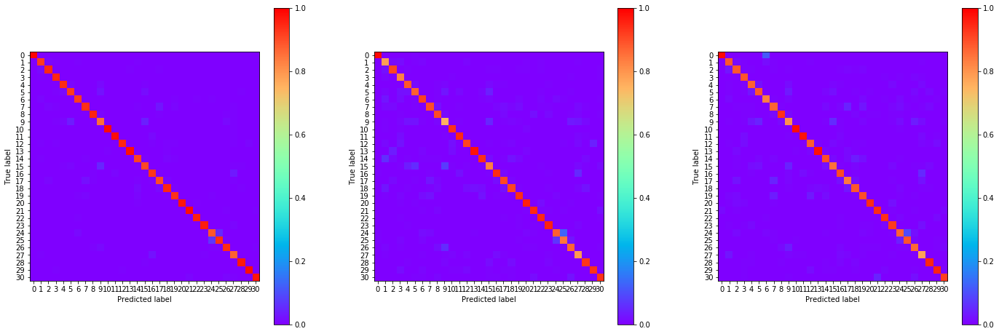

00:07:00.124261
#073 [Train: 0.196] [Test: 0.345] [Valid: 0.362]
#073 [Train: 0.941] [Test: 0.900] [Valid: 0.895]


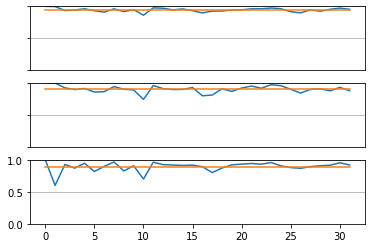

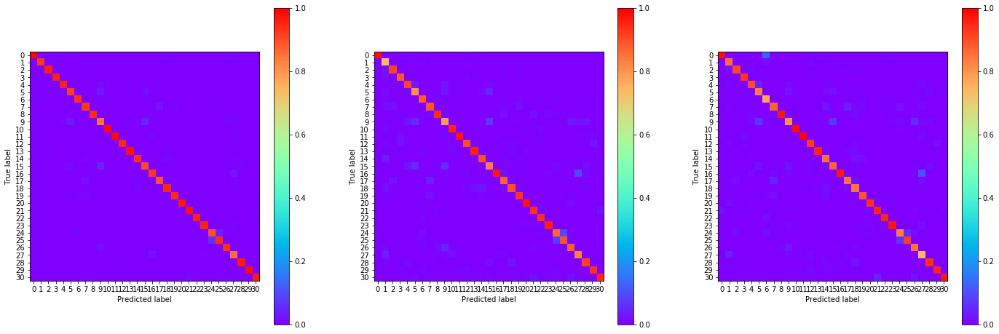

00:07:41.168609
#074 [Train: 0.191] [Test: 0.371] [Valid: 0.407]
#074 [Train: 0.943] [Test: 0.898] [Valid: 0.887]


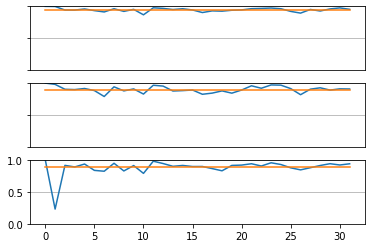

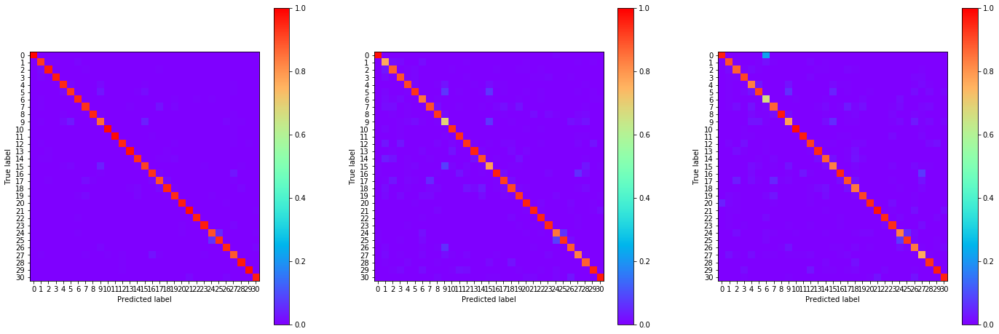

00:08:22.742913
#075 [Train: 0.191] [Test: 0.336] [Valid: 0.346]
#075 [Train: 0.942] [Test: 0.898] [Valid: 0.898]


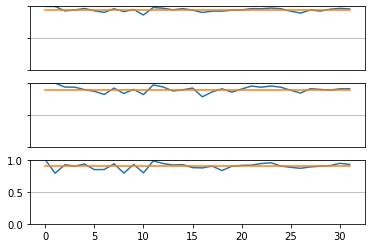

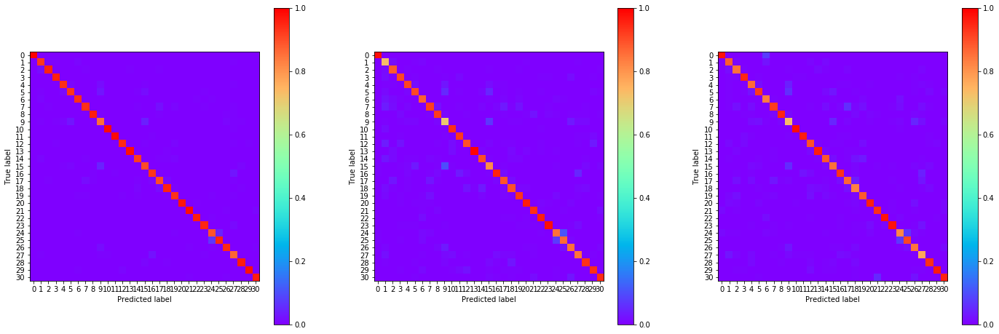

00:09:04.155962
#076 [Train: 0.184] [Test: 0.327] [Valid: 0.352]
#076 [Train: 0.945] [Test: 0.906] [Valid: 0.899]


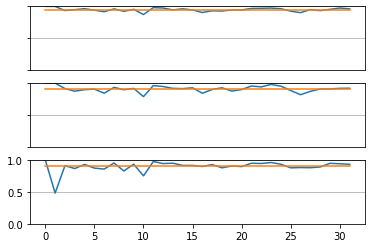

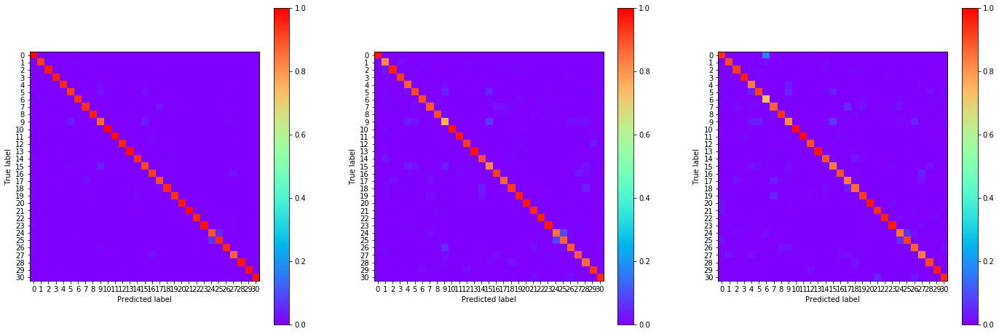

00:09:45.151238
#077 [Train: 0.181] [Test: 0.329] [Valid: 0.346]
#077 [Train: 0.946] [Test: 0.907] [Valid: 0.903]


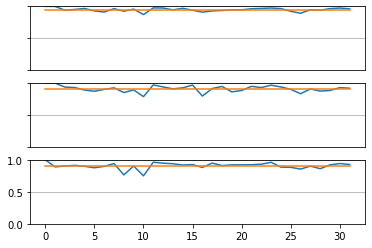

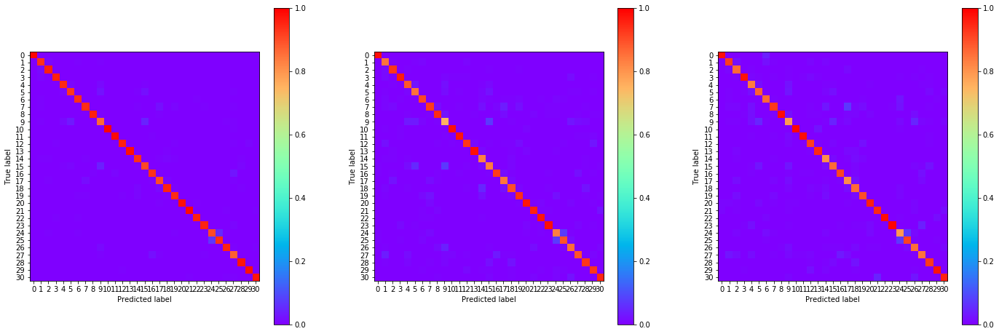

00:10:27.089879
#078 [Train: 0.178] [Test: 0.353] [Valid: 0.354]
#078 [Train: 0.947] [Test: 0.900] [Valid: 0.899]


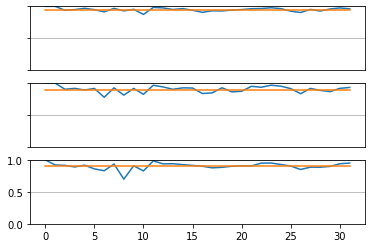

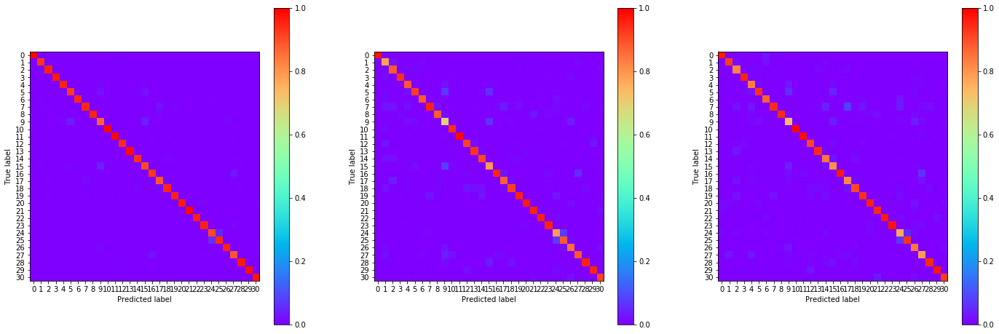

00:11:08.458445
#079 [Train: 0.180] [Test: 0.326] [Valid: 0.340]
#079 [Train: 0.946] [Test: 0.904] [Valid: 0.903]


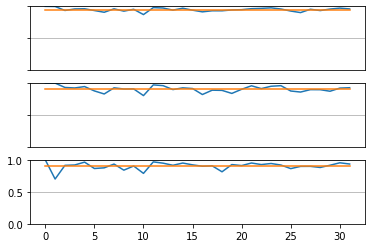

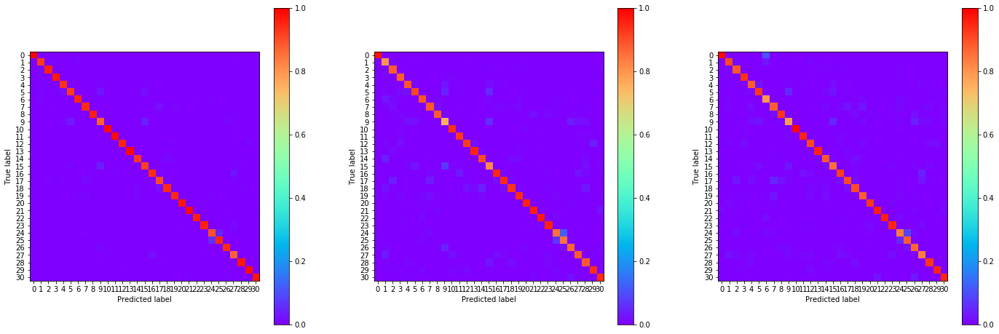

00:11:50.238640
#080 [Train: 0.172] [Test: 0.319] [Valid: 0.344]
#080 [Train: 0.947] [Test: 0.904] [Valid: 0.905]


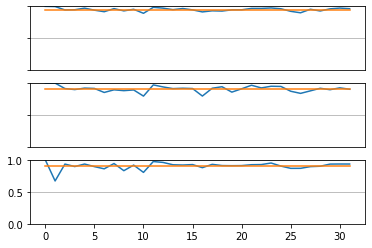

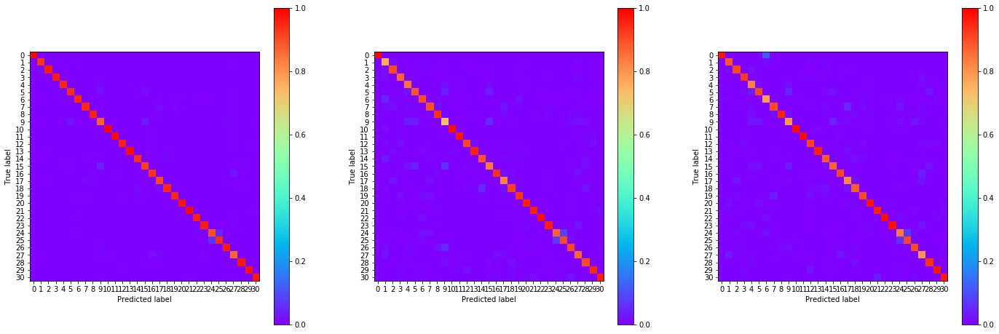

00:12:31.614079
#081 [Train: 0.167] [Test: 0.335] [Valid: 0.341]
#081 [Train: 0.950] [Test: 0.904] [Valid: 0.901]


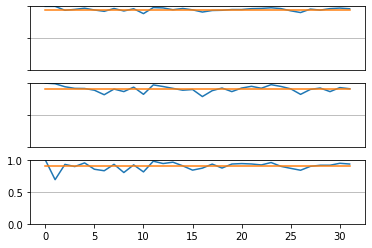

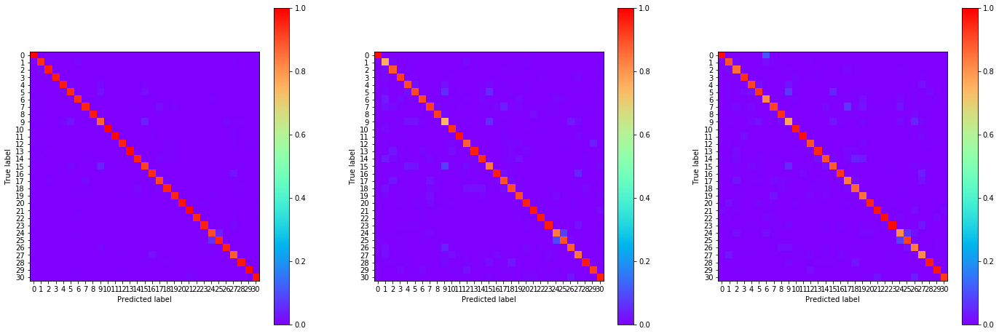

00:13:13.486981
#082 [Train: 0.169] [Test: 0.332] [Valid: 0.334]
#082 [Train: 0.949] [Test: 0.904] [Valid: 0.903]


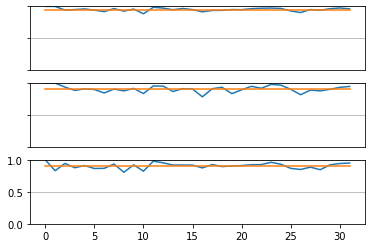

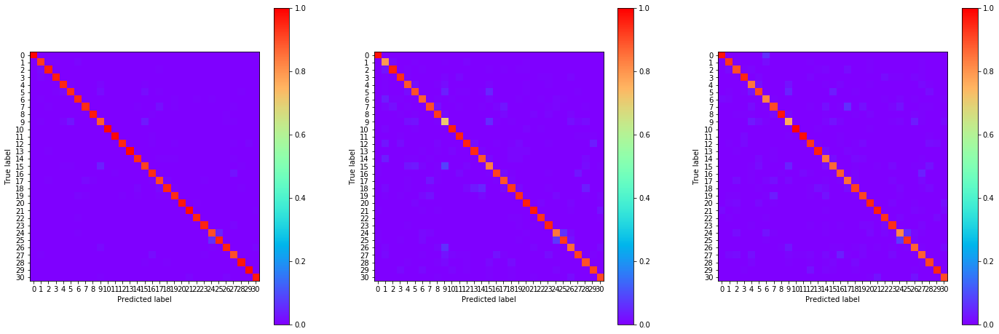

00:13:55.169738
#083 [Train: 0.164] [Test: 0.350] [Valid: 0.374]
#083 [Train: 0.951] [Test: 0.904] [Valid: 0.899]


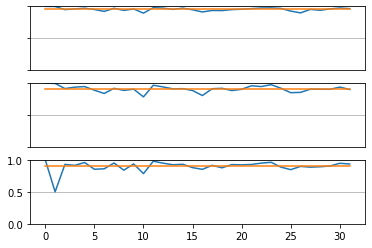

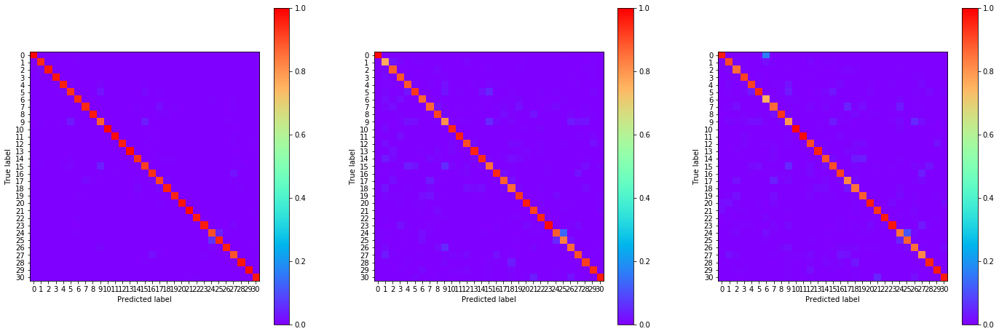

00:14:36.471901
#084 [Train: 0.161] [Test: 0.370] [Valid: 0.341]
#084 [Train: 0.952] [Test: 0.904] [Valid: 0.904]


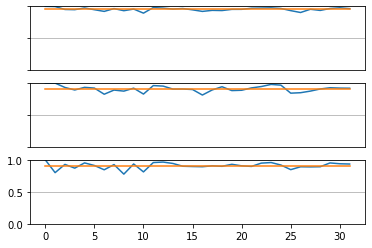

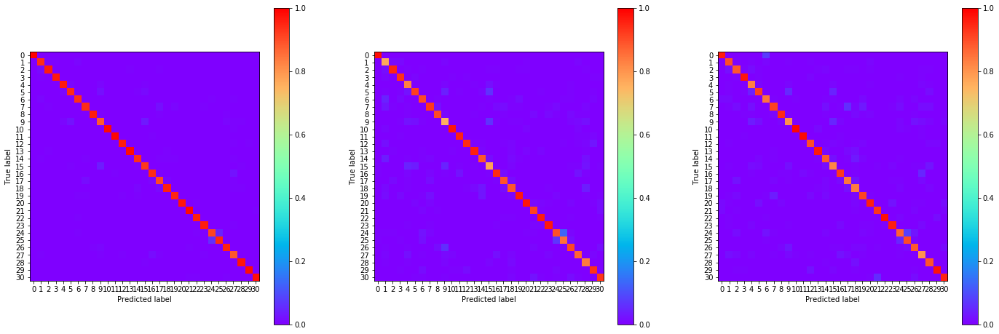

00:15:18.318473
#085 [Train: 0.161] [Test: 0.316] [Valid: 0.336]
#085 [Train: 0.951] [Test: 0.904] [Valid: 0.908]


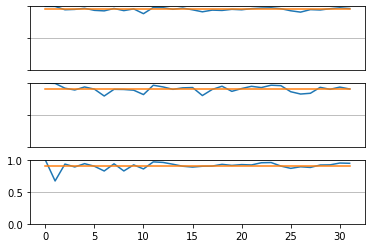

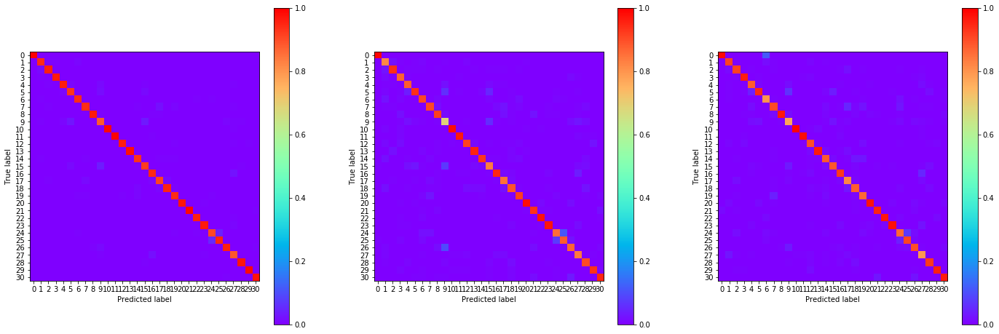

00:15:59.787456
#086 [Train: 0.156] [Test: 0.330] [Valid: 0.347]
#086 [Train: 0.954] [Test: 0.908] [Valid: 0.902]


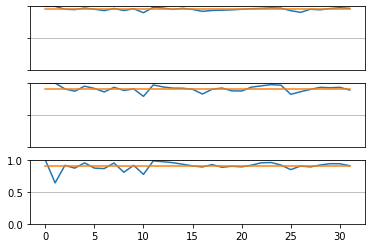

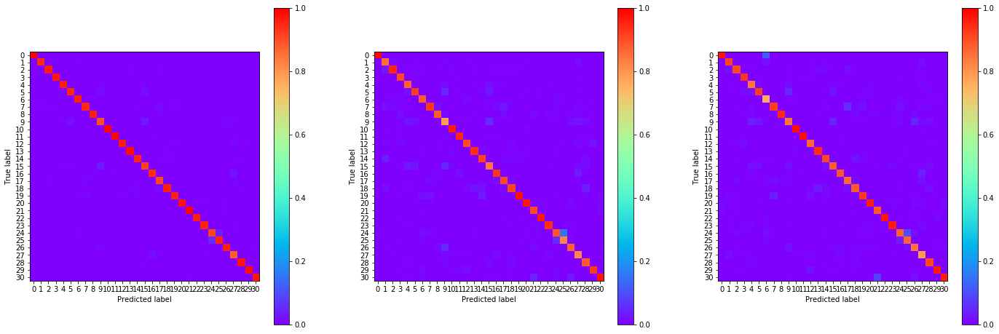

00:16:41.164903
#087 [Train: 0.153] [Test: 0.340] [Valid: 0.352]
#087 [Train: 0.954] [Test: 0.901] [Valid: 0.903]


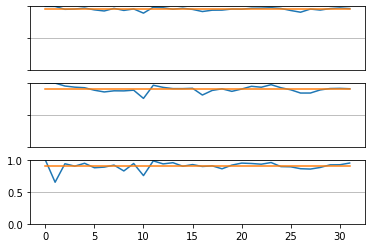

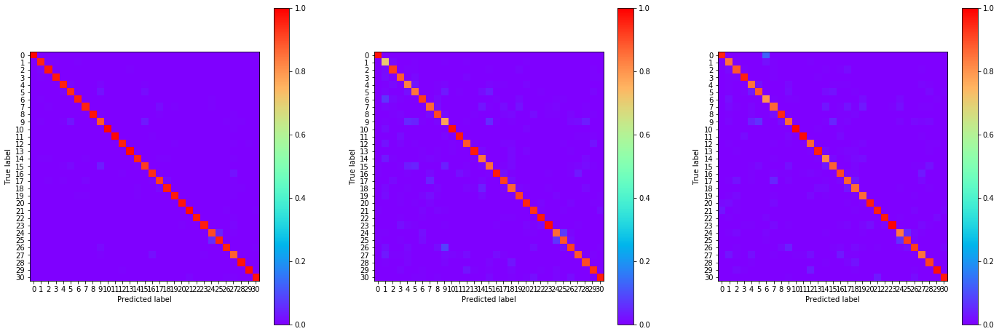

00:17:22.108368
#088 [Train: 0.150] [Test: 0.330] [Valid: 0.344]
#088 [Train: 0.955] [Test: 0.906] [Valid: 0.903]


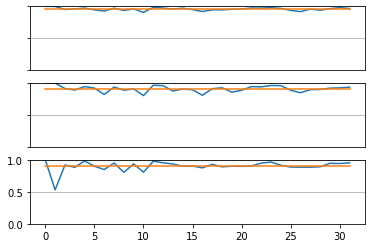

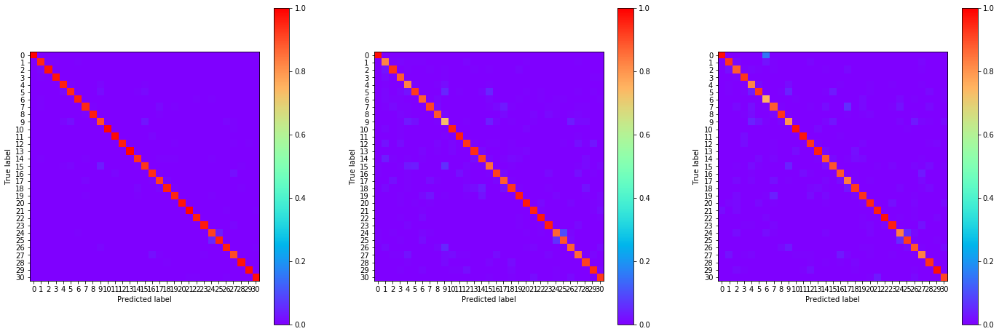

00:18:03.639809
#089 [Train: 0.147] [Test: 0.332] [Valid: 0.343]
#089 [Train: 0.956] [Test: 0.905] [Valid: 0.904]


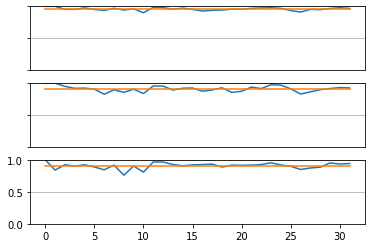

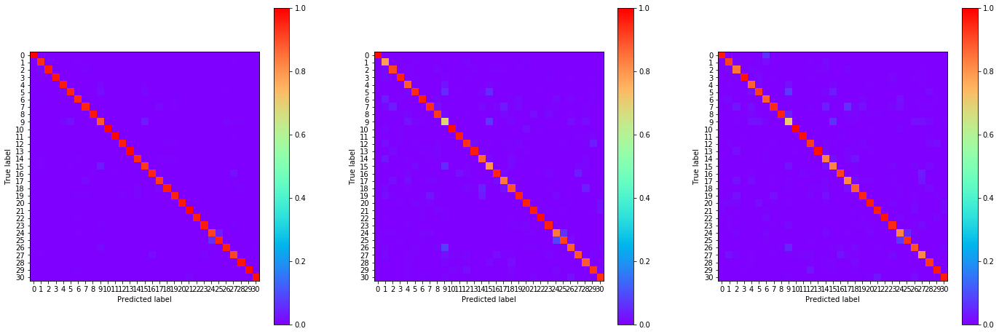

00:18:44.849338
#090 [Train: 0.148] [Test: 0.351] [Valid: 0.351]
#090 [Train: 0.955] [Test: 0.905] [Valid: 0.906]


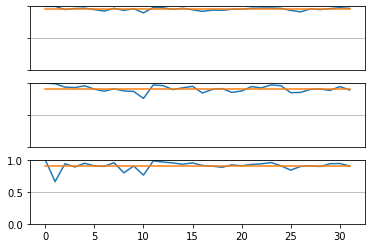

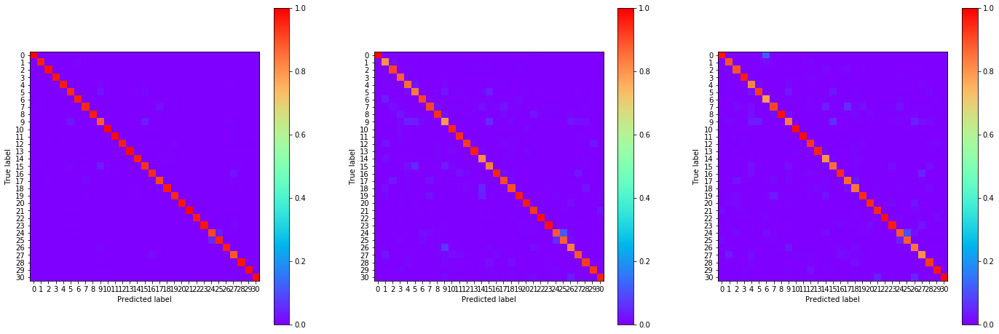

00:19:26.087487
#091 [Train: 0.141] [Test: 0.315] [Valid: 0.339]
#091 [Train: 0.958] [Test: 0.911] [Valid: 0.908]


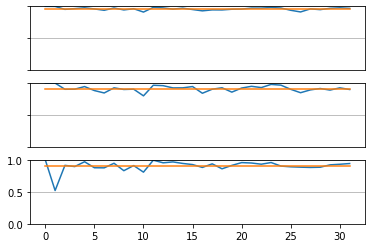

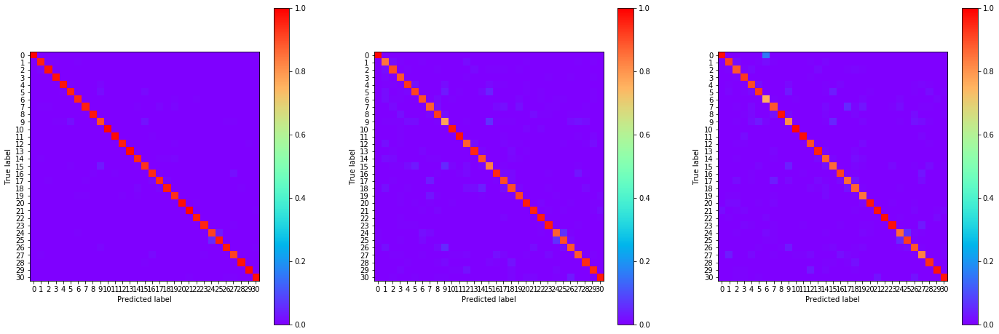

00:20:08.218720
#092 [Train: 0.146] [Test: 0.342] [Valid: 0.352]
#092 [Train: 0.957] [Test: 0.909] [Valid: 0.902]


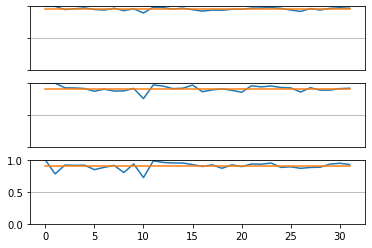

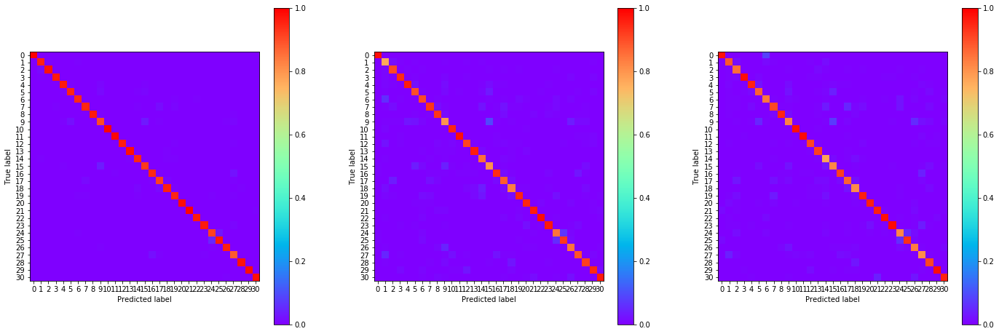

00:20:49.690784
#093 [Train: 0.141] [Test: 0.331] [Valid: 0.370]
#093 [Train: 0.956] [Test: 0.911] [Valid: 0.902]


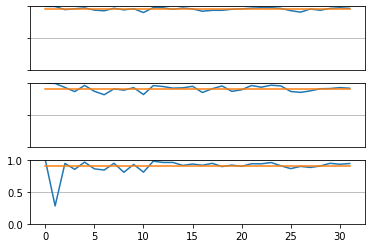

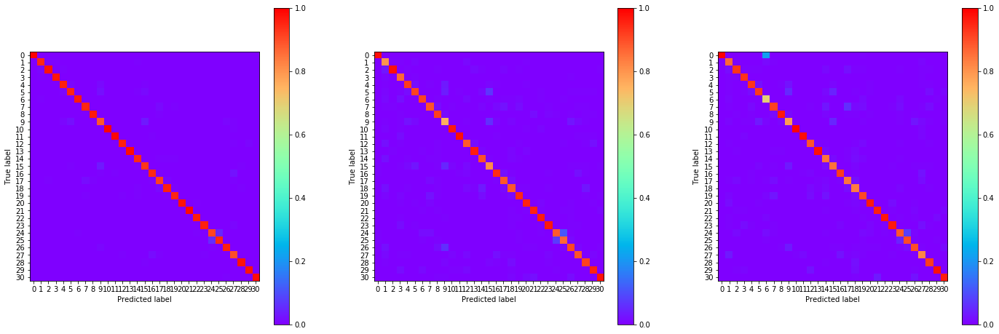

00:21:31.405066
#094 [Train: 0.143] [Test: 0.325] [Valid: 0.342]
#094 [Train: 0.957] [Test: 0.910] [Valid: 0.904]


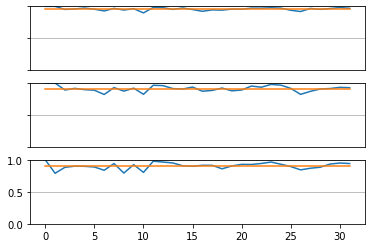

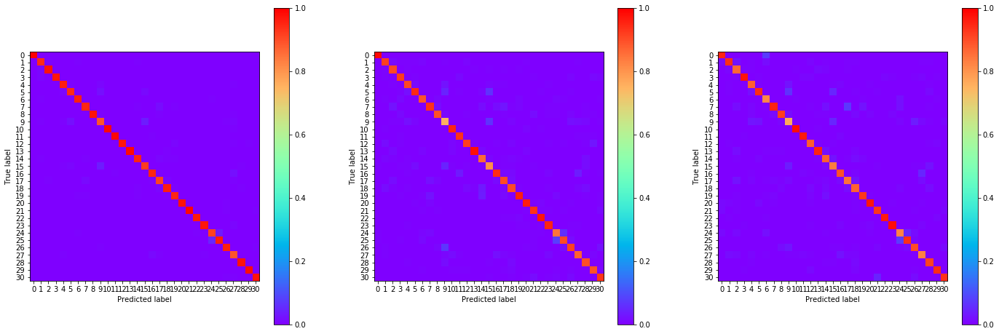

00:22:12.867921
#095 [Train: 0.133] [Test: 0.325] [Valid: 0.353]
#095 [Train: 0.961] [Test: 0.908] [Valid: 0.905]


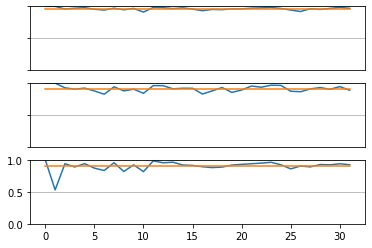

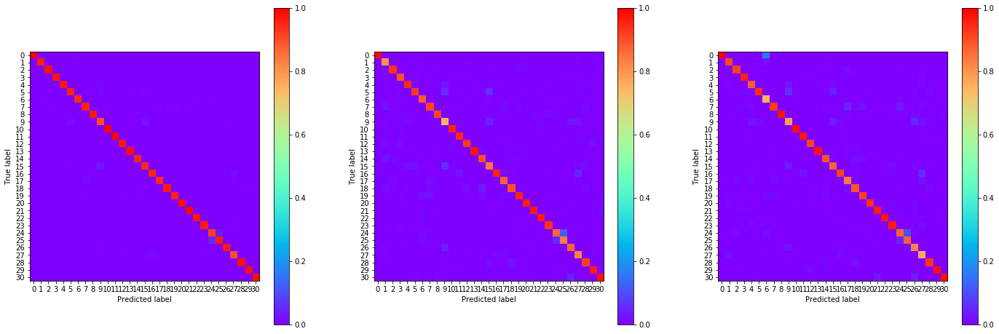

00:22:54.256698
#096 [Train: 0.129] [Test: 0.324] [Valid: 0.345]
#096 [Train: 0.961] [Test: 0.909] [Valid: 0.907]


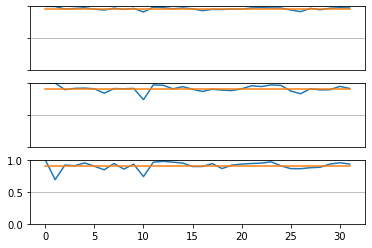

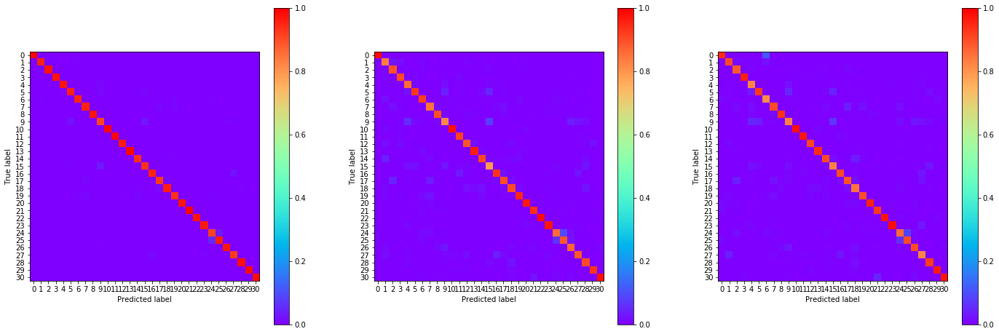

00:23:35.561015
#097 [Train: 0.130] [Test: 0.338] [Valid: 0.352]
#097 [Train: 0.961] [Test: 0.910] [Valid: 0.911]


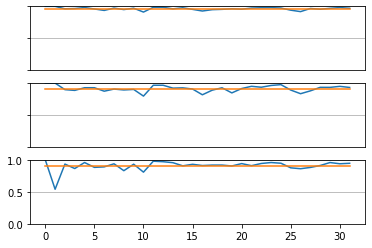

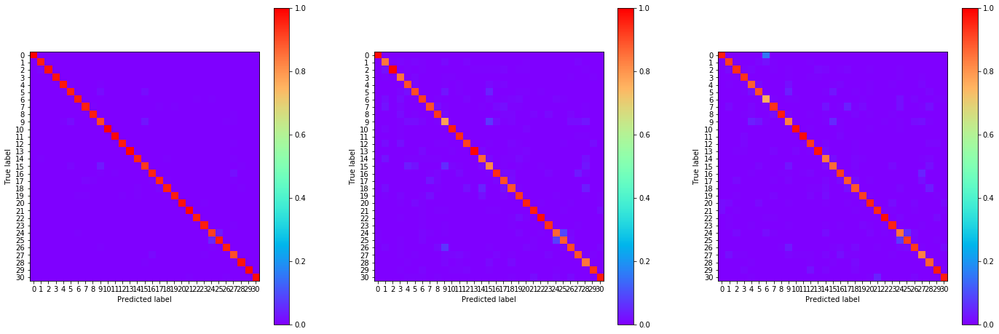

00:24:17.245149
#098 [Train: 0.128] [Test: 0.328] [Valid: 0.336]
#098 [Train: 0.963] [Test: 0.910] [Valid: 0.907]


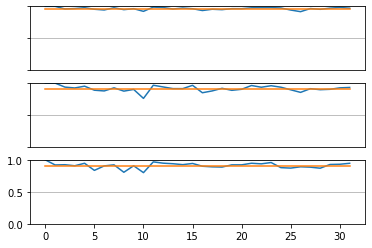

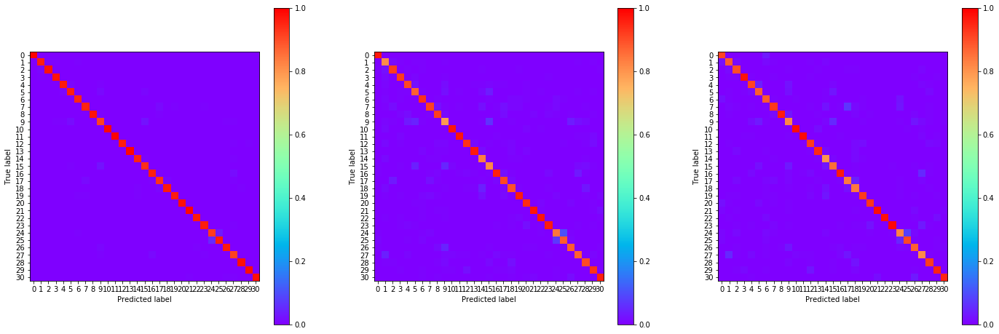

00:24:58.806118
#099 [Train: 0.127] [Test: 0.326] [Valid: 0.327]
#099 [Train: 0.962] [Test: 0.911] [Valid: 0.913]


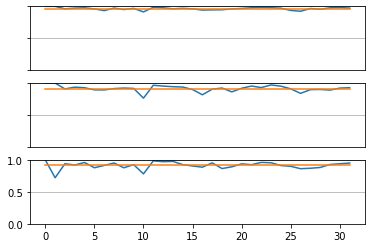

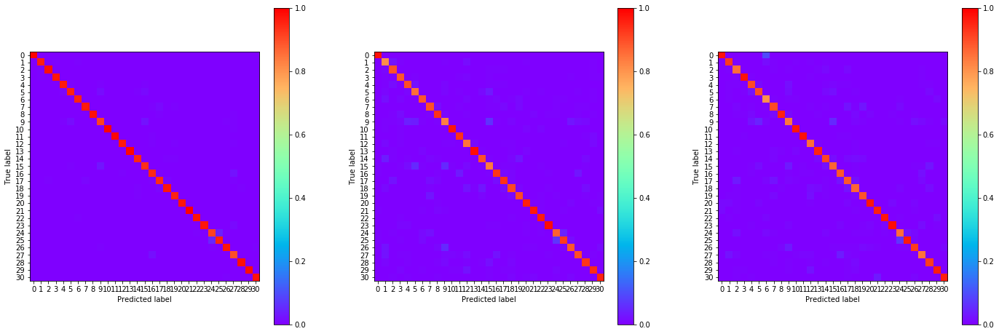

00:25:39.926021
#100 [Train: 0.125] [Test: 0.317] [Valid: 0.347]
#100 [Train: 0.962] [Test: 0.915] [Valid: 0.909]


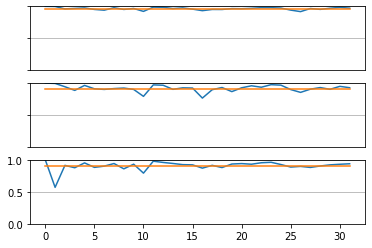

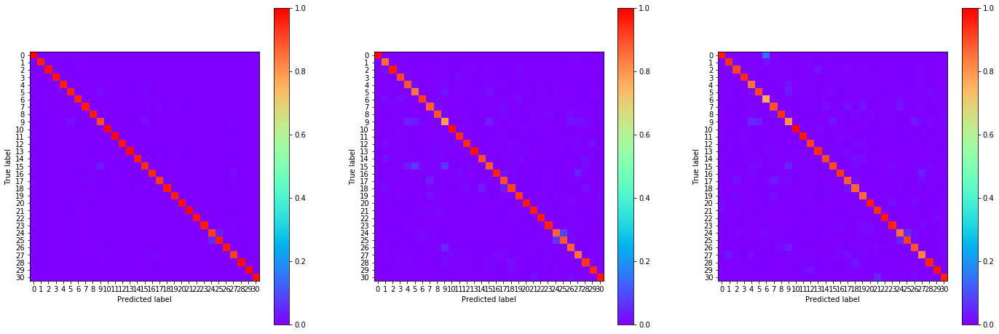

00:26:21.348947
#101 [Train: 0.121] [Test: 0.345] [Valid: 0.359]
#101 [Train: 0.964] [Test: 0.904] [Valid: 0.908]


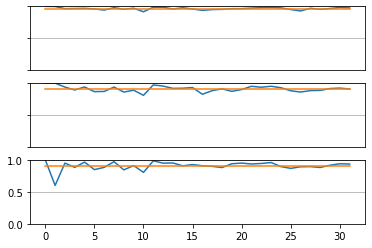

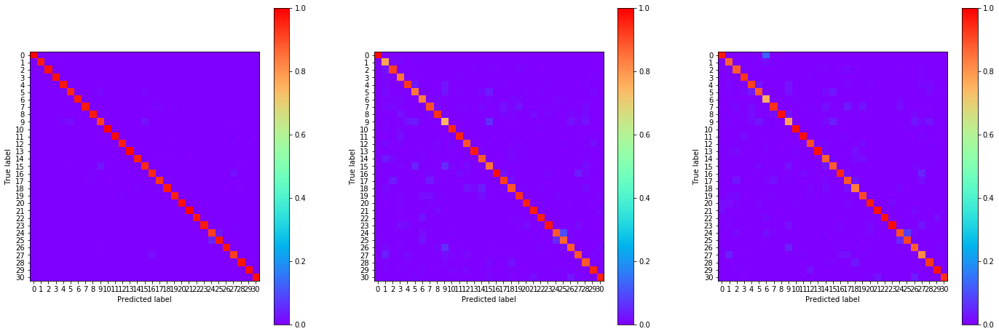

00:27:02.554317
#102 [Train: 0.120] [Test: 0.359] [Valid: 0.379]
#102 [Train: 0.964] [Test: 0.907] [Valid: 0.902]


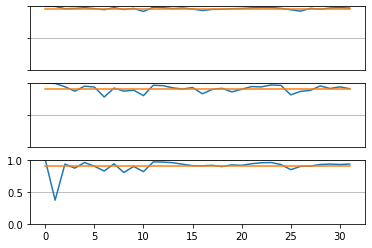

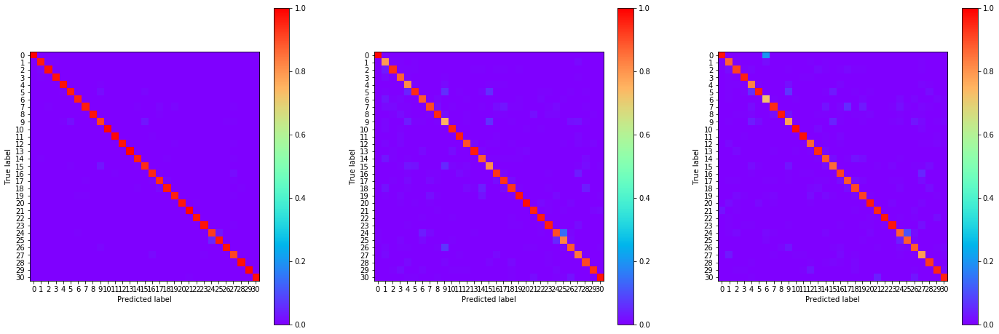

00:27:43.834790
#103 [Train: 0.122] [Test: 0.328] [Valid: 0.334]
#103 [Train: 0.963] [Test: 0.913] [Valid: 0.910]


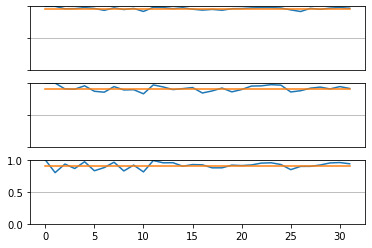

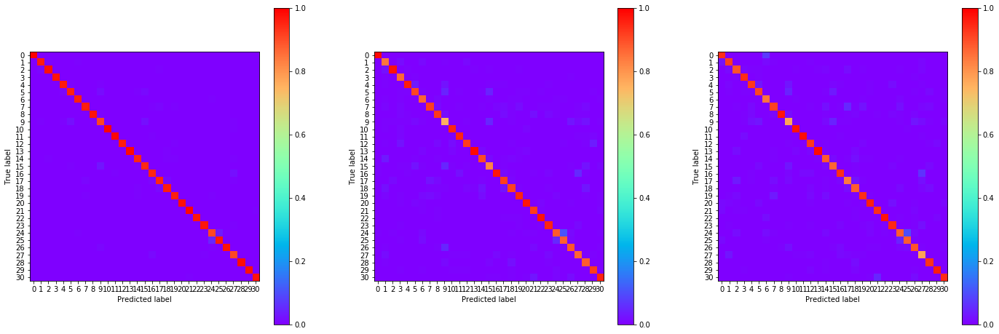

00:28:25.318392
#104 [Train: 0.120] [Test: 0.346] [Valid: 0.357]
#104 [Train: 0.964] [Test: 0.902] [Valid: 0.903]


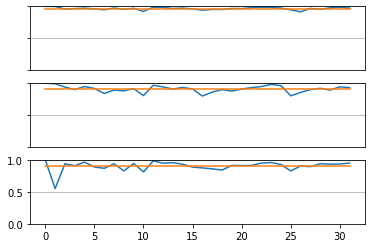

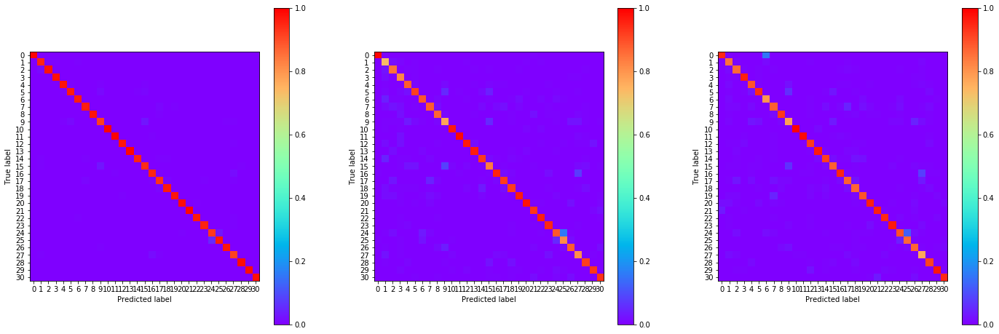

00:29:06.644199
#105 [Train: 0.112] [Test: 0.349] [Valid: 0.335]
#105 [Train: 0.967] [Test: 0.912] [Valid: 0.909]


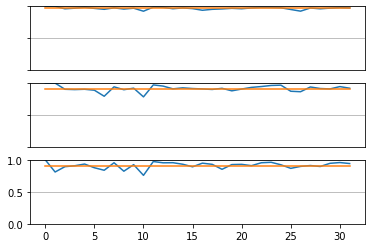

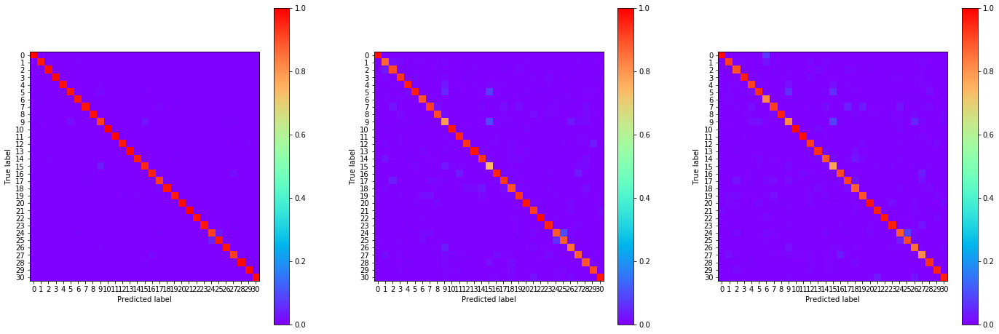

00:29:48.007069
#106 [Train: 0.117] [Test: 0.341] [Valid: 0.340]
#106 [Train: 0.964] [Test: 0.909] [Valid: 0.909]


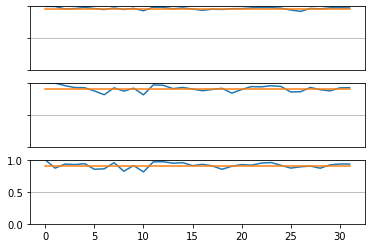

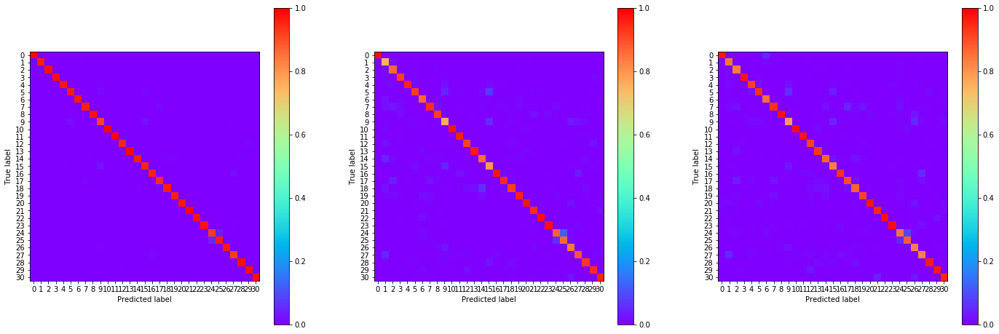

00:30:29.329747
#107 [Train: 0.112] [Test: 0.344] [Valid: 0.349]
#107 [Train: 0.967] [Test: 0.910] [Valid: 0.905]


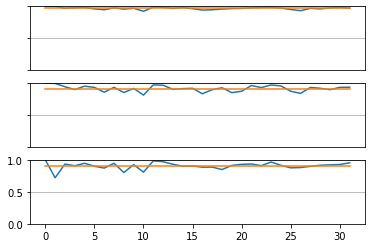

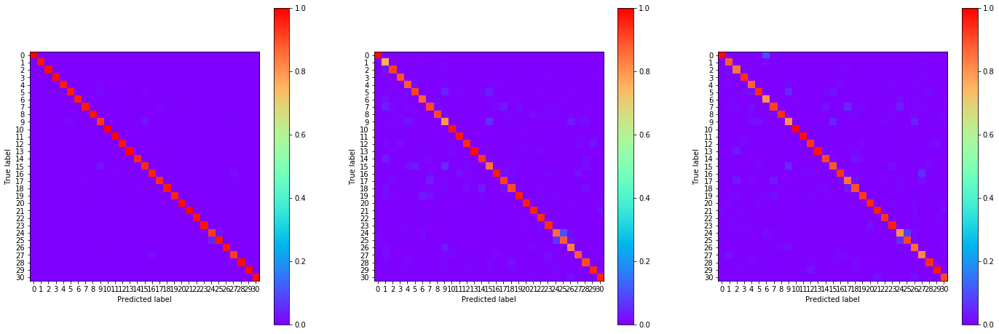

00:31:11.472394
#108 [Train: 0.108] [Test: 0.326] [Valid: 0.351]
#108 [Train: 0.968] [Test: 0.911] [Valid: 0.909]


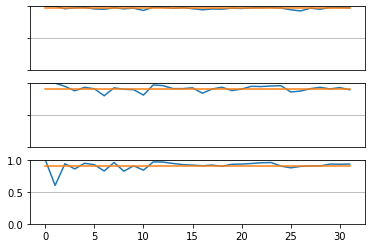

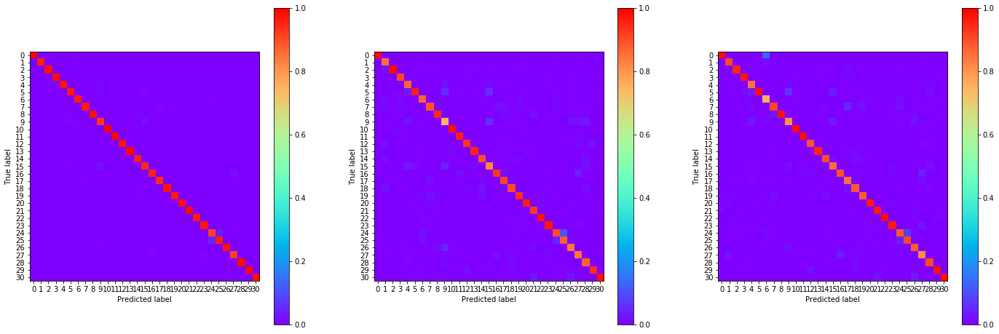

00:31:52.553850
#109 [Train: 0.104] [Test: 0.365] [Valid: 0.408]
#109 [Train: 0.970] [Test: 0.900] [Valid: 0.897]


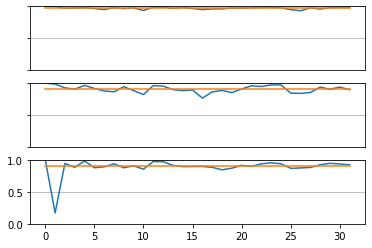

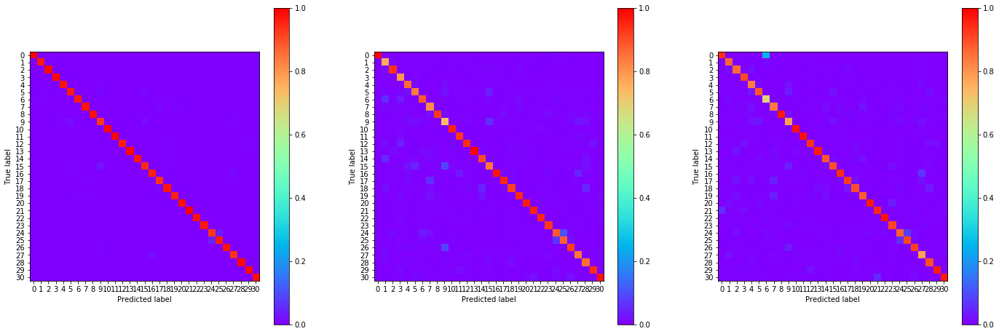

00:32:34.041767
#110 [Train: 0.106] [Test: 0.328] [Valid: 0.355]
#110 [Train: 0.968] [Test: 0.915] [Valid: 0.910]


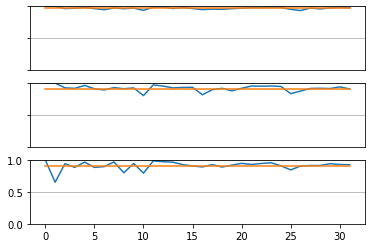

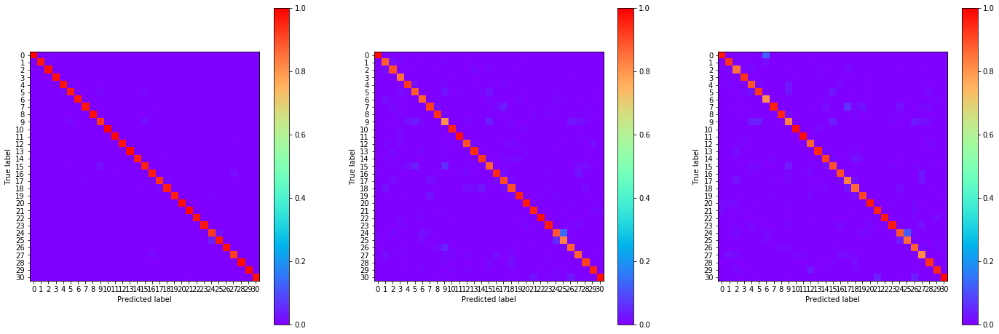

00:33:16.111679
#111 [Train: 0.107] [Test: 0.337] [Valid: 0.359]
#111 [Train: 0.968] [Test: 0.915] [Valid: 0.906]


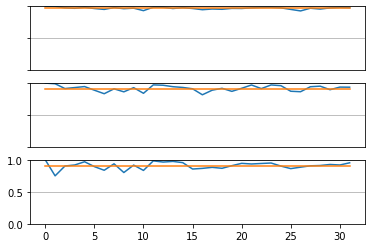

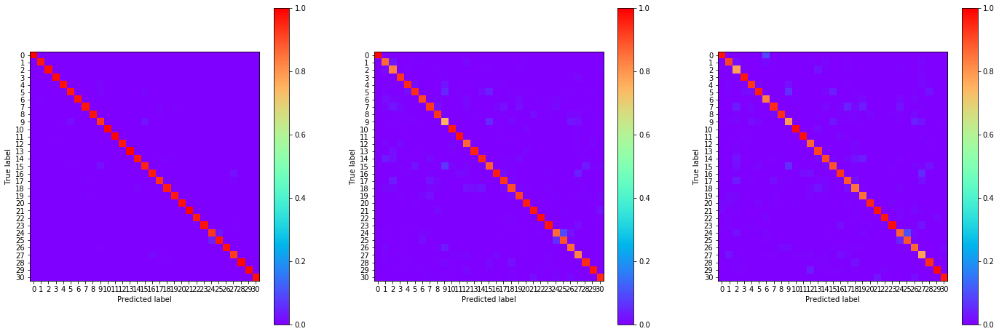

00:33:57.676981
#112 [Train: 0.102] [Test: 0.324] [Valid: 0.338]
#112 [Train: 0.970] [Test: 0.914] [Valid: 0.910]


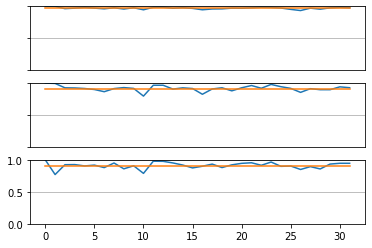

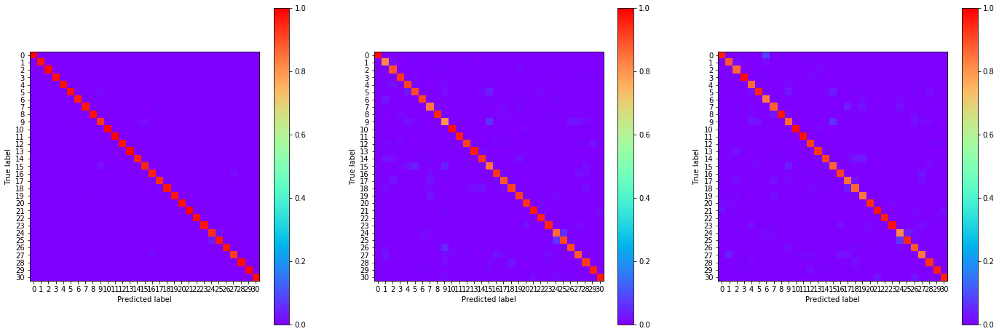

00:34:39.469492
#113 [Train: 0.105] [Test: 0.304] [Valid: 0.362]
#113 [Train: 0.969] [Test: 0.914] [Valid: 0.907]


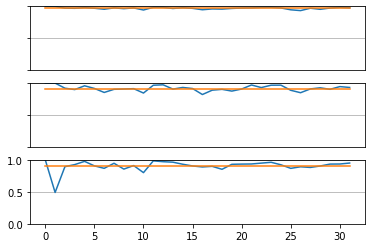

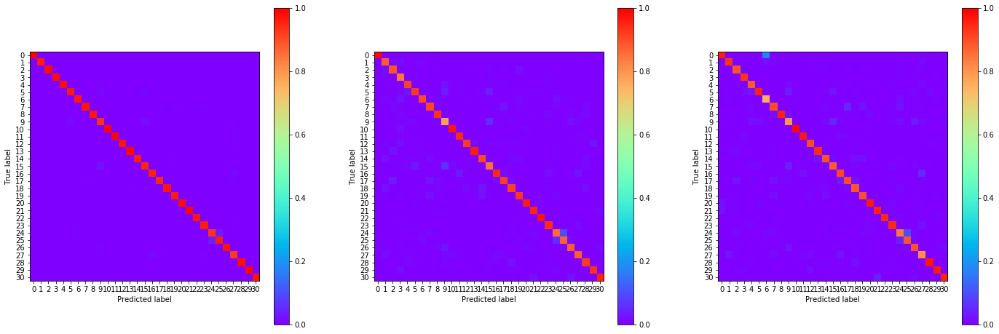

00:35:21.036432
#114 [Train: 0.102] [Test: 0.365] [Valid: 0.349]
#114 [Train: 0.970] [Test: 0.908] [Valid: 0.907]


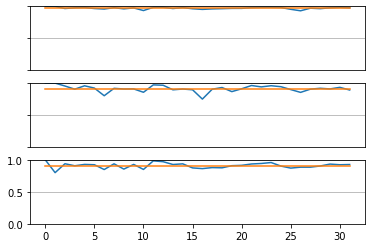

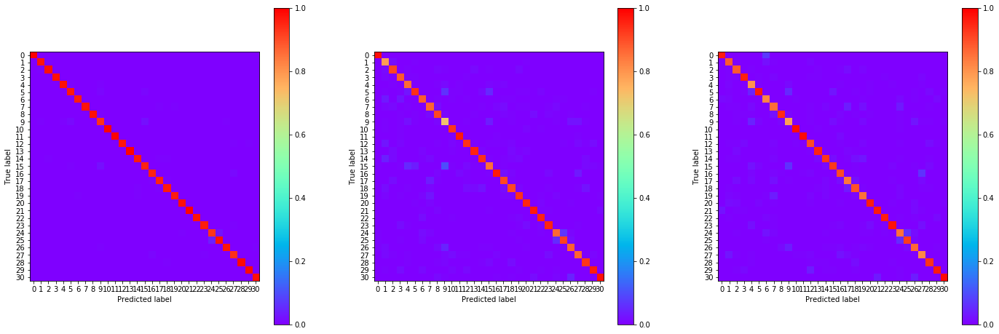

00:36:03.276675
#115 [Train: 0.102] [Test: 0.337] [Valid: 0.363]
#115 [Train: 0.969] [Test: 0.913] [Valid: 0.907]


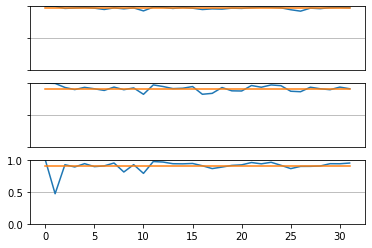

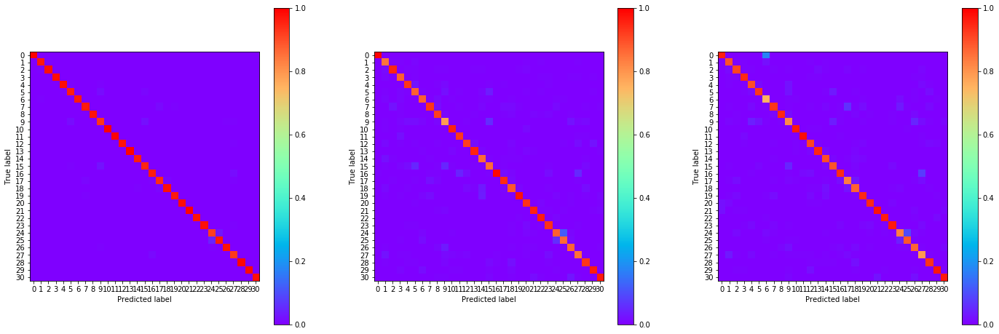

00:36:44.767827
#116 [Train: 0.093] [Test: 0.310] [Valid: 0.328]
#116 [Train: 0.973] [Test: 0.915] [Valid: 0.913]


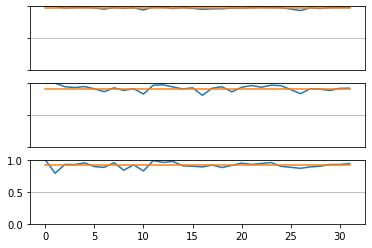

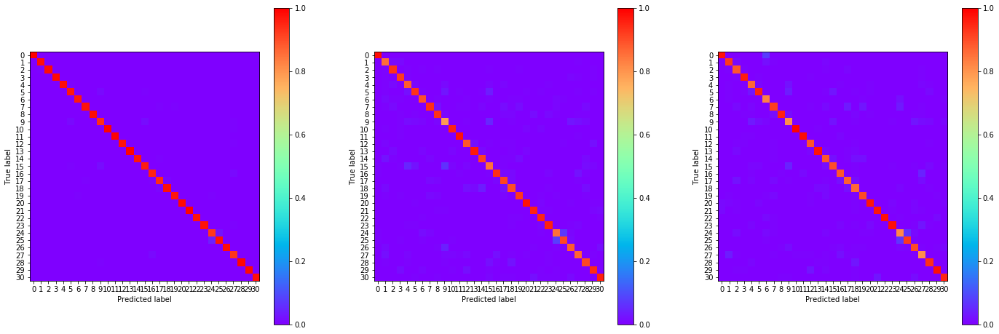

00:37:26.653968
#117 [Train: 0.098] [Test: 0.325] [Valid: 0.344]
#117 [Train: 0.971] [Test: 0.916] [Valid: 0.912]


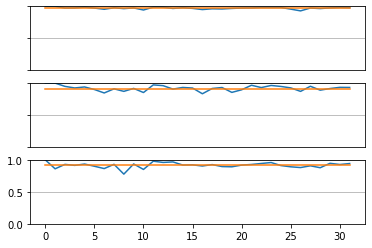

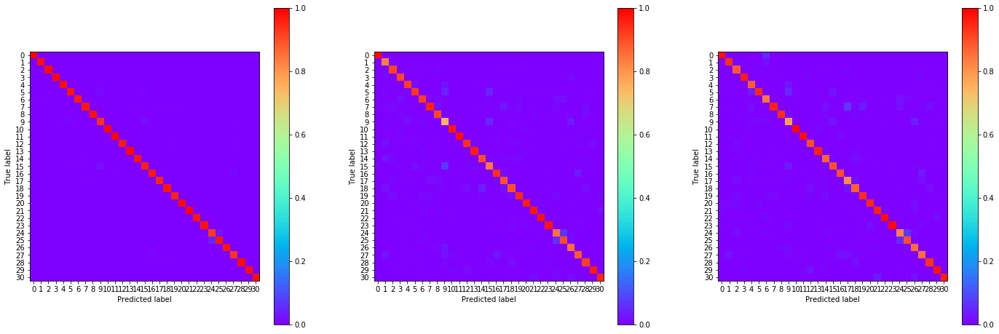

00:38:08.100087
#118 [Train: 0.092] [Test: 0.363] [Valid: 0.398]
#118 [Train: 0.973] [Test: 0.905] [Valid: 0.902]


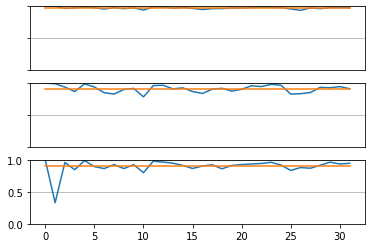

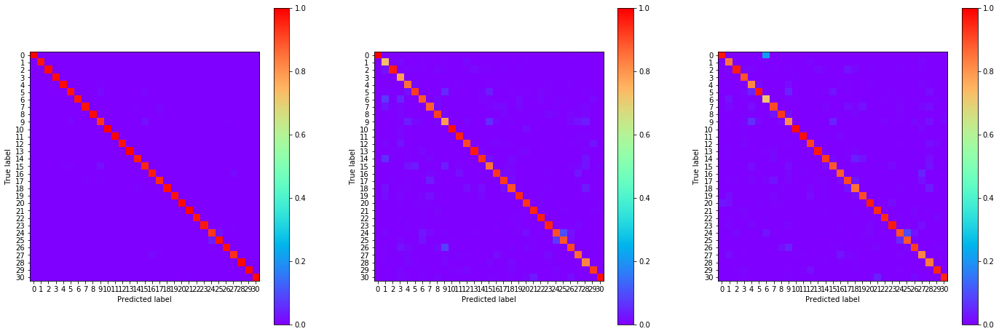

00:38:49.368733
#119 [Train: 0.095] [Test: 0.336] [Valid: 0.334]
#119 [Train: 0.972] [Test: 0.913] [Valid: 0.914]


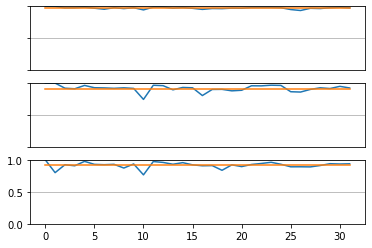

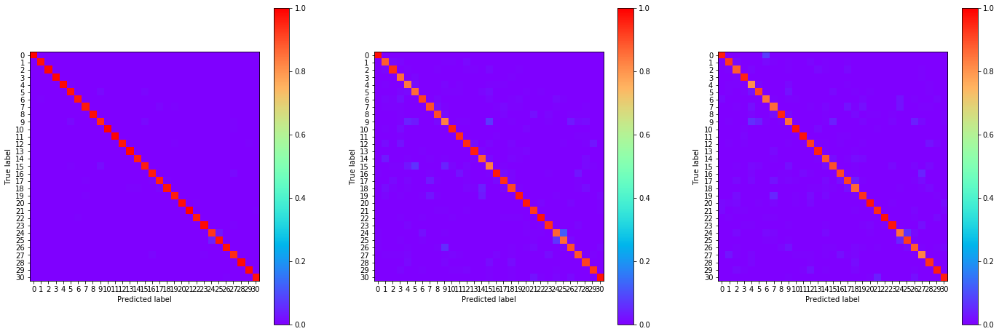

00:39:31.085403
#120 [Train: 0.091] [Test: 0.342] [Valid: 0.356]
#120 [Train: 0.973] [Test: 0.913] [Valid: 0.909]


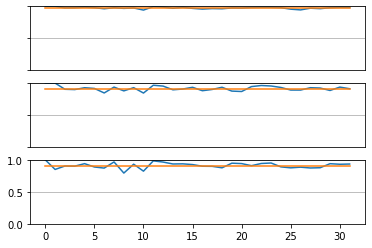

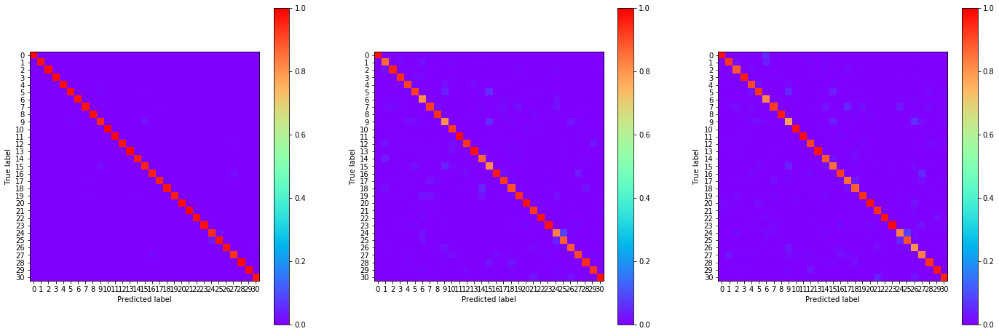

00:40:12.535317
#121 [Train: 0.093] [Test: 0.366] [Valid: 0.406]
#121 [Train: 0.973] [Test: 0.906] [Valid: 0.903]


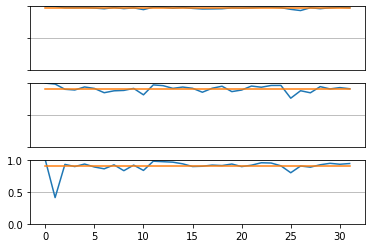

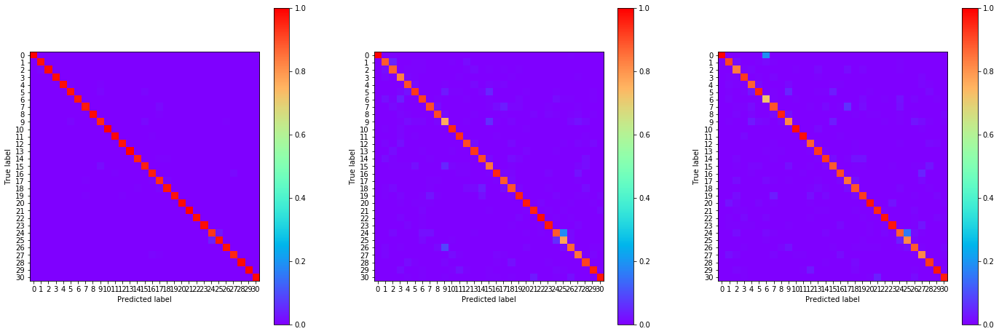

00:40:53.928234
#122 [Train: 0.090] [Test: 0.333] [Valid: 0.338]
#122 [Train: 0.973] [Test: 0.919] [Valid: 0.914]


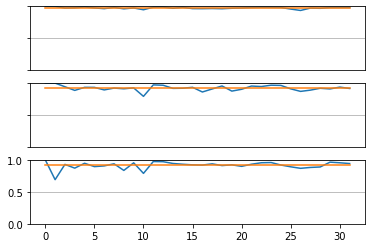

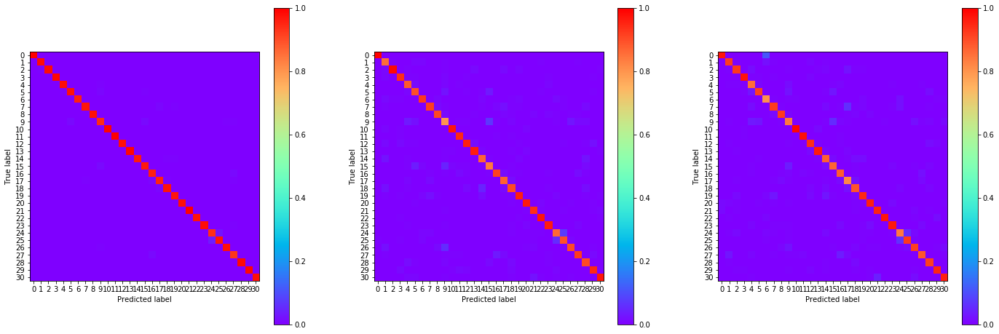

00:41:35.193287
#123 [Train: 0.086] [Test: 0.328] [Valid: 0.340]
#123 [Train: 0.975] [Test: 0.915] [Valid: 0.912]


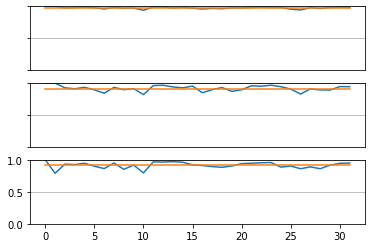

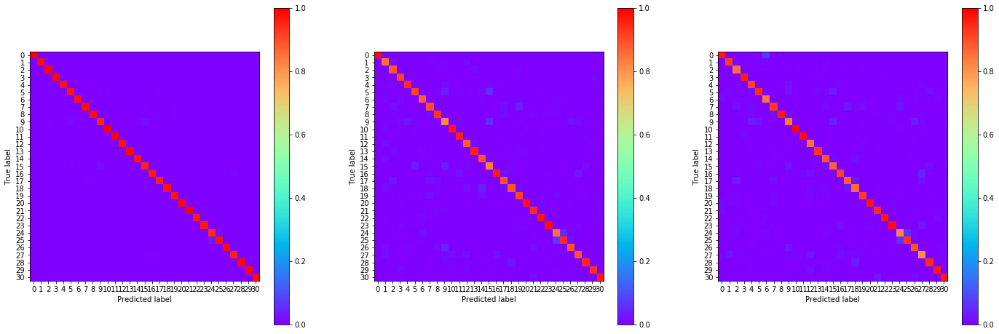

00:42:16.947445
#124 [Train: 0.085] [Test: 0.379] [Valid: 0.372]
#124 [Train: 0.975] [Test: 0.905] [Valid: 0.906]


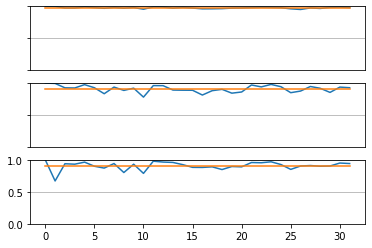

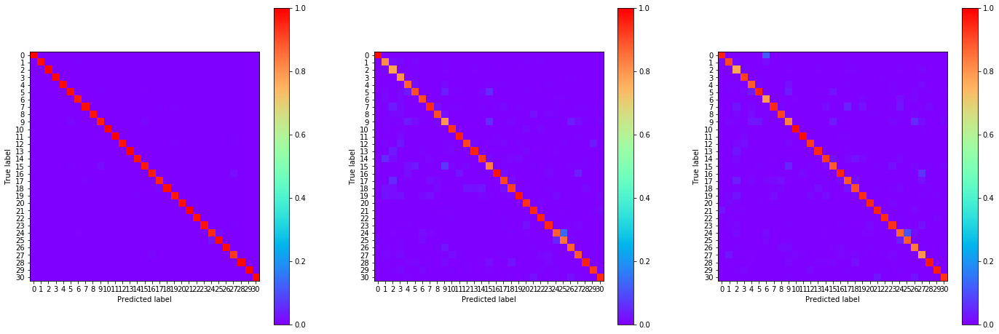

00:42:58.222749
#125 [Train: 0.081] [Test: 0.344] [Valid: 0.363]
#125 [Train: 0.977] [Test: 0.915] [Valid: 0.910]


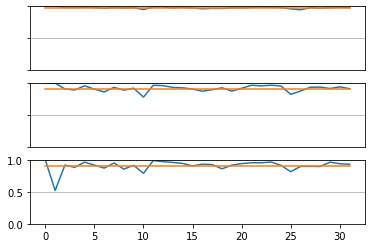

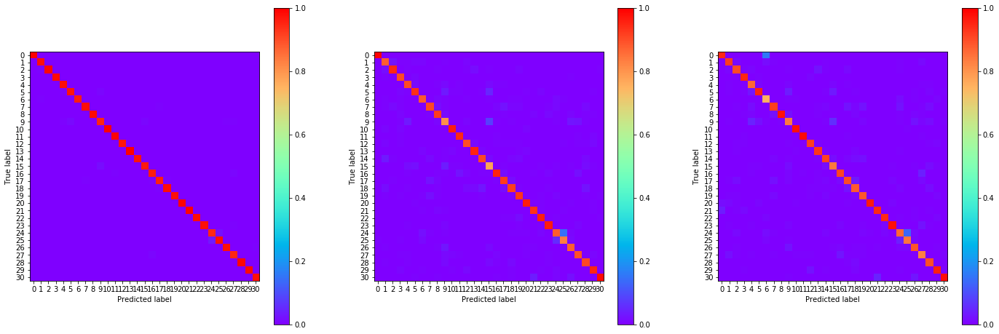

00:43:39.624557
#126 [Train: 0.086] [Test: 0.333] [Valid: 0.373]
#126 [Train: 0.974] [Test: 0.915] [Valid: 0.908]


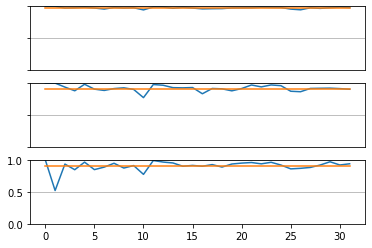

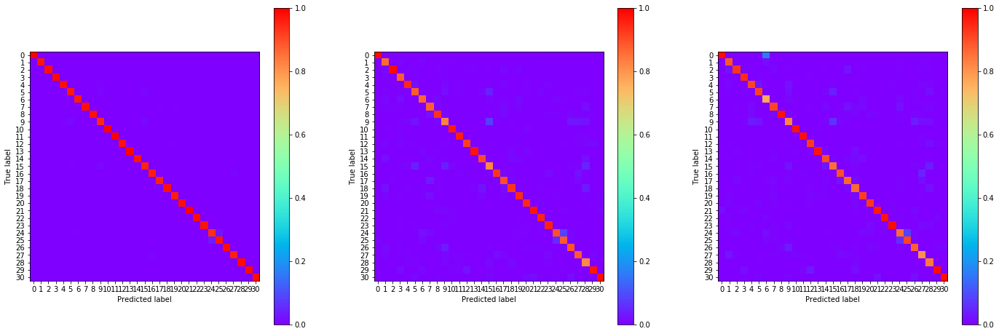

00:44:21.653581
#127 [Train: 0.087] [Test: 0.344] [Valid: 0.350]
#127 [Train: 0.974] [Test: 0.911] [Valid: 0.911]


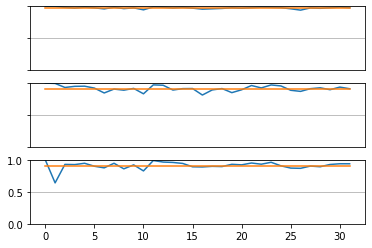

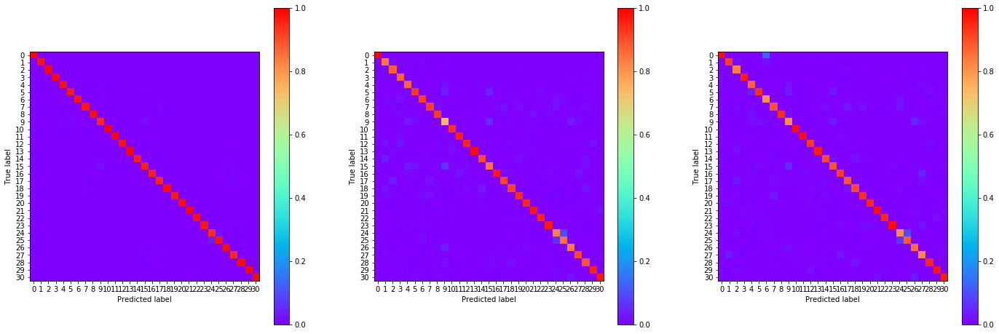

00:45:02.663480
#128 [Train: 0.079] [Test: 0.370] [Valid: 0.357]
#128 [Train: 0.977] [Test: 0.909] [Valid: 0.911]


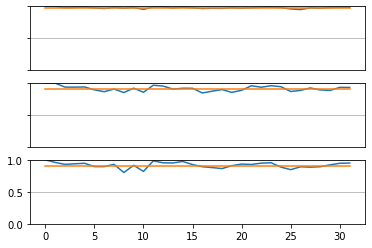

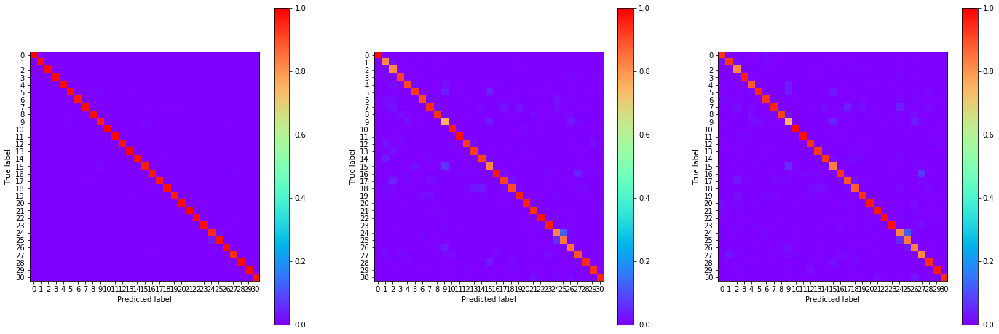

00:45:44.852059
#129 [Train: 0.085] [Test: 0.330] [Valid: 0.343]
#129 [Train: 0.975] [Test: 0.913] [Valid: 0.914]


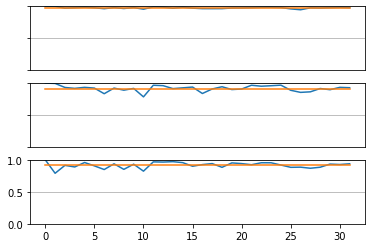

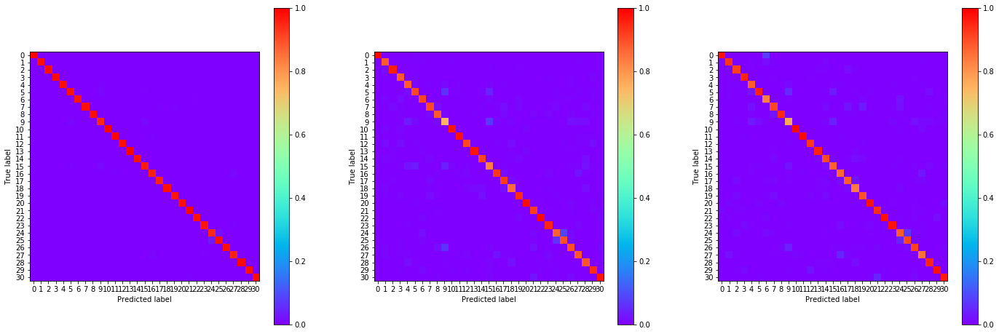

00:46:26.407726
#130 [Train: 0.079] [Test: 0.345] [Valid: 0.384]
#130 [Train: 0.977] [Test: 0.906] [Valid: 0.902]


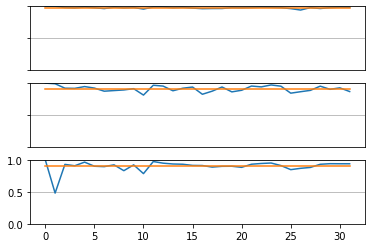

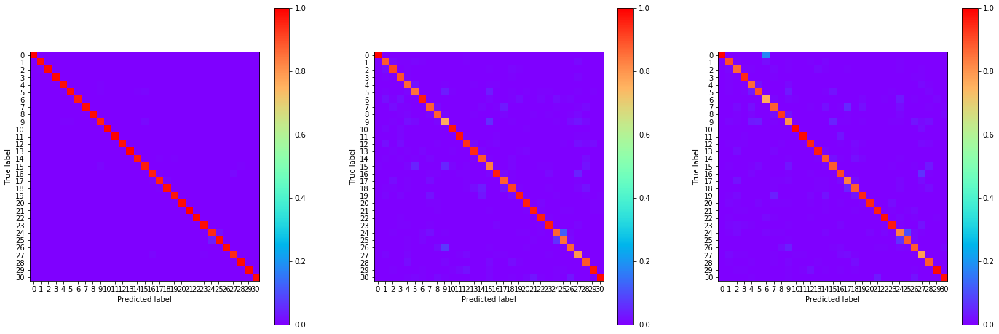

00:47:07.514674
#131 [Train: 0.075] [Test: 0.331] [Valid: 0.349]
#131 [Train: 0.978] [Test: 0.915] [Valid: 0.911]


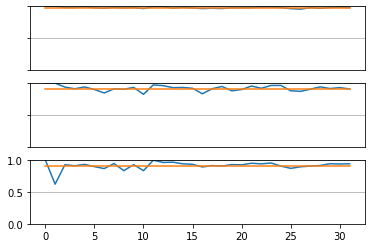

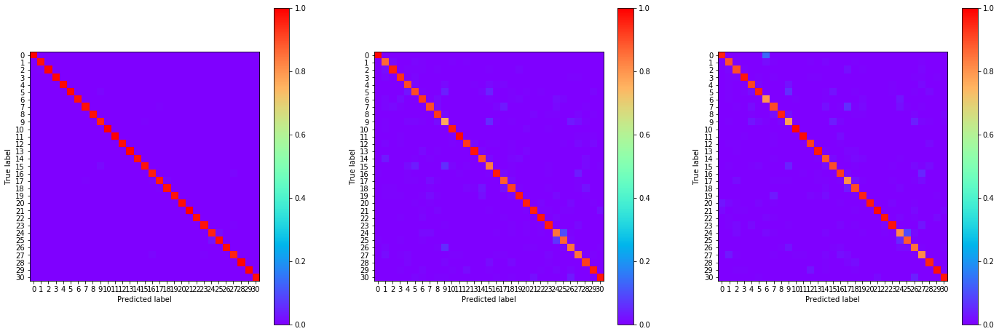

00:47:48.773945
#132 [Train: 0.071] [Test: 0.316] [Valid: 0.342]
#132 [Train: 0.979] [Test: 0.915] [Valid: 0.915]


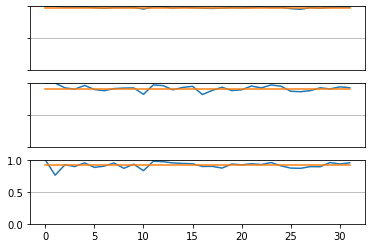

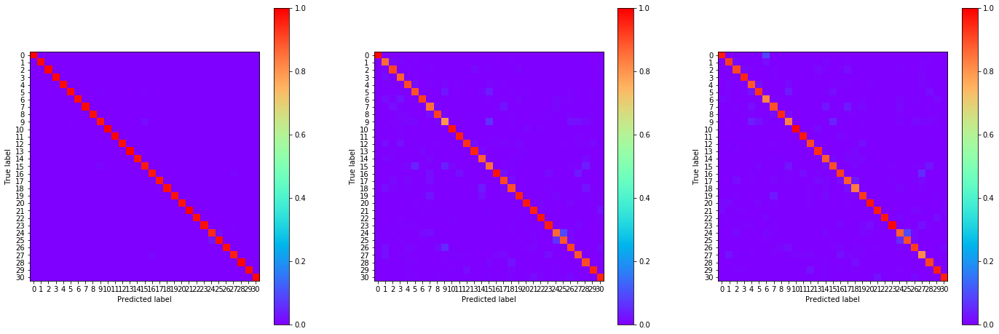

00:48:31.080166
#133 [Train: 0.080] [Test: 0.353] [Valid: 0.374]
#133 [Train: 0.976] [Test: 0.914] [Valid: 0.910]


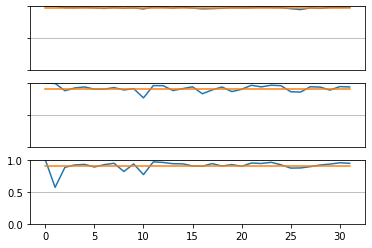

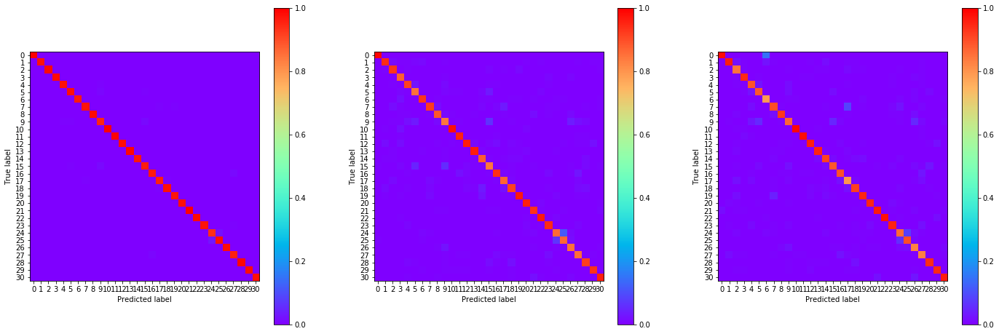

00:49:12.587782
#134 [Train: 0.074] [Test: 0.352] [Valid: 0.356]
#134 [Train: 0.979] [Test: 0.916] [Valid: 0.914]


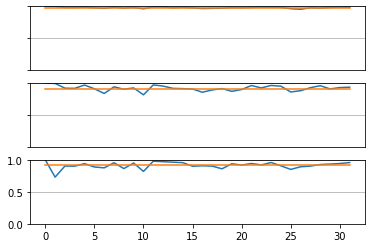

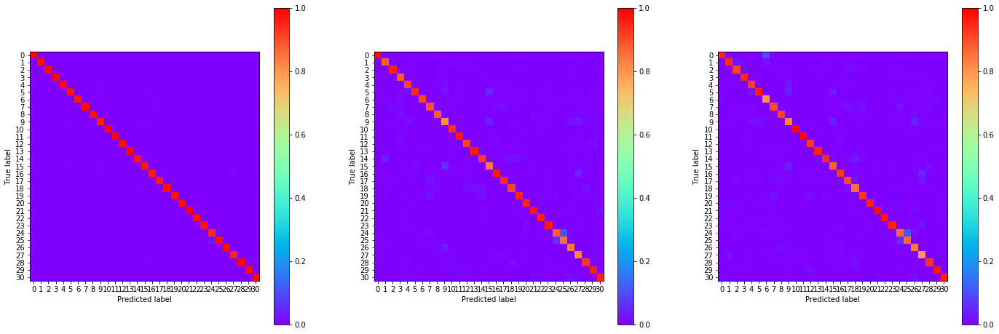

00:49:53.853089
#135 [Train: 0.073] [Test: 0.358] [Valid: 0.394]
#135 [Train: 0.979] [Test: 0.915] [Valid: 0.907]


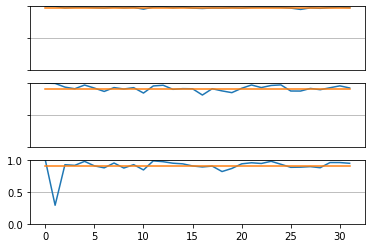

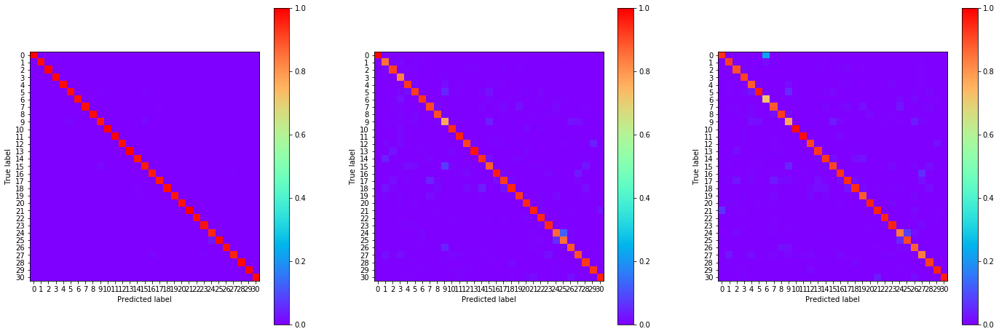

00:50:35.613634
#136 [Train: 0.078] [Test: 0.336] [Valid: 0.357]
#136 [Train: 0.977] [Test: 0.916] [Valid: 0.913]


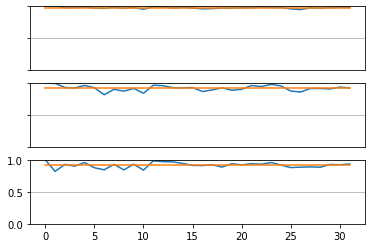

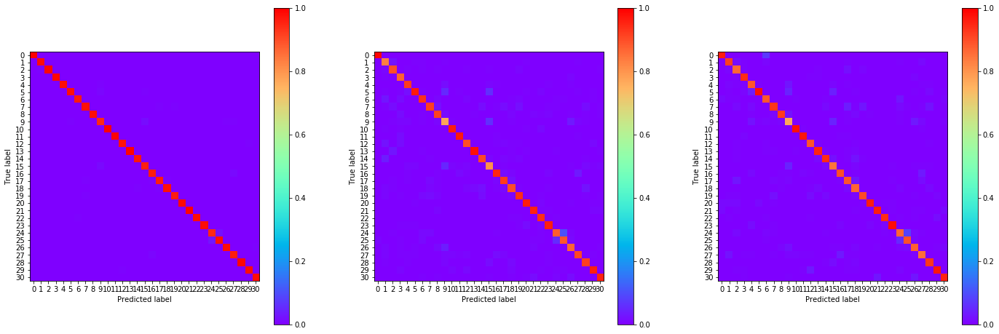

00:51:17.144843
#137 [Train: 0.076] [Test: 0.348] [Valid: 0.366]
#137 [Train: 0.978] [Test: 0.915] [Valid: 0.909]


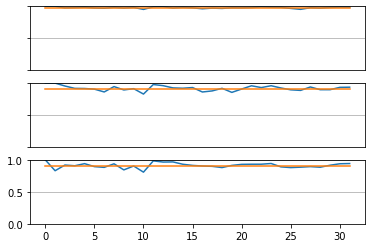

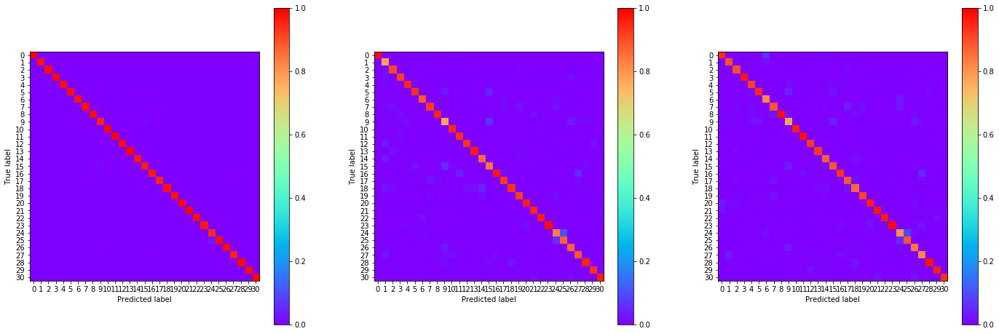

00:51:58.611385
#138 [Train: 0.078] [Test: 0.336] [Valid: 0.362]
#138 [Train: 0.977] [Test: 0.914] [Valid: 0.909]


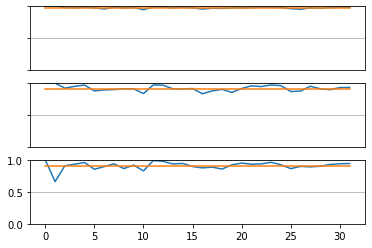

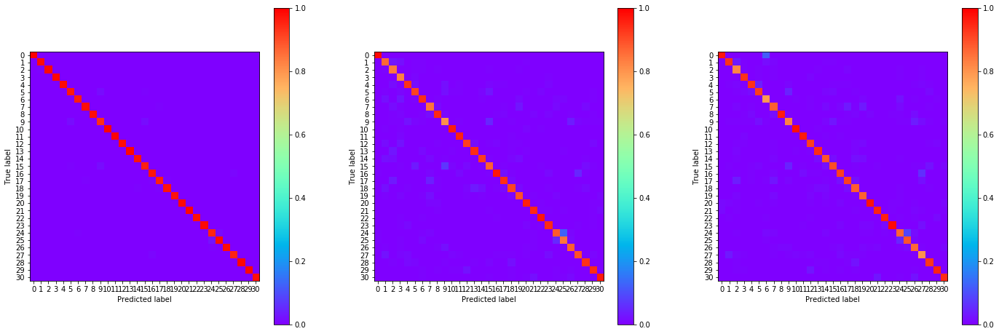

00:52:40.557036
#139 [Train: 0.079] [Test: 0.328] [Valid: 0.387]
#139 [Train: 0.976] [Test: 0.916] [Valid: 0.907]


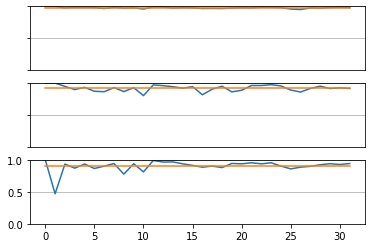

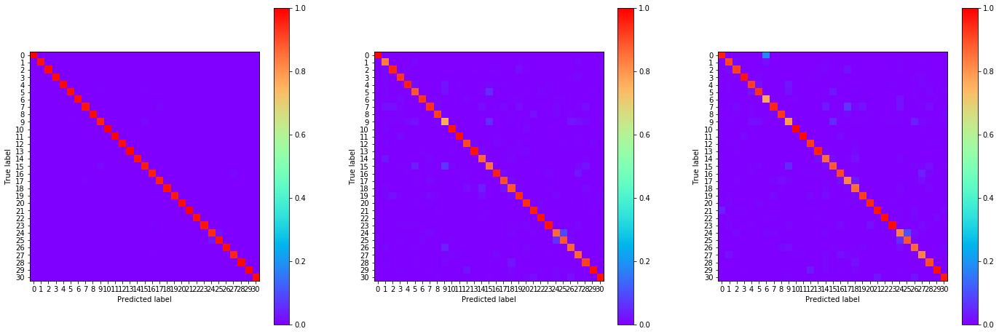

00:53:21.914001
#140 [Train: 0.069] [Test: 0.362] [Valid: 0.387]
#140 [Train: 0.980] [Test: 0.914] [Valid: 0.911]


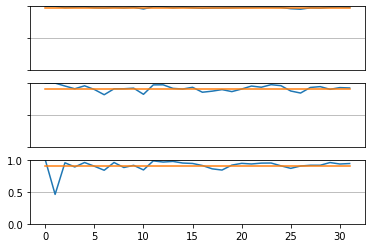

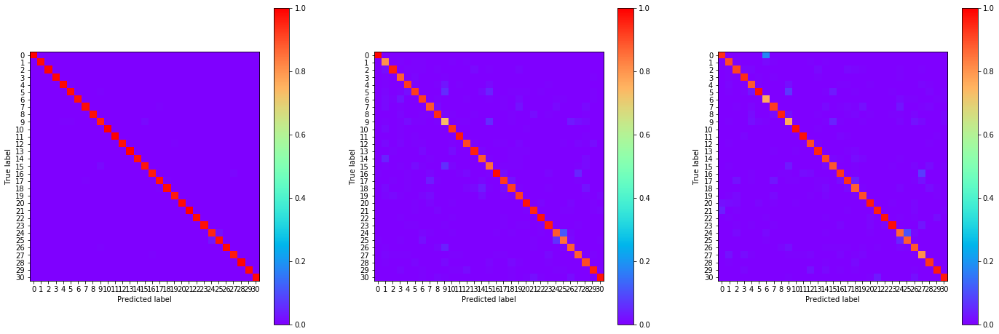

00:54:03.894895
#141 [Train: 0.066] [Test: 0.357] [Valid: 0.398]
#141 [Train: 0.982] [Test: 0.916] [Valid: 0.906]


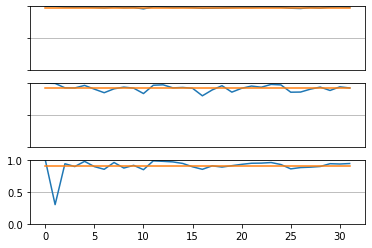

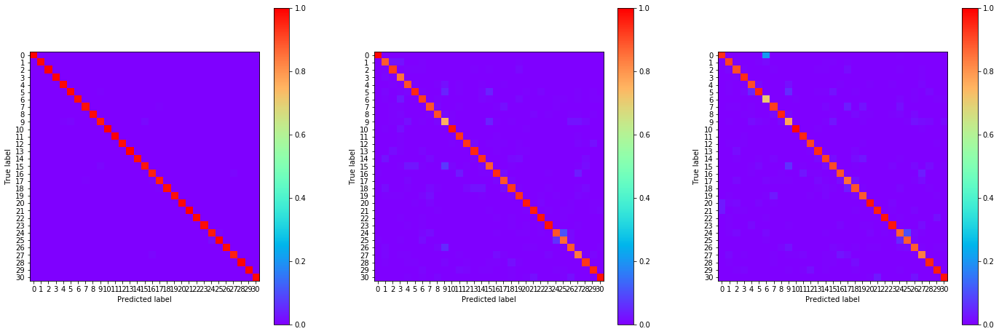

00:56:08.055814
#144 [Train: 0.063] [Test: 0.363] [Valid: 0.349]
#144 [Train: 0.982] [Test: 0.915] [Valid: 0.915]


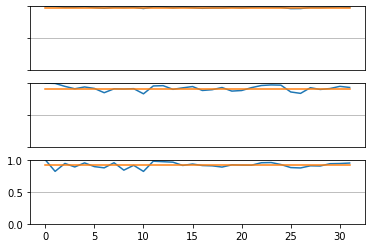

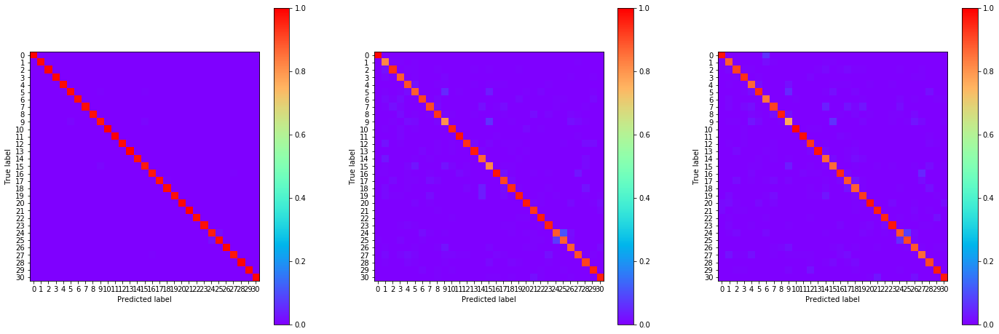

00:56:49.595769
#145 [Train: 0.067] [Test: 0.359] [Valid: 0.374]
#145 [Train: 0.980] [Test: 0.914] [Valid: 0.911]


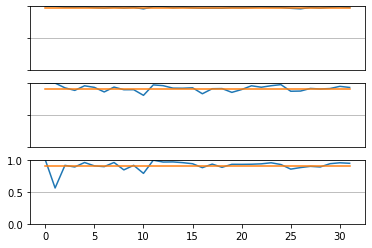

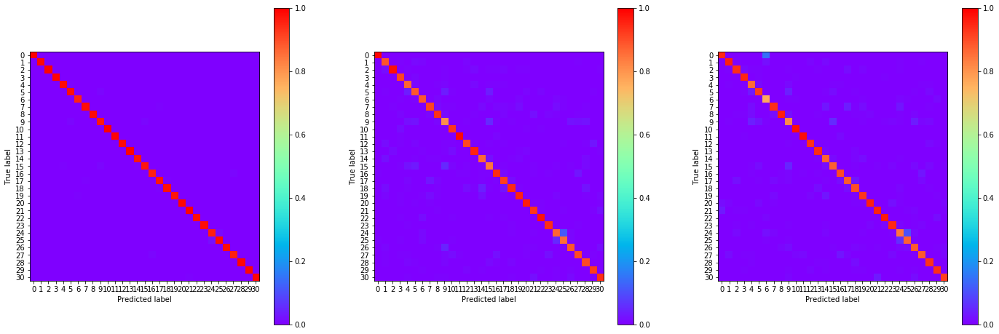

00:57:30.810747
#146 [Train: 0.068] [Test: 0.379] [Valid: 0.357]
#146 [Train: 0.979] [Test: 0.913] [Valid: 0.915]


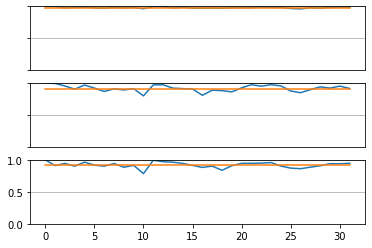

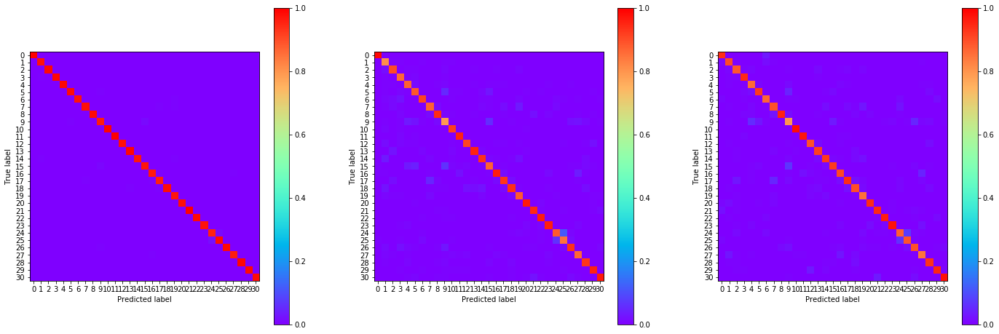

00:58:12.564330
#147 [Train: 0.062] [Test: 0.344] [Valid: 0.349]
#147 [Train: 0.982] [Test: 0.916] [Valid: 0.913]


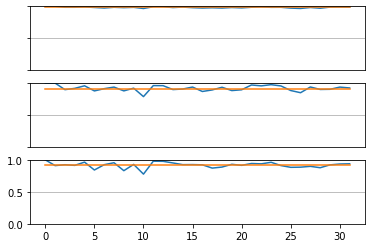

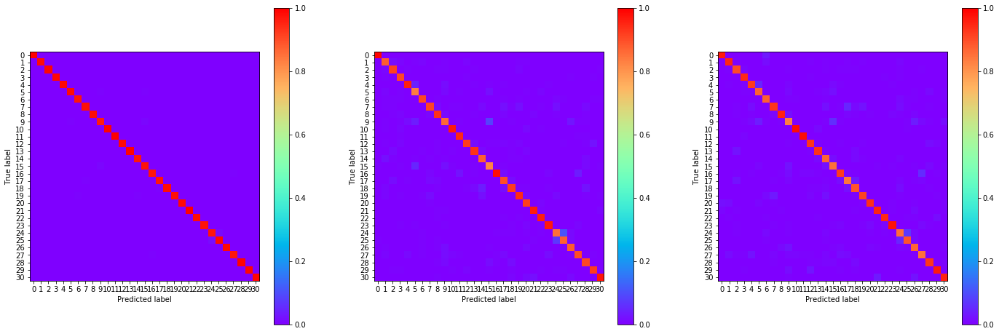

00:58:53.550972
#148 [Train: 0.067] [Test: 0.352] [Valid: 0.367]
#148 [Train: 0.981] [Test: 0.917] [Valid: 0.911]


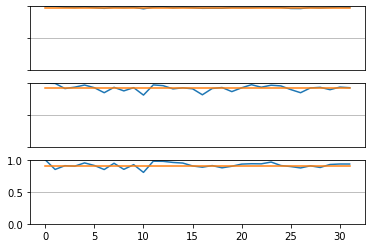

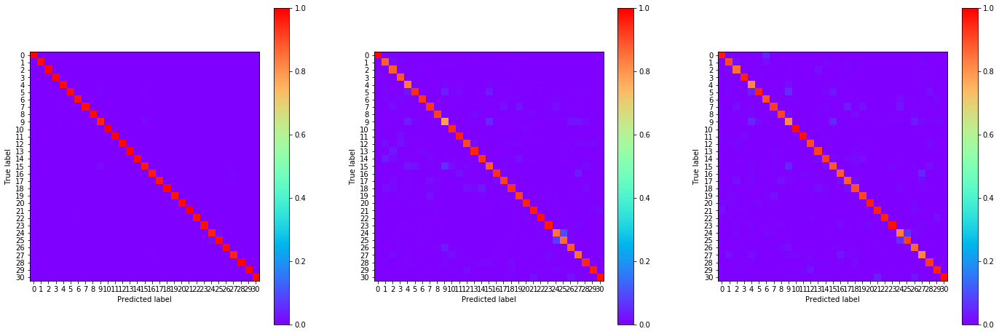

00:59:35.249031
#149 [Train: 0.061] [Test: 0.330] [Valid: 0.375]
#149 [Train: 0.983] [Test: 0.919] [Valid: 0.913]


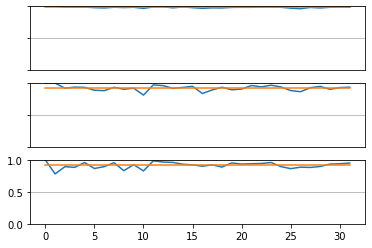

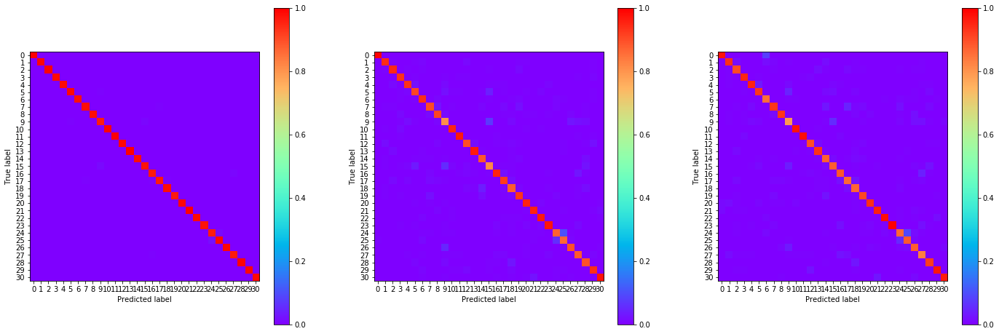

01:00:16.471646
#150 [Train: 0.061] [Test: 0.370] [Valid: 0.388]
#150 [Train: 0.982] [Test: 0.918] [Valid: 0.907]


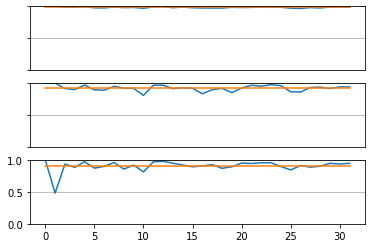

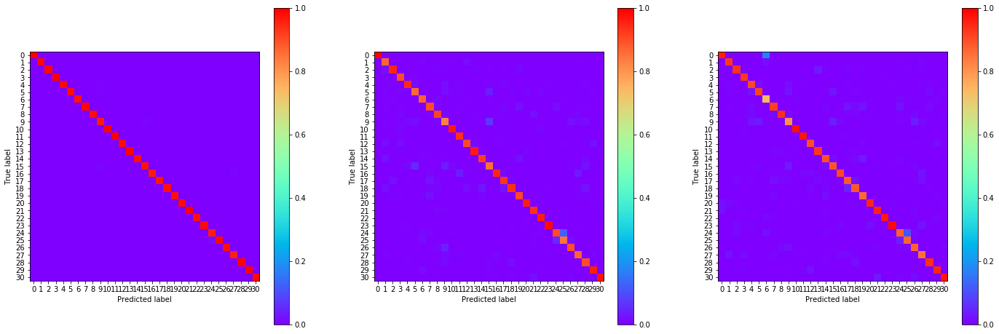

01:02:20.549036
#153 [Train: 0.057] [Test: 0.363] [Valid: 0.360]
#153 [Train: 0.983] [Test: 0.919] [Valid: 0.916]


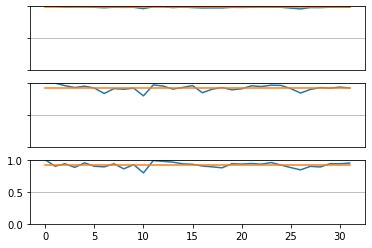

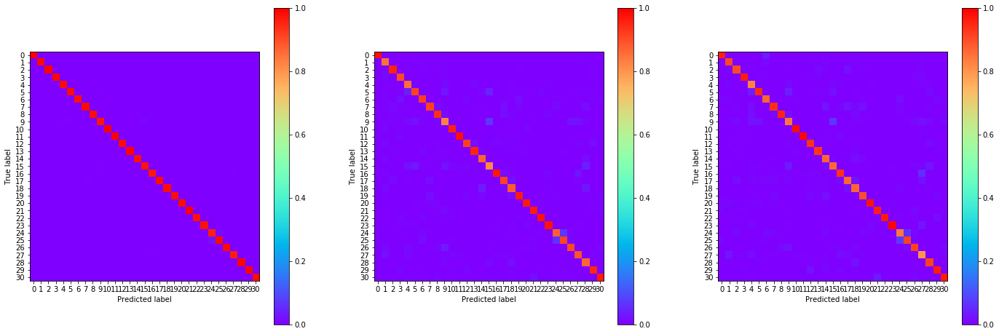

01:03:01.687933
#154 [Train: 0.056] [Test: 0.345] [Valid: 0.364]
#154 [Train: 0.984] [Test: 0.917] [Valid: 0.914]


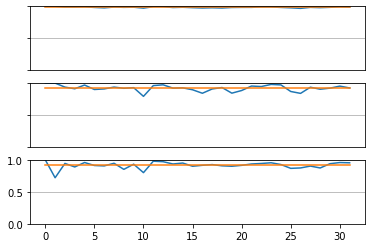

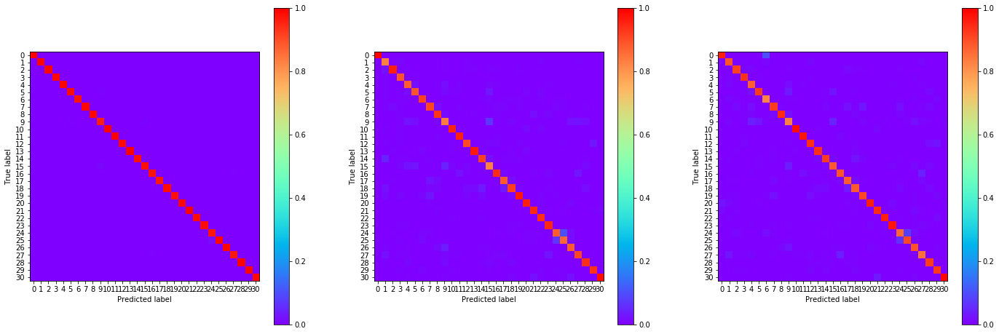

01:03:43.018567
#155 [Train: 0.060] [Test: 0.339] [Valid: 0.418]
#155 [Train: 0.983] [Test: 0.914] [Valid: 0.909]


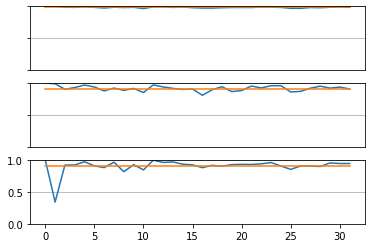

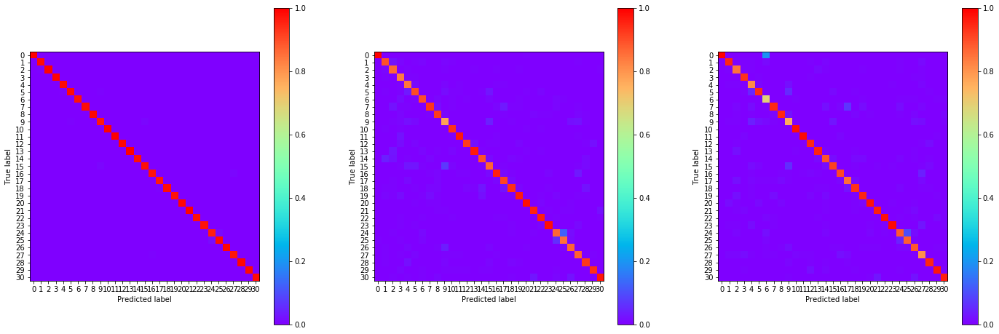

01:04:24.318141
#156 [Train: 0.063] [Test: 0.360] [Valid: 0.349]
#156 [Train: 0.981] [Test: 0.916] [Valid: 0.918]


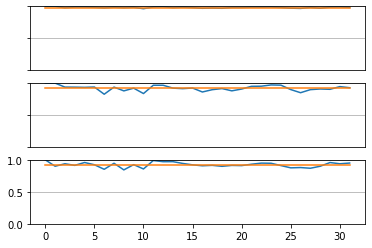

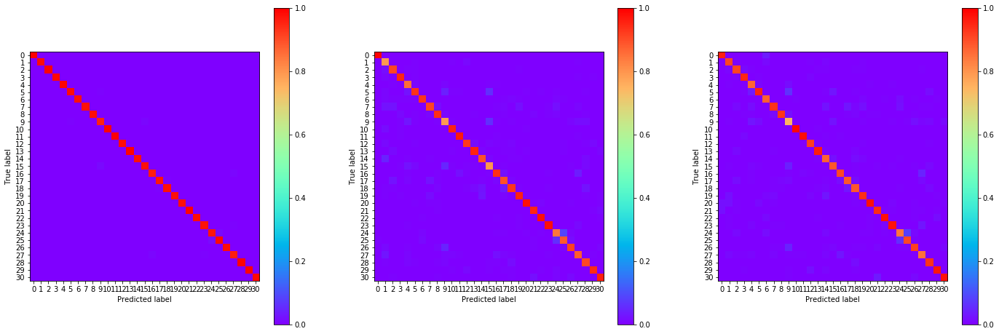

01:05:05.988261
#157 [Train: 0.055] [Test: 0.363] [Valid: 0.386]
#157 [Train: 0.985] [Test: 0.915] [Valid: 0.909]


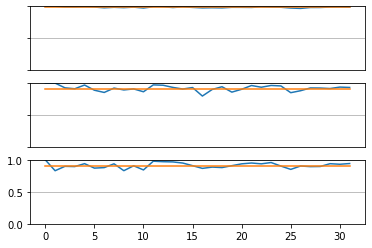

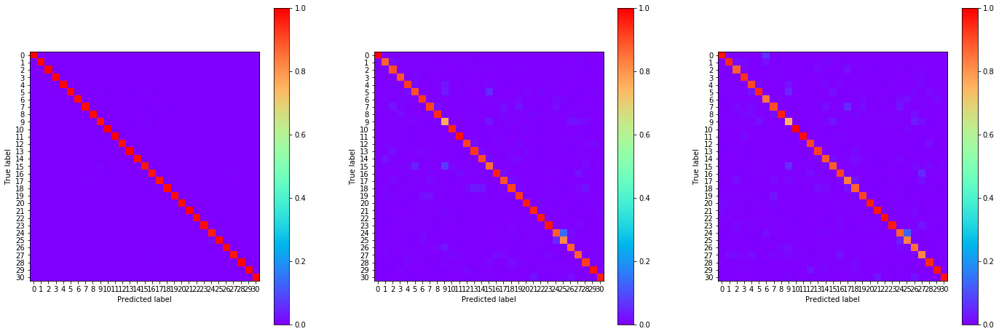

01:05:47.258188
#158 [Train: 0.052] [Test: 0.365] [Valid: 0.382]
#158 [Train: 0.986] [Test: 0.916] [Valid: 0.911]


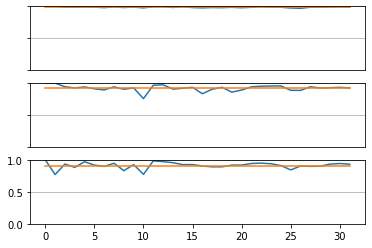

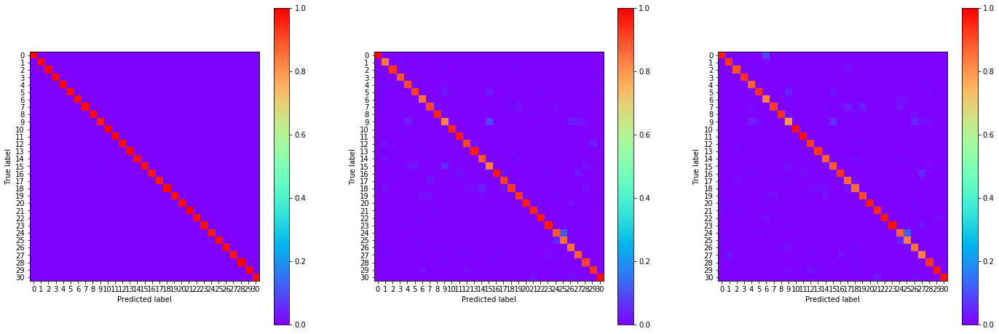

01:06:29.565301
#159 [Train: 0.049] [Test: 0.358] [Valid: 0.399]
#159 [Train: 0.986] [Test: 0.918] [Valid: 0.910]


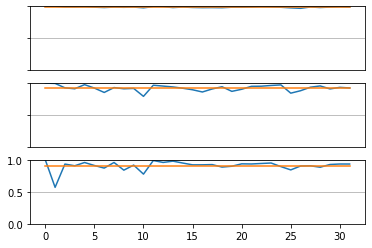

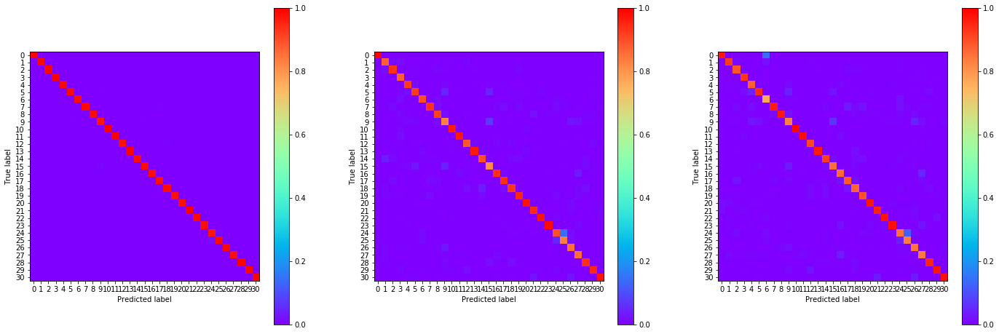

01:07:10.731852
#160 [Train: 0.052] [Test: 0.370] [Valid: 0.383]
#160 [Train: 0.985] [Test: 0.918] [Valid: 0.912]


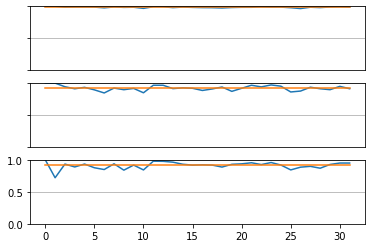

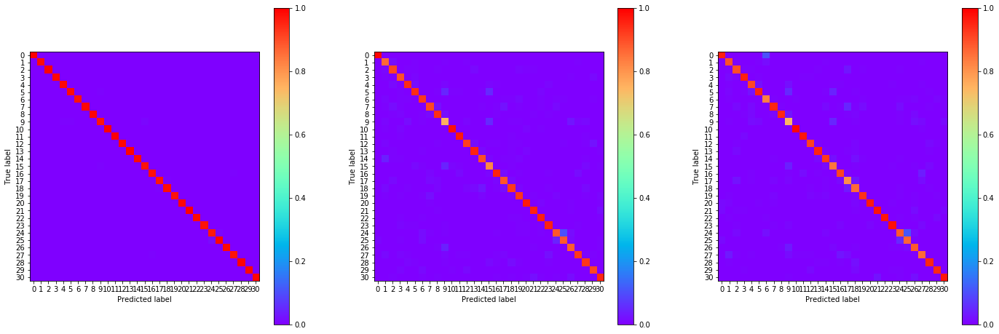

01:07:52.059013
#161 [Train: 0.060] [Test: 0.336] [Valid: 0.378]
#161 [Train: 0.982] [Test: 0.918] [Valid: 0.911]


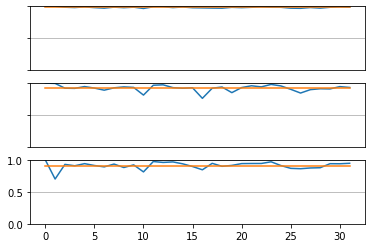

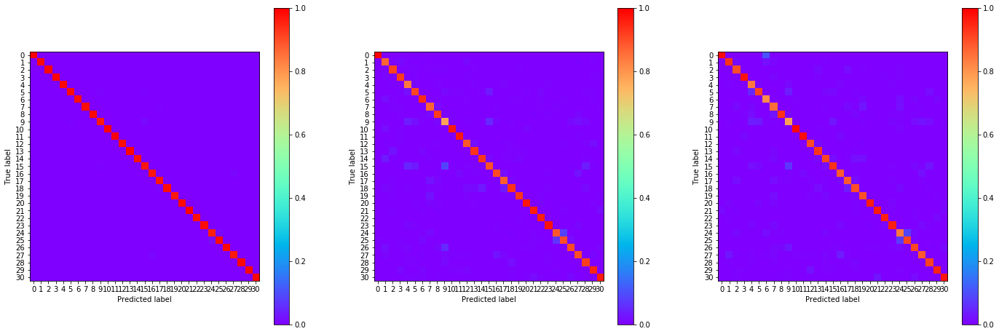

01:08:33.690669
#162 [Train: 0.052] [Test: 0.367] [Valid: 0.385]
#162 [Train: 0.985] [Test: 0.919] [Valid: 0.915]


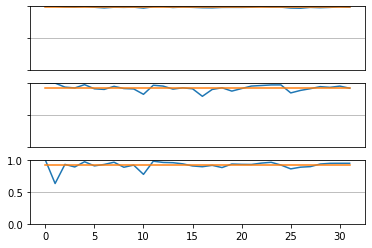

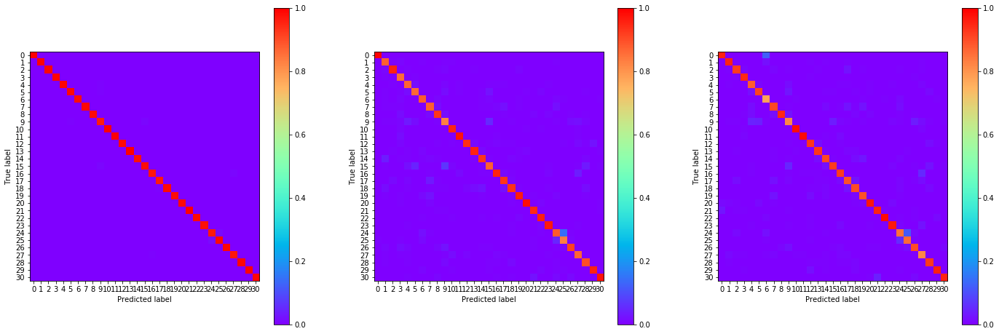

01:09:15.117455
#163 [Train: 0.049] [Test: 0.378] [Valid: 0.380]
#163 [Train: 0.986] [Test: 0.918] [Valid: 0.912]


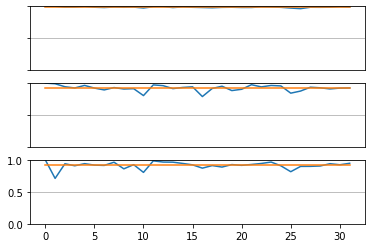

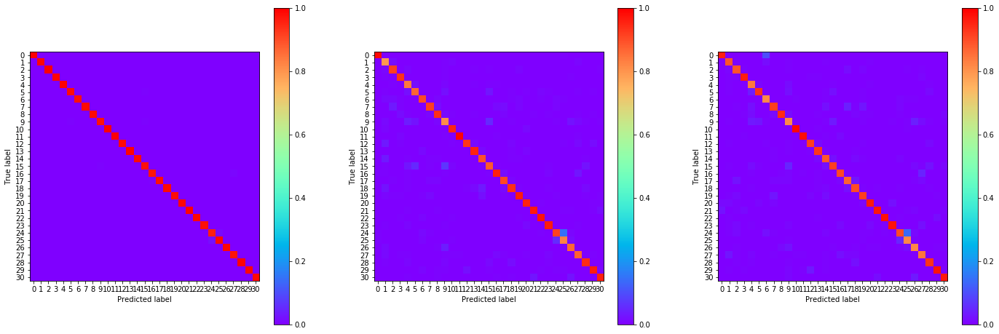

01:09:56.206328
#164 [Train: 0.048] [Test: 0.380] [Valid: 0.376]
#164 [Train: 0.986] [Test: 0.914] [Valid: 0.916]


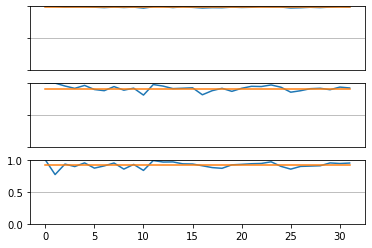

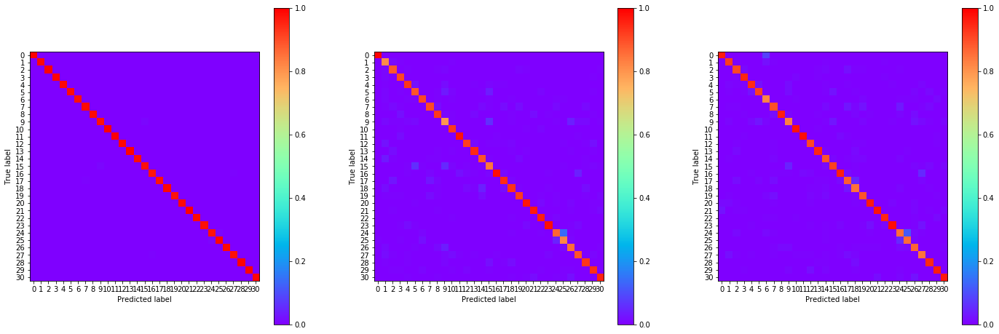

01:10:37.888199
#165 [Train: 0.049] [Test: 0.372] [Valid: 0.373]
#165 [Train: 0.986] [Test: 0.918] [Valid: 0.917]


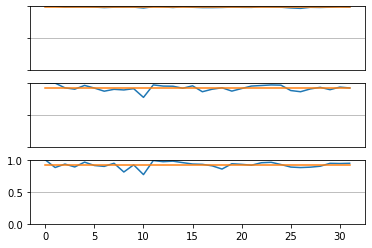

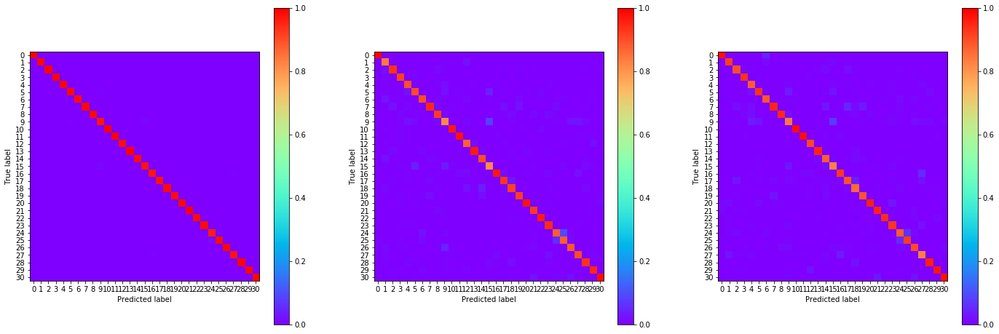

01:11:18.970210
#166 [Train: 0.057] [Test: 0.388] [Valid: 0.382]
#166 [Train: 0.983] [Test: 0.913] [Valid: 0.913]


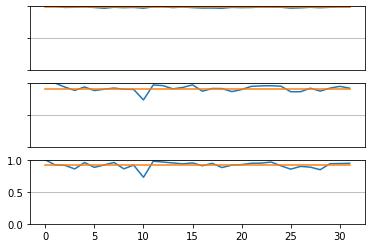

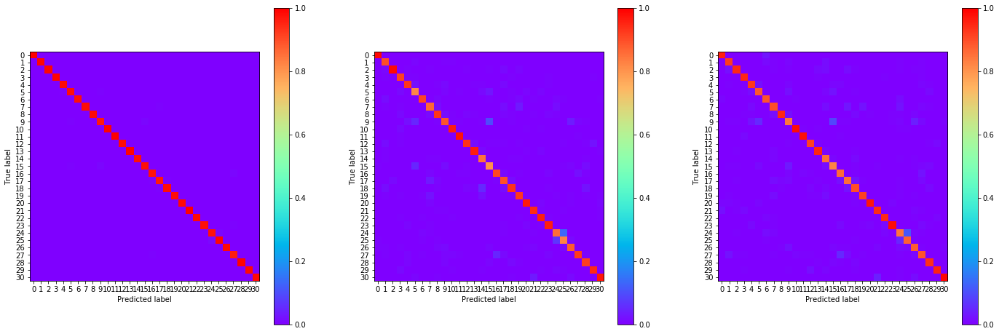

01:12:00.282053
#167 [Train: 0.060] [Test: 0.368] [Valid: 0.392]
#167 [Train: 0.982] [Test: 0.918] [Valid: 0.911]


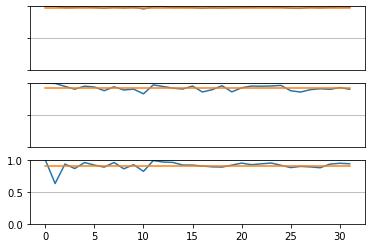

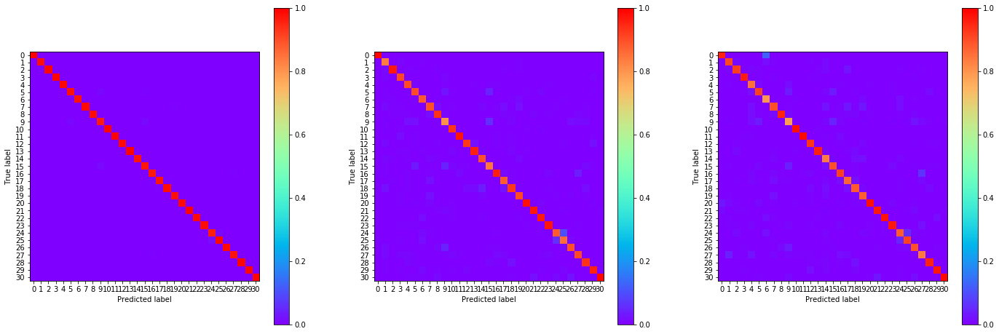

01:12:41.337175
#168 [Train: 0.052] [Test: 0.393] [Valid: 0.389]
#168 [Train: 0.985] [Test: 0.915] [Valid: 0.913]


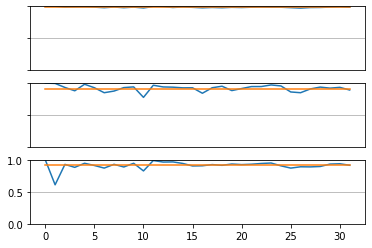

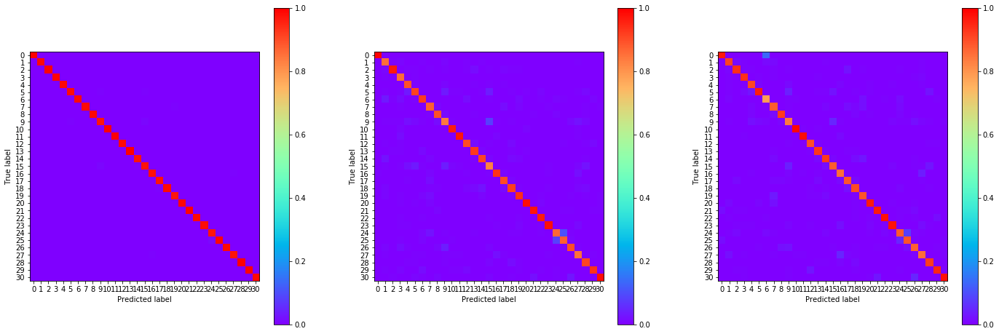

01:13:23.024139
#169 [Train: 0.051] [Test: 0.361] [Valid: 0.374]
#169 [Train: 0.985] [Test: 0.920] [Valid: 0.916]


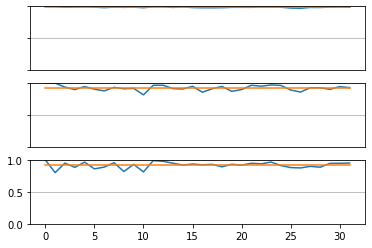

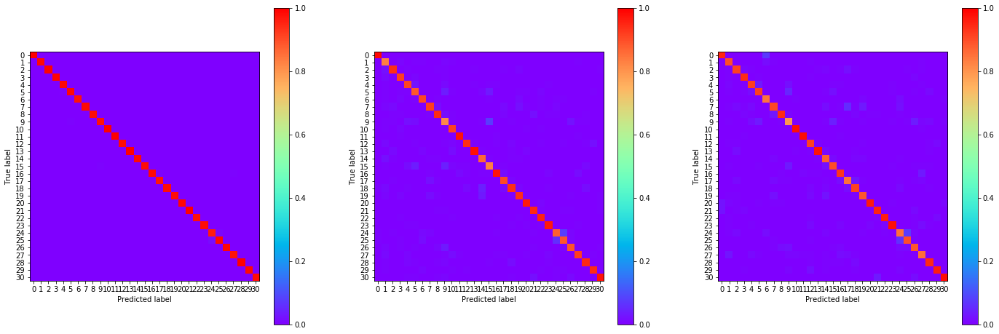

01:14:04.050736
#170 [Train: 0.044] [Test: 0.349] [Valid: 0.371]
#170 [Train: 0.988] [Test: 0.921] [Valid: 0.916]


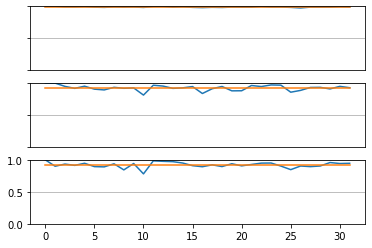

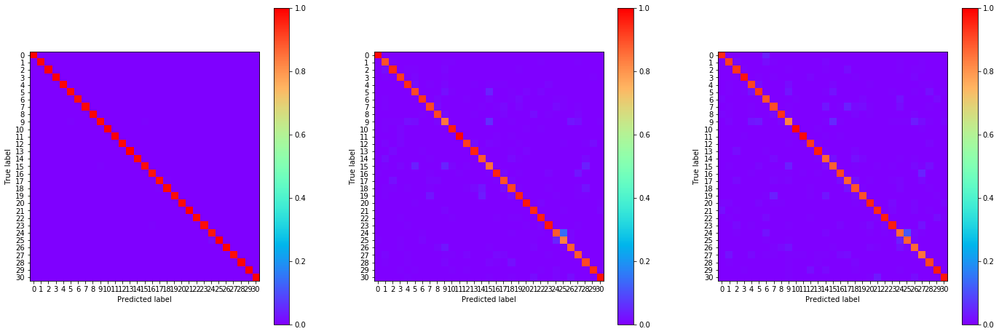

01:14:45.699003
#171 [Train: 0.042] [Test: 0.348] [Valid: 0.375]
#171 [Train: 0.988] [Test: 0.920] [Valid: 0.916]


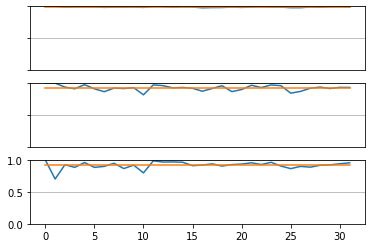

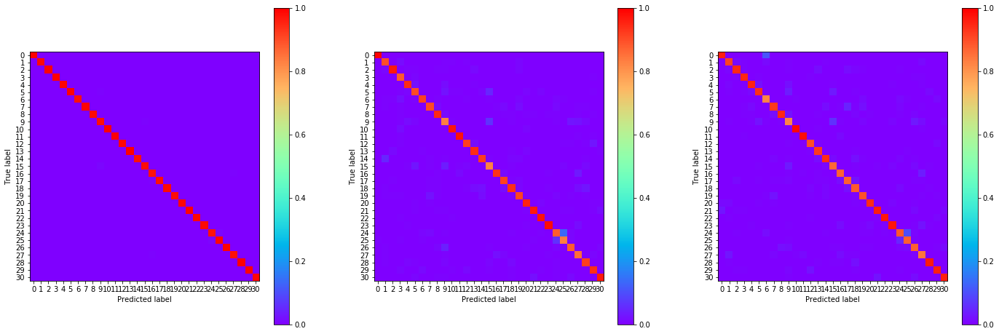

01:15:27.162023
#172 [Train: 0.042] [Test: 0.366] [Valid: 0.389]
#172 [Train: 0.988] [Test: 0.920] [Valid: 0.914]


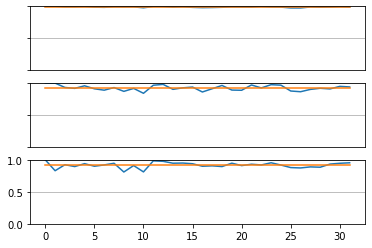

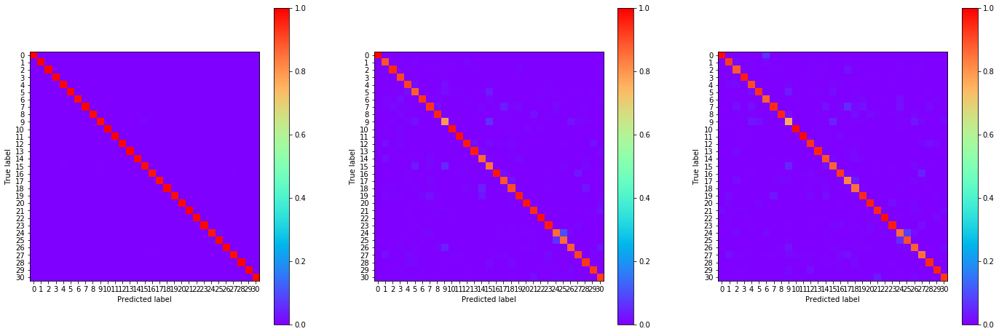

01:16:08.690476
#173 [Train: 0.046] [Test: 0.379] [Valid: 0.388]
#173 [Train: 0.987] [Test: 0.919] [Valid: 0.916]


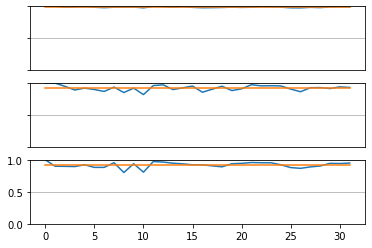

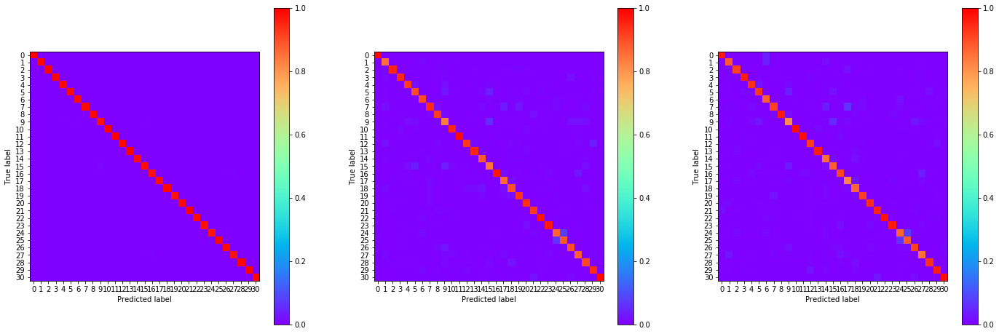

01:16:49.873108
#174 [Train: 0.048] [Test: 0.385] [Valid: 0.382]
#174 [Train: 0.986] [Test: 0.916] [Valid: 0.915]


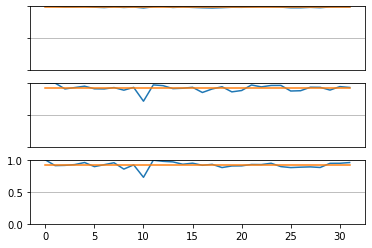

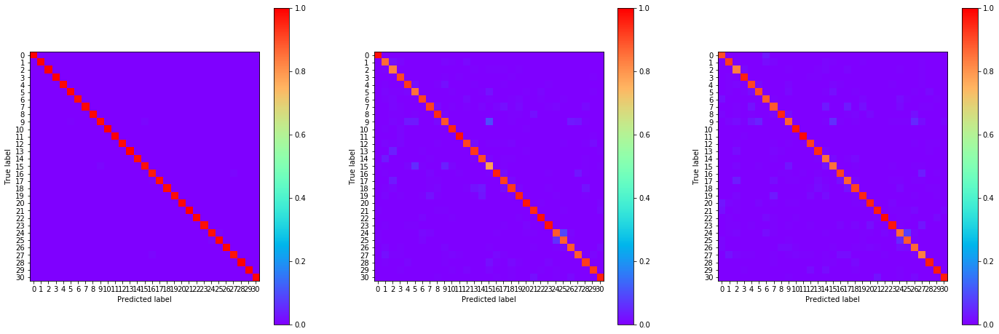

01:17:31.209277
#175 [Train: 0.047] [Test: 0.389] [Valid: 0.380]
#175 [Train: 0.986] [Test: 0.918] [Valid: 0.916]


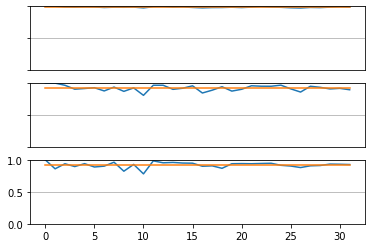

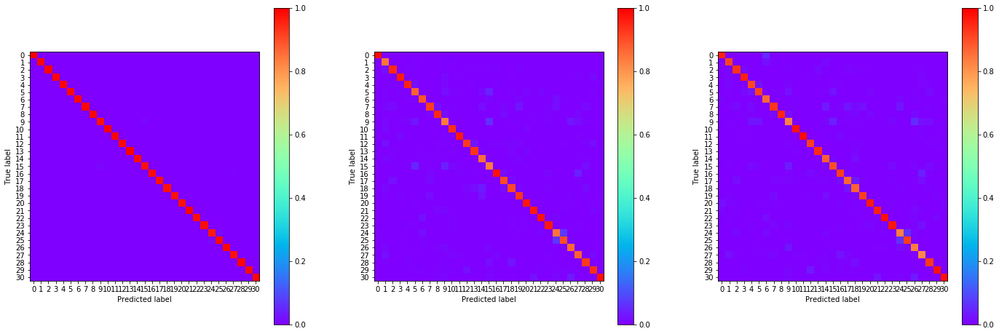

01:18:12.425269
#176 [Train: 0.044] [Test: 0.385] [Valid: 0.378]
#176 [Train: 0.987] [Test: 0.918] [Valid: 0.915]


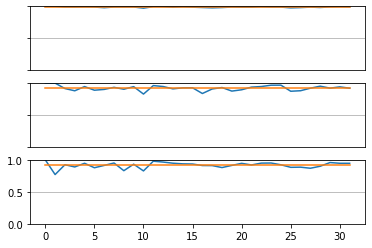

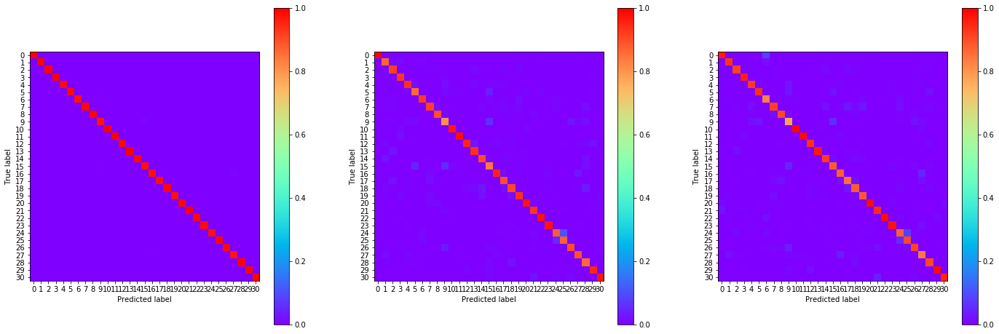

01:18:53.683619
#177 [Train: 0.041] [Test: 0.395] [Valid: 0.383]
#177 [Train: 0.989] [Test: 0.918] [Valid: 0.917]


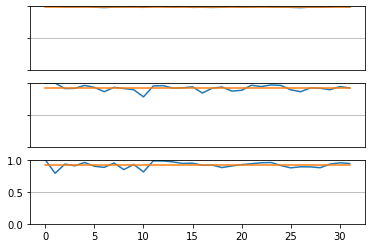

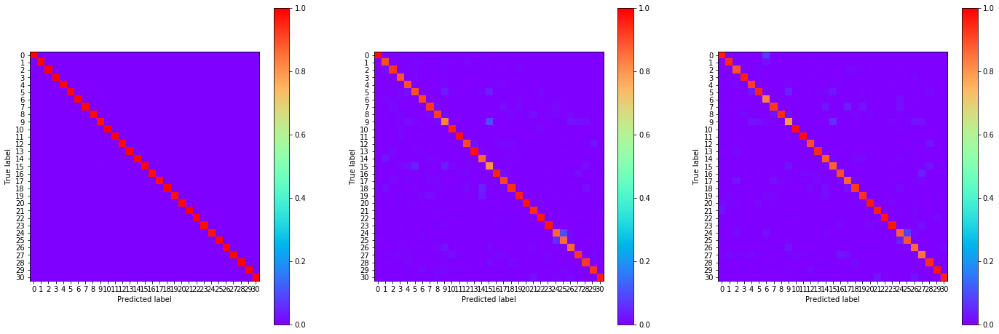

01:19:35.347649
#178 [Train: 0.044] [Test: 0.391] [Valid: 0.394]
#178 [Train: 0.988] [Test: 0.915] [Valid: 0.913]


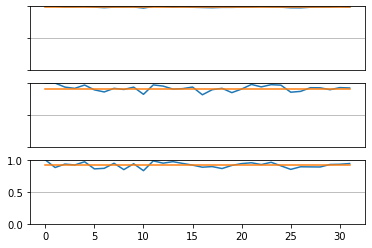

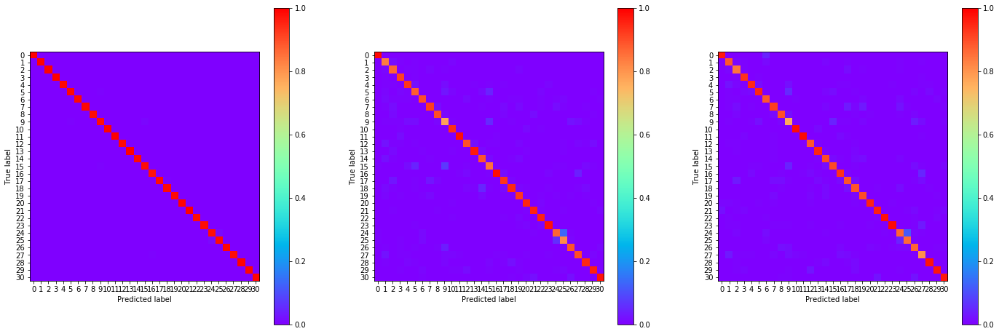

01:20:16.577219
#179 [Train: 0.042] [Test: 0.399] [Valid: 0.438]
#179 [Train: 0.988] [Test: 0.914] [Valid: 0.908]


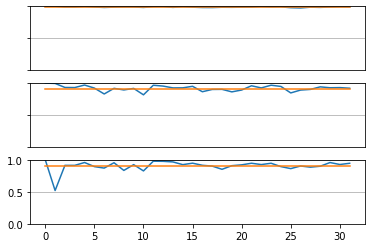

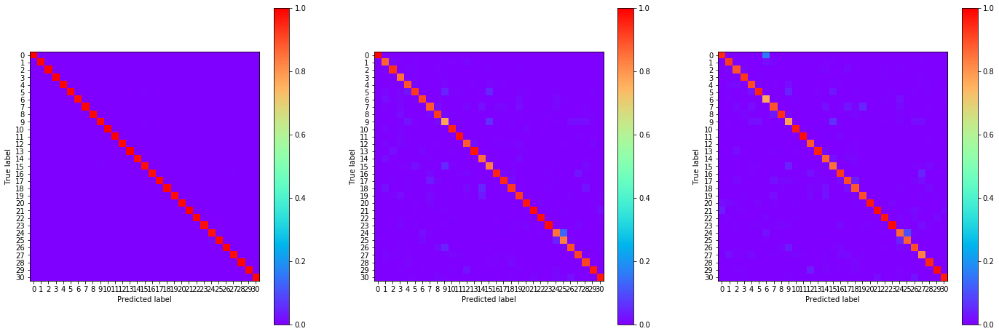

01:20:58.747163
#180 [Train: 0.042] [Test: 0.377] [Valid: 0.394]
#180 [Train: 0.988] [Test: 0.918] [Valid: 0.913]


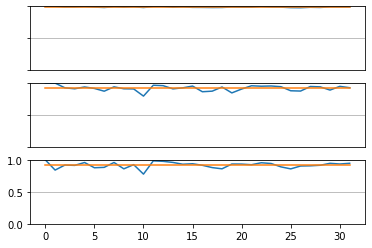

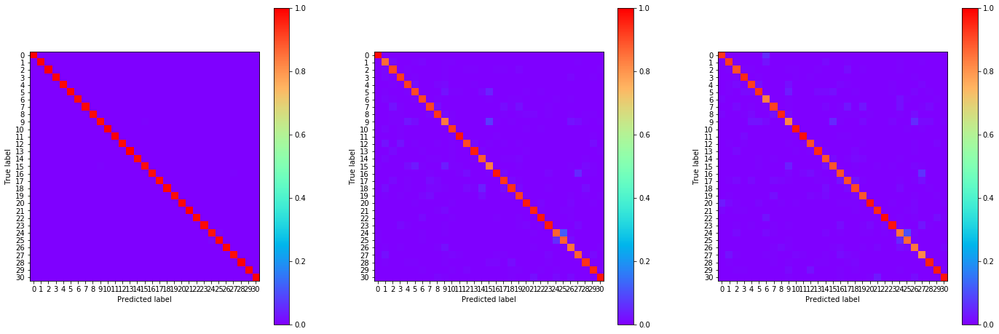

01:21:40.114355
#181 [Train: 0.046] [Test: 0.372] [Valid: 0.391]
#181 [Train: 0.986] [Test: 0.920] [Valid: 0.913]


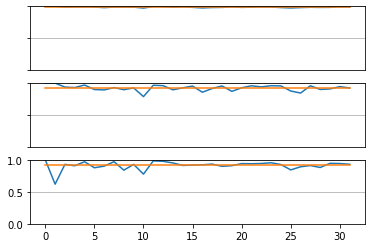

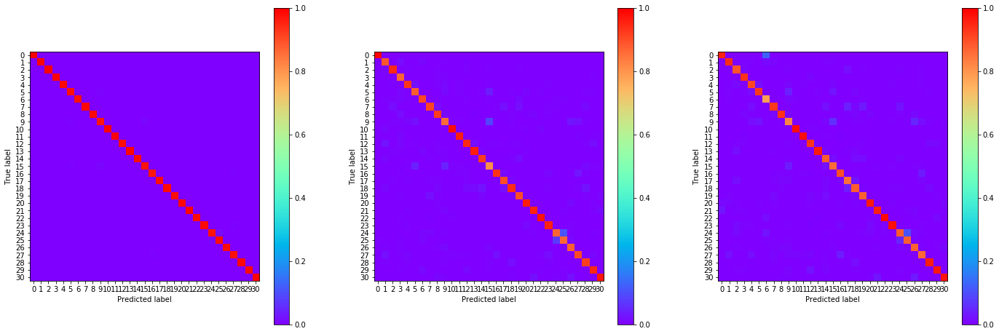

01:22:21.153448
#182 [Train: 0.044] [Test: 0.417] [Valid: 0.428]
#182 [Train: 0.987] [Test: 0.913] [Valid: 0.909]


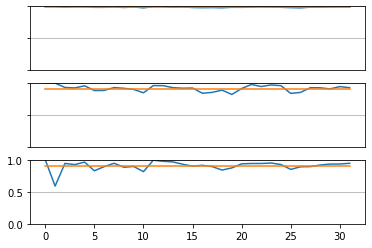

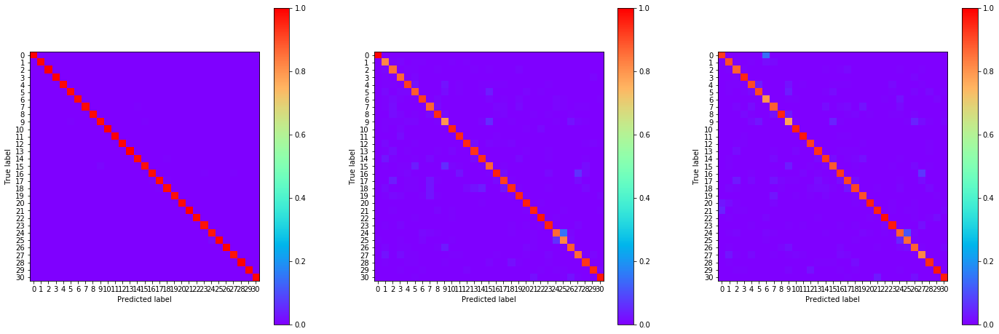

01:23:02.413653
#183 [Train: 0.039] [Test: 0.381] [Valid: 0.416]
#183 [Train: 0.989] [Test: 0.917] [Valid: 0.914]


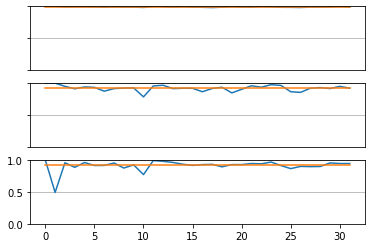

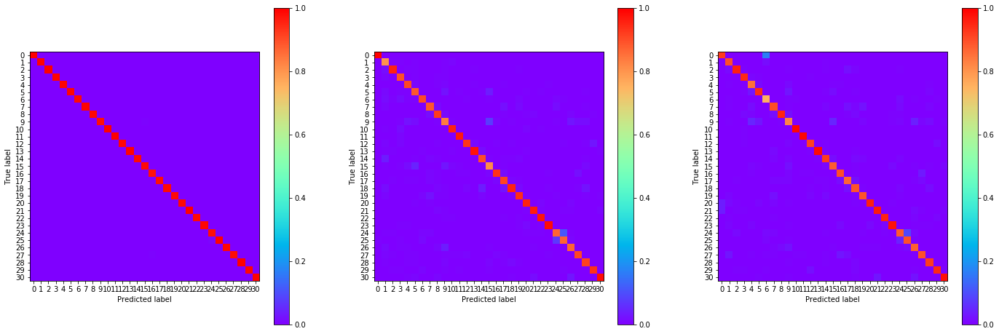

01:23:43.428946
#184 [Train: 0.038] [Test: 0.393] [Valid: 0.417]
#184 [Train: 0.989] [Test: 0.917] [Valid: 0.916]


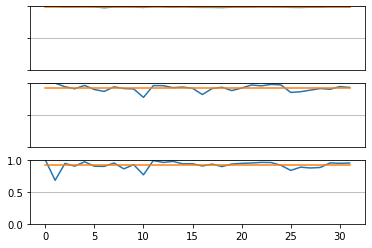

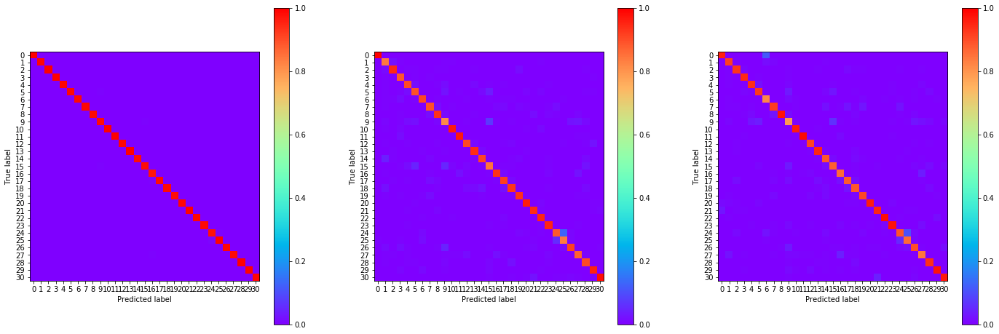

01:24:24.468488
#185 [Train: 0.041] [Test: 0.387] [Valid: 0.405]
#185 [Train: 0.988] [Test: 0.915] [Valid: 0.913]


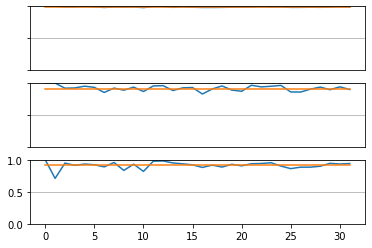

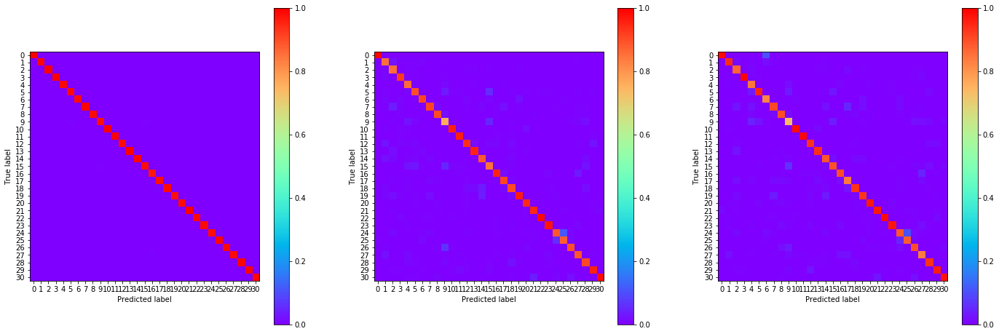

01:25:06.017329
#186 [Train: 0.046] [Test: 0.372] [Valid: 0.389]
#186 [Train: 0.987] [Test: 0.921] [Valid: 0.917]


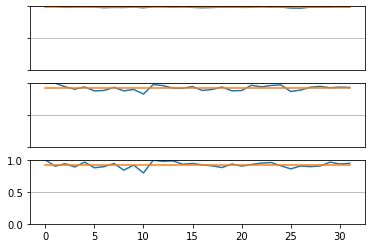

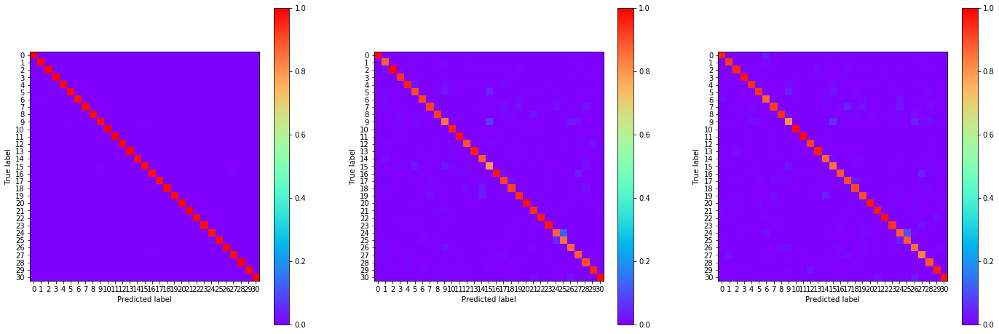

01:25:47.218282
#187 [Train: 0.043] [Test: 0.373] [Valid: 0.411]
#187 [Train: 0.987] [Test: 0.917] [Valid: 0.915]


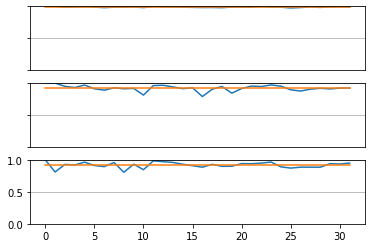

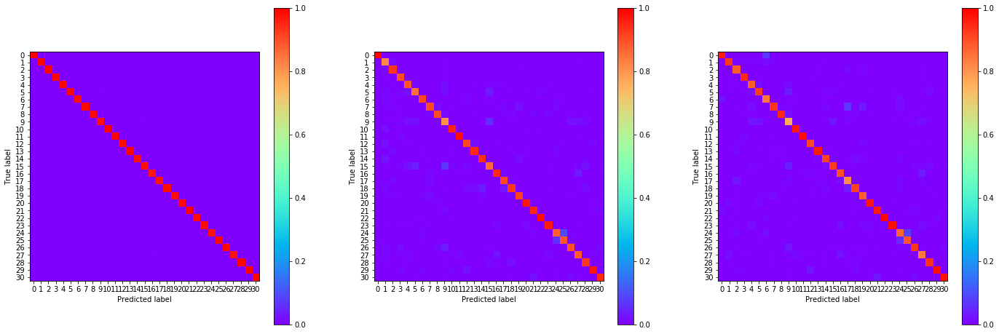

01:26:28.331839
#188 [Train: 0.043] [Test: 0.386] [Valid: 0.410]
#188 [Train: 0.988] [Test: 0.914] [Valid: 0.908]


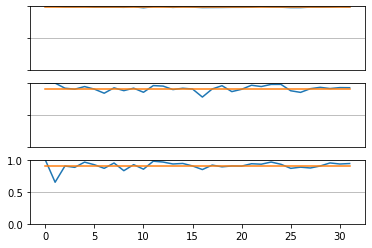

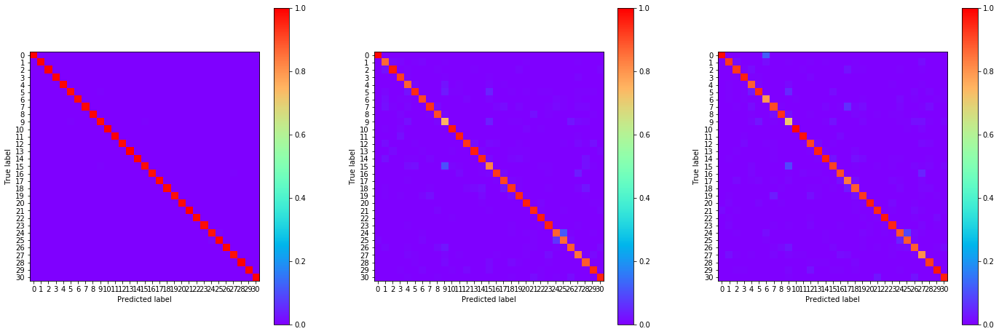

01:27:09.551496
#189 [Train: 0.041] [Test: 0.404] [Valid: 0.417]
#189 [Train: 0.989] [Test: 0.918] [Valid: 0.914]


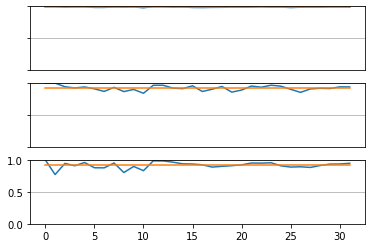

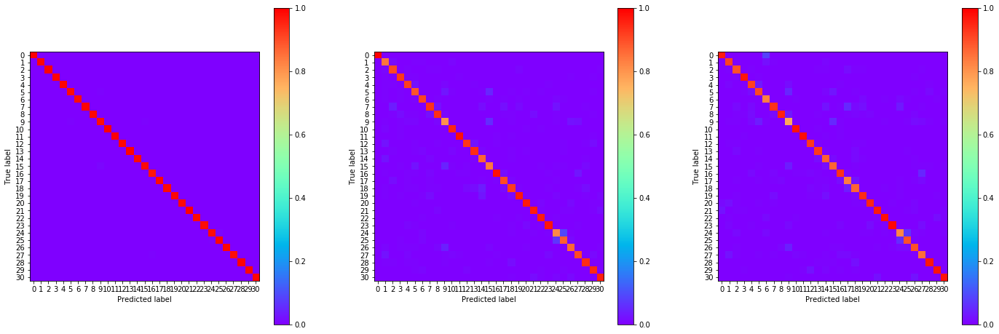

01:27:51.302986
#190 [Train: 0.036] [Test: 0.353] [Valid: 0.390]
#190 [Train: 0.989] [Test: 0.920] [Valid: 0.917]


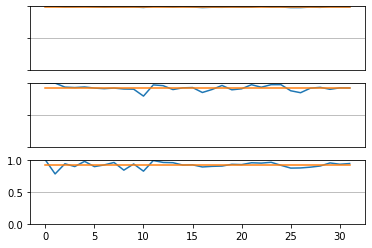

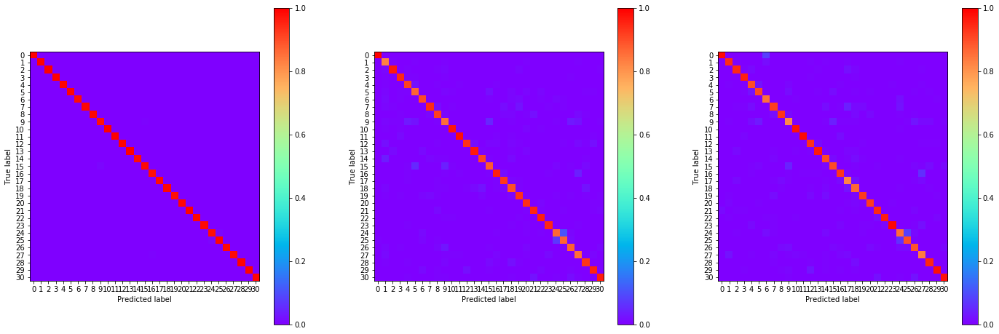

01:28:33.086579
#191 [Train: 0.032] [Test: 0.397] [Valid: 0.419]
#191 [Train: 0.991] [Test: 0.918] [Valid: 0.915]


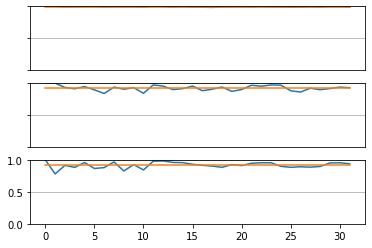

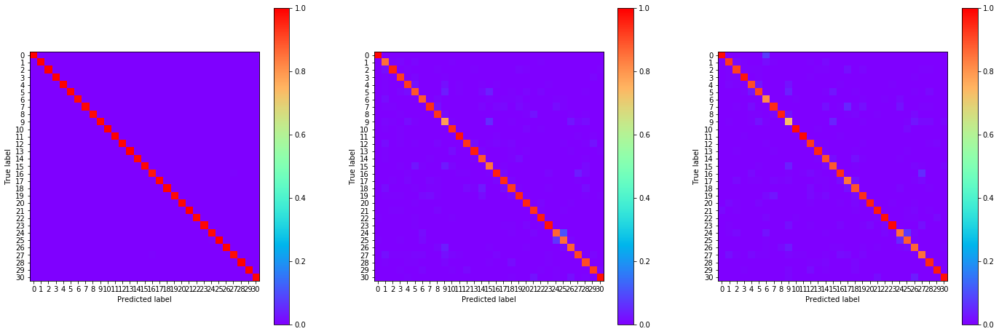

01:29:14.959324
#192 [Train: 0.034] [Test: 0.364] [Valid: 0.408]
#192 [Train: 0.991] [Test: 0.920] [Valid: 0.915]


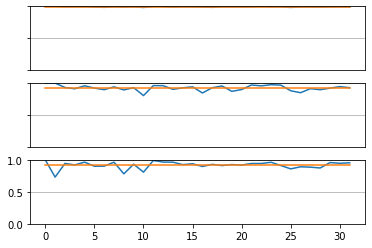

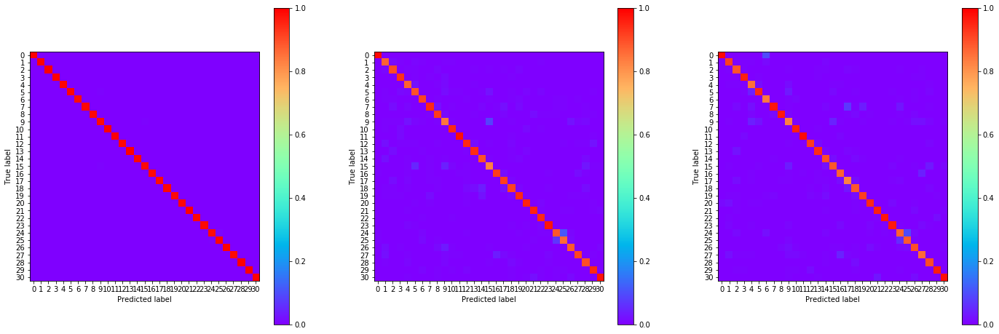

01:29:56.116431
#193 [Train: 0.036] [Test: 0.410] [Valid: 0.445]
#193 [Train: 0.990] [Test: 0.917] [Valid: 0.912]


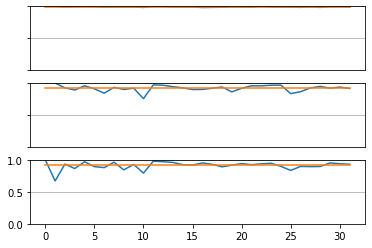

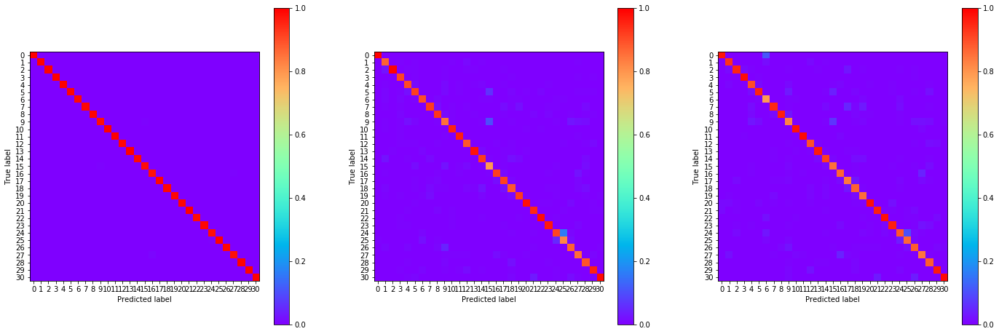

01:30:37.465938
#194 [Train: 0.042] [Test: 0.389] [Valid: 0.406]
#194 [Train: 0.988] [Test: 0.915] [Valid: 0.916]


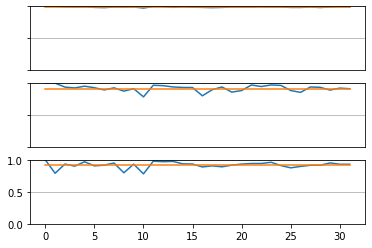

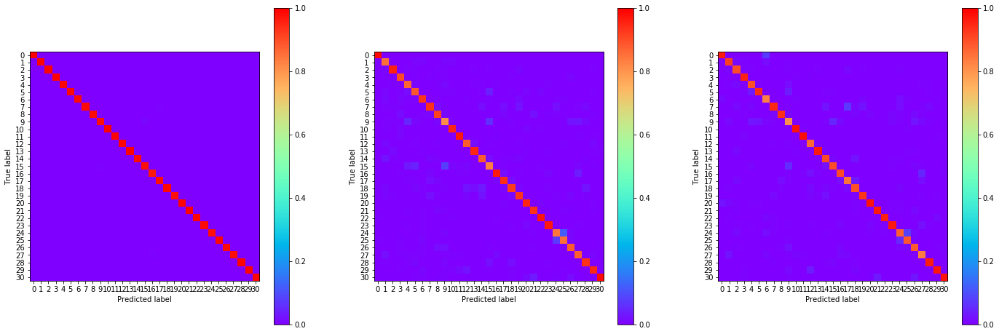

01:31:18.794255
#195 [Train: 0.039] [Test: 0.388] [Valid: 0.422]
#195 [Train: 0.989] [Test: 0.920] [Valid: 0.912]


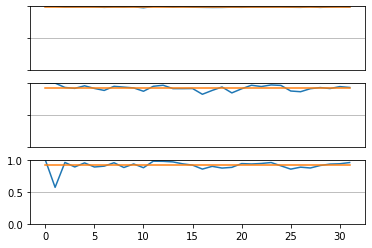

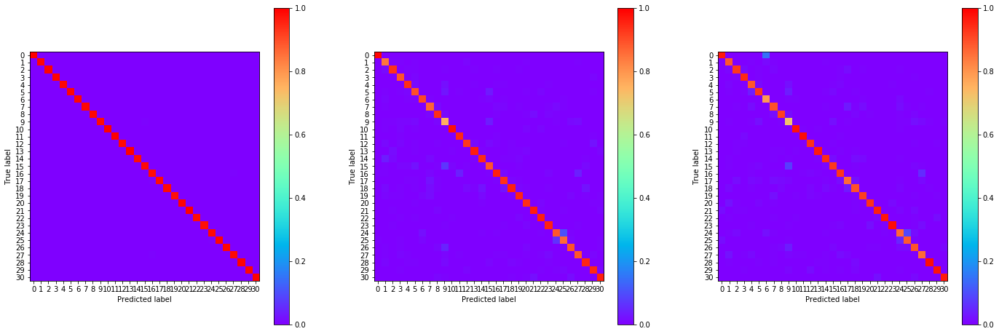

01:32:00.198372
#196 [Train: 0.036] [Test: 0.385] [Valid: 0.424]
#196 [Train: 0.990] [Test: 0.920] [Valid: 0.912]


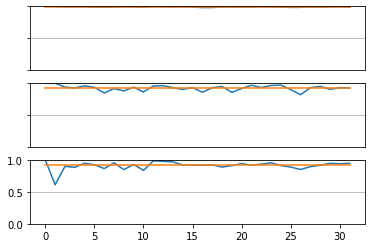

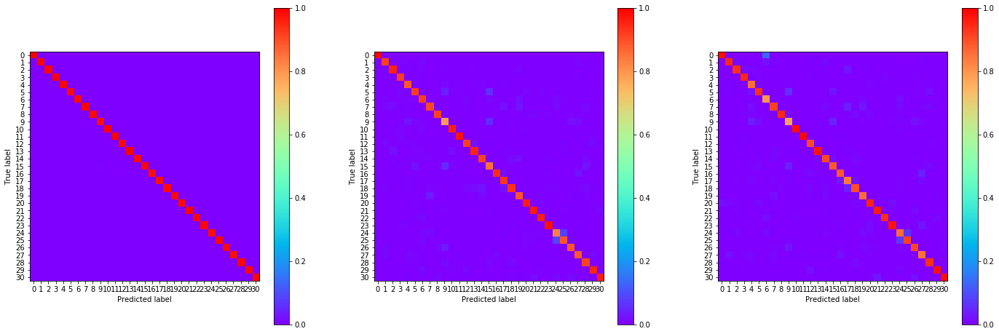

01:33:23.386765
#198 [Train: 0.036] [Test: 0.403] [Valid: 0.471]
#198 [Train: 0.989] [Test: 0.918] [Valid: 0.909]


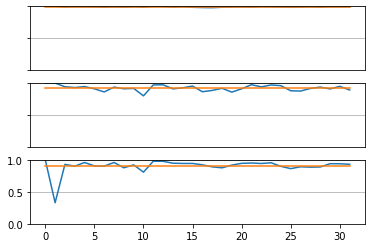

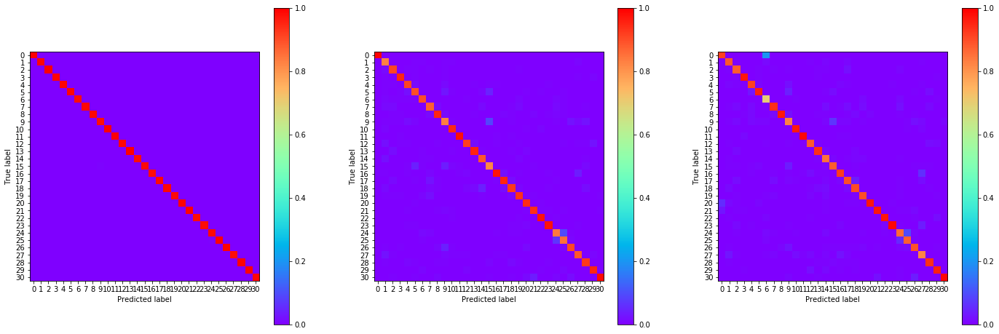

01:34:05.346713
#199 [Train: 0.040] [Test: 0.402] [Valid: 0.428]
#199 [Train: 0.989] [Test: 0.915] [Valid: 0.910]


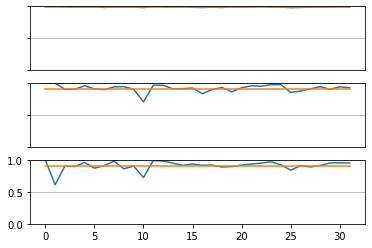

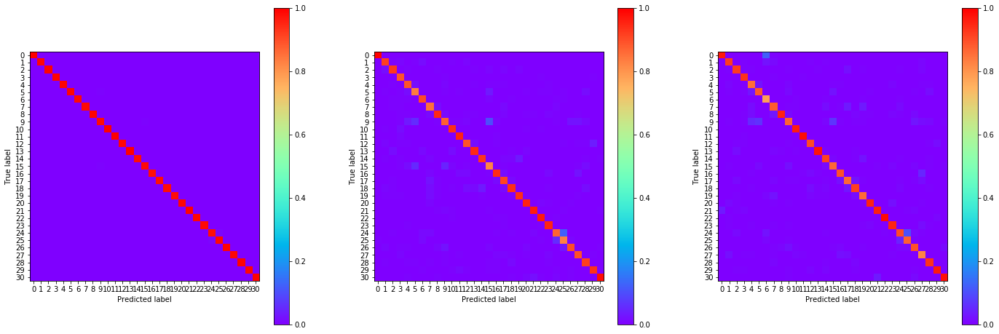

01:34:46.417896
#200 [Train: 0.034] [Test: 0.415] [Valid: 0.383]
#200 [Train: 0.991] [Test: 0.919] [Valid: 0.917]


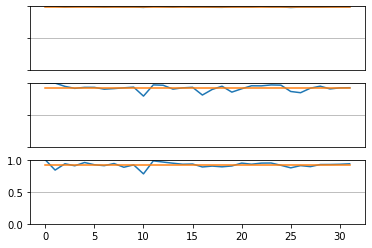

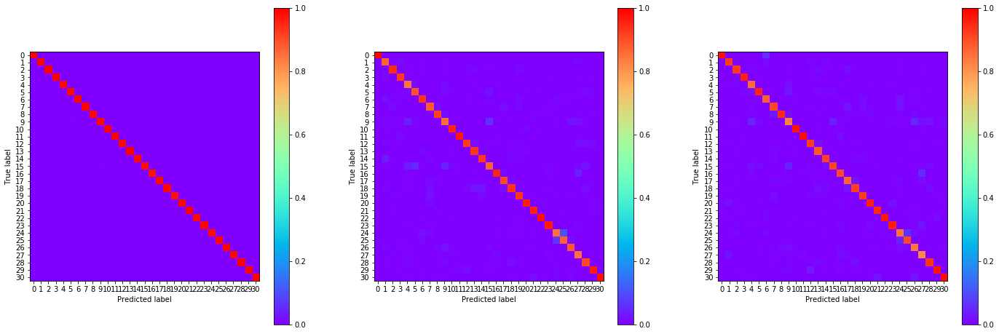

01:35:27.620495
#201 [Train: 0.034] [Test: 0.427] [Valid: 0.455]
#201 [Train: 0.990] [Test: 0.916] [Valid: 0.908]


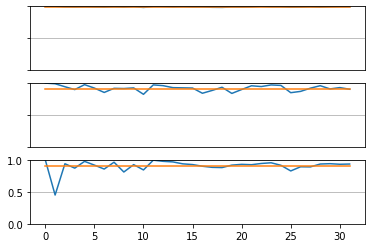

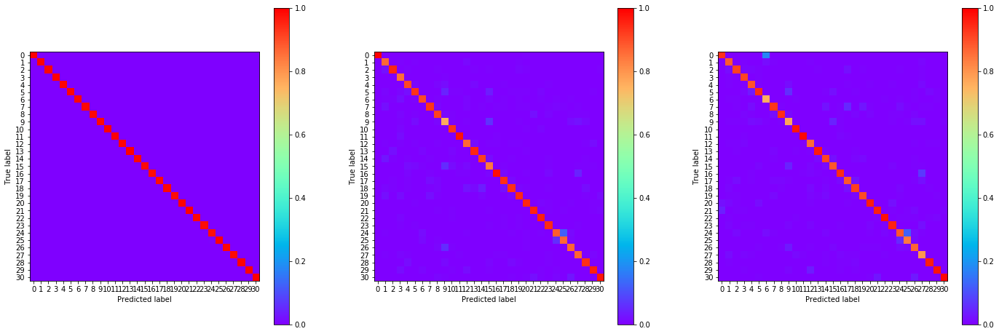

01:36:08.651695
#202 [Train: 0.034] [Test: 0.431] [Valid: 0.429]
#202 [Train: 0.991] [Test: 0.915] [Valid: 0.914]


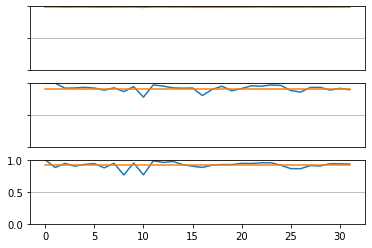

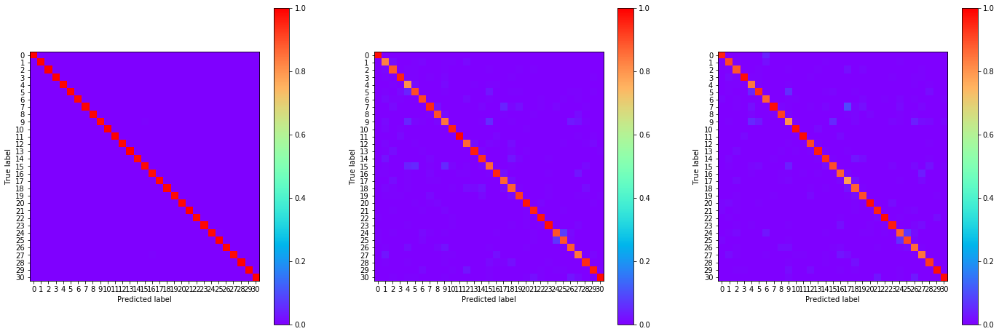

01:36:50.012471
#203 [Train: 0.033] [Test: 0.383] [Valid: 0.398]
#203 [Train: 0.991] [Test: 0.922] [Valid: 0.917]


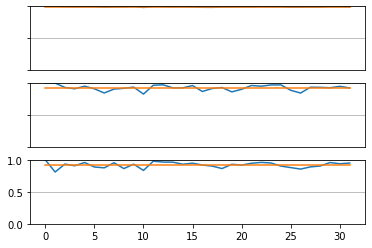

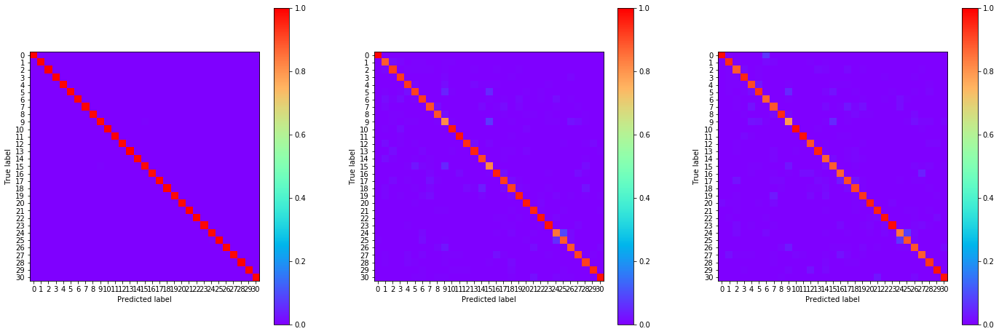

01:37:31.389611
#204 [Train: 0.028] [Test: 0.415] [Valid: 0.390]
#204 [Train: 0.992] [Test: 0.920] [Valid: 0.917]


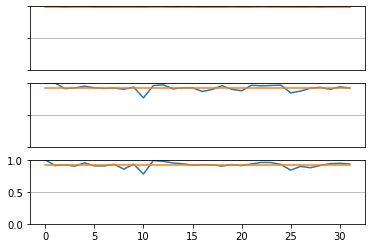

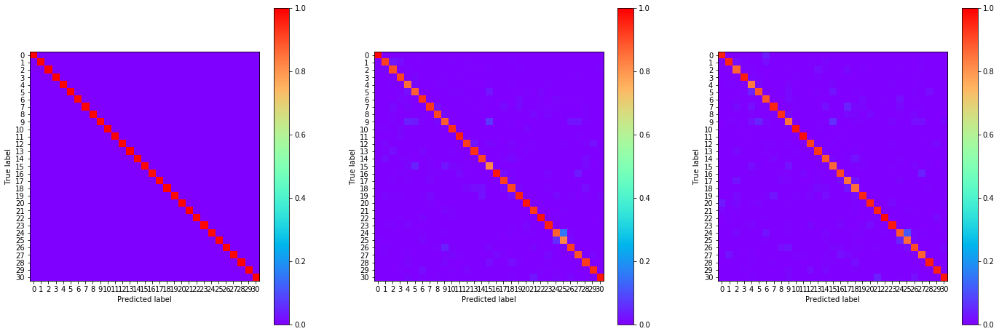

01:38:12.688725
#205 [Train: 0.036] [Test: 0.396] [Valid: 0.435]
#205 [Train: 0.990] [Test: 0.919] [Valid: 0.911]


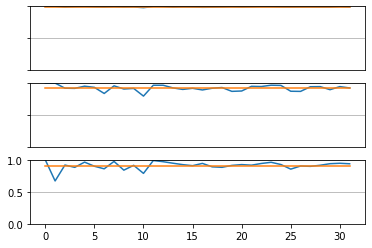

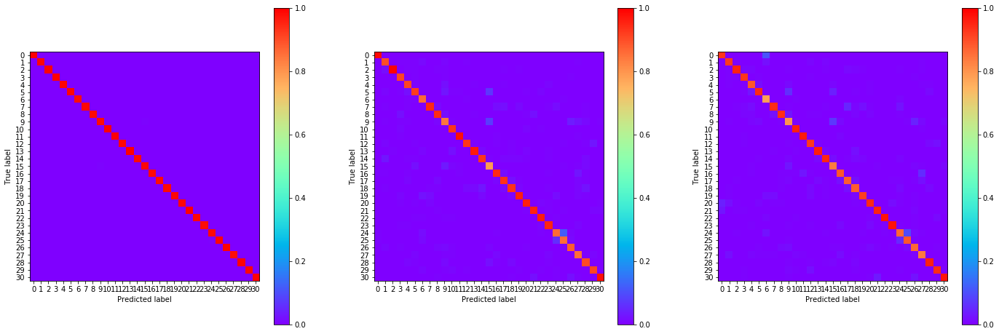

01:38:54.474319
#206 [Train: 0.031] [Test: 0.397] [Valid: 0.382]
#206 [Train: 0.991] [Test: 0.920] [Valid: 0.920]


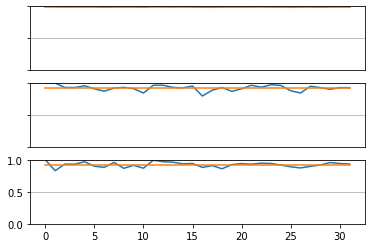

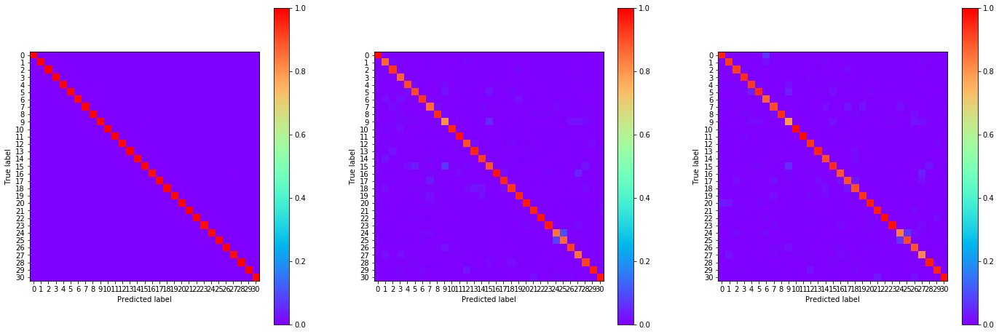

01:39:35.706267
#207 [Train: 0.030] [Test: 0.399] [Valid: 0.405]
#207 [Train: 0.991] [Test: 0.918] [Valid: 0.916]


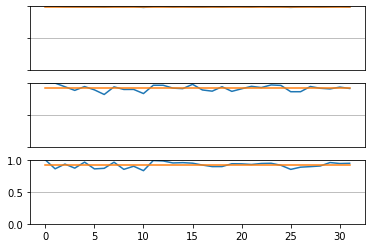

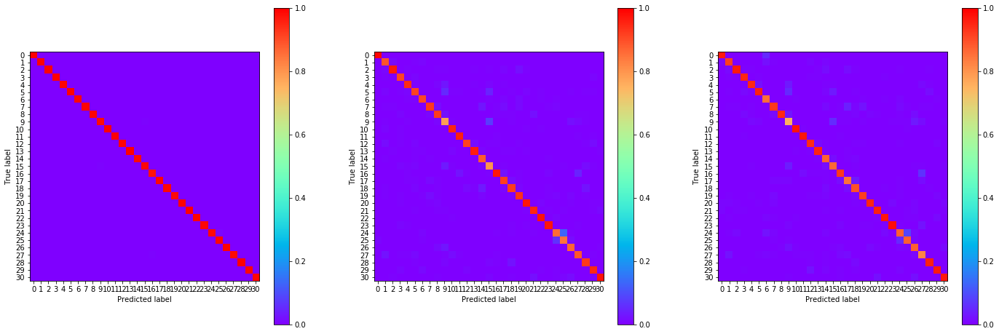

01:40:17.152124
#208 [Train: 0.032] [Test: 0.432] [Valid: 0.418]
#208 [Train: 0.991] [Test: 0.918] [Valid: 0.917]


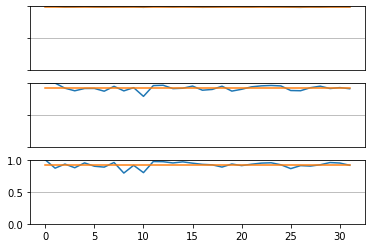

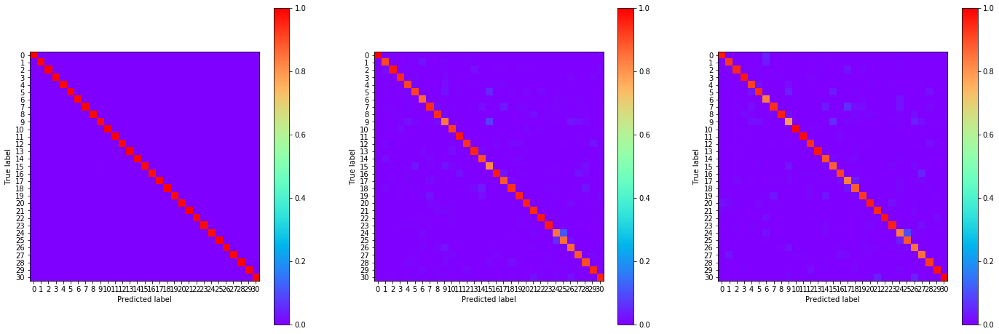

01:40:58.511063
#209 [Train: 0.038] [Test: 0.398] [Valid: 0.395]
#209 [Train: 0.989] [Test: 0.918] [Valid: 0.917]


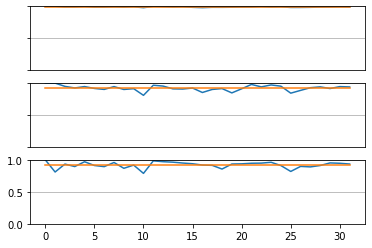

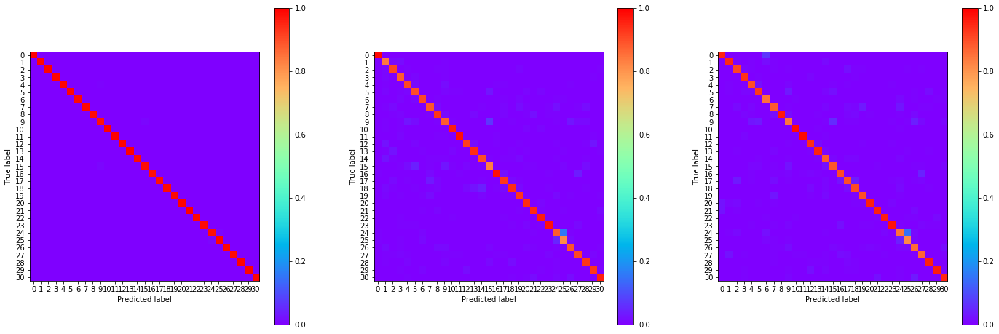

01:41:39.917119
#210 [Train: 0.030] [Test: 0.417] [Valid: 0.423]
#210 [Train: 0.992] [Test: 0.916] [Valid: 0.913]


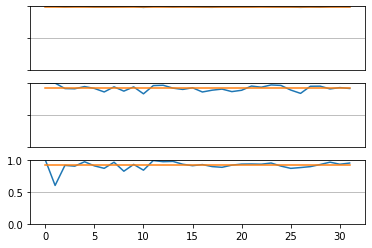

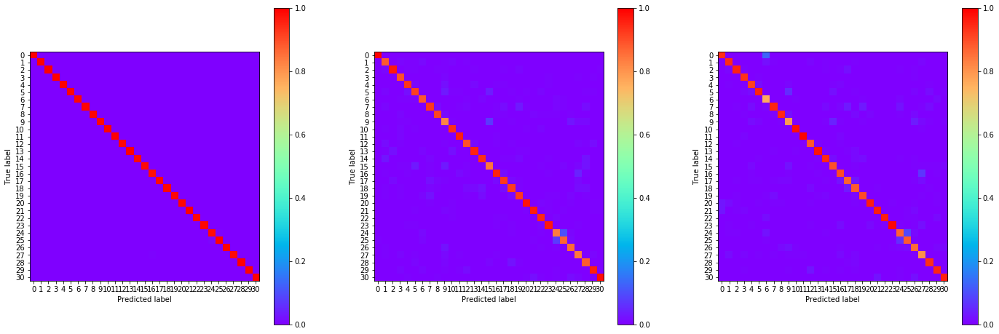

01:42:21.655711
#211 [Train: 0.034] [Test: 0.408] [Valid: 0.402]
#211 [Train: 0.991] [Test: 0.921] [Valid: 0.915]


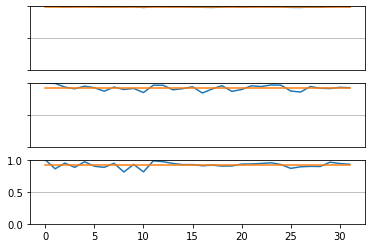

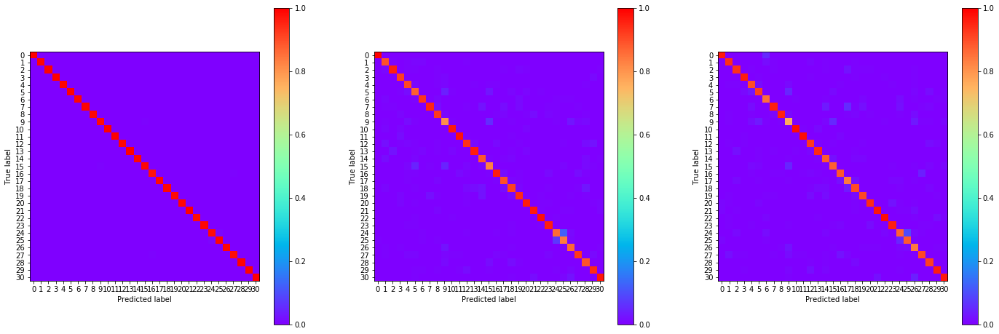

01:43:02.991986
#212 [Train: 0.030] [Test: 0.418] [Valid: 0.437]
#212 [Train: 0.991] [Test: 0.915] [Valid: 0.912]


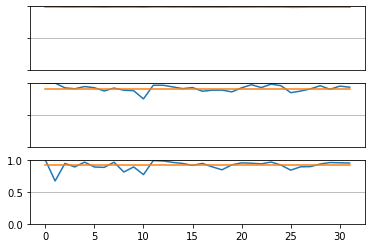

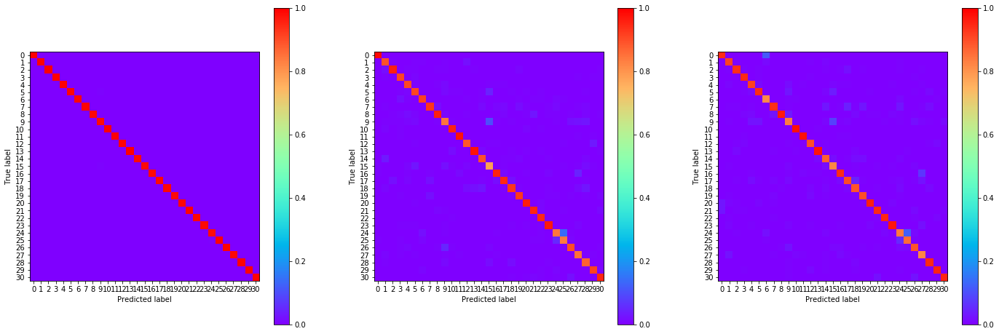

01:43:44.641034
#213 [Train: 0.041] [Test: 0.413] [Valid: 0.419]
#213 [Train: 0.988] [Test: 0.915] [Valid: 0.912]


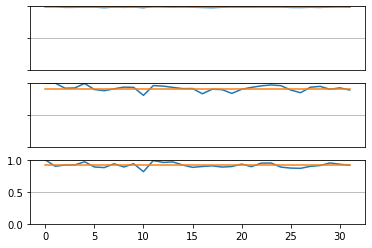

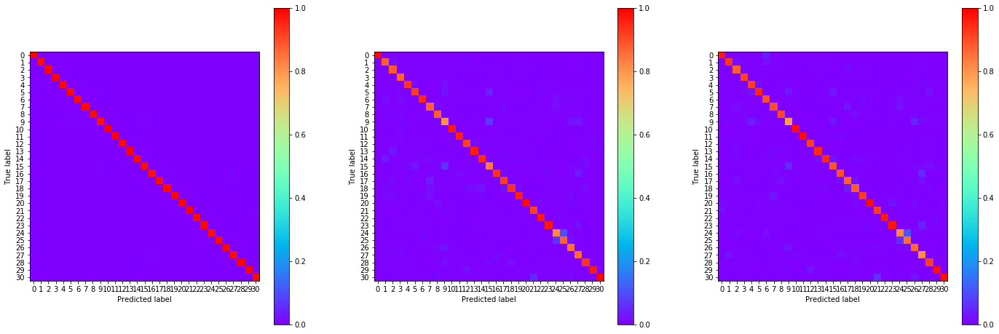

01:44:26.305549
#214 [Train: 0.036] [Test: 0.429] [Valid: 0.393]
#214 [Train: 0.989] [Test: 0.919] [Valid: 0.920]


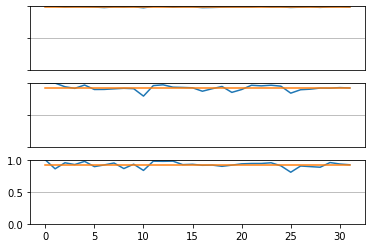

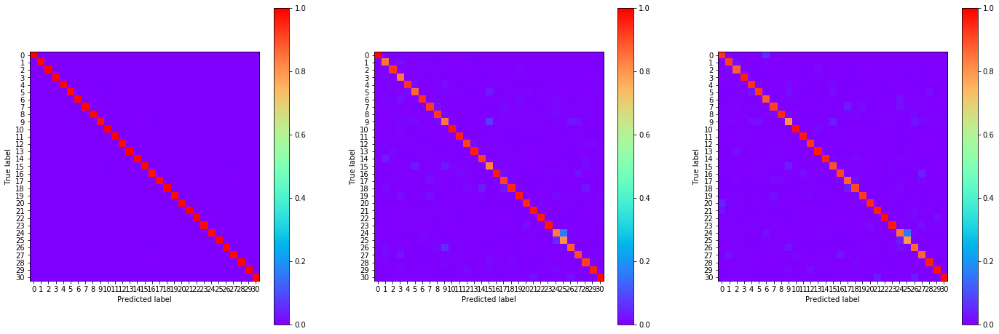

01:45:08.345689
#215 [Train: 0.030] [Test: 0.430] [Valid: 0.414]
#215 [Train: 0.992] [Test: 0.917] [Valid: 0.915]


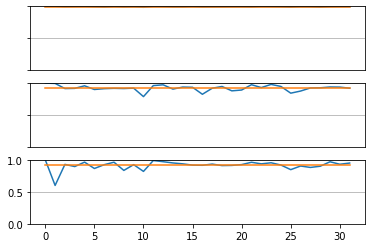

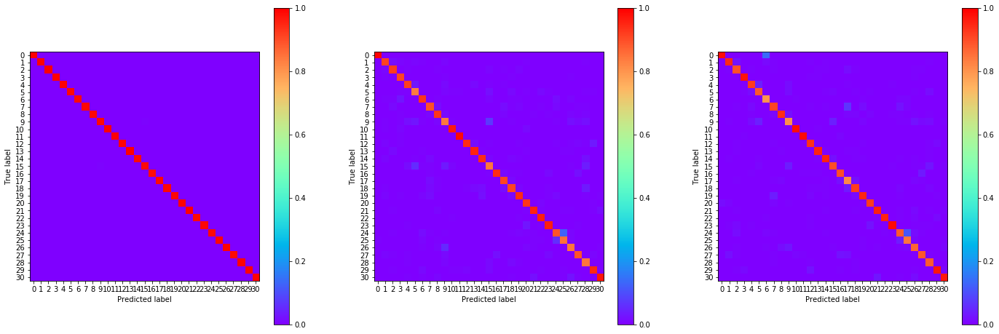

01:45:49.615518
#216 [Train: 0.026] [Test: 0.371] [Valid: 0.399]
#216 [Train: 0.993] [Test: 0.923] [Valid: 0.918]


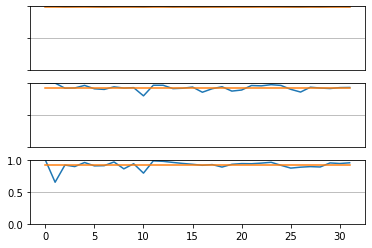

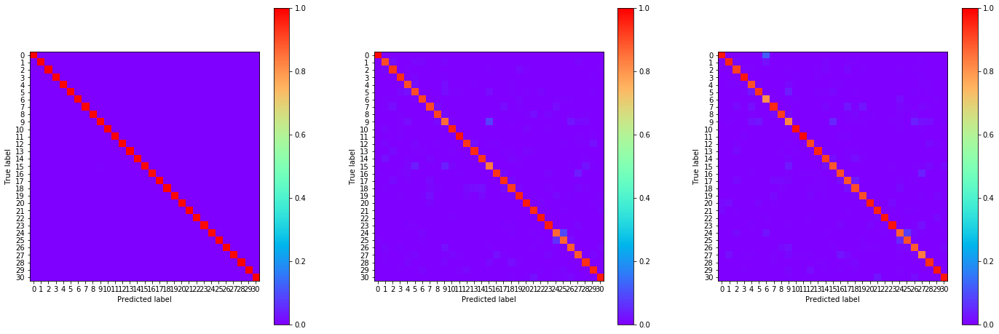

01:46:31.011991
#217 [Train: 0.023] [Test: 0.409] [Valid: 0.439]
#217 [Train: 0.994] [Test: 0.919] [Valid: 0.915]


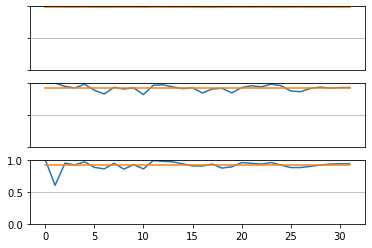

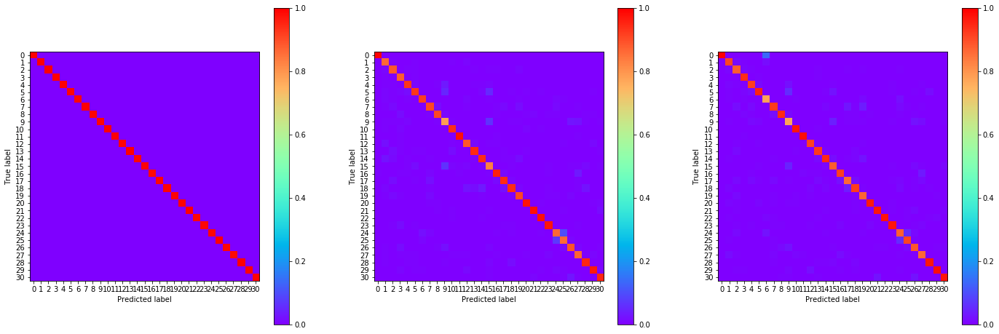

01:47:12.636057
#218 [Train: 0.026] [Test: 0.411] [Valid: 0.440]
#218 [Train: 0.993] [Test: 0.922] [Valid: 0.914]


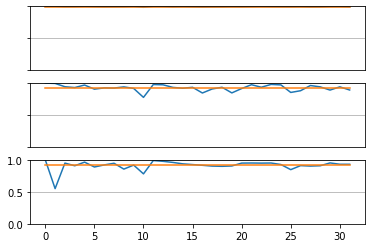

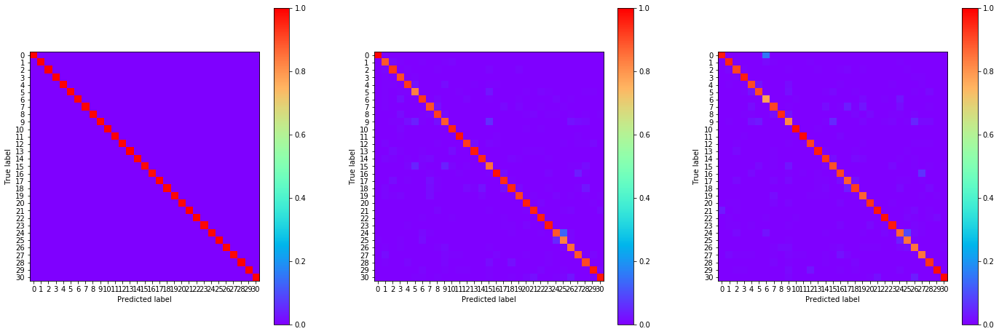

01:47:54.408886
#219 [Train: 0.027] [Test: 0.429] [Valid: 0.417]
#219 [Train: 0.993] [Test: 0.919] [Valid: 0.916]


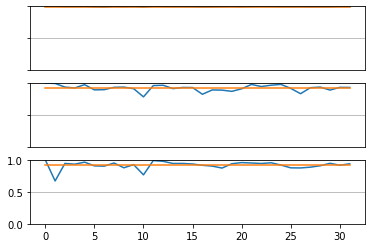

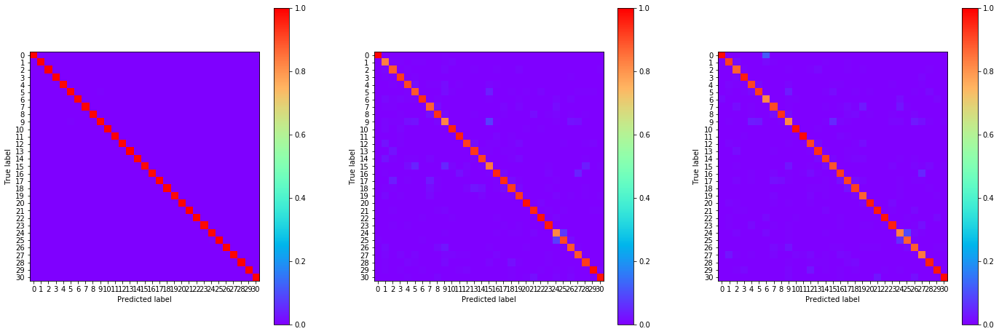

01:48:36.495645
#220 [Train: 0.033] [Test: 0.411] [Valid: 0.415]
#220 [Train: 0.991] [Test: 0.919] [Valid: 0.917]


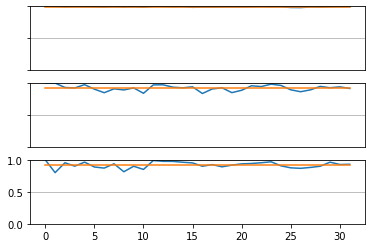

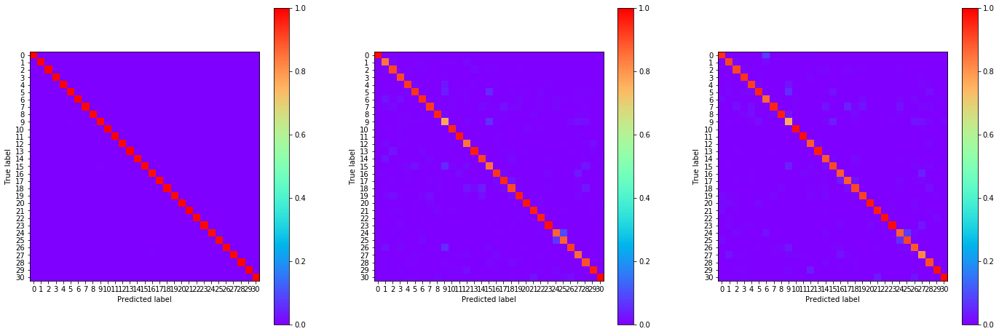

01:49:17.790703
#221 [Train: 0.028] [Test: 0.381] [Valid: 0.424]
#221 [Train: 0.992] [Test: 0.922] [Valid: 0.918]


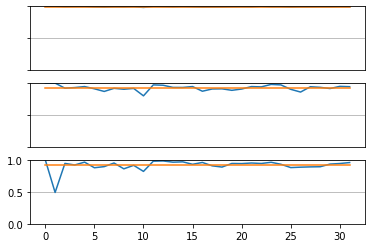

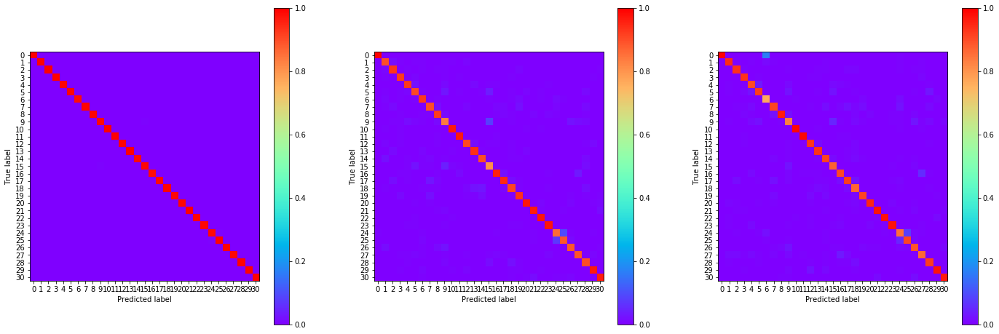

01:49:59.216781
#222 [Train: 0.023] [Test: 0.381] [Valid: 0.436]
#222 [Train: 0.994] [Test: 0.921] [Valid: 0.914]


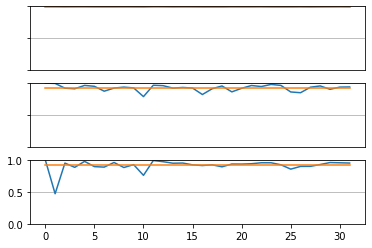

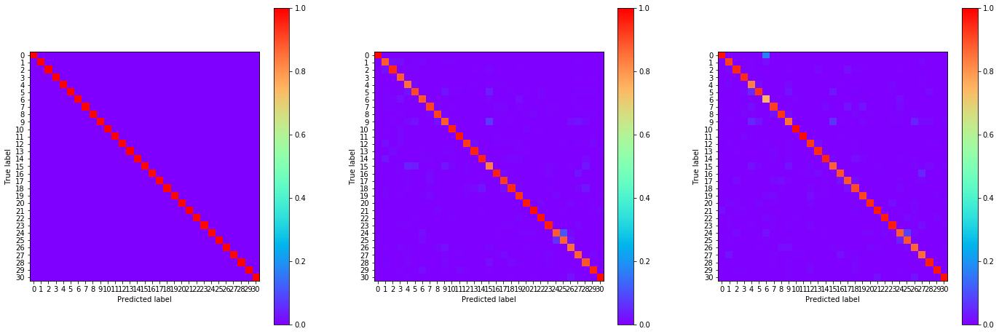

01:50:40.697863
#223 [Train: 0.026] [Test: 0.413] [Valid: 0.414]
#223 [Train: 0.993] [Test: 0.922] [Valid: 0.917]


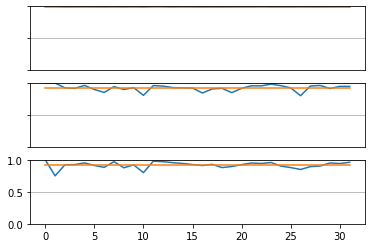

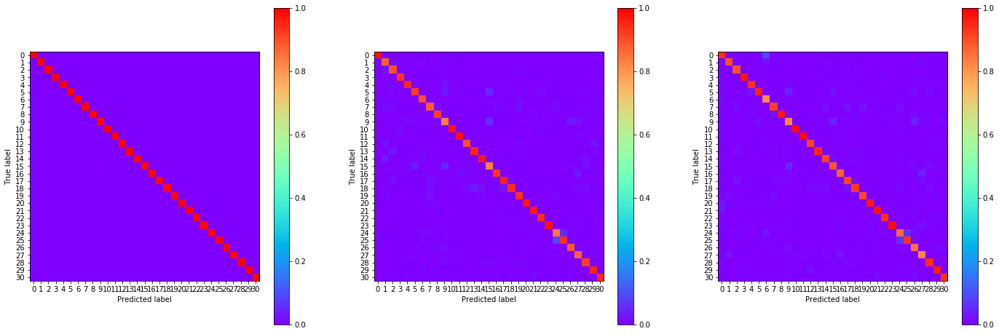

01:51:21.978412
#224 [Train: 0.029] [Test: 0.404] [Valid: 0.428]
#224 [Train: 0.992] [Test: 0.918] [Valid: 0.918]


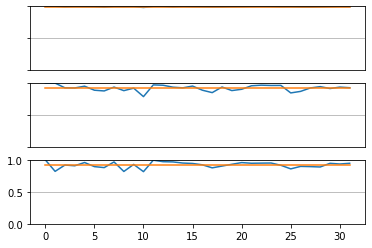

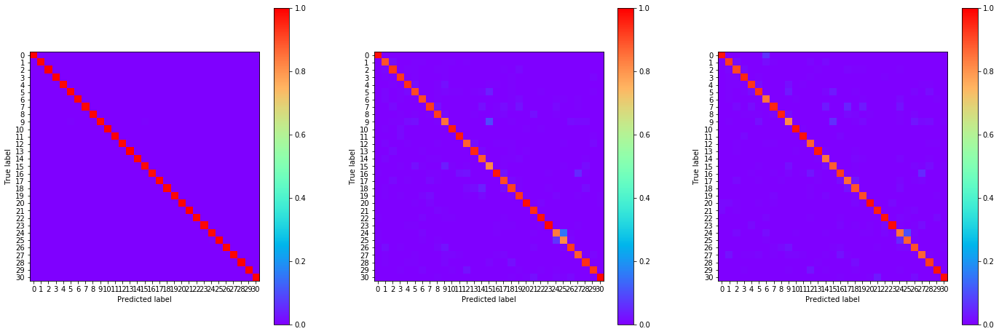

01:52:04.480368
#225 [Train: 0.025] [Test: 0.441] [Valid: 0.446]
#225 [Train: 0.993] [Test: 0.917] [Valid: 0.913]


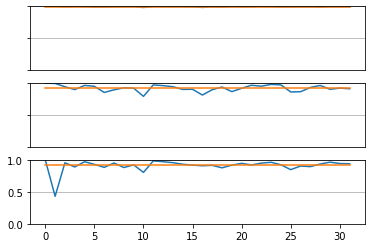

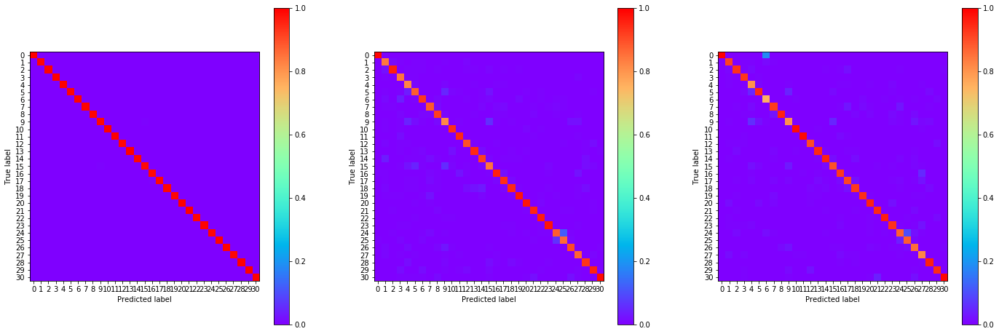

01:52:45.791407
#226 [Train: 0.027] [Test: 0.404] [Valid: 0.421]
#226 [Train: 0.993] [Test: 0.920] [Valid: 0.916]


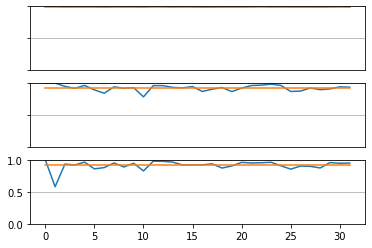

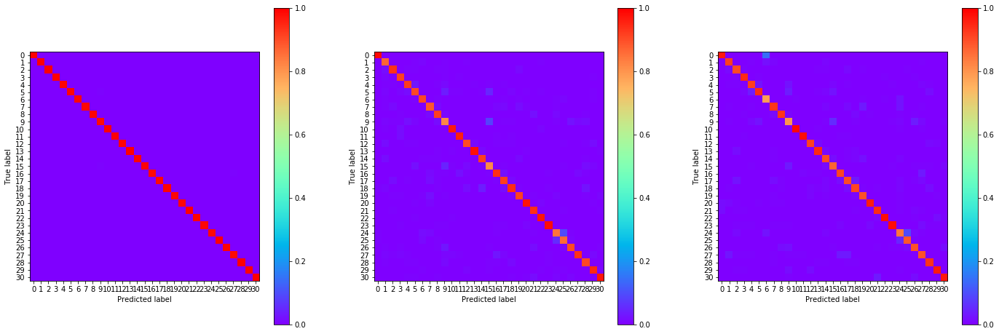

01:53:27.821615
#227 [Train: 0.026] [Test: 0.398] [Valid: 0.433]
#227 [Train: 0.993] [Test: 0.919] [Valid: 0.913]


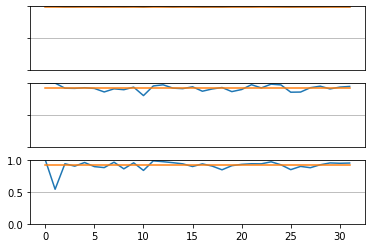

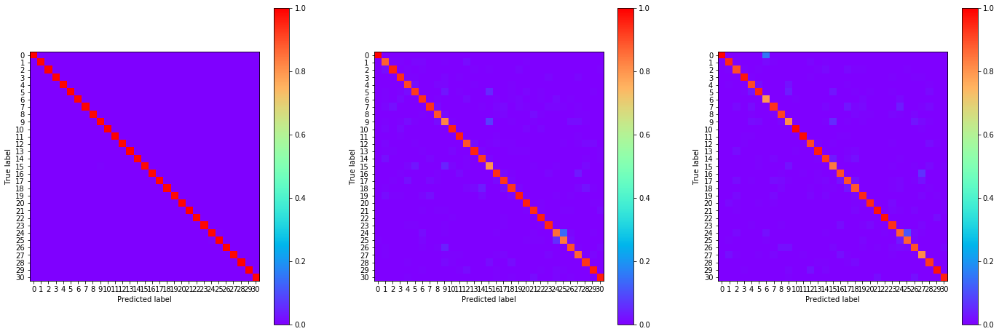

01:54:09.070271
#228 [Train: 0.025] [Test: 0.398] [Valid: 0.418]
#228 [Train: 0.993] [Test: 0.924] [Valid: 0.915]


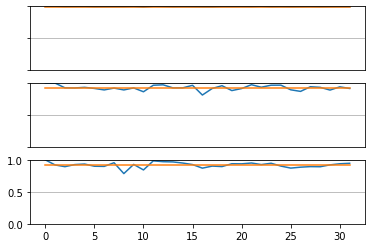

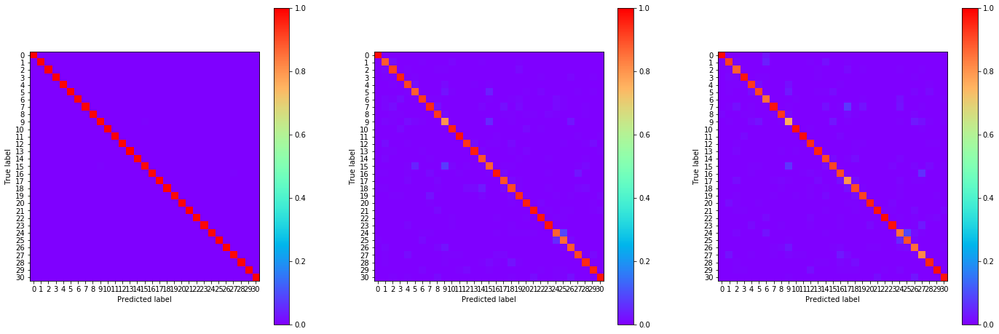

01:54:50.953298
#229 [Train: 0.023] [Test: 0.388] [Valid: 0.418]
#229 [Train: 0.994] [Test: 0.922] [Valid: 0.916]


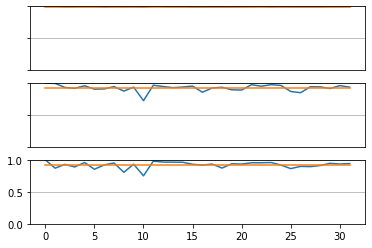

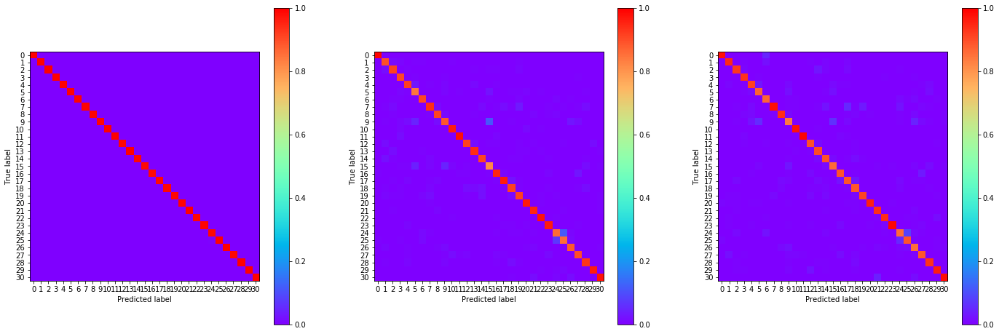

01:55:32.279718
#230 [Train: 0.026] [Test: 0.413] [Valid: 0.551]
#230 [Train: 0.993] [Test: 0.915] [Valid: 0.900]


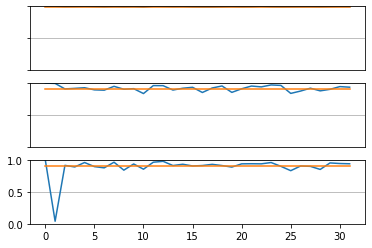

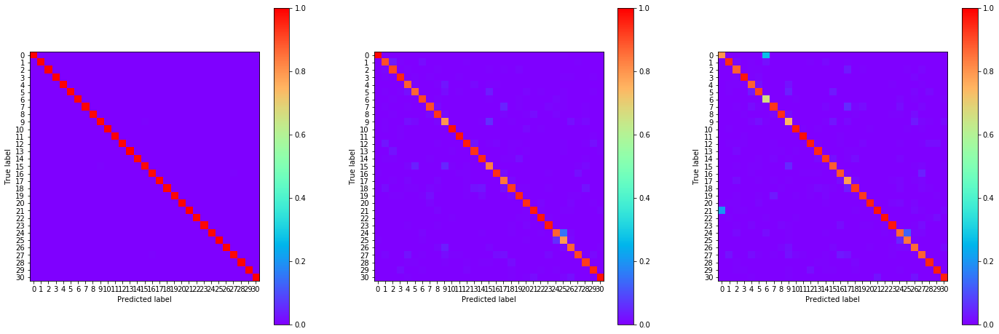

01:56:13.501366
#231 [Train: 0.028] [Test: 0.423] [Valid: 0.455]
#231 [Train: 0.992] [Test: 0.919] [Valid: 0.908]


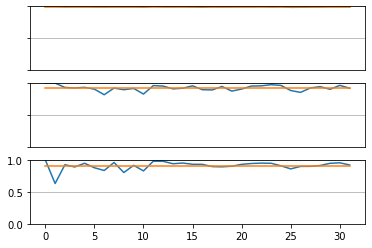

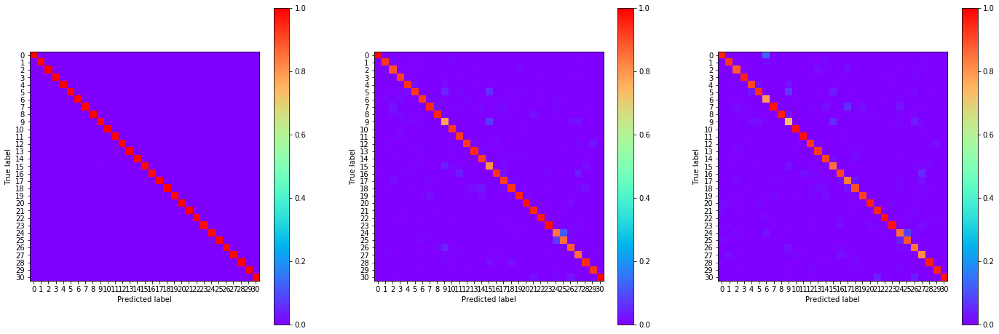

01:56:54.891801
#232 [Train: 0.029] [Test: 0.426] [Valid: 0.469]
#232 [Train: 0.992] [Test: 0.919] [Valid: 0.909]


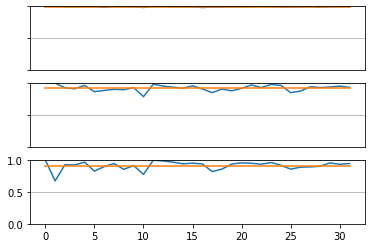

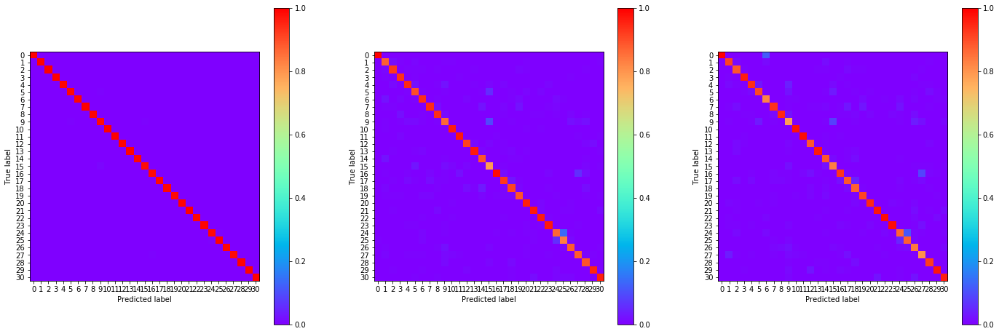

01:57:36.375995
#233 [Train: 0.029] [Test: 0.427] [Valid: 0.437]
#233 [Train: 0.992] [Test: 0.919] [Valid: 0.915]


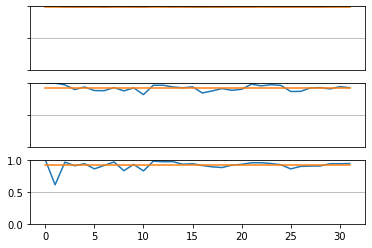

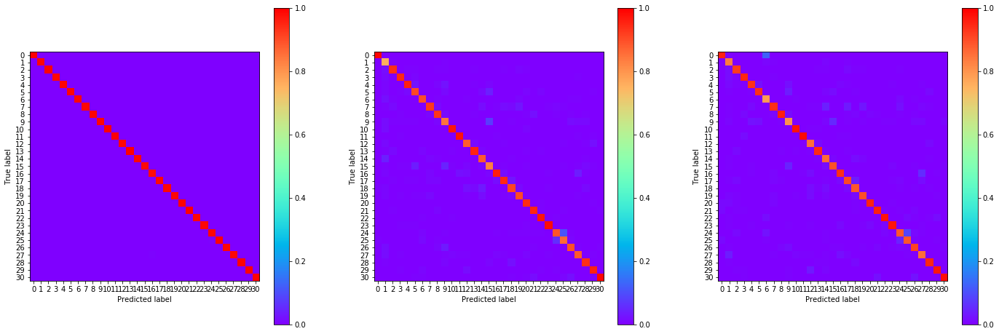

01:58:17.594334
#234 [Train: 0.022] [Test: 0.381] [Valid: 0.396]
#234 [Train: 0.994] [Test: 0.922] [Valid: 0.922]


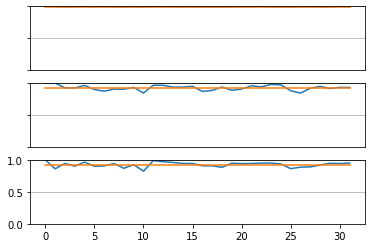

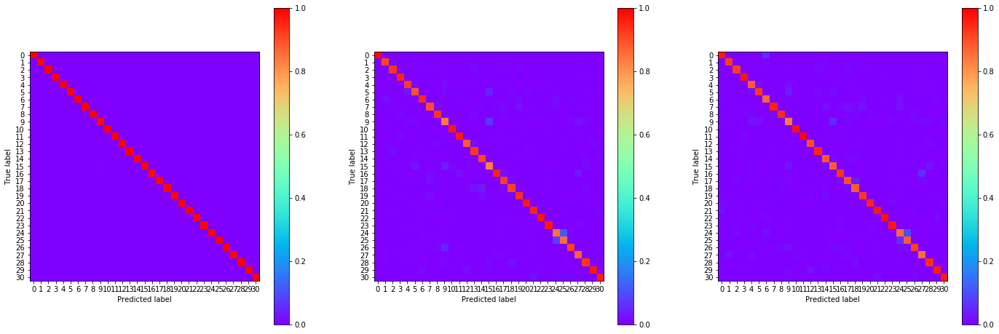

01:58:59.189699
#235 [Train: 0.022] [Test: 0.376] [Valid: 0.424]
#235 [Train: 0.994] [Test: 0.921] [Valid: 0.920]


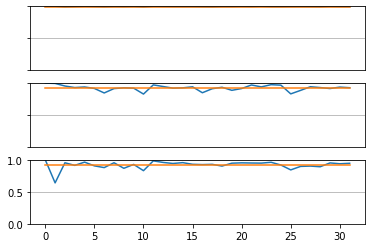

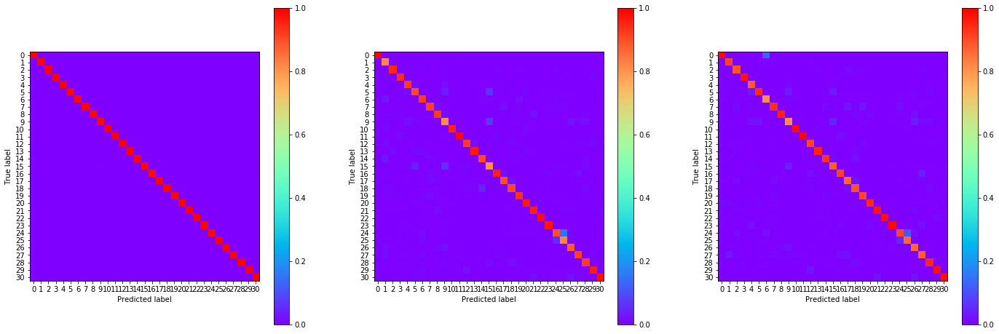

01:59:40.834024
#236 [Train: 0.026] [Test: 0.402] [Valid: 0.441]
#236 [Train: 0.993] [Test: 0.919] [Valid: 0.913]


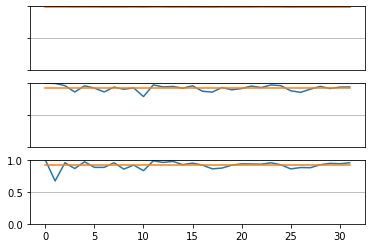

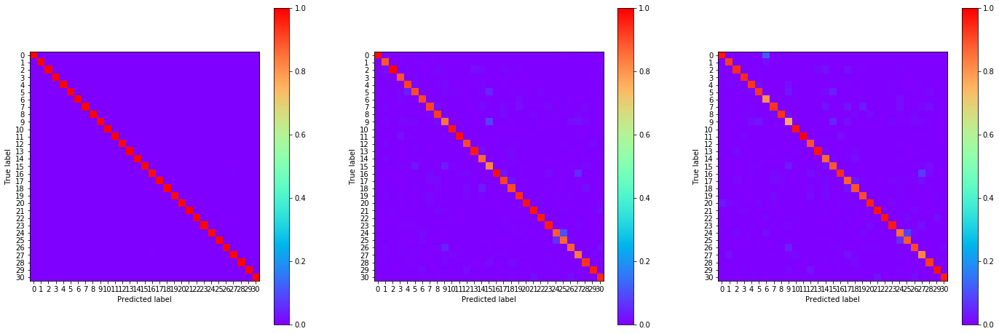

02:00:22.145893
#237 [Train: 0.025] [Test: 0.458] [Valid: 0.502]
#237 [Train: 0.993] [Test: 0.916] [Valid: 0.906]


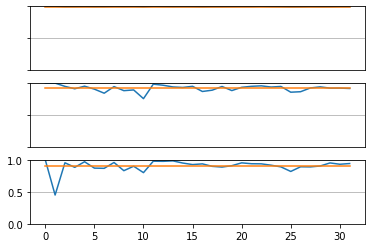

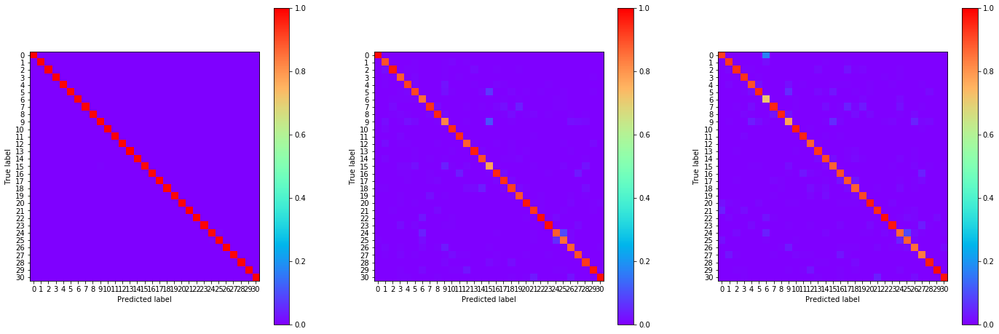

02:01:03.945659
#238 [Train: 0.024] [Test: 0.397] [Valid: 0.466]
#238 [Train: 0.993] [Test: 0.918] [Valid: 0.911]


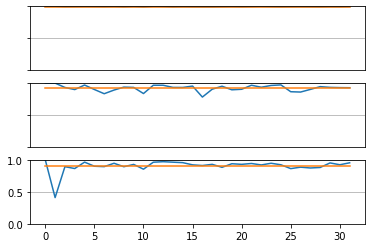

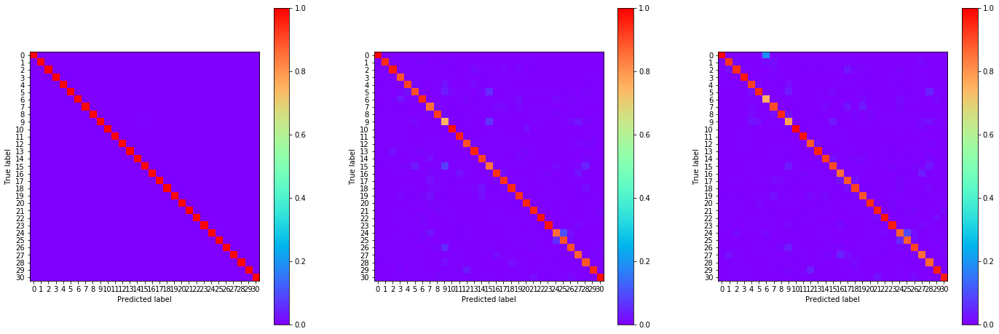

02:01:45.529052
#239 [Train: 0.021] [Test: 0.429] [Valid: 0.423]
#239 [Train: 0.994] [Test: 0.920] [Valid: 0.916]


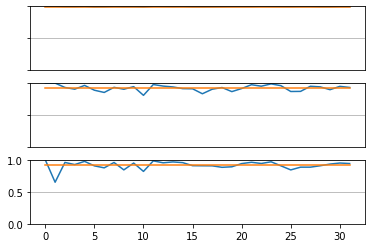

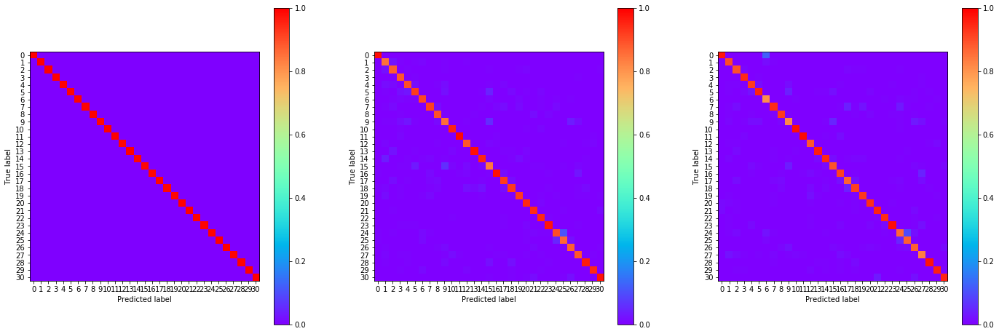

02:02:27.006029
#240 [Train: 0.023] [Test: 0.398] [Valid: 0.427]
#240 [Train: 0.994] [Test: 0.920] [Valid: 0.918]


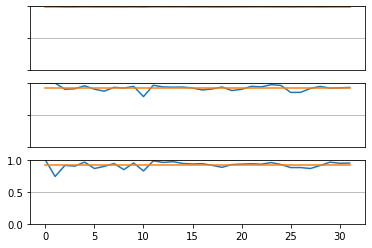

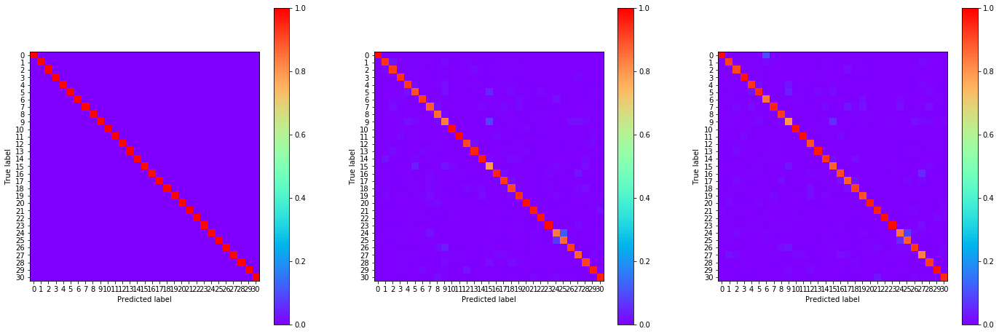

02:03:09.012893
#241 [Train: 0.026] [Test: 0.398] [Valid: 0.409]
#241 [Train: 0.993] [Test: 0.920] [Valid: 0.918]


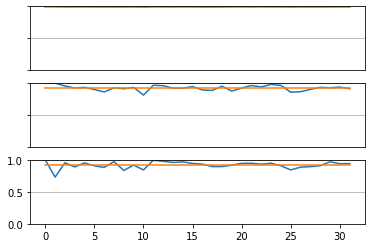

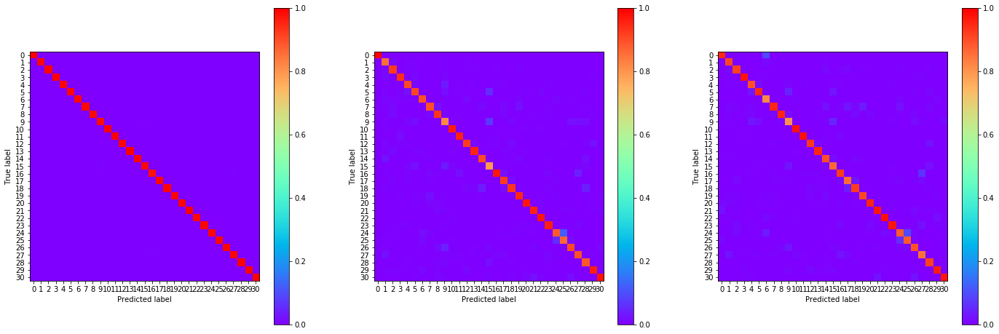

02:03:50.617224
#242 [Train: 0.025] [Test: 0.392] [Valid: 0.498]
#242 [Train: 0.993] [Test: 0.922] [Valid: 0.908]


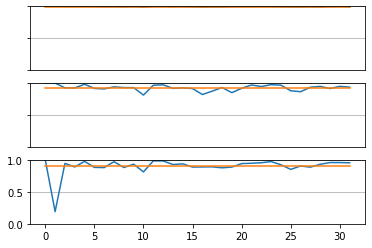

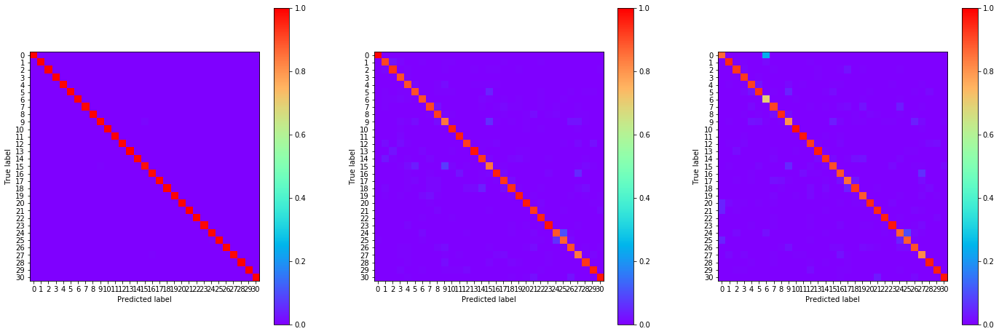

02:04:32.149643
#243 [Train: 0.022] [Test: 0.411] [Valid: 0.428]
#243 [Train: 0.994] [Test: 0.922] [Valid: 0.916]


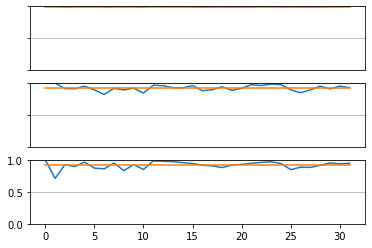

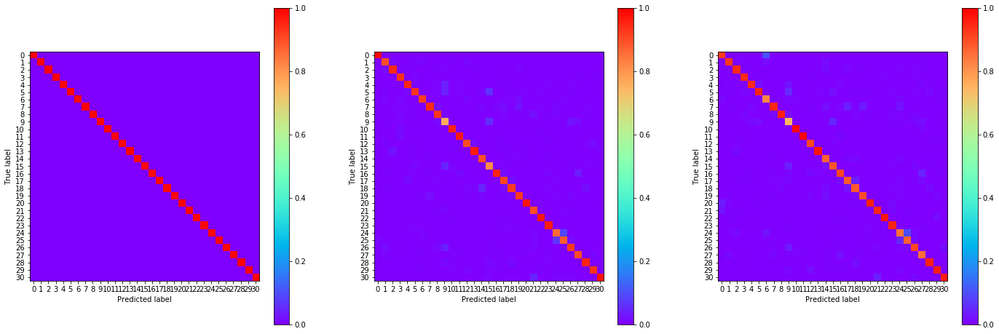

02:05:14.051992
#244 [Train: 0.019] [Test: 0.419] [Valid: 0.435]
#244 [Train: 0.995] [Test: 0.923] [Valid: 0.917]


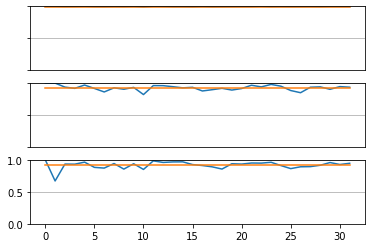

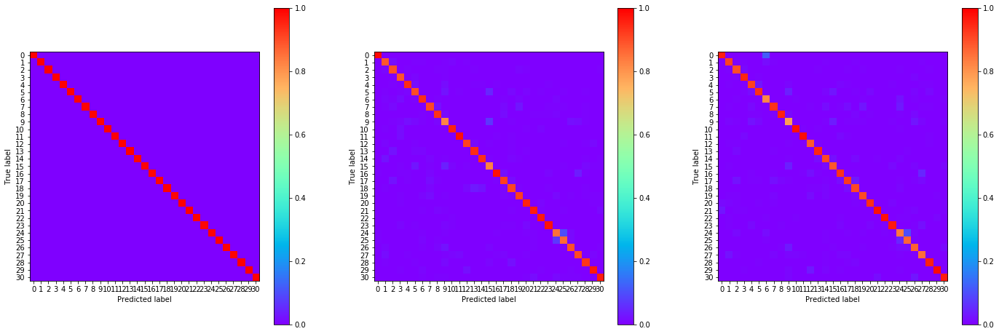

02:05:55.753773
#245 [Train: 0.018] [Test: 0.429] [Valid: 0.472]
#245 [Train: 0.996] [Test: 0.917] [Valid: 0.914]


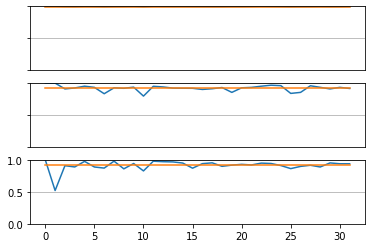

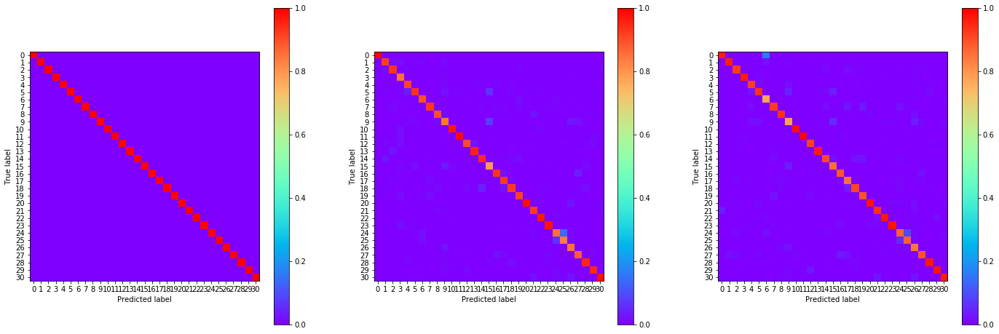

02:06:37.195538
#246 [Train: 0.021] [Test: 0.403] [Valid: 0.413]
#246 [Train: 0.994] [Test: 0.921] [Valid: 0.921]


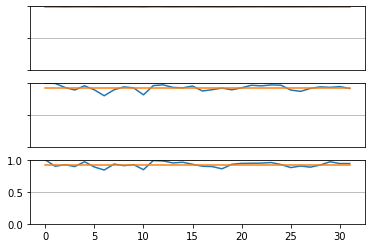

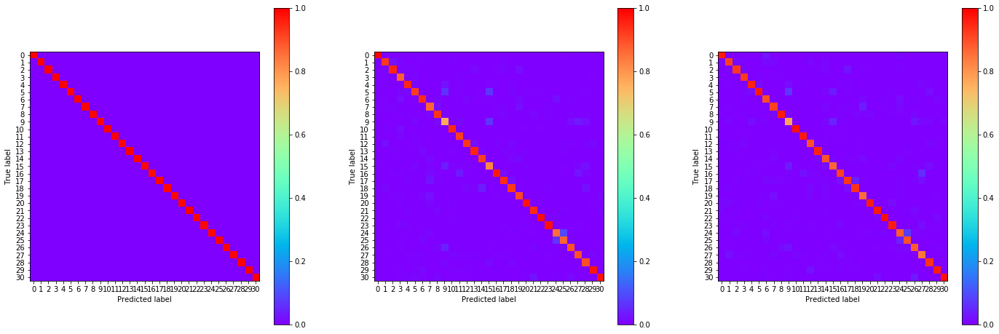

02:07:19.350315
#247 [Train: 0.021] [Test: 0.446] [Valid: 0.430]
#247 [Train: 0.994] [Test: 0.920] [Valid: 0.920]


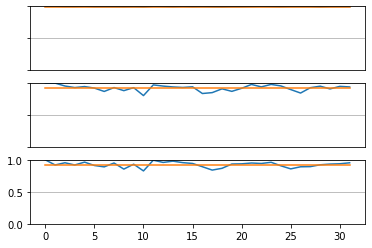

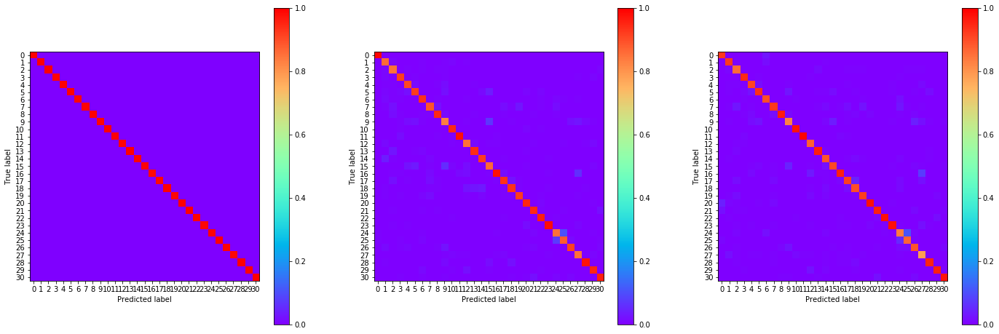

02:08:00.848769
#248 [Train: 0.021] [Test: 0.417] [Valid: 0.446]
#248 [Train: 0.994] [Test: 0.920] [Valid: 0.917]


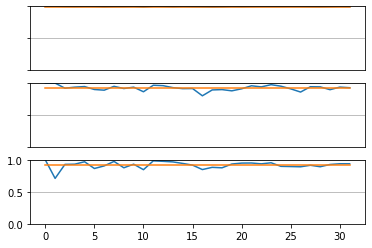

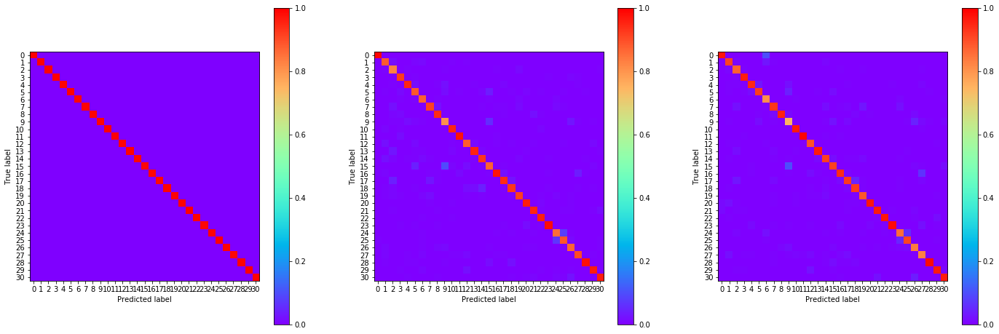

02:08:42.882340
#249 [Train: 0.024] [Test: 0.428] [Valid: 0.435]
#249 [Train: 0.993] [Test: 0.919] [Valid: 0.916]


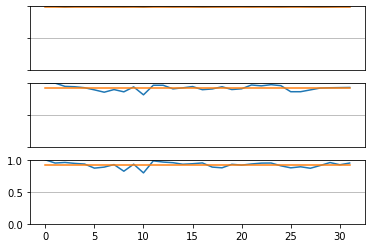

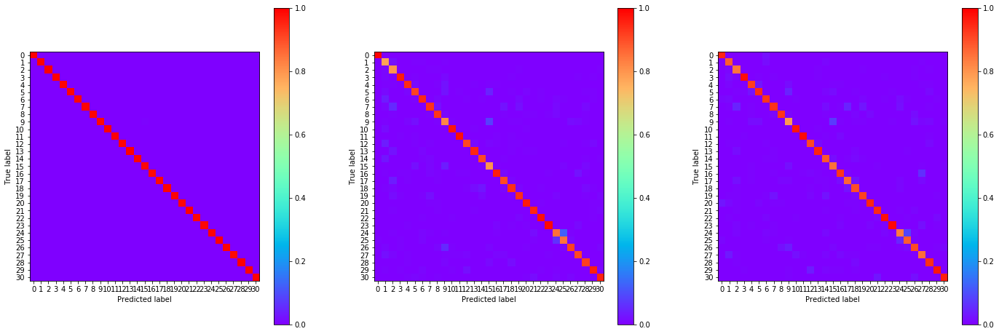

02:09:24.891232
#250 [Train: 0.025] [Test: 0.452] [Valid: 0.436]
#250 [Train: 0.993] [Test: 0.919] [Valid: 0.913]


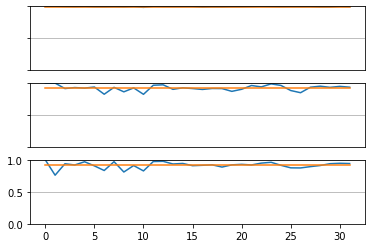

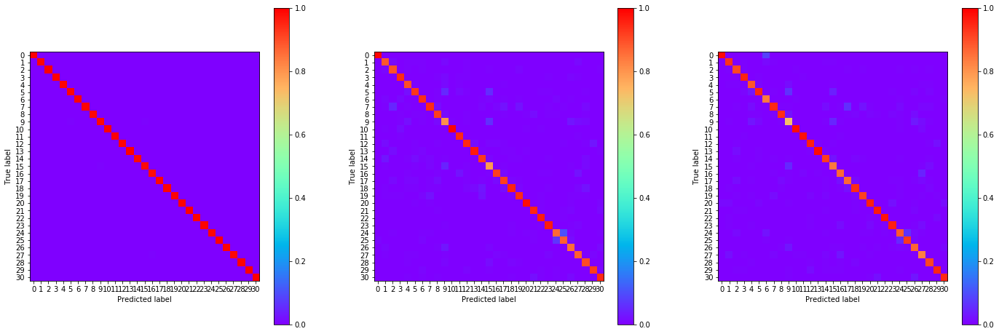

02:10:06.013571
#251 [Train: 0.024] [Test: 0.441] [Valid: 0.459]
#251 [Train: 0.993] [Test: 0.919] [Valid: 0.916]


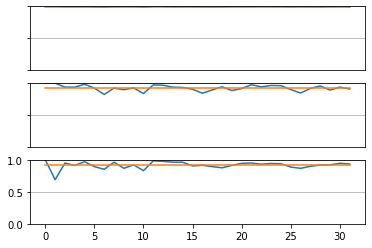

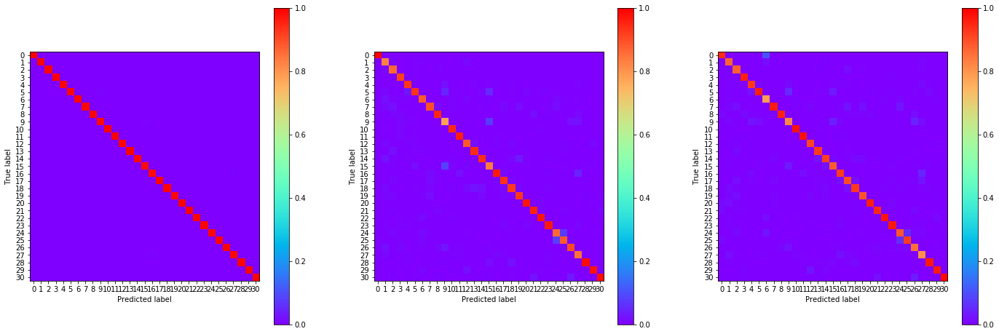

02:10:47.446079
#252 [Train: 0.020] [Test: 0.379] [Valid: 0.404]
#252 [Train: 0.995] [Test: 0.922] [Valid: 0.921]


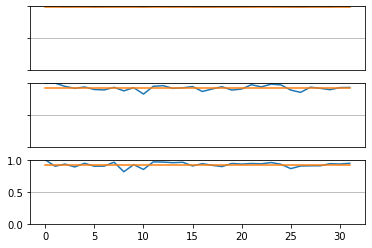

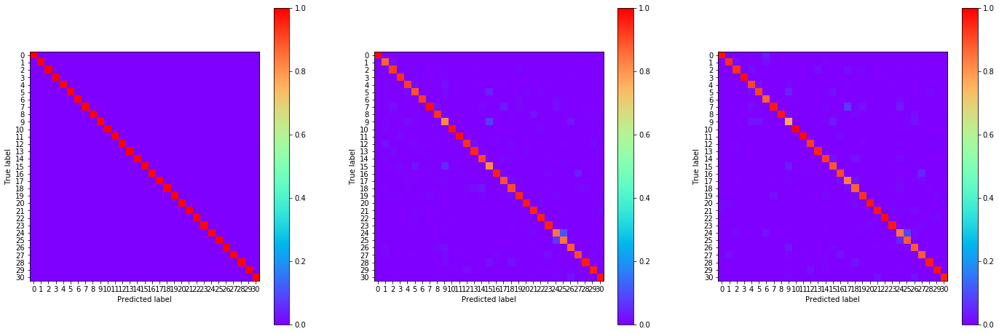

02:11:29.590628
#253 [Train: 0.017] [Test: 0.400] [Valid: 0.411]
#253 [Train: 0.996] [Test: 0.924] [Valid: 0.922]


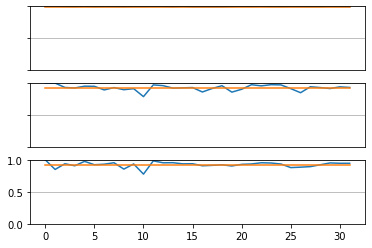

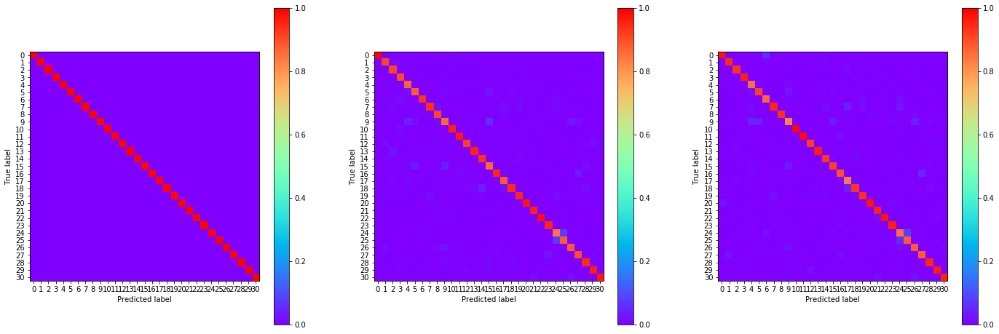

02:12:10.790280
#254 [Train: 0.015] [Test: 0.424] [Valid: 0.446]
#254 [Train: 0.996] [Test: 0.921] [Valid: 0.916]


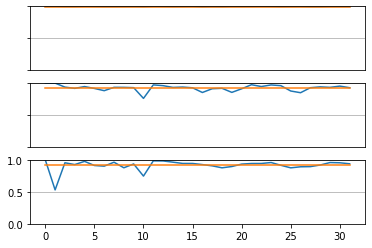

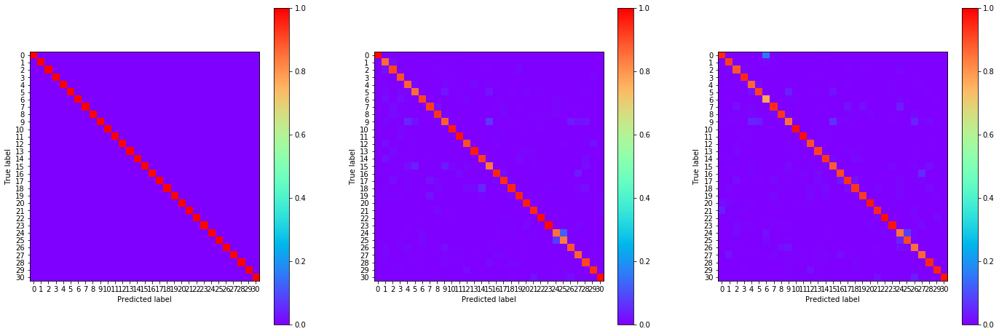

02:12:52.692626
#255 [Train: 0.016] [Test: 0.415] [Valid: 0.451]
#255 [Train: 0.996] [Test: 0.919] [Valid: 0.916]


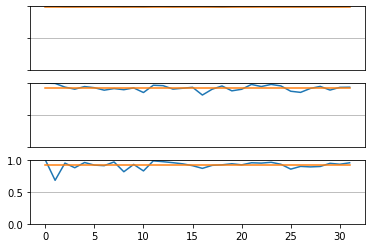

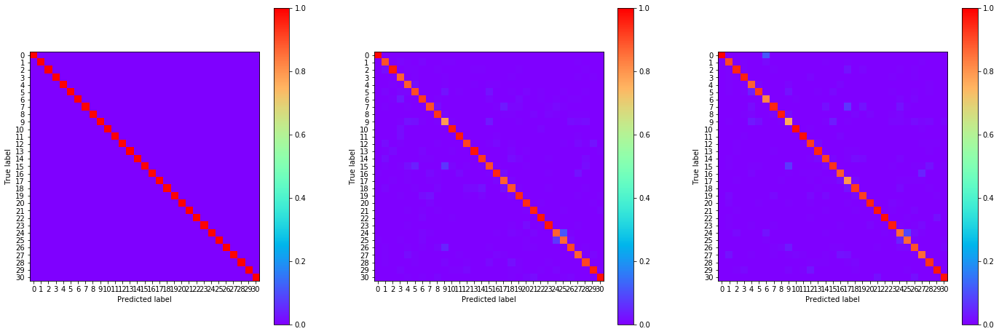

02:13:33.896376
#256 [Train: 0.020] [Test: 0.448] [Valid: 0.420]
#256 [Train: 0.995] [Test: 0.919] [Valid: 0.921]


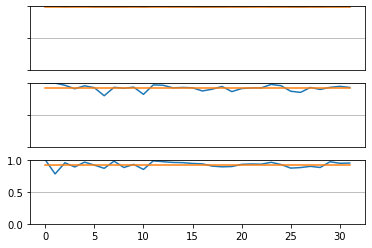

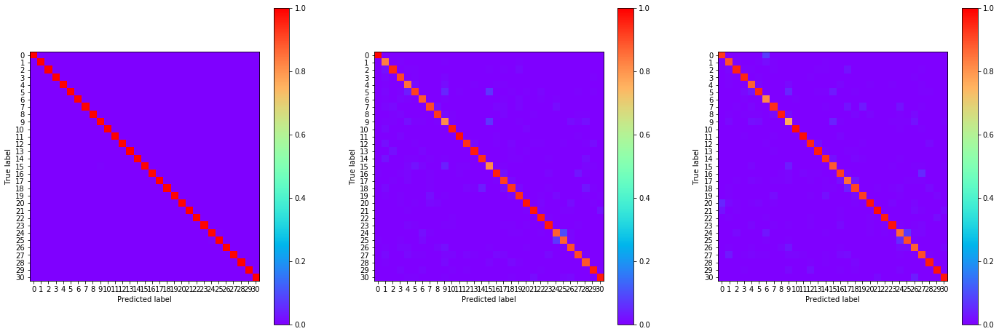

02:14:15.223781
#257 [Train: 0.017] [Test: 0.429] [Valid: 0.436]
#257 [Train: 0.996] [Test: 0.924] [Valid: 0.918]


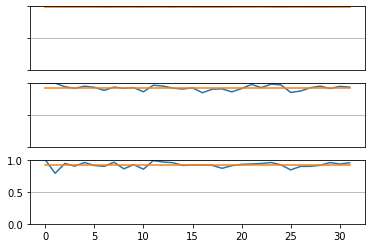

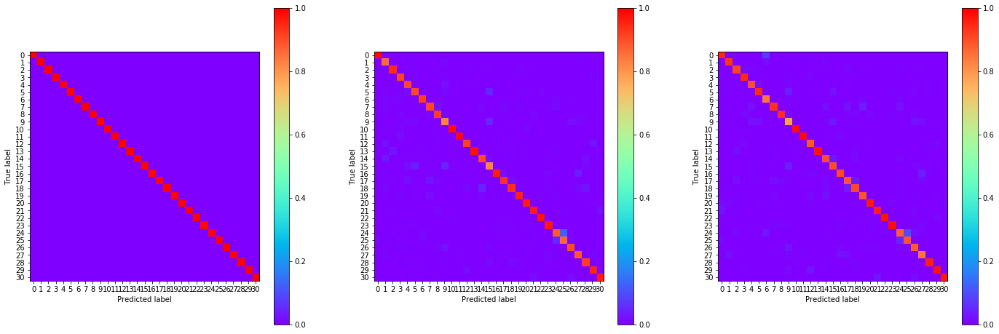

02:14:57.823212
#258 [Train: 0.016] [Test: 0.408] [Valid: 0.440]
#258 [Train: 0.996] [Test: 0.922] [Valid: 0.920]


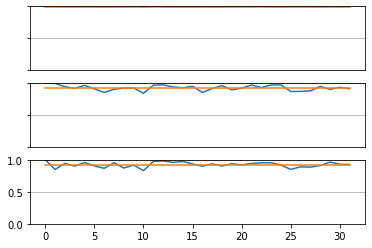

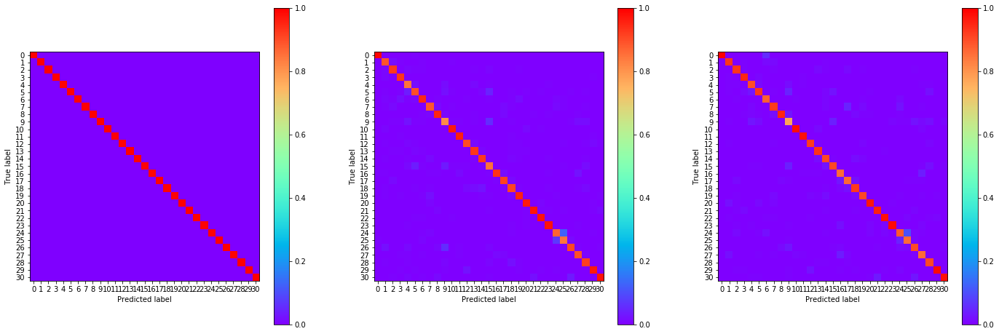

02:15:39.104596
#259 [Train: 0.017] [Test: 0.462] [Valid: 0.446]
#259 [Train: 0.995] [Test: 0.915] [Valid: 0.919]


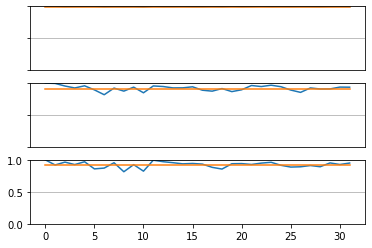

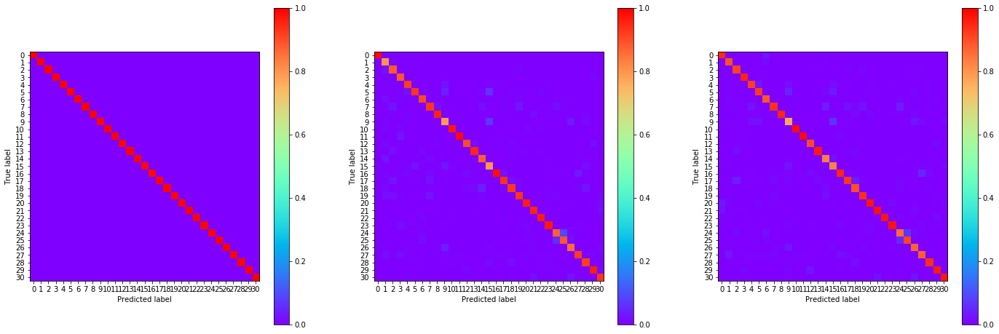

02:16:20.634839
#260 [Train: 0.018] [Test: 0.454] [Valid: 0.436]
#260 [Train: 0.995] [Test: 0.919] [Valid: 0.918]


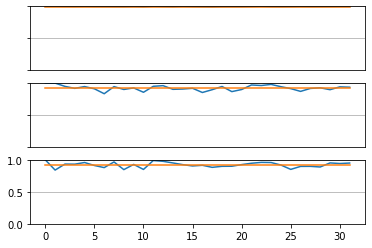

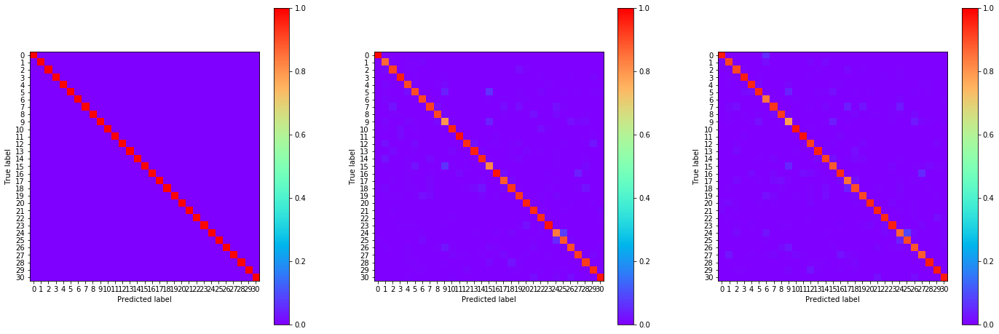

02:17:02.318816
#261 [Train: 0.018] [Test: 0.409] [Valid: 0.431]
#261 [Train: 0.995] [Test: 0.922] [Valid: 0.917]


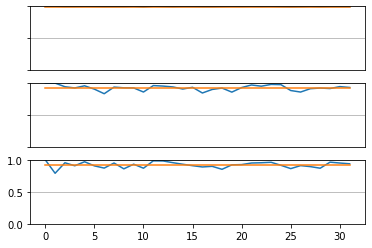

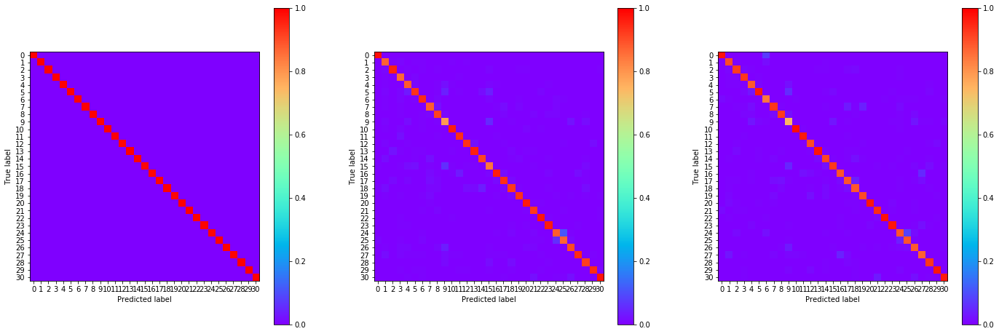

02:17:43.934740
#262 [Train: 0.018] [Test: 0.403] [Valid: 0.446]
#262 [Train: 0.995] [Test: 0.921] [Valid: 0.916]


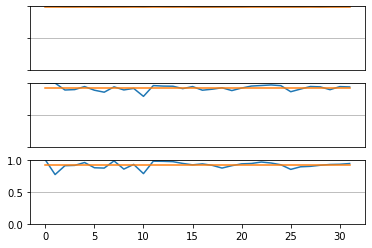

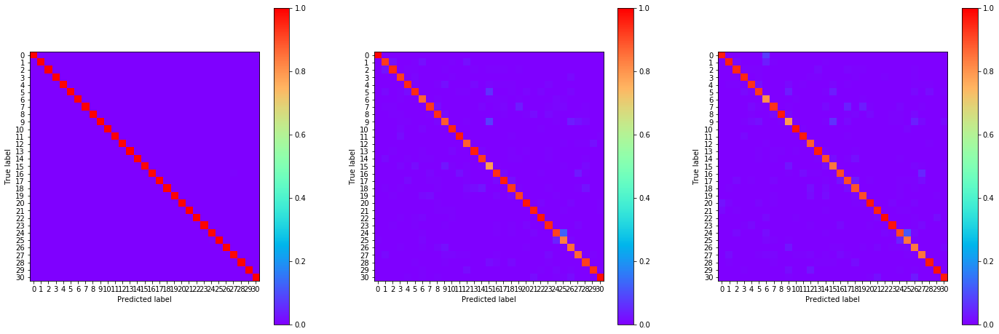

02:18:25.303844
#263 [Train: 0.020] [Test: 0.411] [Valid: 0.424]
#263 [Train: 0.995] [Test: 0.923] [Valid: 0.921]


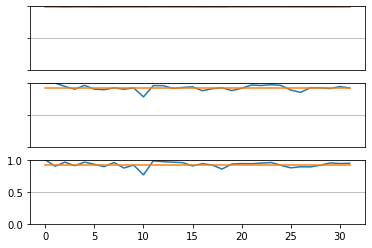

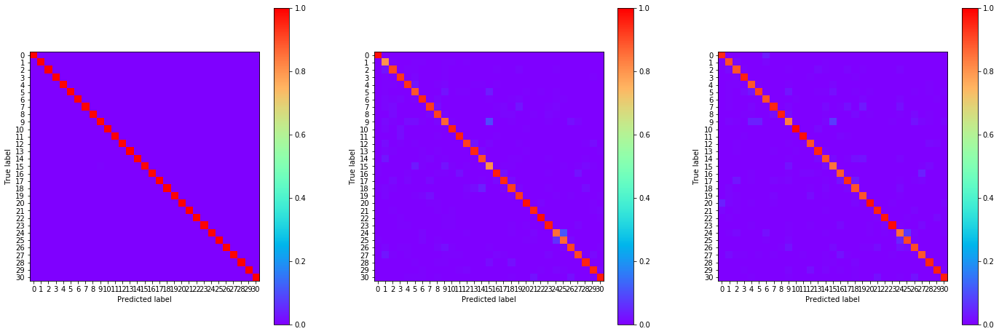

02:19:06.982636
#264 [Train: 0.023] [Test: 0.431] [Valid: 0.431]
#264 [Train: 0.994] [Test: 0.923] [Valid: 0.916]


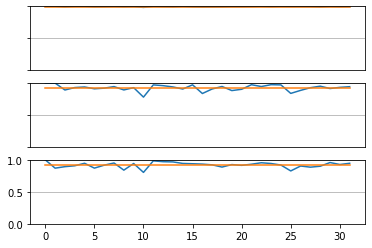

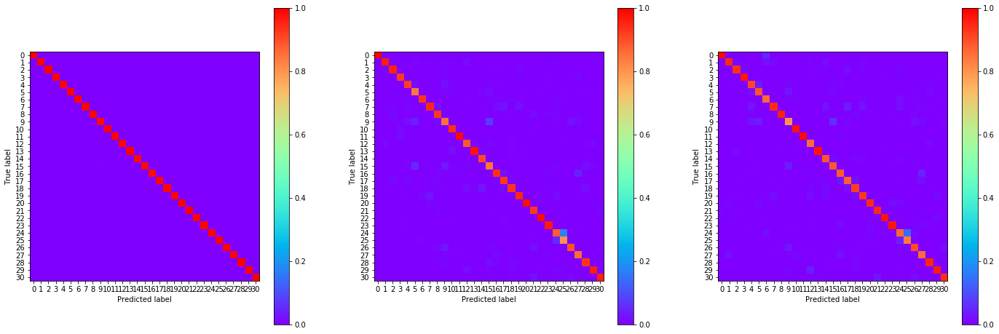

02:19:48.170932
#265 [Train: 0.019] [Test: 0.426] [Valid: 0.424]
#265 [Train: 0.995] [Test: 0.922] [Valid: 0.919]


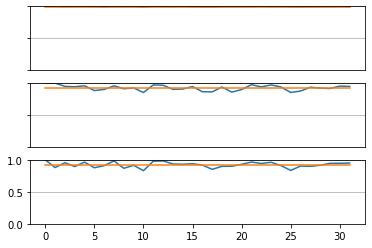

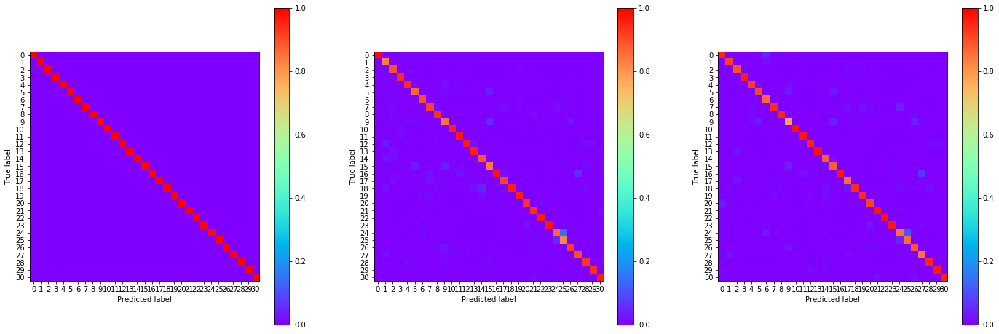

02:20:29.681858
#266 [Train: 0.024] [Test: 0.407] [Valid: 0.415]
#266 [Train: 0.993] [Test: 0.919] [Valid: 0.921]


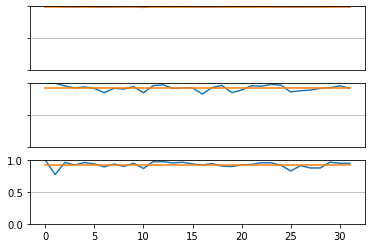

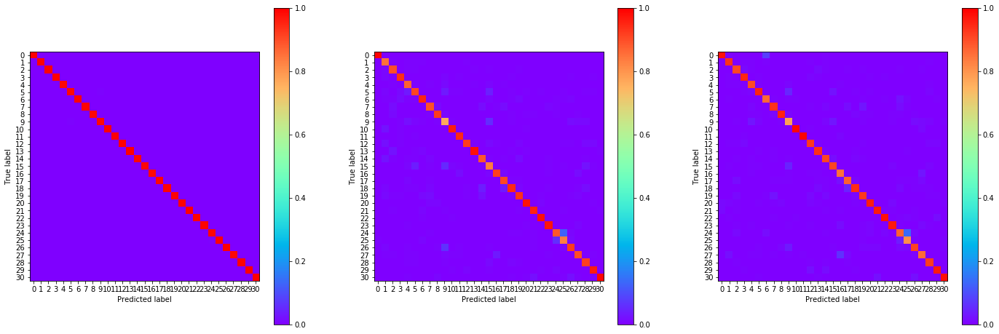

02:21:11.433116
#267 [Train: 0.017] [Test: 0.414] [Valid: 0.434]
#267 [Train: 0.996] [Test: 0.921] [Valid: 0.918]


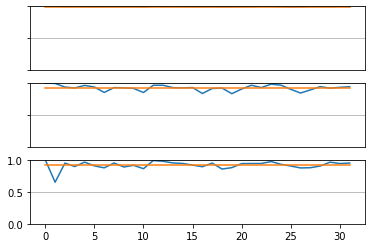

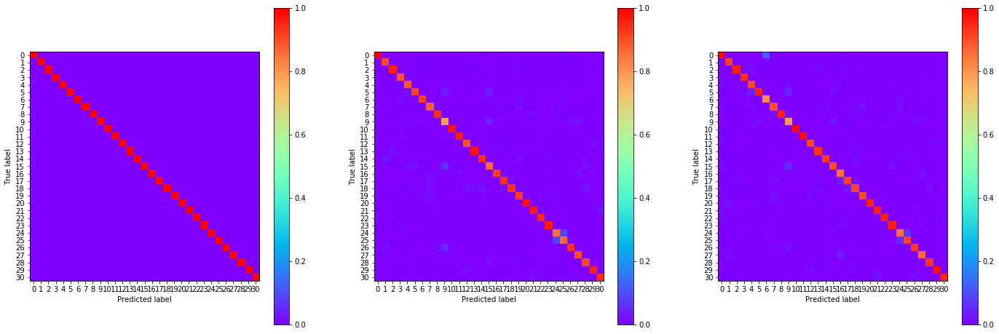

02:21:52.776239
#268 [Train: 0.013] [Test: 0.423] [Valid: 0.457]
#268 [Train: 0.997] [Test: 0.922] [Valid: 0.917]


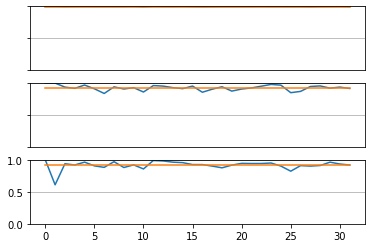

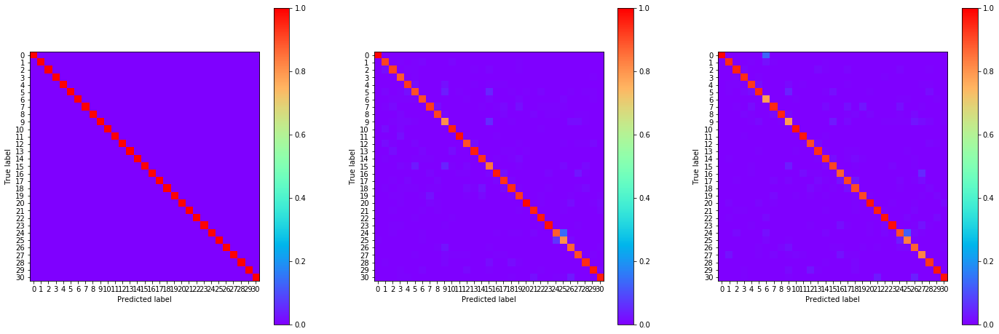

02:22:35.162362
#269 [Train: 0.014] [Test: 0.457] [Valid: 0.416]
#269 [Train: 0.996] [Test: 0.920] [Valid: 0.920]


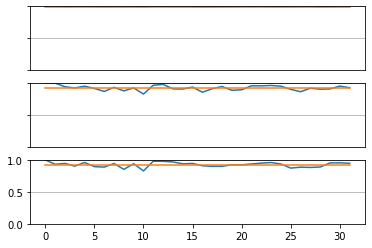

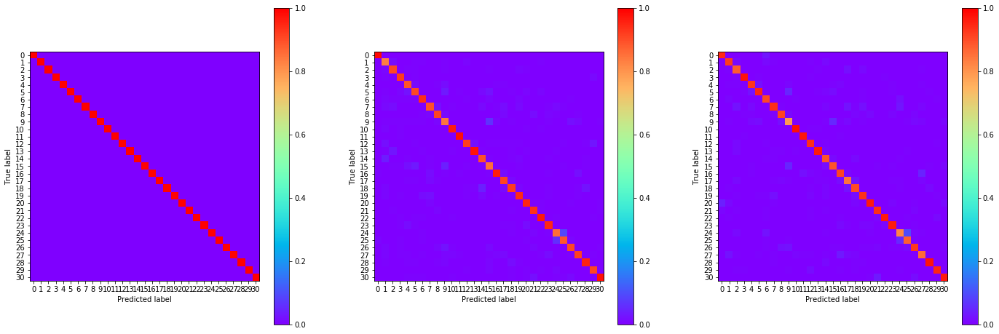

02:23:17.120236
#270 [Train: 0.015] [Test: 0.389] [Valid: 0.407]
#270 [Train: 0.995] [Test: 0.925] [Valid: 0.922]


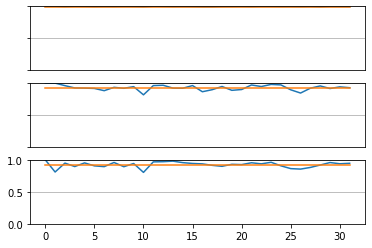

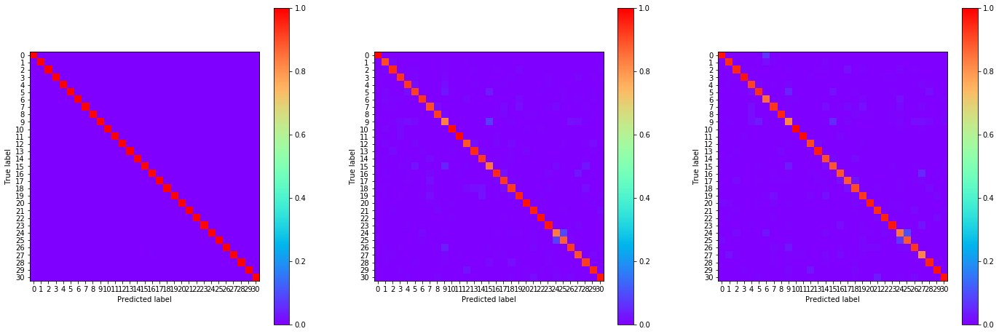

02:23:58.185104
#271 [Train: 0.017] [Test: 0.450] [Valid: 0.425]
#271 [Train: 0.995] [Test: 0.916] [Valid: 0.917]


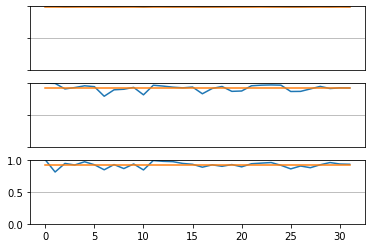

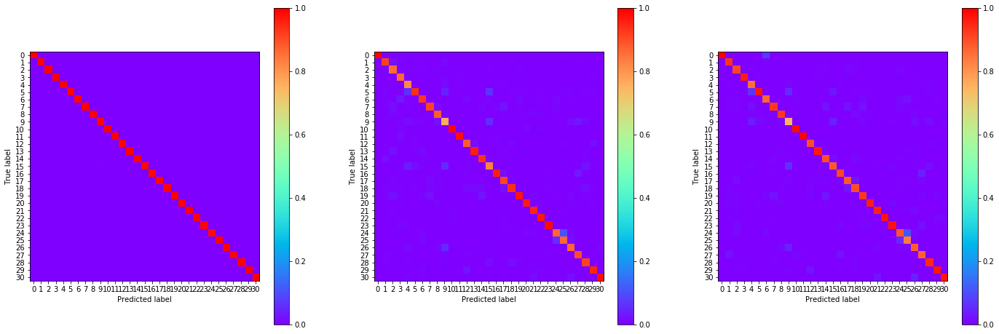

02:24:39.760572
#272 [Train: 0.016] [Test: 0.497] [Valid: 0.485]
#272 [Train: 0.996] [Test: 0.914] [Valid: 0.909]


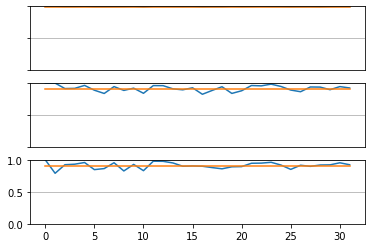

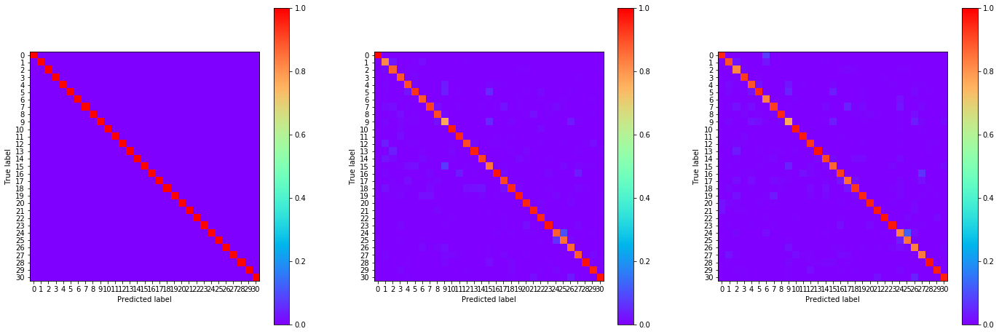

02:25:21.154302
#273 [Train: 0.018] [Test: 0.415] [Valid: 0.418]
#273 [Train: 0.996] [Test: 0.923] [Valid: 0.921]


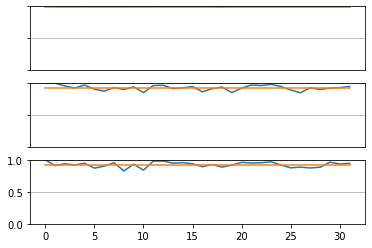

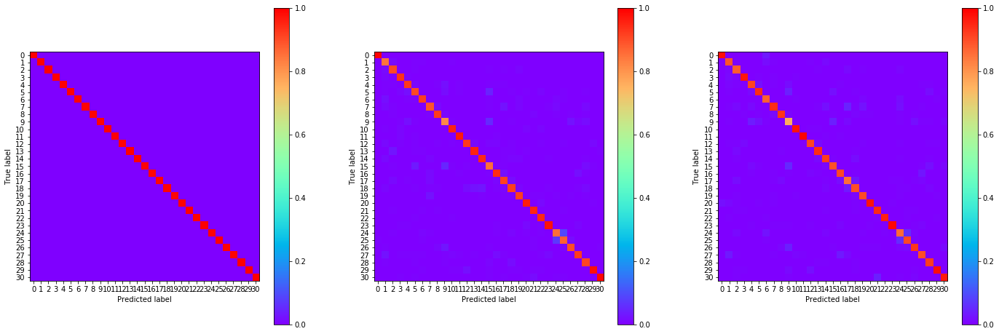

02:26:02.956851
#274 [Train: 0.015] [Test: 0.428] [Valid: 0.421]
#274 [Train: 0.996] [Test: 0.924] [Valid: 0.920]


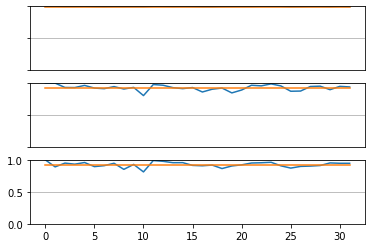

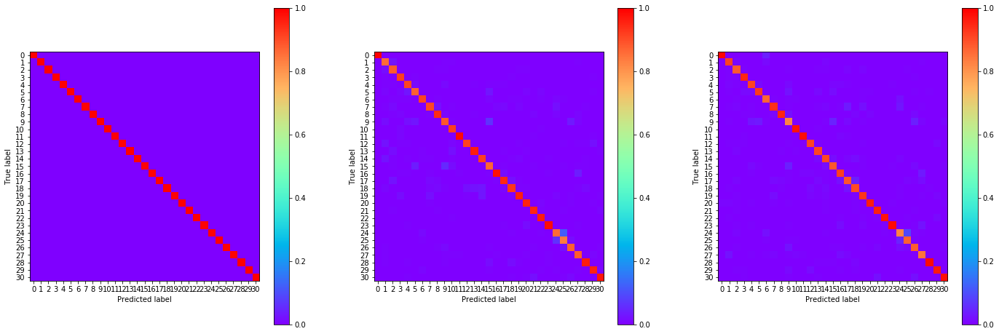

02:26:44.733433
#275 [Train: 0.013] [Test: 0.430] [Valid: 0.462]
#275 [Train: 0.996] [Test: 0.922] [Valid: 0.916]


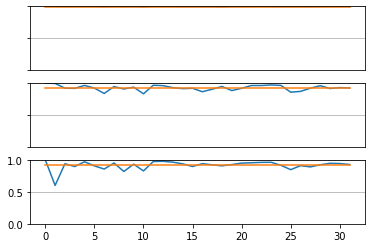

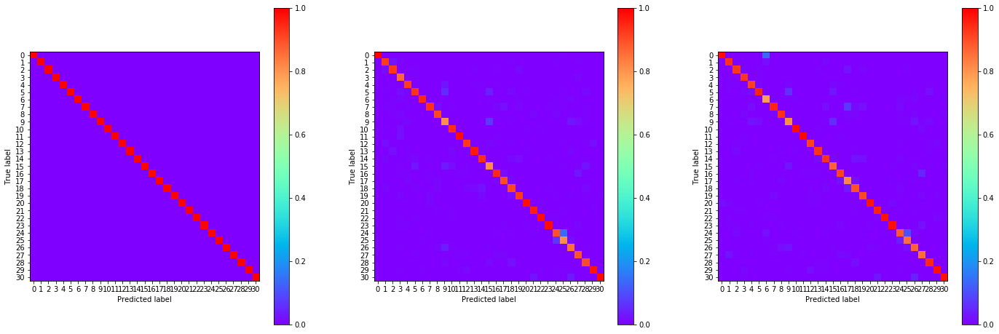

02:27:26.351096
#276 [Train: 0.015] [Test: 0.433] [Valid: 0.428]
#276 [Train: 0.996] [Test: 0.921] [Valid: 0.920]


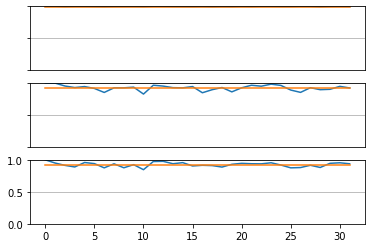

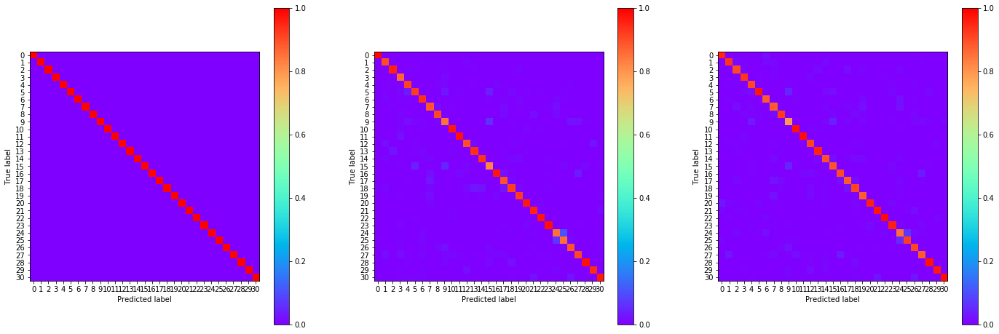

02:28:08.413039
#277 [Train: 0.015] [Test: 0.419] [Valid: 0.451]
#277 [Train: 0.996] [Test: 0.921] [Valid: 0.917]


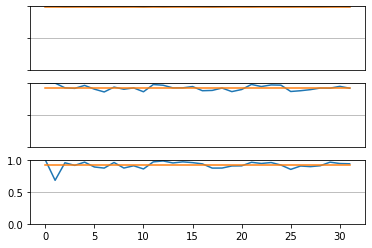

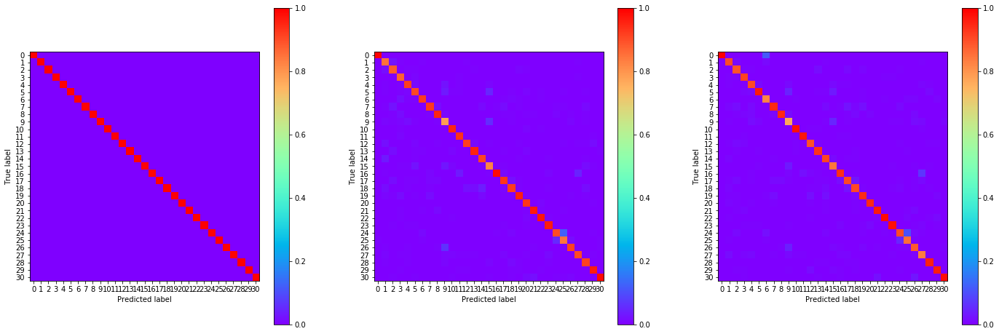

02:28:49.978005
#278 [Train: 0.014] [Test: 0.436] [Valid: 0.450]
#278 [Train: 0.997] [Test: 0.922] [Valid: 0.918]


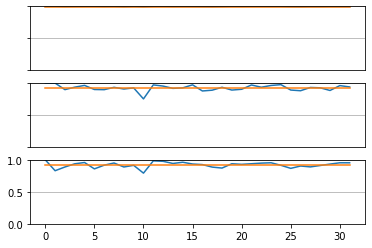

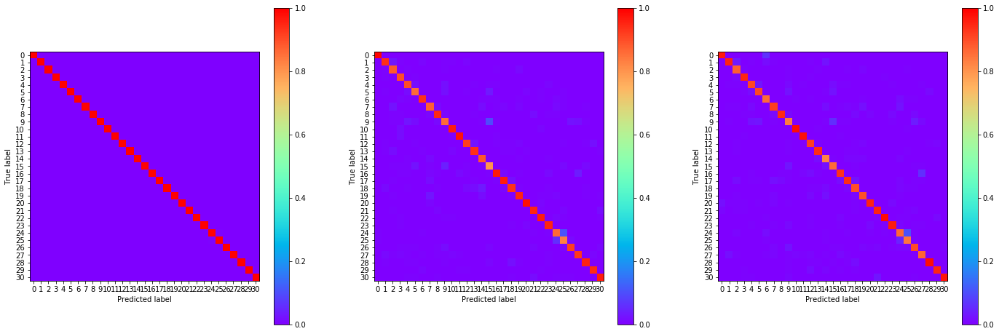

02:29:31.978590
#279 [Train: 0.016] [Test: 0.454] [Valid: 0.447]
#279 [Train: 0.996] [Test: 0.916] [Valid: 0.917]


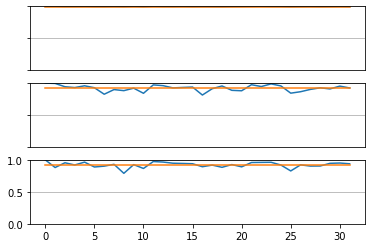

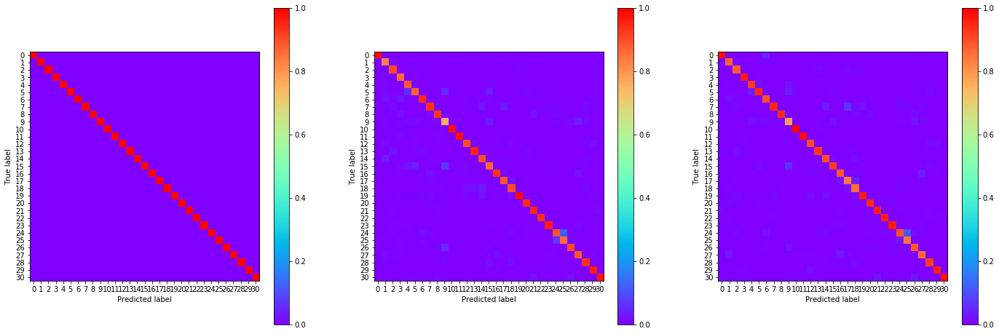

02:30:13.947755
#280 [Train: 0.014] [Test: 0.436] [Valid: 0.434]
#280 [Train: 0.996] [Test: 0.924] [Valid: 0.921]


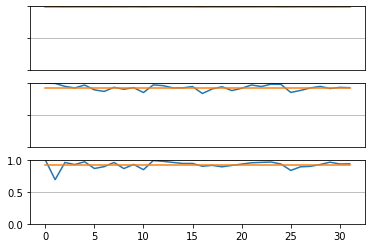

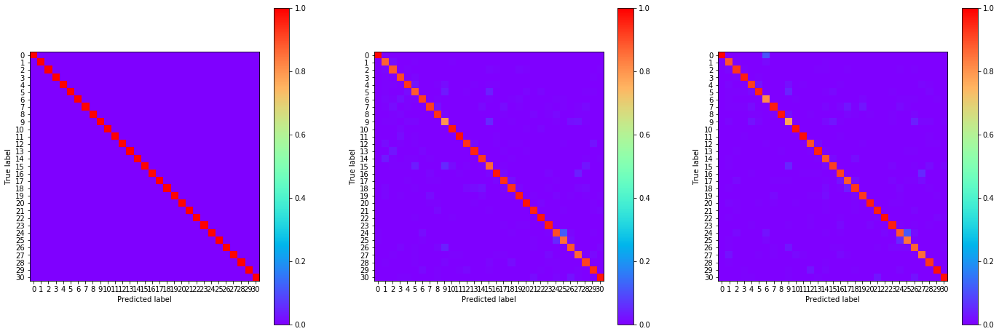

02:30:56.001390
#281 [Train: 0.012] [Test: 0.486] [Valid: 0.434]
#281 [Train: 0.997] [Test: 0.915] [Valid: 0.917]


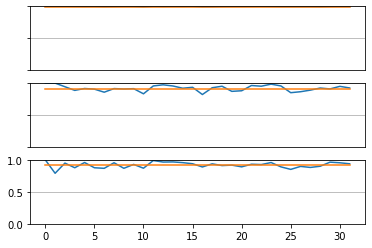

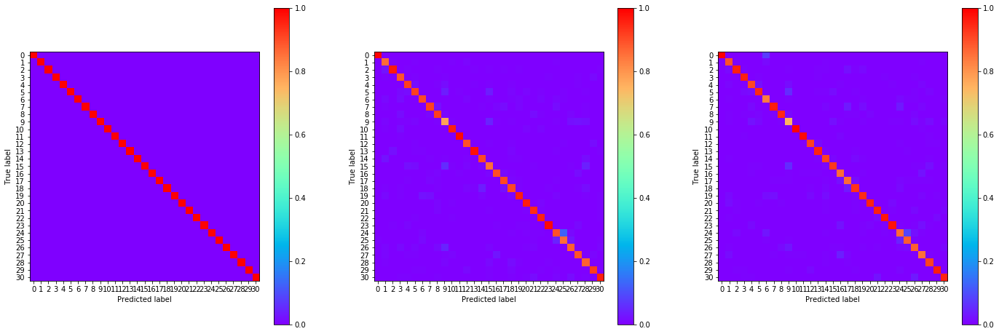

02:31:37.601650
#282 [Train: 0.015] [Test: 0.446] [Valid: 0.459]
#282 [Train: 0.996] [Test: 0.923] [Valid: 0.914]


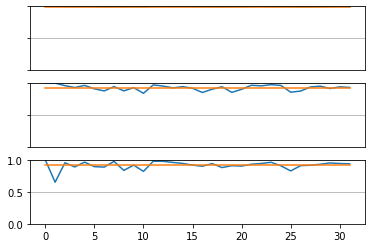

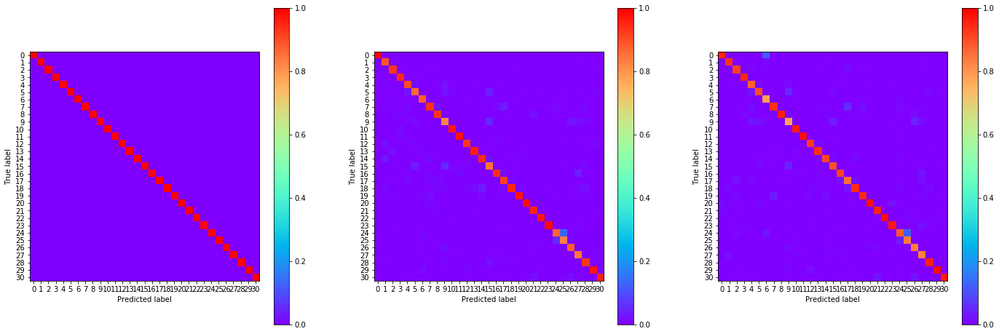

02:32:20.081735
#283 [Train: 0.013] [Test: 0.433] [Valid: 0.454]
#283 [Train: 0.997] [Test: 0.921] [Valid: 0.917]


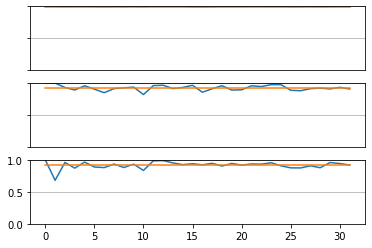

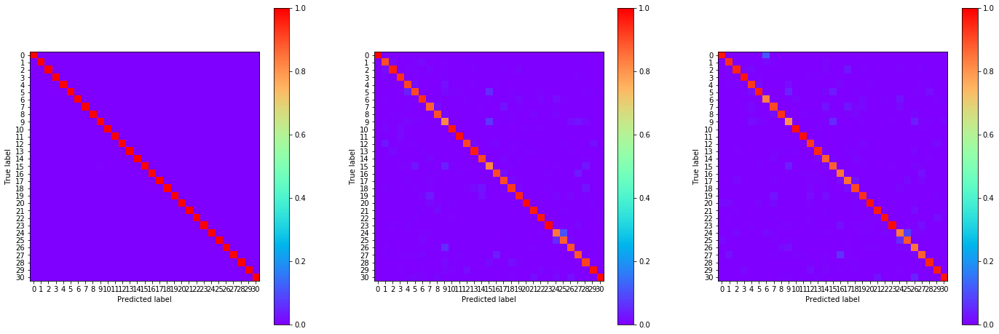

02:33:01.888365
#284 [Train: 0.016] [Test: 0.417] [Valid: 0.430]
#284 [Train: 0.995] [Test: 0.921] [Valid: 0.923]


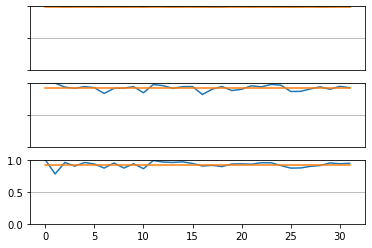

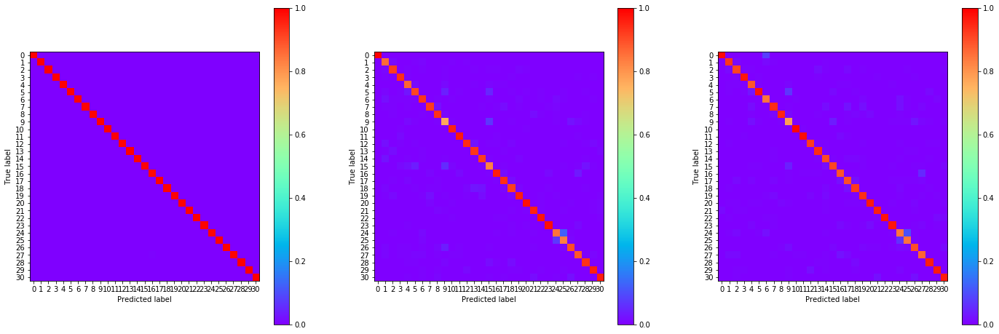

02:33:43.249008
#285 [Train: 0.013] [Test: 0.441] [Valid: 0.457]
#285 [Train: 0.997] [Test: 0.921] [Valid: 0.916]


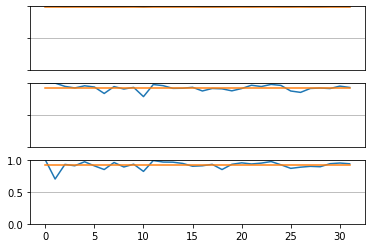

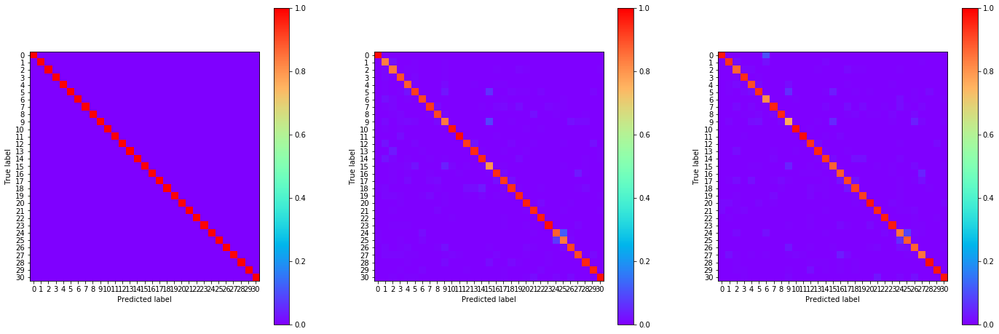

02:34:24.745186
#286 [Train: 0.016] [Test: 0.440] [Valid: 0.448]
#286 [Train: 0.996] [Test: 0.921] [Valid: 0.919]


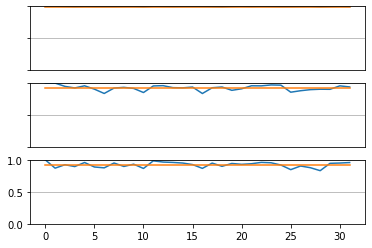

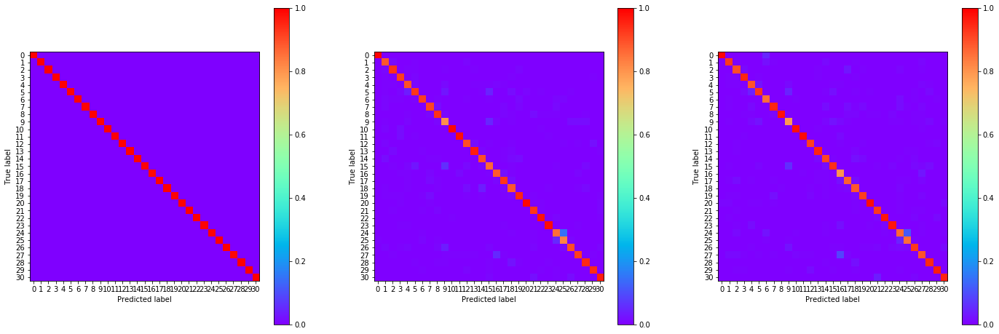

02:35:06.351544
#287 [Train: 0.015] [Test: 0.429] [Valid: 0.435]
#287 [Train: 0.996] [Test: 0.921] [Valid: 0.919]


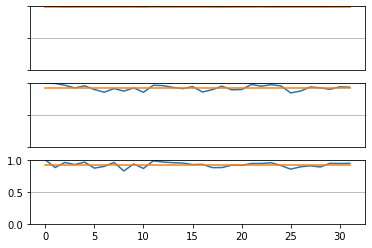

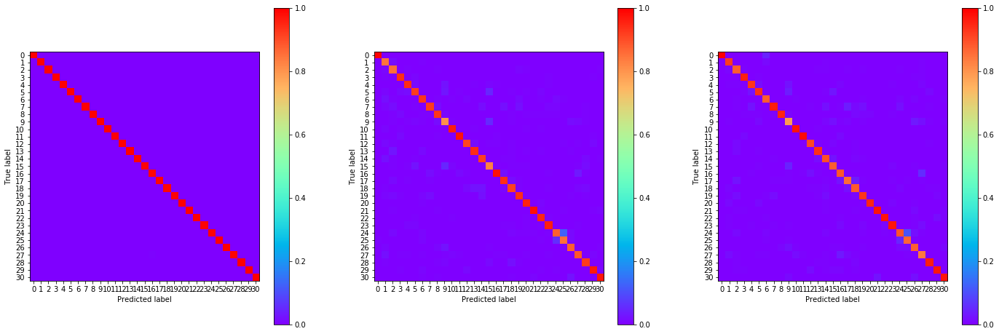

02:35:47.577736
#288 [Train: 0.013] [Test: 0.446] [Valid: 0.434]
#288 [Train: 0.997] [Test: 0.918] [Valid: 0.922]


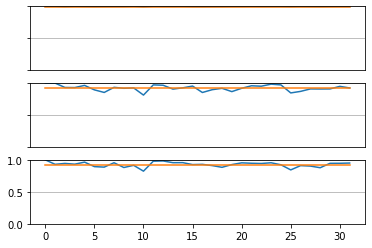

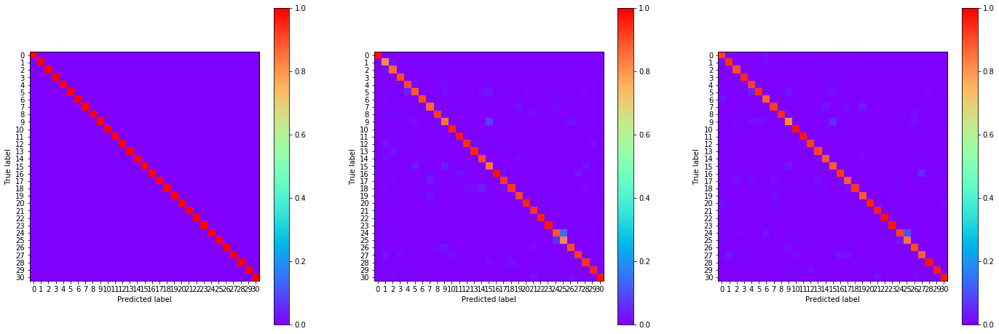

02:36:29.234364
#289 [Train: 0.012] [Test: 0.402] [Valid: 0.426]
#289 [Train: 0.997] [Test: 0.925] [Valid: 0.922]


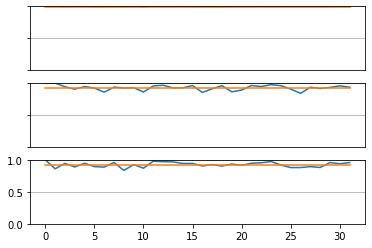

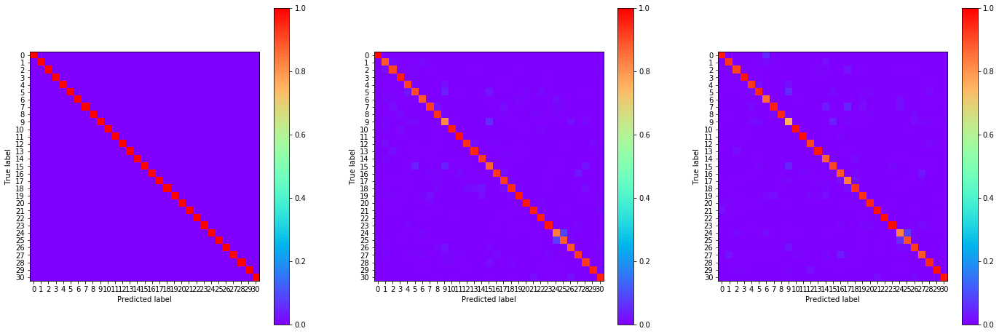

02:37:11.101427
#290 [Train: 0.011] [Test: 0.441] [Valid: 0.452]
#290 [Train: 0.997] [Test: 0.921] [Valid: 0.920]


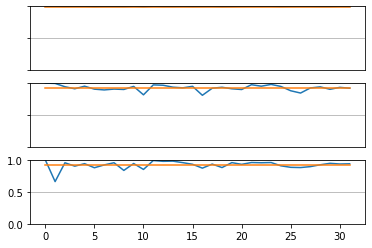

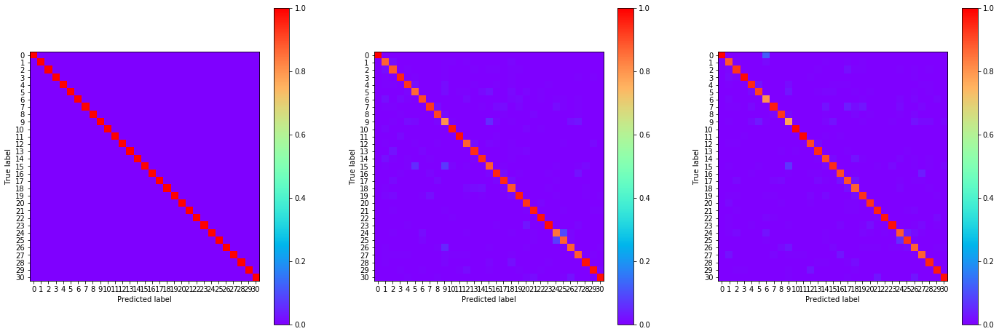

02:37:52.403985
#291 [Train: 0.014] [Test: 0.451] [Valid: 0.450]
#291 [Train: 0.996] [Test: 0.923] [Valid: 0.919]


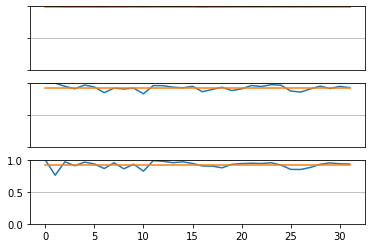

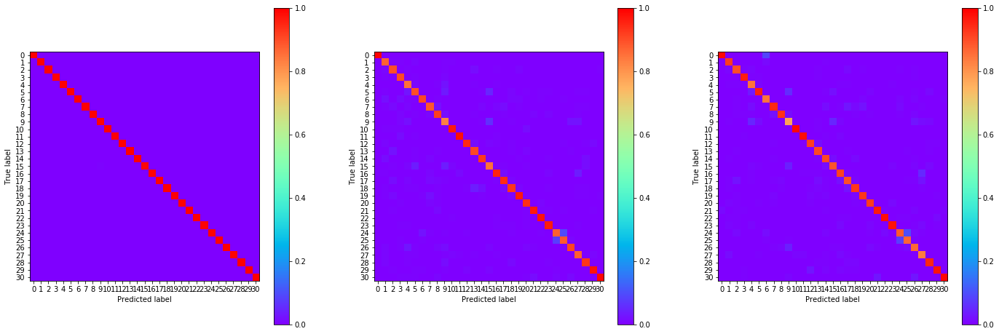

02:38:34.104817
#292 [Train: 0.017] [Test: 0.500] [Valid: 0.468]
#292 [Train: 0.995] [Test: 0.920] [Valid: 0.915]


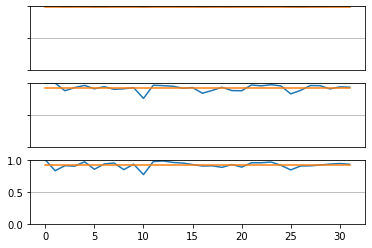

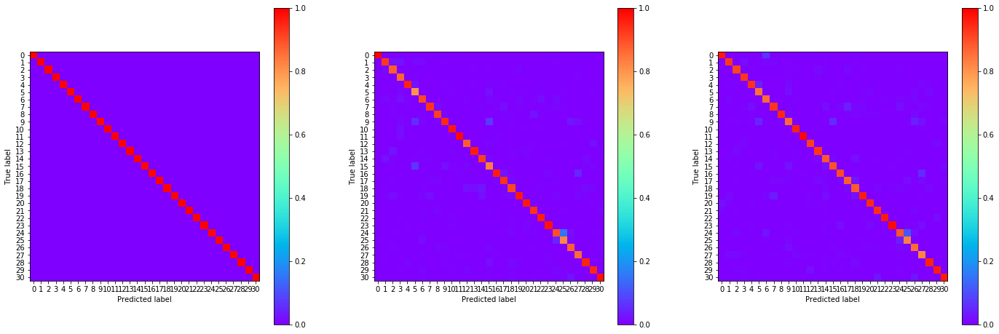

02:39:15.692360
#293 [Train: 0.016] [Test: 0.443] [Valid: 0.447]
#293 [Train: 0.995] [Test: 0.922] [Valid: 0.918]


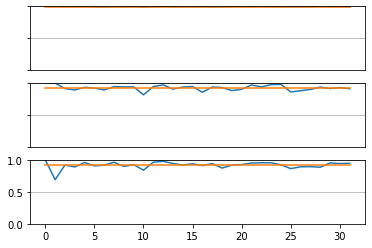

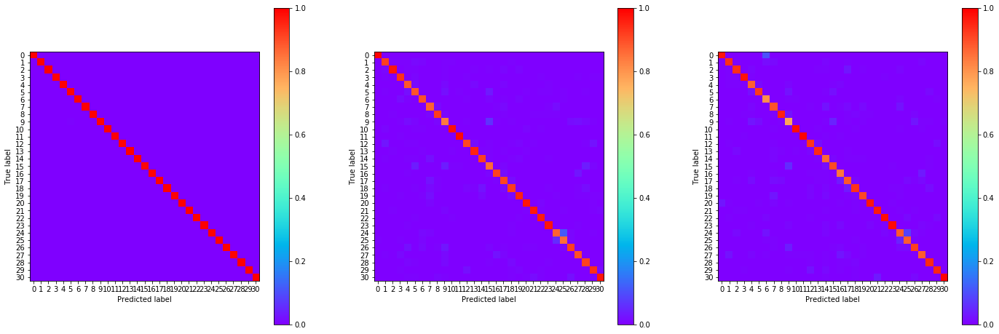

02:39:57.002505
#294 [Train: 0.010] [Test: 0.426] [Valid: 0.423]
#294 [Train: 0.998] [Test: 0.924] [Valid: 0.922]


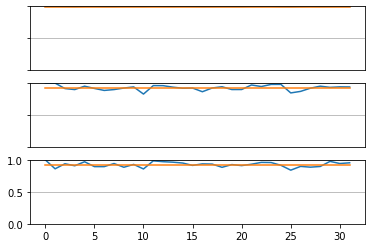

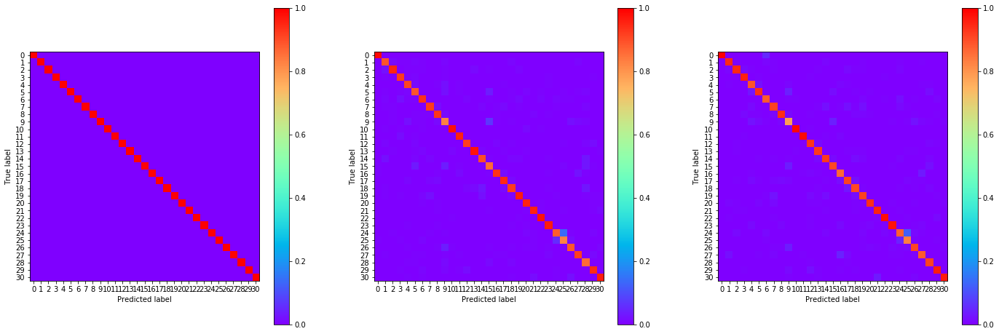

02:40:26.433399
#295 [Train: 0.010] [Test: 0.453] [Valid: 0.441]
#295 [Train: 0.998] [Test: 0.922] [Valid: 0.921]


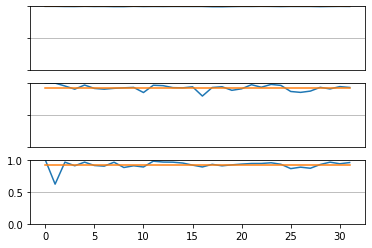

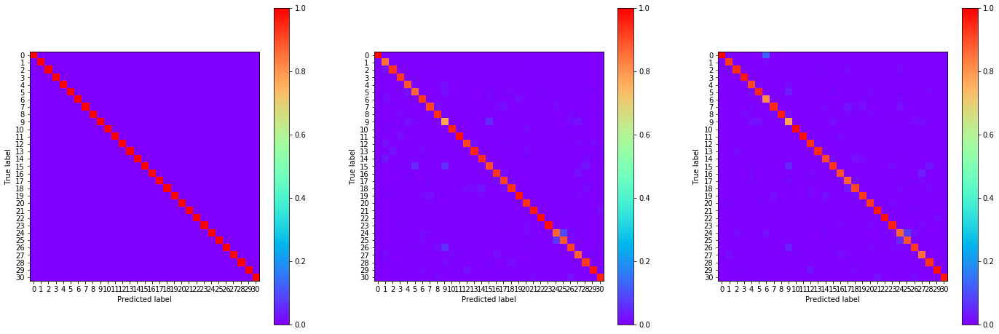

02:40:55.299587
#296 [Train: 0.014] [Test: 0.481] [Valid: 0.451]
#296 [Train: 0.996] [Test: 0.918] [Valid: 0.920]


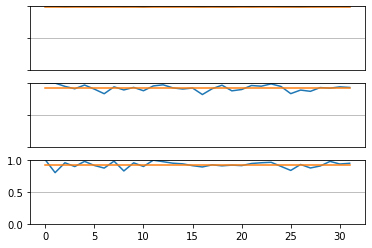

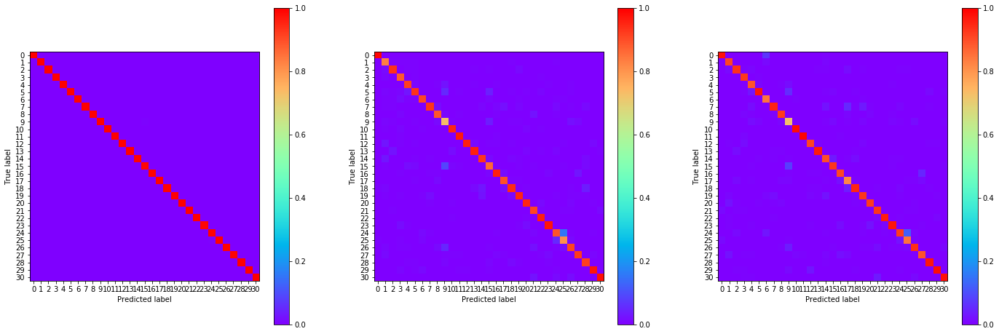

02:41:24.108568
#297 [Train: 0.014] [Test: 0.448] [Valid: 0.495]
#297 [Train: 0.996] [Test: 0.921] [Valid: 0.915]


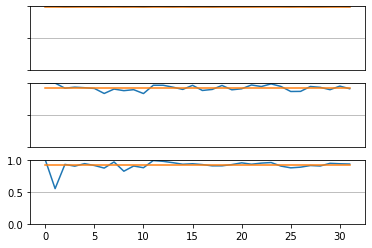

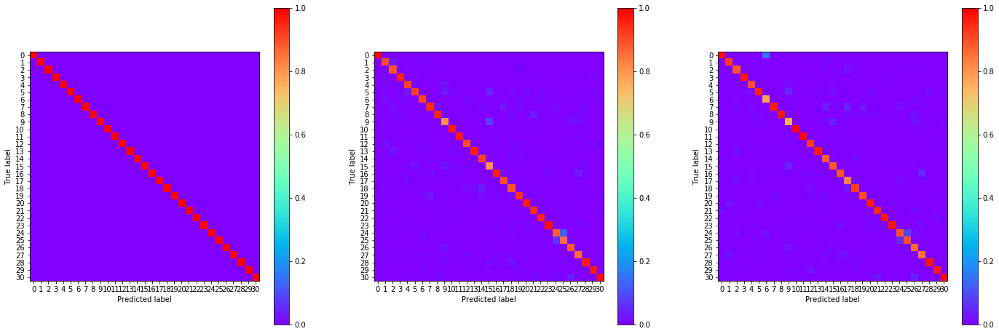

02:41:52.721146
#298 [Train: 0.010] [Test: 0.430] [Valid: 0.490]
#298 [Train: 0.997] [Test: 0.924] [Valid: 0.913]


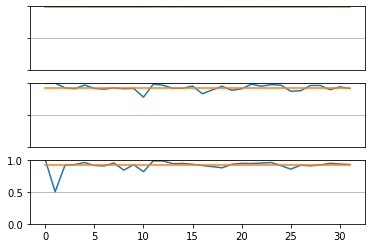

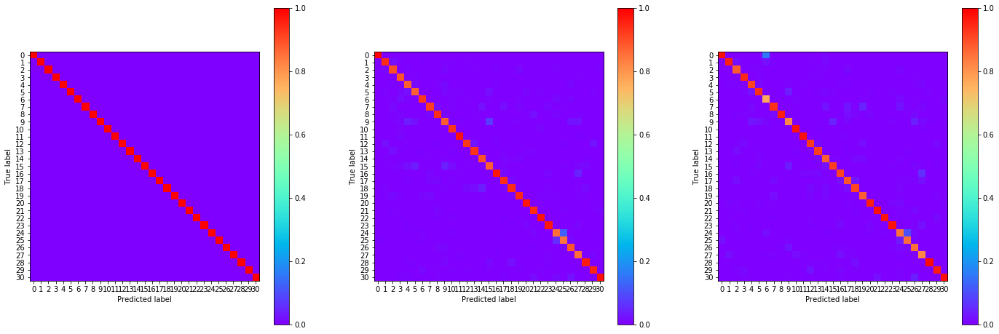

02:42:21.255384
#299 [Train: 0.008] [Test: 0.429] [Valid: 0.457]
#299 [Train: 0.998] [Test: 0.928] [Valid: 0.920]


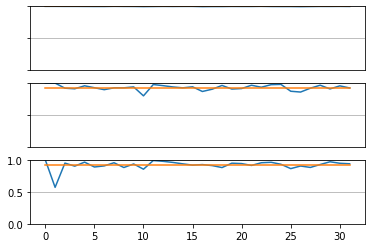

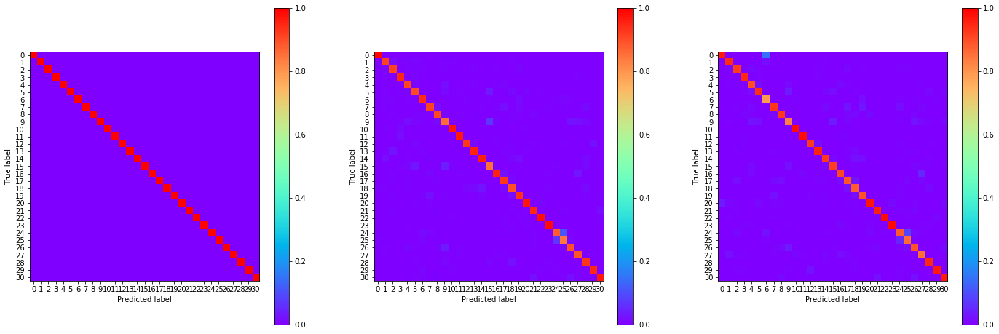

In [20]:
MAX_EPOCH = 300

writer = SummaryWriter(log_dir=run_name)

for epoch in range(MAX_EPOCH):
    training_loss_list = list()
    batch_generator = dataset_loader_training.batch_generator()
    model.train()
    
    correct_num = 0
    total_num = 0
    
#     result_matrix_train = np.zeros([31, 2])
    result_matrix_train = np.zeros([32, 2])
    result_matrix_train[0, :] = [1, 1]
    y_pred_train = list()
    y_true_train = list()

    for (batch, label) in batch_generator:
        optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
        loss.backward()
        training_loss_list.append(loss.item())
        optimizer.step()
        
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_train += list(label)
        y_pred_train += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_train[label, 0] += 1
            if result:
                result_matrix_train[label, 1] += 1
        
    acc_train = correct_num / total_num

    testing_loss_list = list()

    batch_generator = dataset_loader_testing.batch_generator()

    model.eval()
    
    correct_num = 0
    total_num = 0
    
#   result_matrix_test = np.zeros([31, 2])
    result_matrix_test = np.zeros([32, 2])
    result_matrix_test[0, :] = [1, 1]
    y_pred_test = list()
    y_true_test = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label).to(device))
#         loss.backward()
        testing_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_test += list(label)
        y_pred_test += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_test[label, 0] += 1
            if result:
                result_matrix_test[label, 1] += 1
        
    acc_test = correct_num / total_num

    validation_loss_list = list()

    batch_generator = dataset_loader_validation.batch_generator()
    
    correct_num = 0
    total_num = 0
    
#     result_matrix_eval = np.zeros([31, 2])
    result_matrix_eval = np.zeros([32, 2])
    result_matrix_eval[0, :] = [1, 1]
    y_pred_eval = list()
    y_true_eval = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
#         loss.backward()
        validation_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_eval += list(label)
        y_pred_eval += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_eval[label, 0] += 1
            if result:
                result_matrix_eval[label, 1] += 1
        
    acc_valid = correct_num / total_num
    
    training_loss_mean = np.mean(training_loss_list)
    testing_loss_mean = np.mean(testing_loss_list)
    validation_loss_mean = np.mean(validation_loss_list)
    
    print(datetime.datetime.now().time())
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, training_loss_mean, testing_loss_mean, validation_loss_mean))
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, acc_train, acc_test, acc_valid))
    
#     print(result_matrix_train)
#     print(result_matrix_test)
#     print(result_matrix_eval)
    
    fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True)
    axes[0].plot(result_matrix_train[:, 1] / result_matrix_train[:, 0])
    axes[0].plot(np.ones(len(result_matrix_train)) * acc_train)
    axes[0].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[0].set_ylim([0, 1])
    axes[0].yaxis.grid(True)
                 
    axes[1].plot(result_matrix_test[:, 1] / result_matrix_test[:, 0])
    axes[1].plot(np.ones(len(result_matrix_test)) * acc_test)
    axes[1].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[1].set_ylim([0, 1])
    axes[1].yaxis.grid(True)
                 
    axes[2].plot(result_matrix_eval[:, 1] / result_matrix_eval[:, 0])
    axes[2].plot(np.ones(len(result_matrix_eval)) * acc_valid)
    axes[2].set_ylim([0, 1])
    axes[2].yaxis.grid(True)
    plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))
    cm = confusion_matrix(y_true_train, y_pred_train, normalize='pred')
#     axes[0].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[0], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[0].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_test, y_pred_test, normalize='pred')
#     axes[1].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[1], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[1].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_eval, y_pred_eval, normalize='pred')
#     im = axes[2].imshow(cm)
#     plt.colorbar(im)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[2], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[2].get_images():
        im.set_clim(0, 1)
    
    plt.show()
    
    writer.add_scalar('Loss/Train', training_loss_mean, epoch)
    writer.add_scalar('Loss/Test', testing_loss_mean, epoch)
    writer.add_scalar('Loss/Valid', validation_loss_mean, epoch)
    writer.add_scalar('Acc/Train', acc_train, epoch)
    writer.add_scalar('Acc/Test', acc_test, epoch)
    writer.add_scalar('Acc/Valid', acc_valid, epoch)
    

In [21]:
# output = model(torch.cuda.FloatTensor(batch))

In [22]:
# output.shape

In [23]:
# torch.tensor(batch).unsqueeze_(1).shape

In [24]:
# input_tensor = torch.tensor(batch).to(device).float()
# input_tensor = input_tensor.transpose(1, 2)
# model(input_tensor).shape

In [25]:
# for batch, label_list in batch_generator:
#     print(batch.shape[0])
#     plt.figure(figsize=(5, 1))
#     plt.plot(label_list)
#     plt.show()
    
#     plt.figure(figsize=(6, 18))
# #     plt.imshow(batch[0], aspect='auto')
#     plt.imshow(batch[0])
#     plt.show()
    
#     break